In [2]:
%load_ext autoreload
%autoreload 2

In [19]:
import os
from os.path import join
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["axes.grid"] = False
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

In [3]:
import torch
from neural_data_loading import load_data, rootdir, datadir

neural_mat, lastlicksId_mat, firstboutId_mat = load_data()
# lick_mat = lastlicksId_mat
lick_mat = lastlicksId_mat & firstboutId_mat
neuron_mean = neural_mat.mean(axis=(0, 2))
neuron_std = neural_mat.std(axis=(0, 2))
# normalize
neural_tsr_zscore = ((neural_mat.astype("float32") - neural_mat.mean(axis=(0, 2), keepdims=True))
                     / neural_mat.std(axis=(0, 2), keepdims=True))
device = "cpu"
neural_tsr_zscore_th = torch.from_numpy(neural_tsr_zscore).float().to(device)
lick_mat_th = torch.from_numpy(lick_mat[0]).long().to(device)

Loading data from /n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Data
['firstLickBoutIdentity_5msBin_41Bins_20_1_20.mat', 'trialIdentity_5msBin_41Bins_20_1_20.mat', 'lastLickIdentity_5msBin_41Bins_20_1_20.mat', '20220825-Shijia-M012-D29-4-50-L-PCRt_g0_XYMatrixForGLM_beforeQC_allLickBouts_5msbin.csv', 'rewardIdentity_5msBin_41Bins_20_1_20.mat', 'allLicksNeural_5msBin_41Bins_20_1_20.mat', 'omissionIdentity_5msBin_41Bins_20_1_20.mat', 'readme_20231229_allBouts.txt']
Neural data (4728, 385, 41)
Last lick Id (1, 4728)
First bout Id (1, 4728)


In [16]:
# figdir = "/Users/binxuwang/Dropbox/LastLickClosedLoop/LastLickData/XGBoostClassifier"
outdir = join(rootdir, "Figures") #"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/SabatiniShijiaLickingClassifier/Figures"
figdir = join(rootdir, "Figures")
os.makedirs(outdir, exist_ok=True)
seed = 41
test_size = 0.2

In [8]:
seed = 41
test_size = 0.2
neural_mat_zscore = neural_tsr_zscore.reshape(neural_tsr_zscore.shape[0], -1)
y_mat = lick_mat[0]
X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                        y_mat, test_size=test_size, random_state=seed)

### Example XGBoost Classification

In [10]:
# fit model no training data
model = XGBClassifier(booster="gblinear",
                      objective="binary:logistic",
                      eval_metric="logloss",
                      use_label_encoder=False,
                      device="cpu", )
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gblinear', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [12]:
# fit model no training data
model = XGBClassifier(booster="gblinear",
                      objective="binary:logistic",
                      eval_metric="logloss",
                      use_label_encoder=False,
                      device="cuda", )
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster='gblinear', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cuda', early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

Some information about the model
* [`gblinear` model](https://medium.com/data-design/understanding-a-bit-xgboosts-generalized-linear-model-gblinear-bc1354187dfe) ~ regularized linear model + coordinate descent optimization. 
* [Comparing `gblinear` with LinearRegression in sklearn](https://stats.stackexchange.com/questions/448879/difference-in-regression-coefficients-of-sklearns-linearregression-and-xgbregre)

Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.419 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[860  18]
 [ 55  13]]


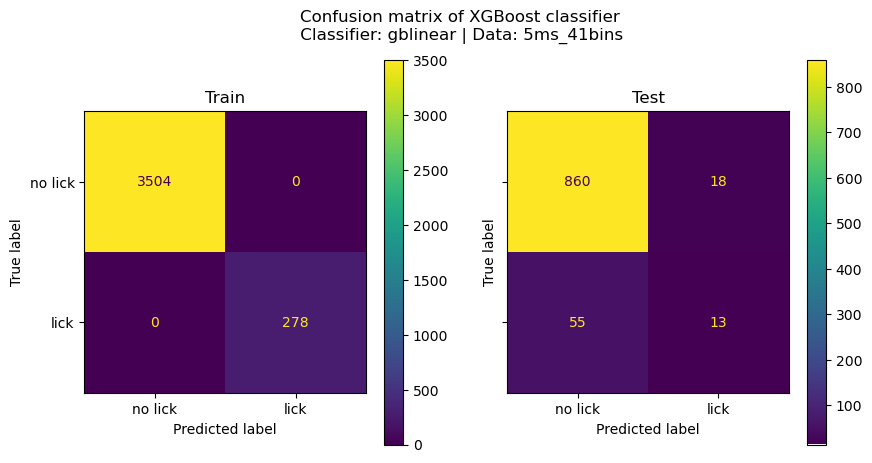

In [14]:
model_str = "gblinear"
data_str = "5ms_41bins"

# make predictions for test data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
# evaluate predictions
acc_train = accuracy_score(y_train, y_train_pred)
acc_test  = accuracy_score(y_test, y_test_pred)
cm_train = confusion_matrix(y_train, y_train_pred)
cm_test  = confusion_matrix(y_test, y_test_pred)
print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
      f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
      f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
print("train_confmat\n", cm_train)
print("test_confmat\n", cm_test)
figh, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["no lick", "lick"])
disp.plot(ax=axs[0])
axs[0].set_title("Train")
disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["no lick", "lick"])
disp.plot(ax=axs[1])
axs[1].set_title("Test") 
plt.suptitle(f"Confusion matrix of XGBoost classifier\n Classifier: {model_str} | Data: {data_str}")
plt.show()

We are going to iterate through different time bins and duration of neural data to see which part predict the licking behavior the best.

## Tree based model (`gbtree`)

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 68   0]]


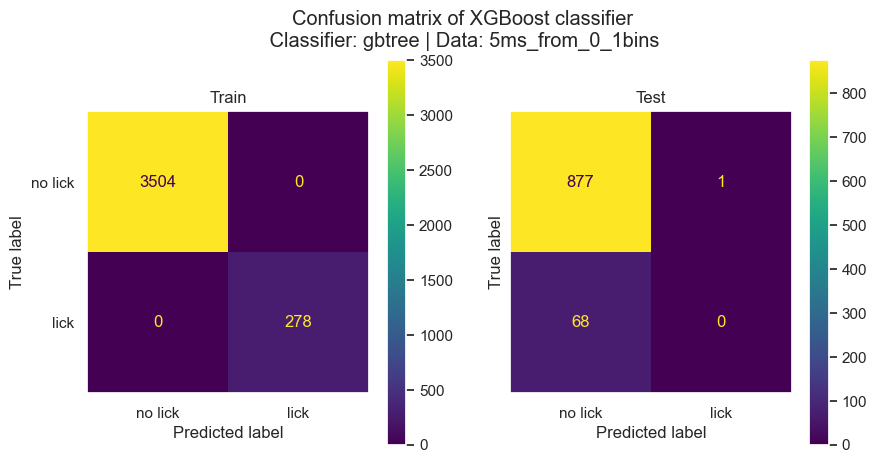

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 68   0]]


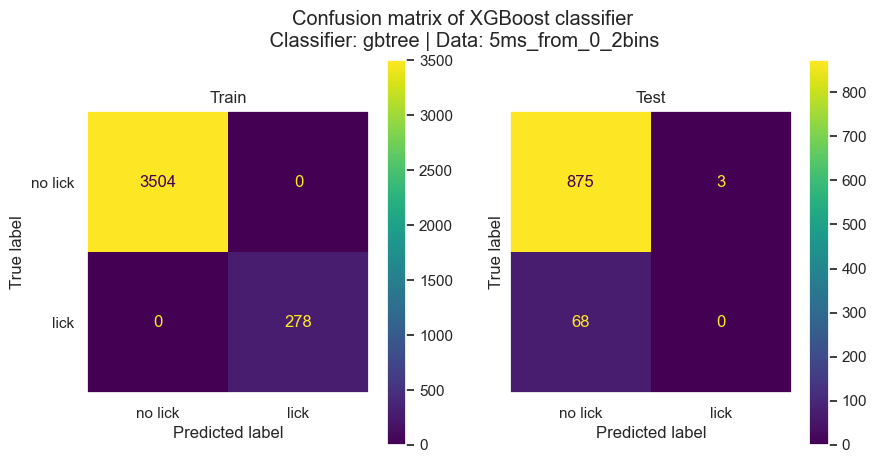

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 67   1]]


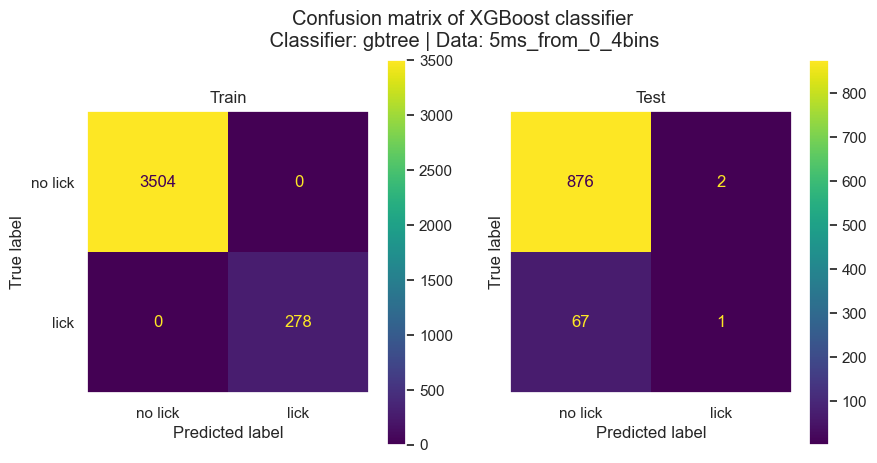

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 66   2]]


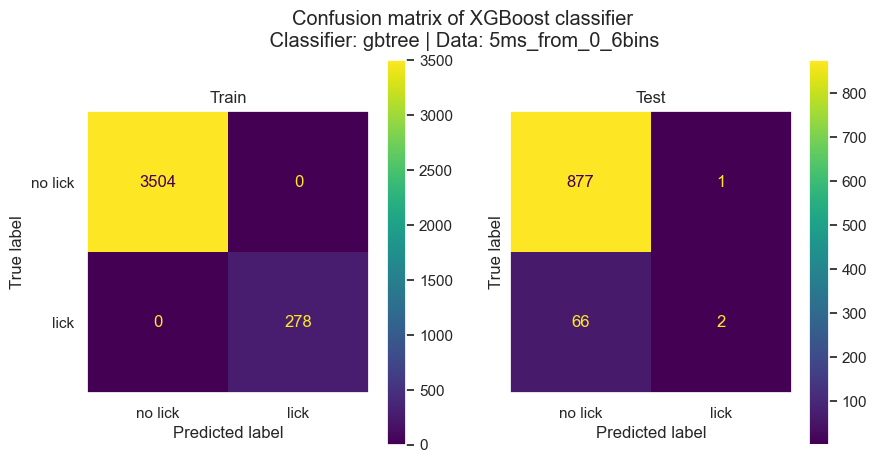

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 66   2]]


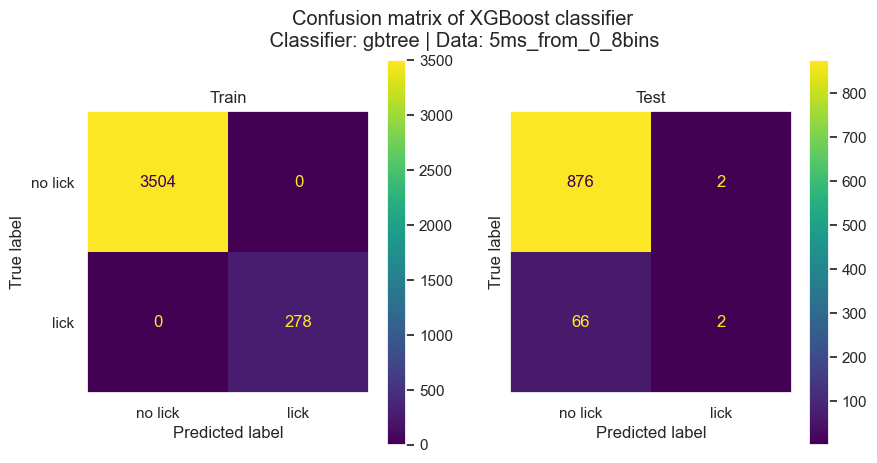

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.750 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 65   3]]


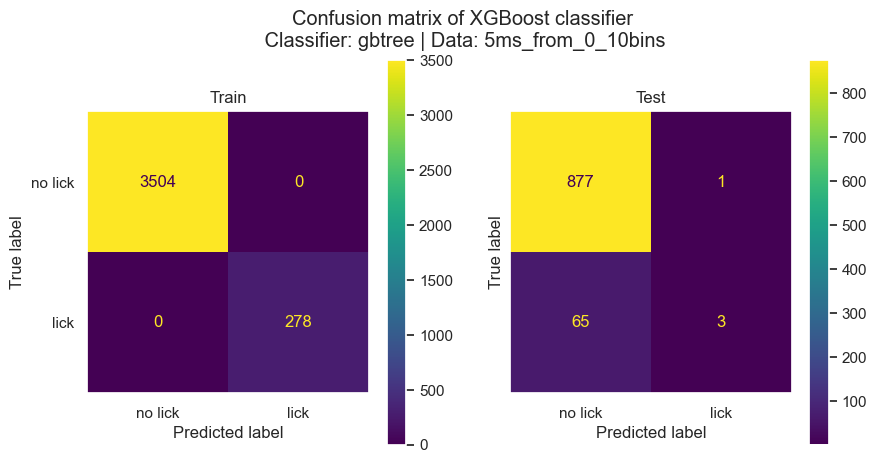

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.429 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 65   3]]


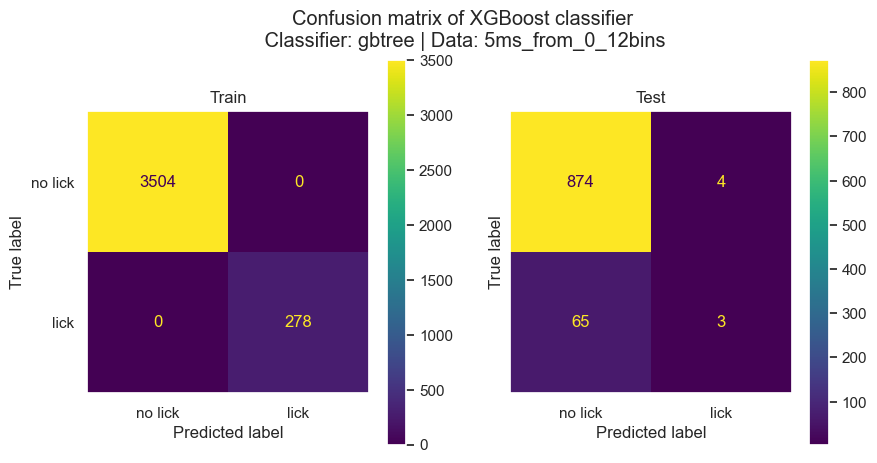

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.600 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 65   3]]


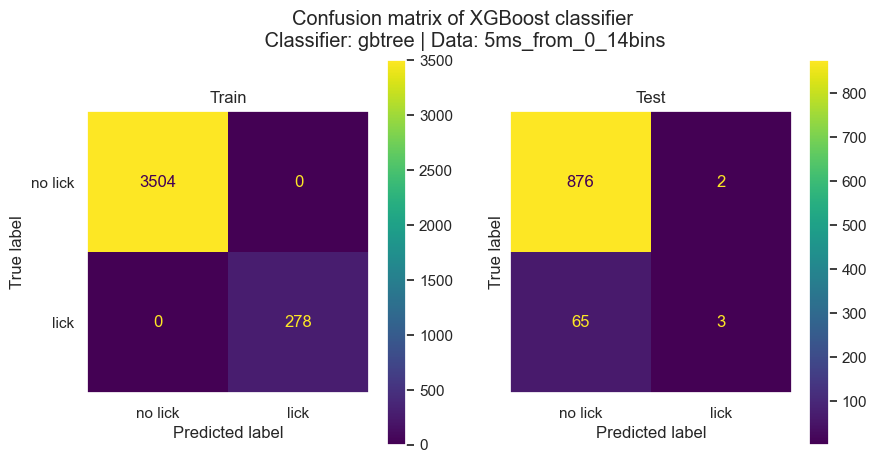

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.600 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 62   6]]


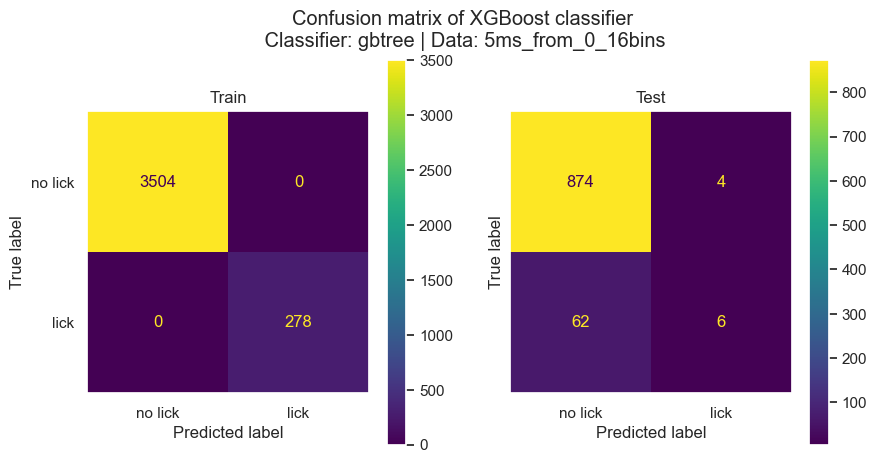

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.727 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 60   8]]


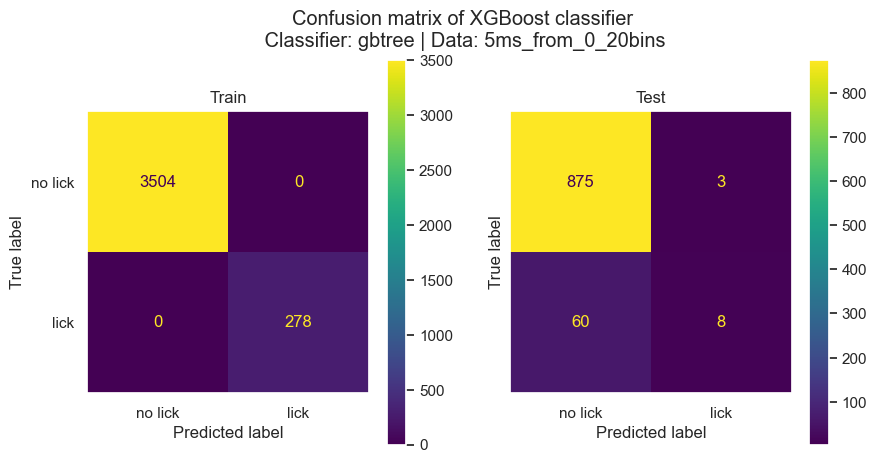

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.778 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 61   7]]


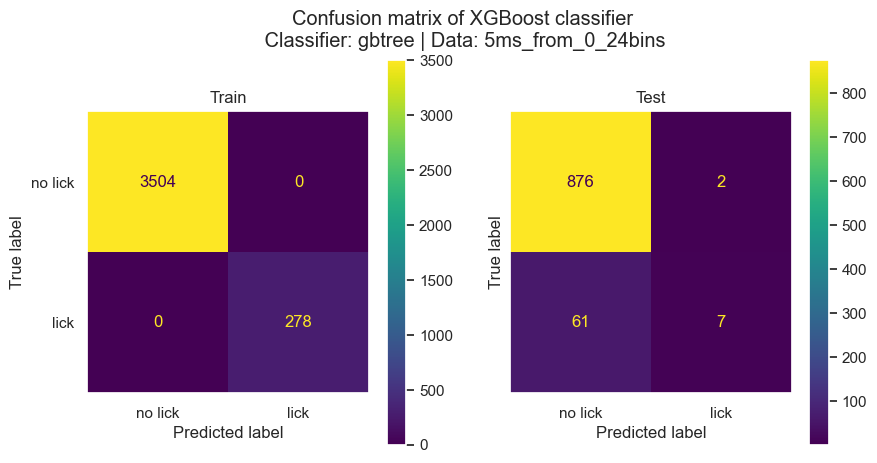

Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.833 
TP / (TP + FN): train: 1.000 test: 0.147 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 58  10]]


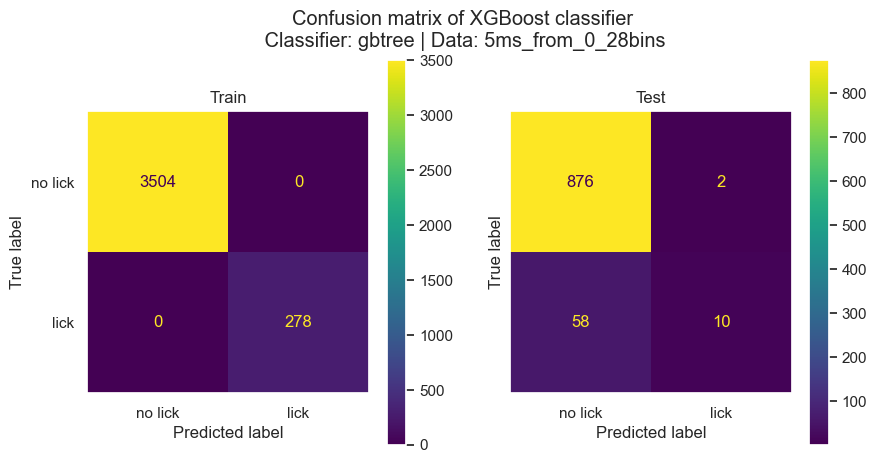

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.700 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 61   7]]


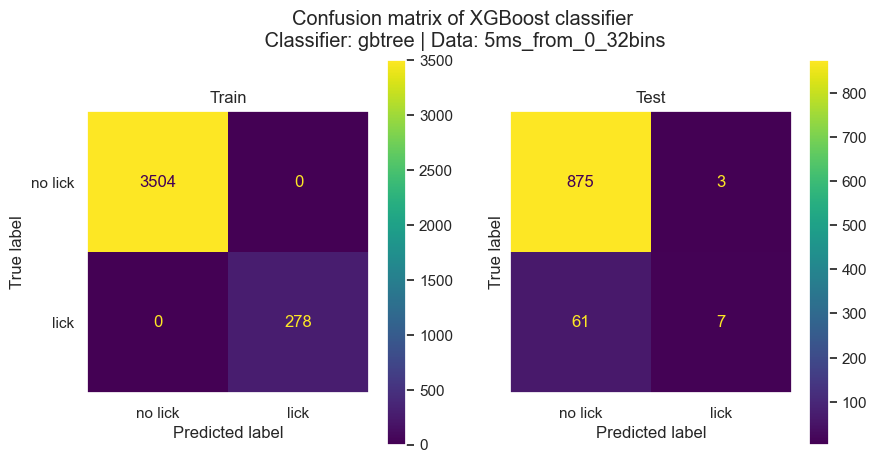

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.625 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 63   5]]


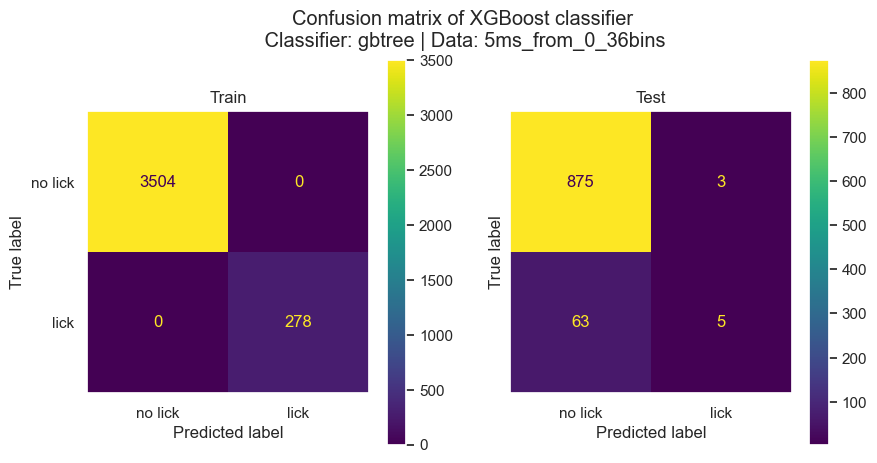

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.611 
TP / (TP + FN): train: 1.000 test: 0.162 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 57  11]]


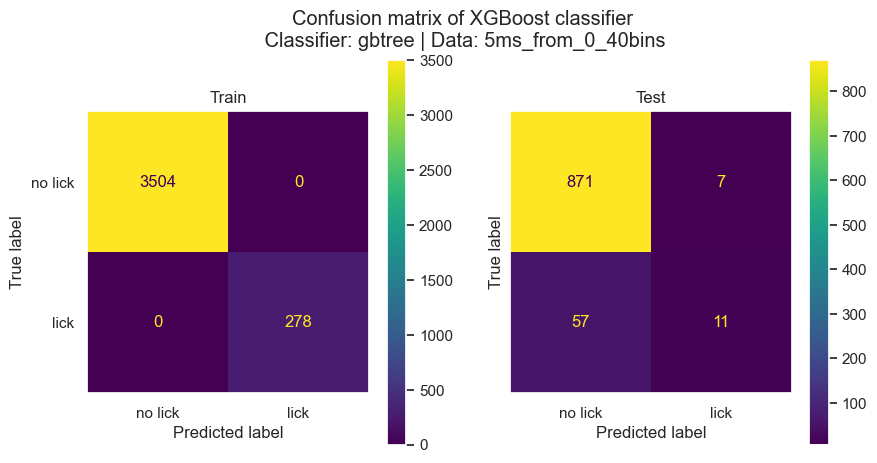

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 66   2]]


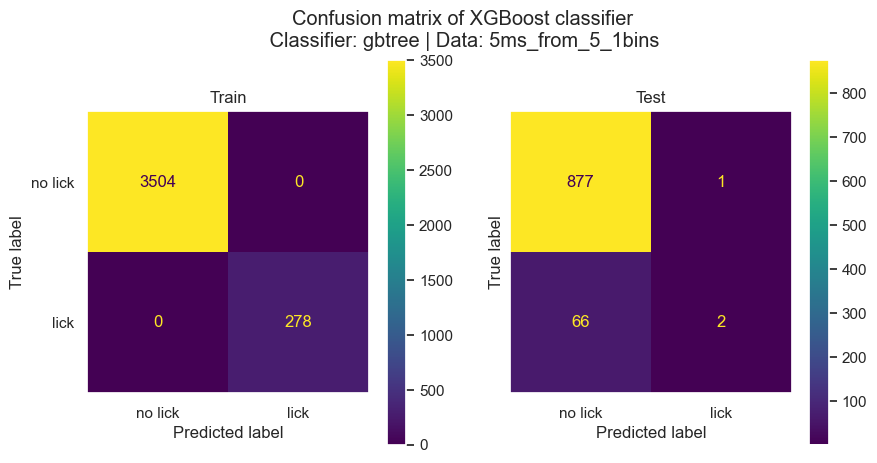

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 66   2]]


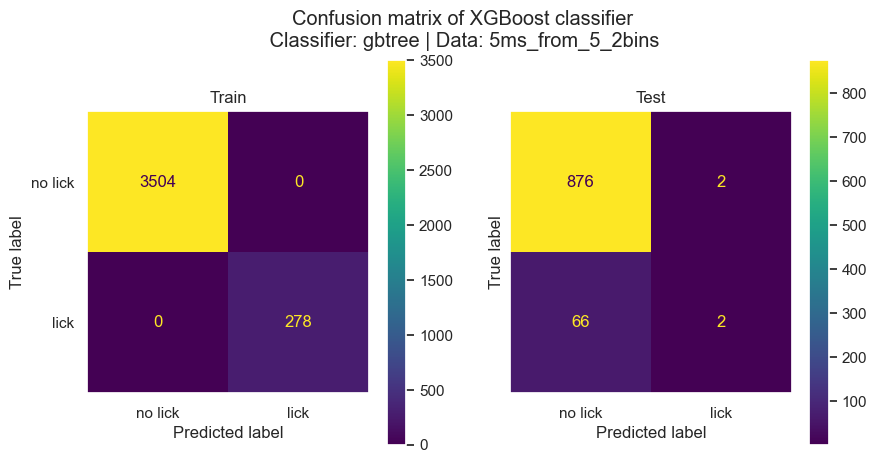

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 1.000 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[878   0]
 [ 66   2]]


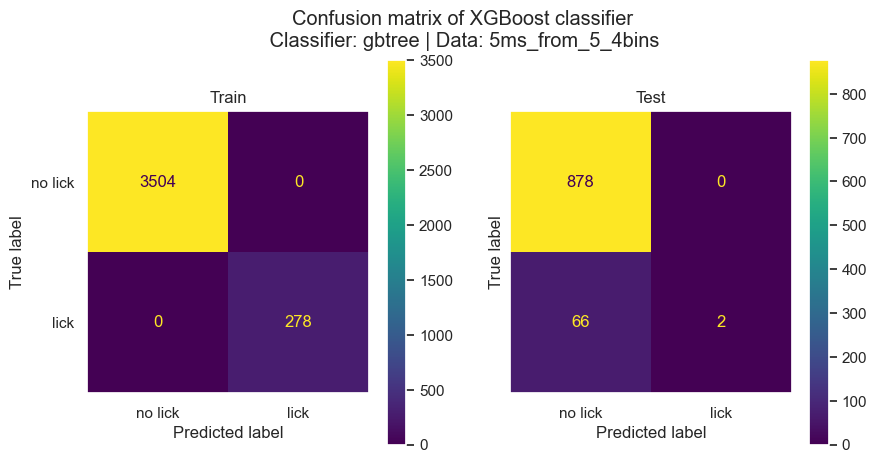

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 66   2]]


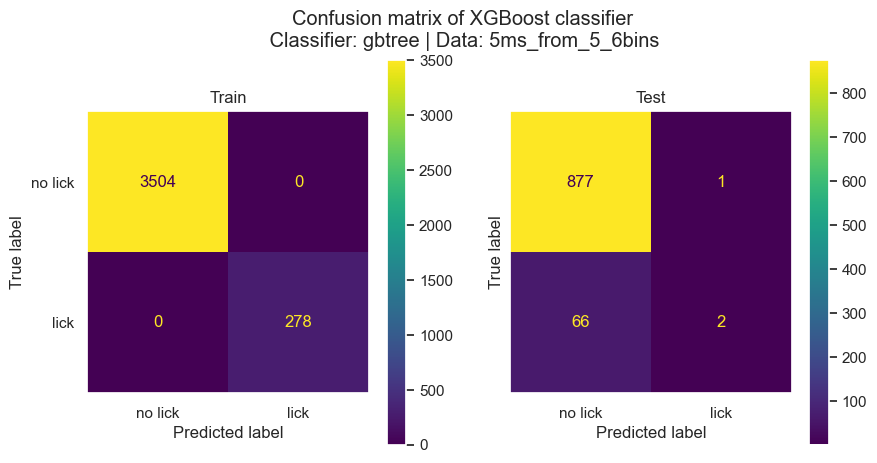

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.857 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 62   6]]


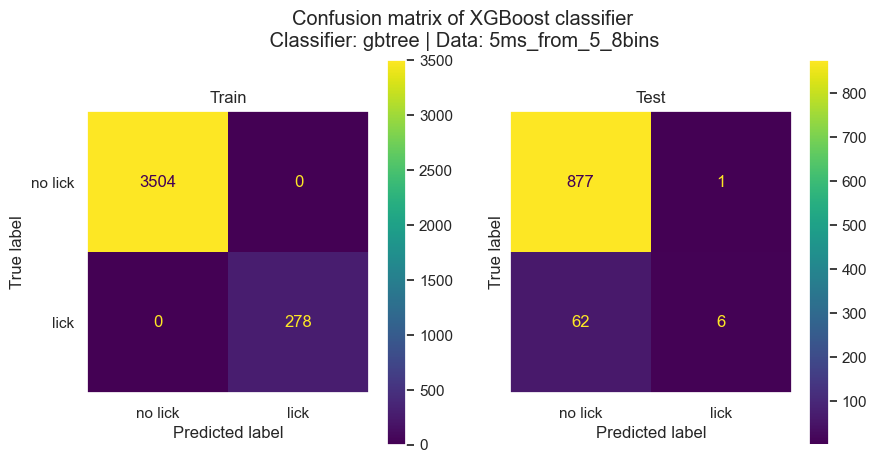

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.833 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 63   5]]


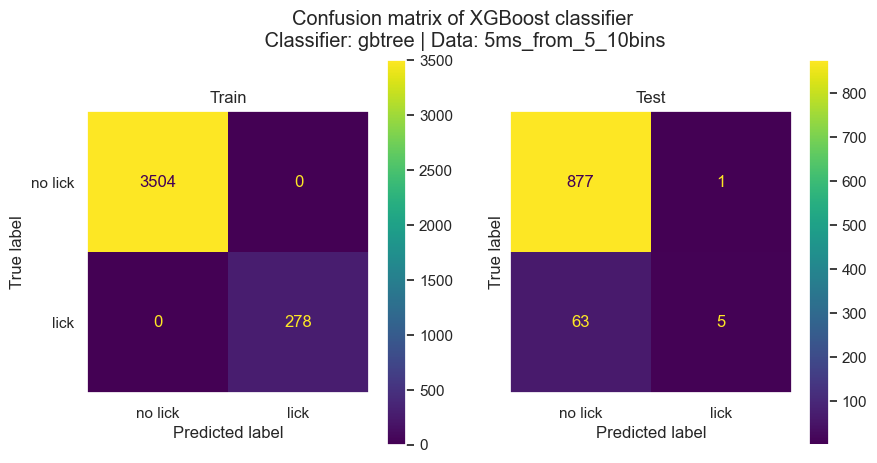

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 62   6]]


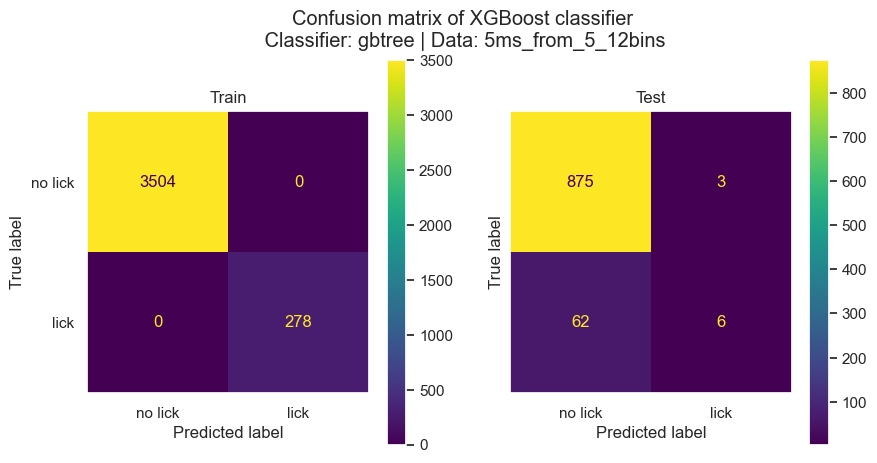

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.889 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 60   8]]


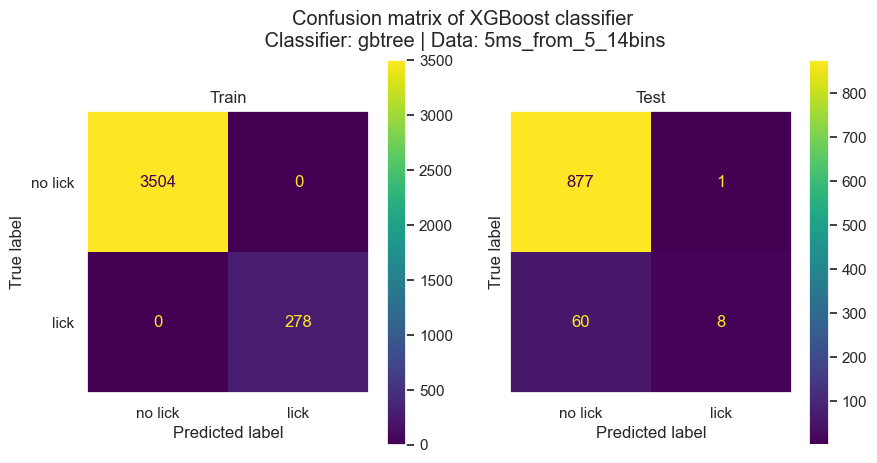

Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.917 
TP / (TP + FN): train: 1.000 test: 0.162 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 57  11]]


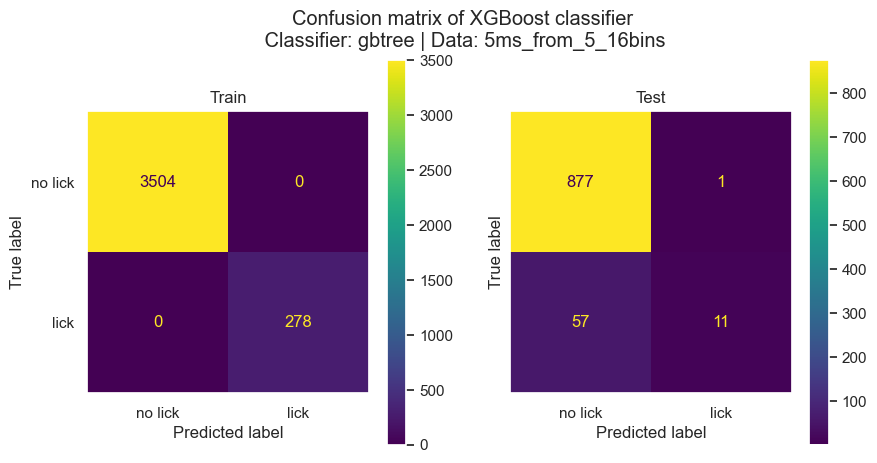

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.778 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 61   7]]


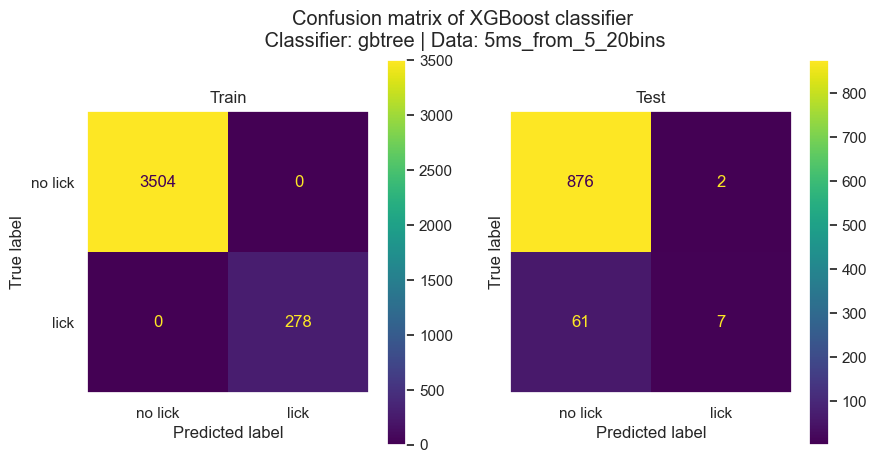

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.727 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 60   8]]


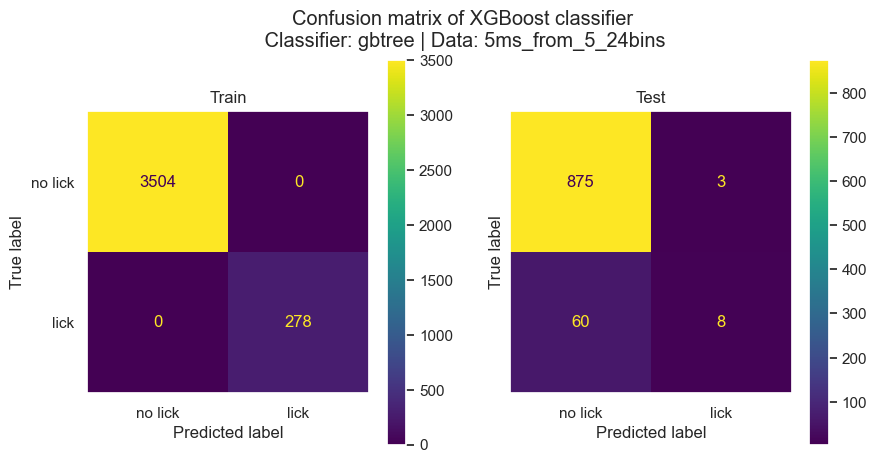

Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.786 
TP / (TP + FN): train: 1.000 test: 0.162 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 57  11]]


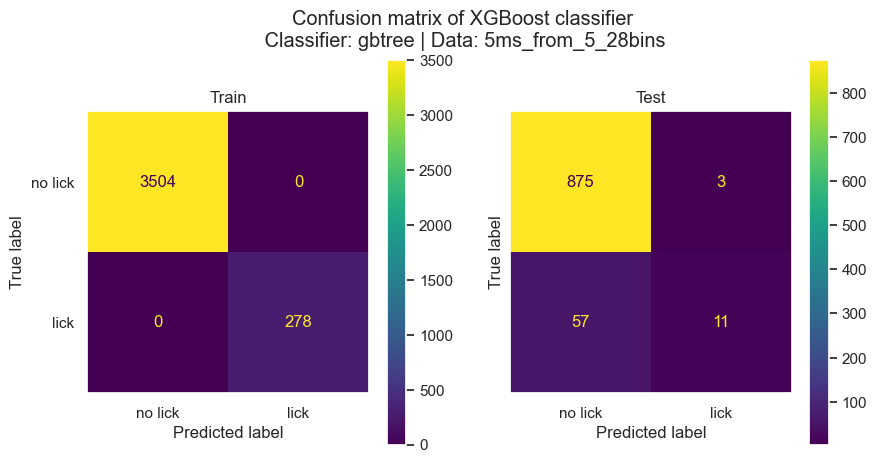

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.857 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 62   6]]


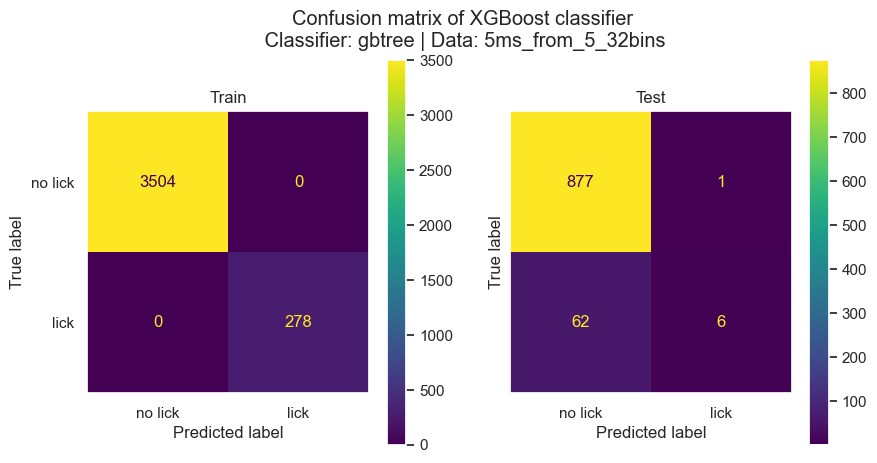

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.583 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 61   7]]


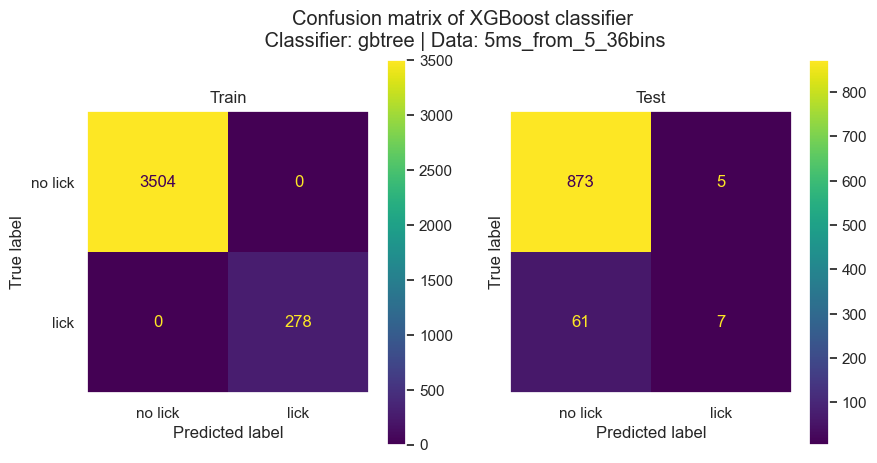

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.583 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 61   7]]


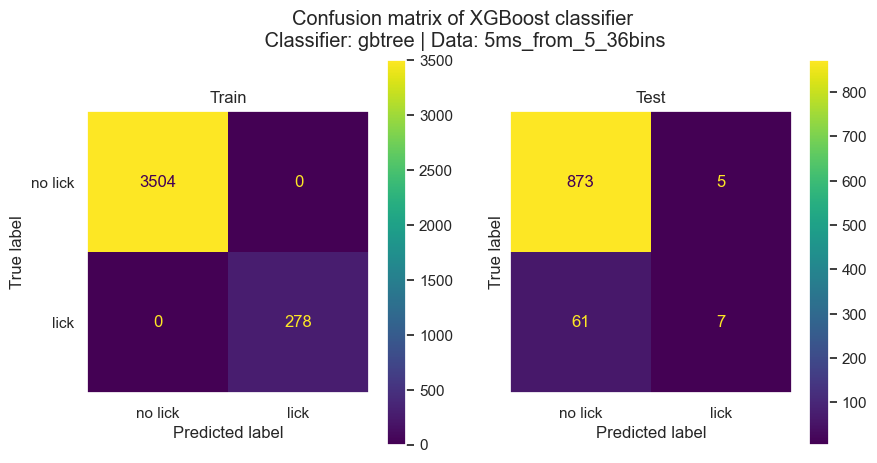

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 64   4]]


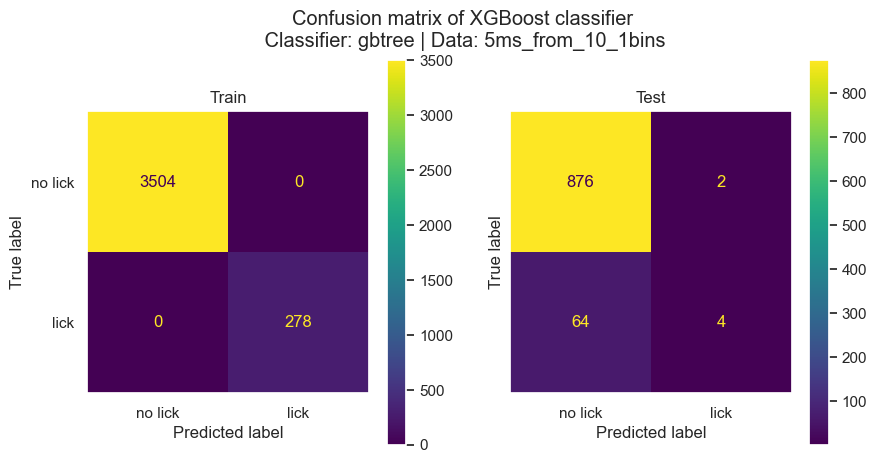

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.800 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 64   4]]


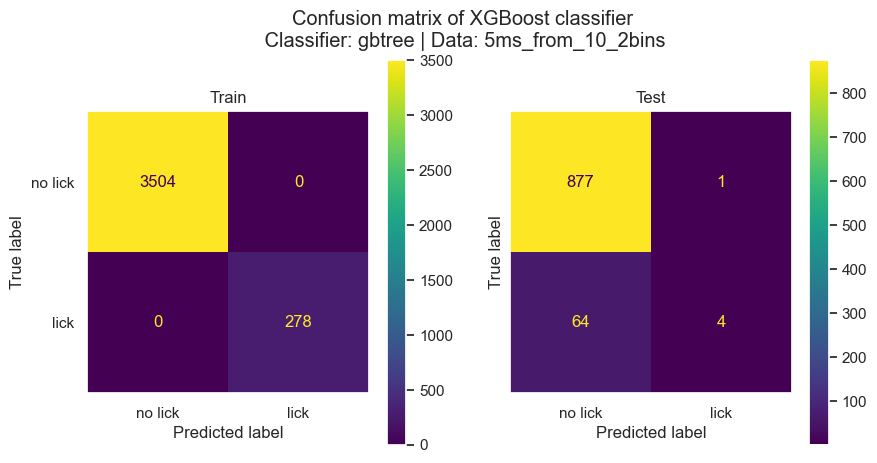

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.375 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 65   3]]


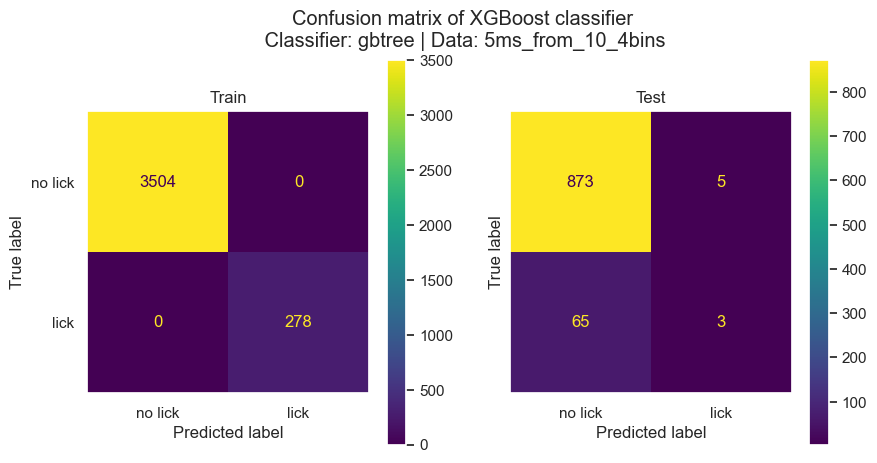

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 60   8]]


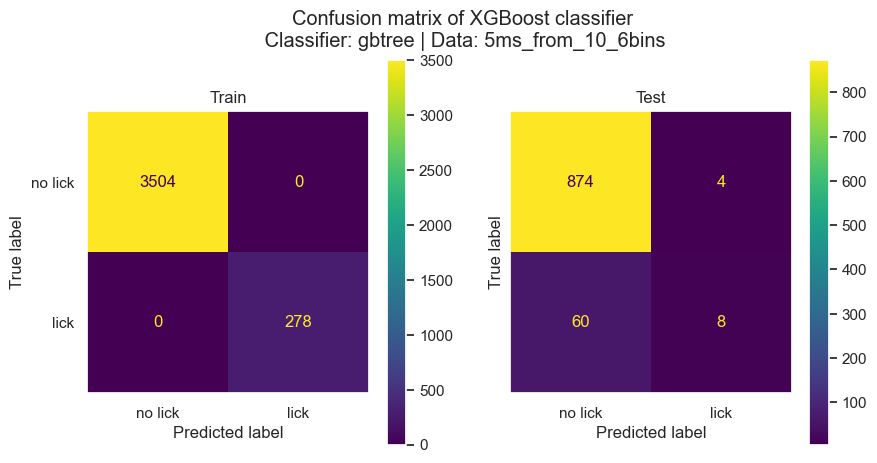

Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.722 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 55  13]]


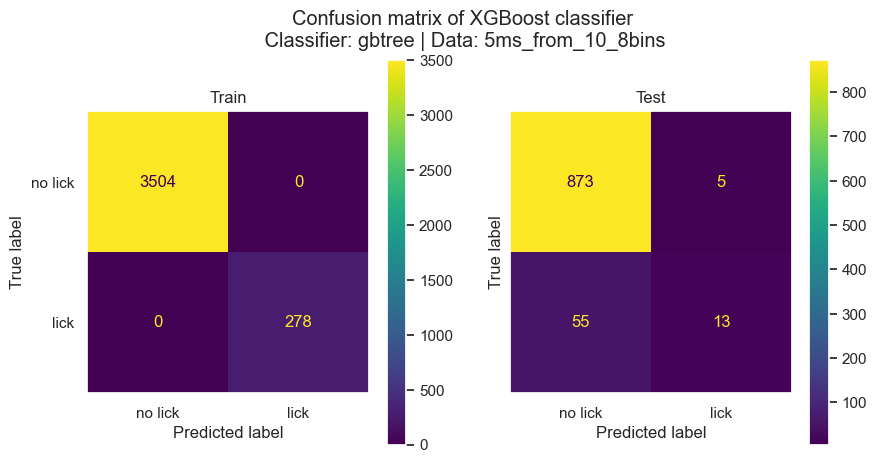

Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.857 
TP / (TP + FN): train: 1.000 test: 0.176 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 56  12]]


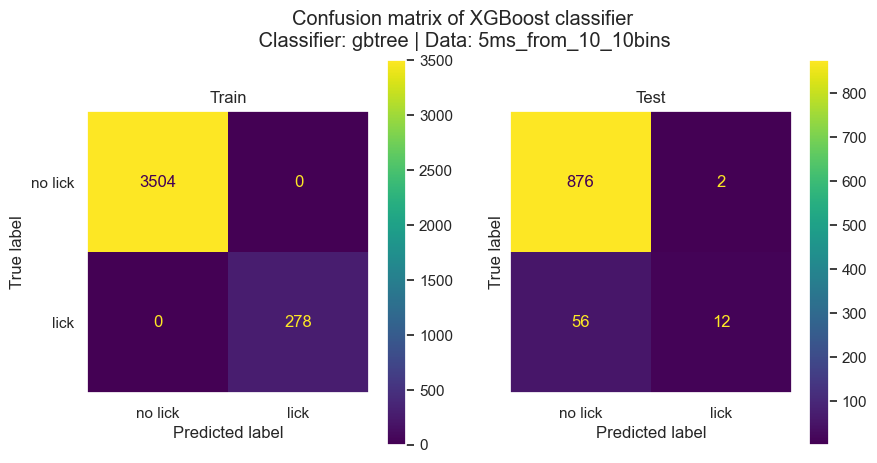

Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.778 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 54  14]]


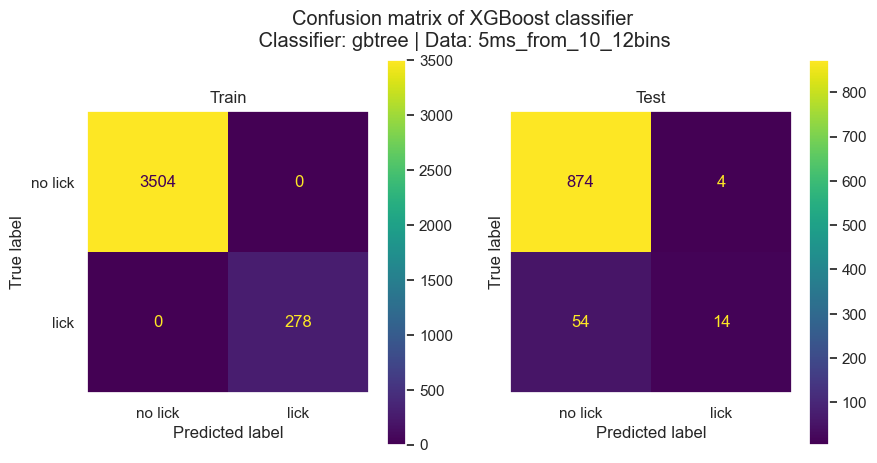

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.700 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 61   7]]


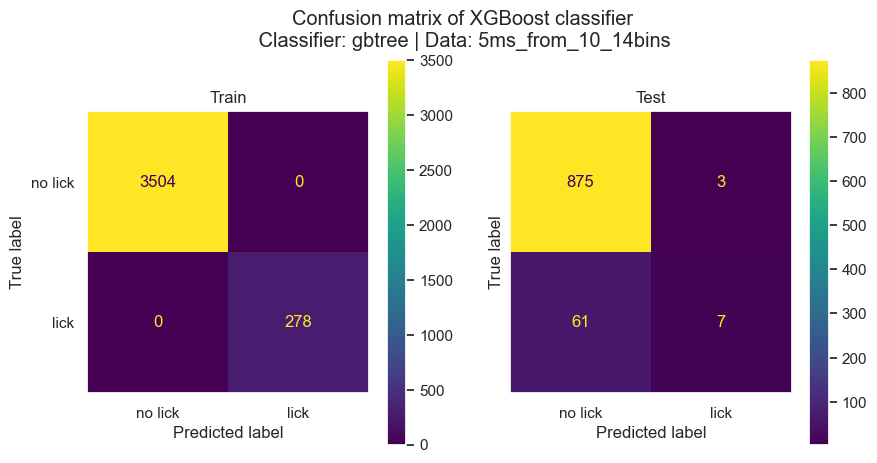

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.889 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 60   8]]


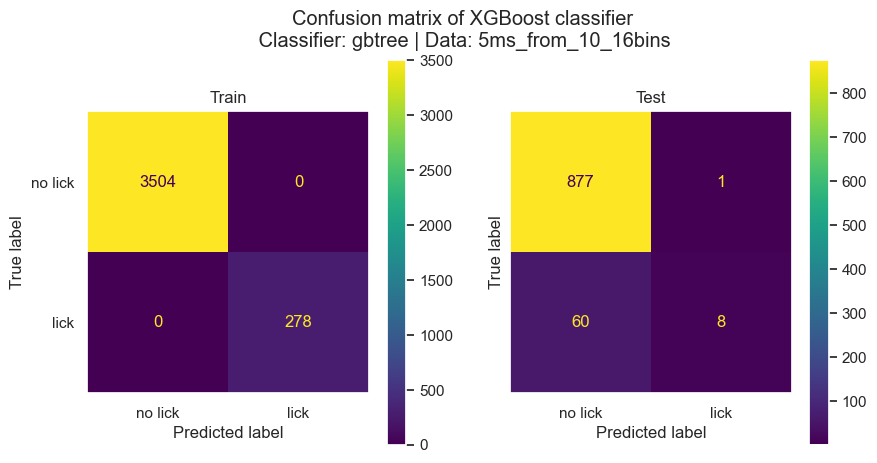

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.889 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 60   8]]


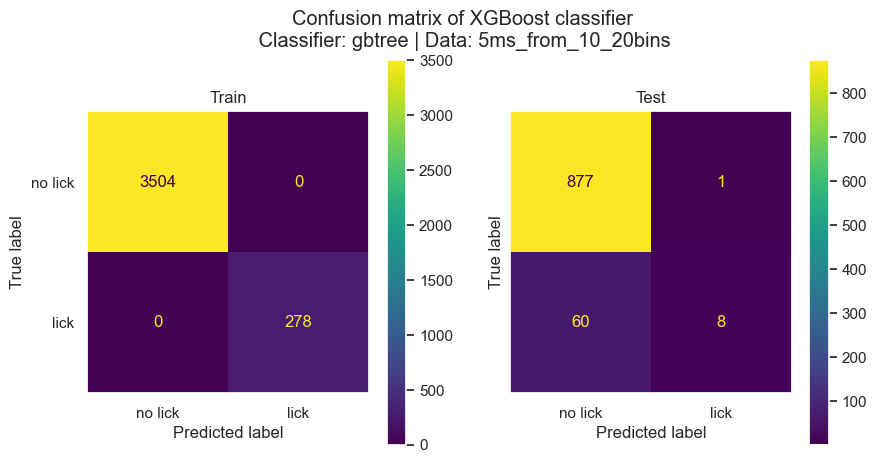

Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 0.800 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 60   8]]


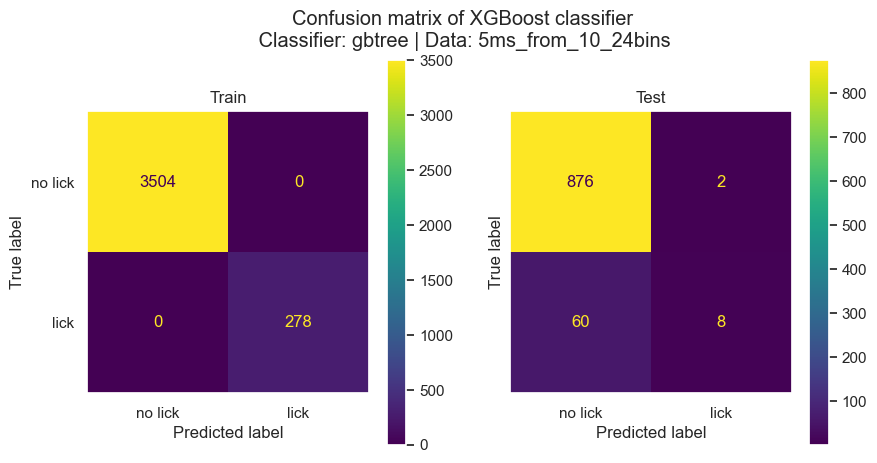

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.692 
TP / (TP + FN): train: 1.000 test: 0.132 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 59   9]]


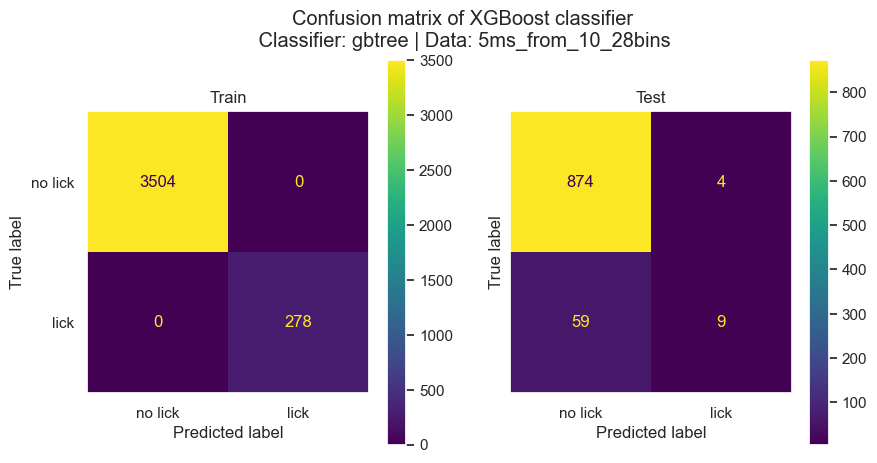

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.684 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[872   6]
 [ 55  13]]


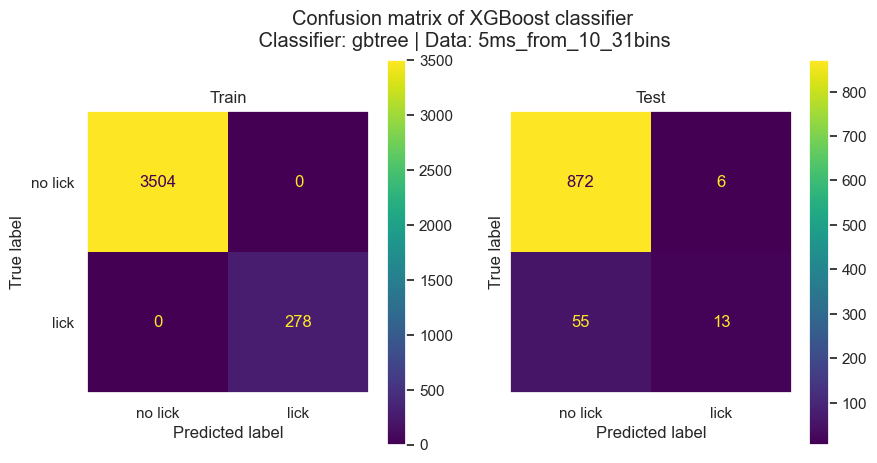

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.800 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 64   4]]


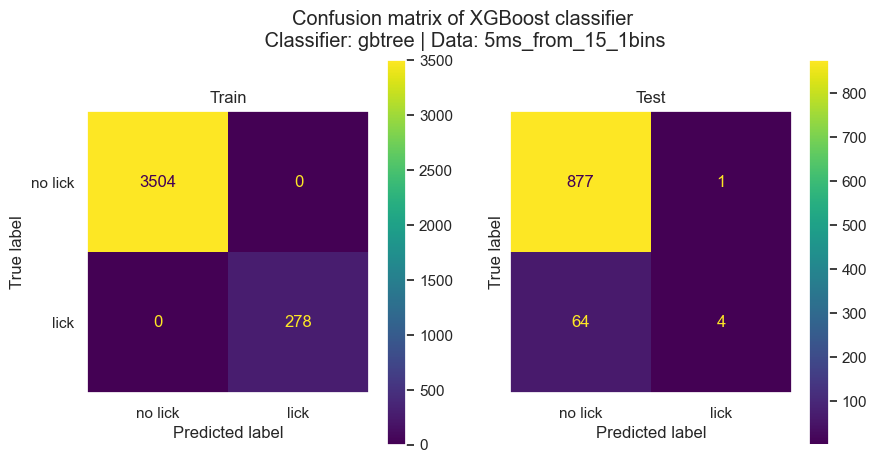

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.571 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 64   4]]


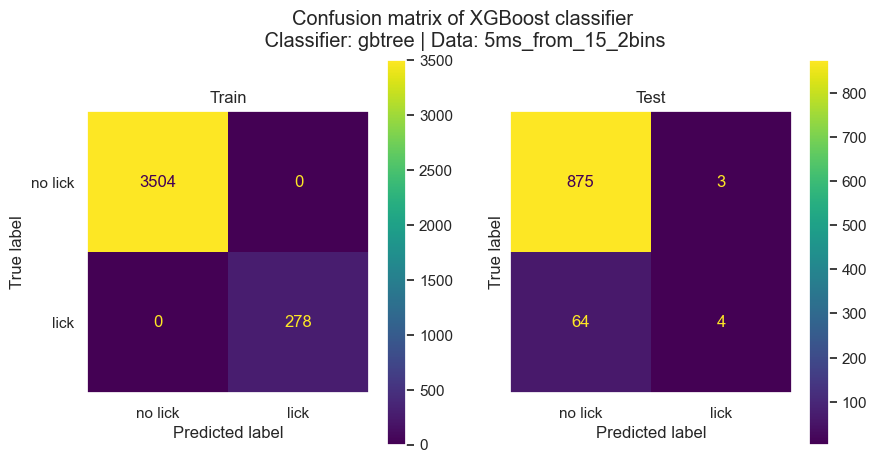

Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 0.750 
TP / (TP + FN): train: 1.000 test: 0.132 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 59   9]]


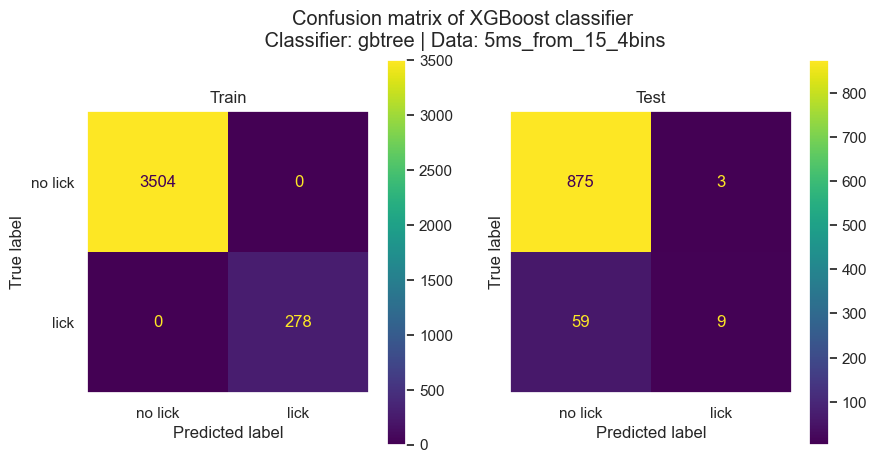

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.147 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 58  10]]


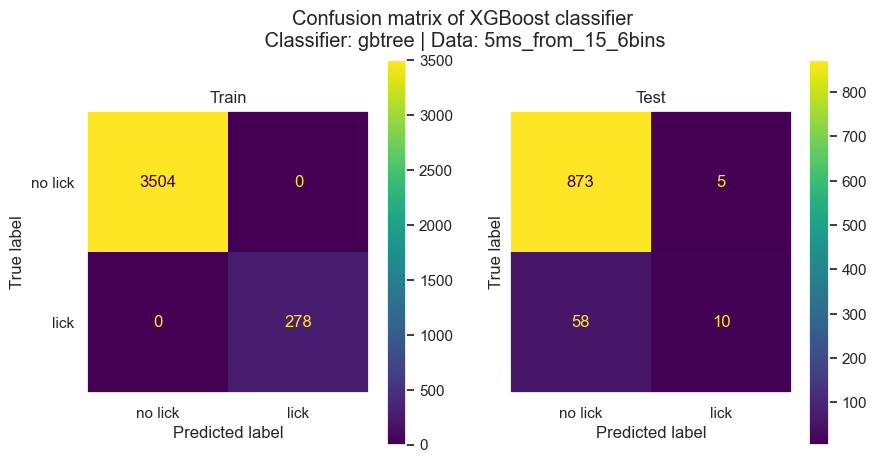

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.857 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 62   6]]


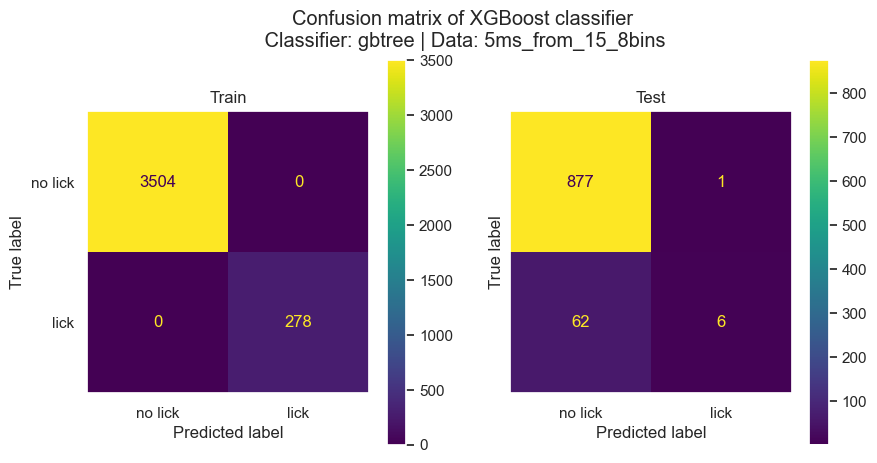

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.889 
TP / (TP + FN): train: 1.000 test: 0.118 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 60   8]]


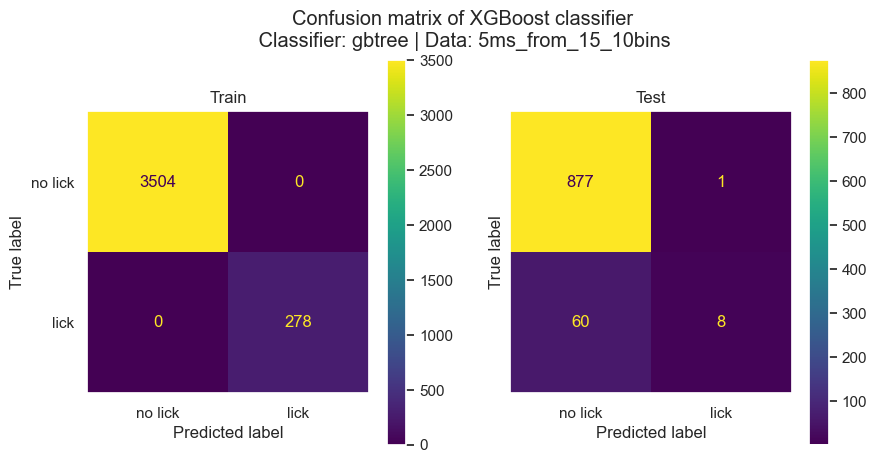

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.714 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 63   5]]


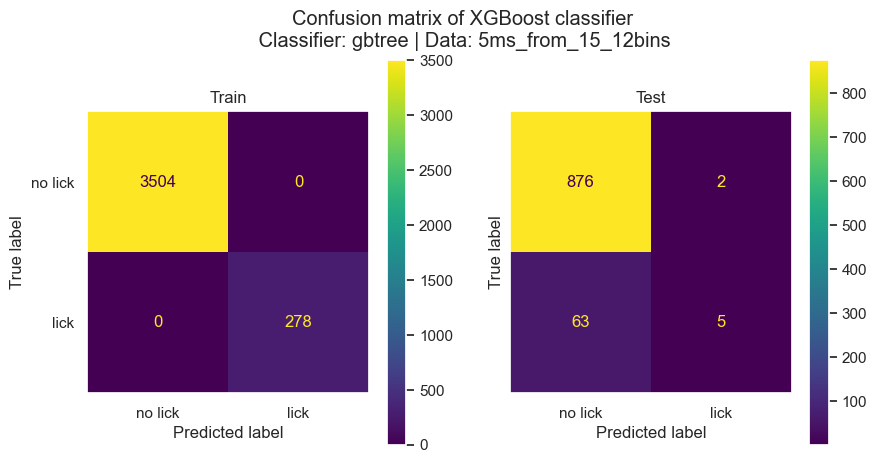

Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 0.875 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 61   7]]


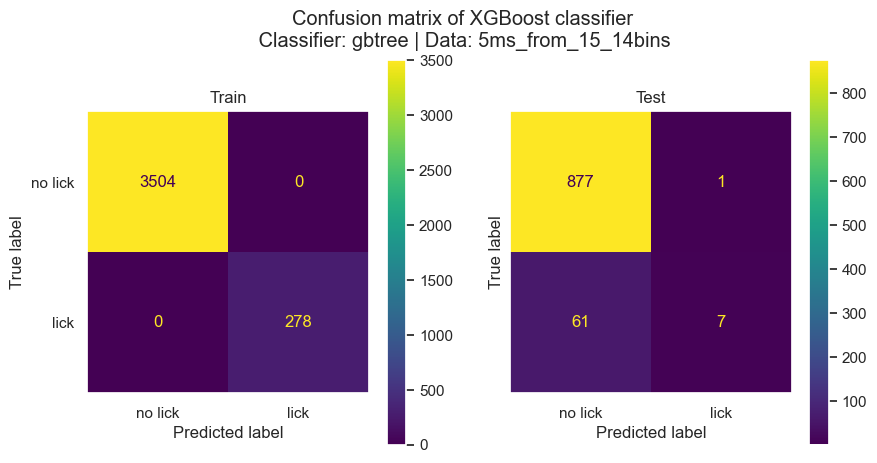

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.833 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 63   5]]


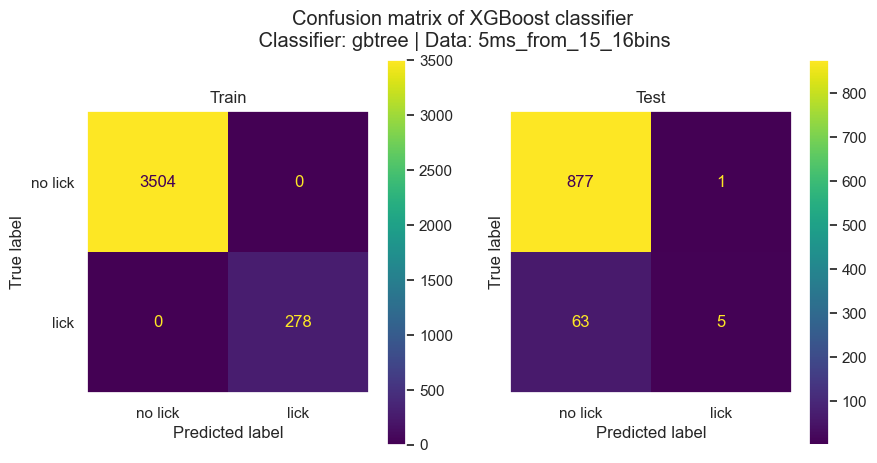

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.545 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 62   6]]


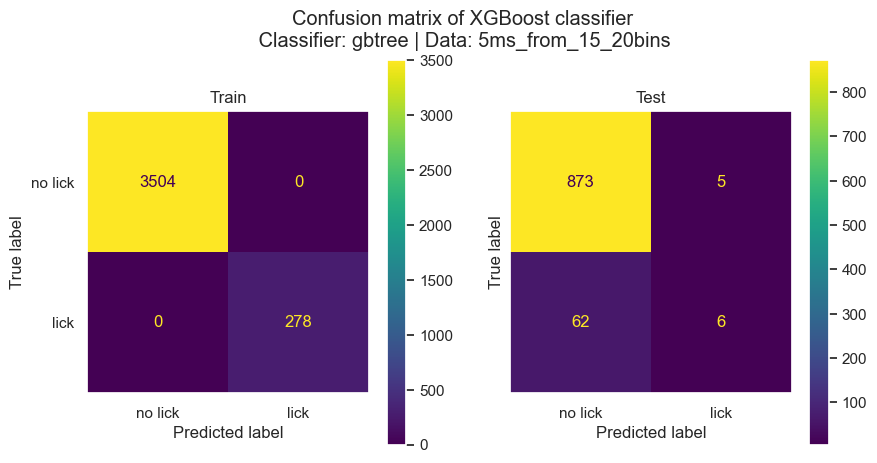

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 62   6]]


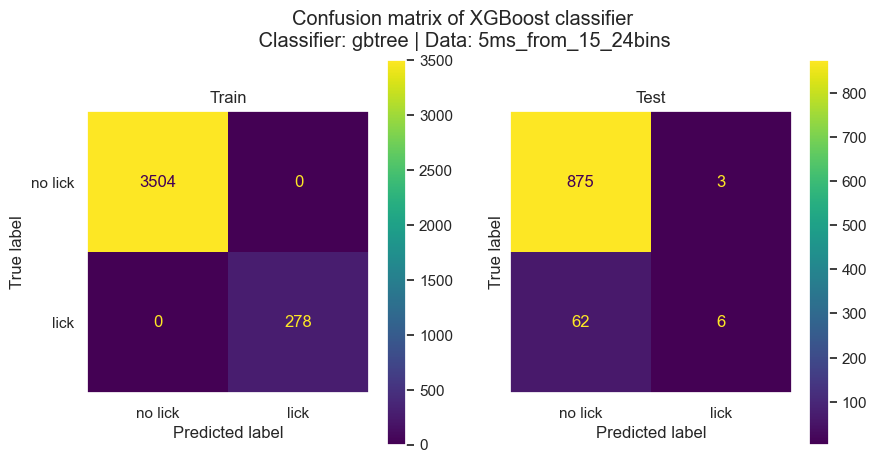

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.636 
TP / (TP + FN): train: 1.000 test: 0.103 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 61   7]]


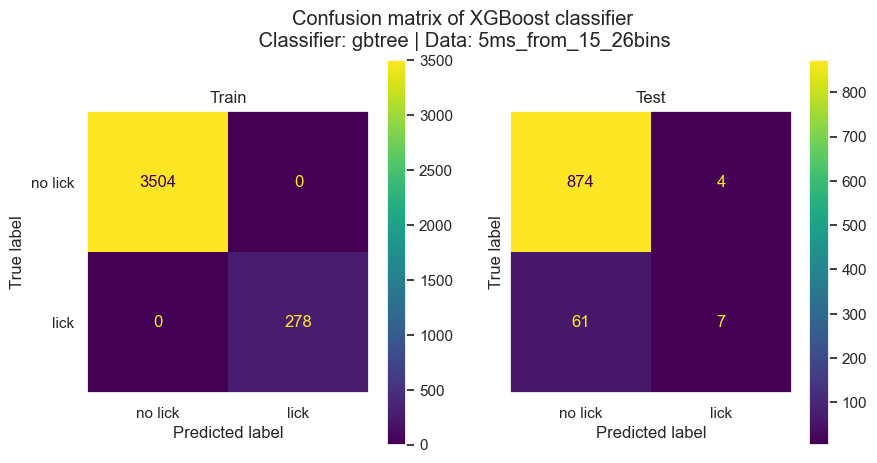

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.625 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 63   5]]


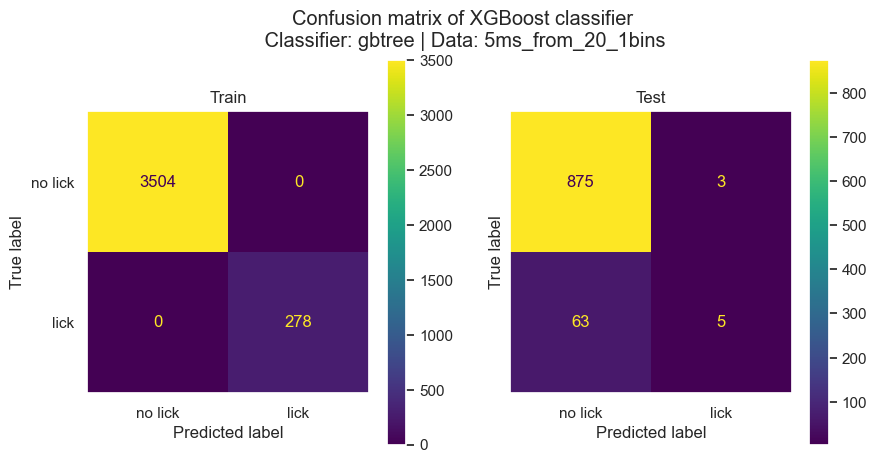

Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 1.000 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[878   0]
 [ 62   6]]


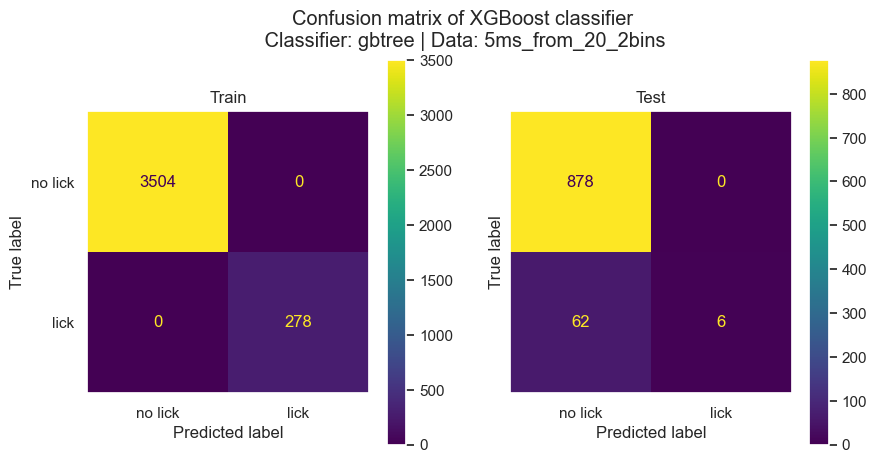

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.833 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 63   5]]


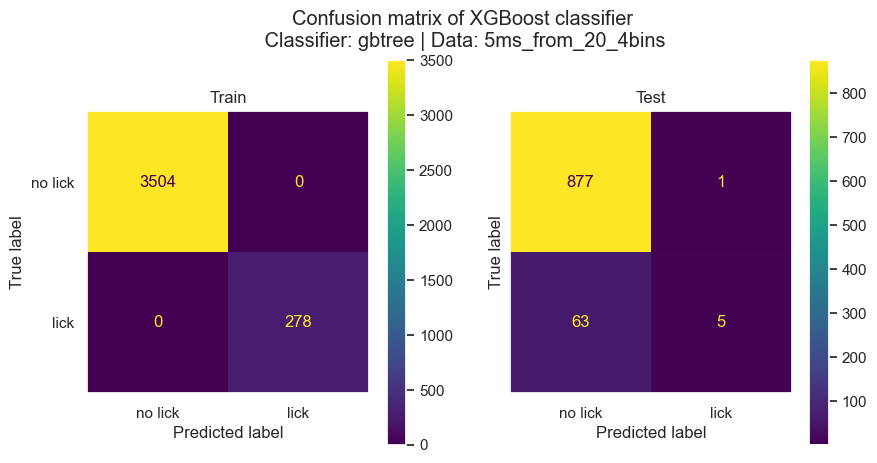

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 66   2]]


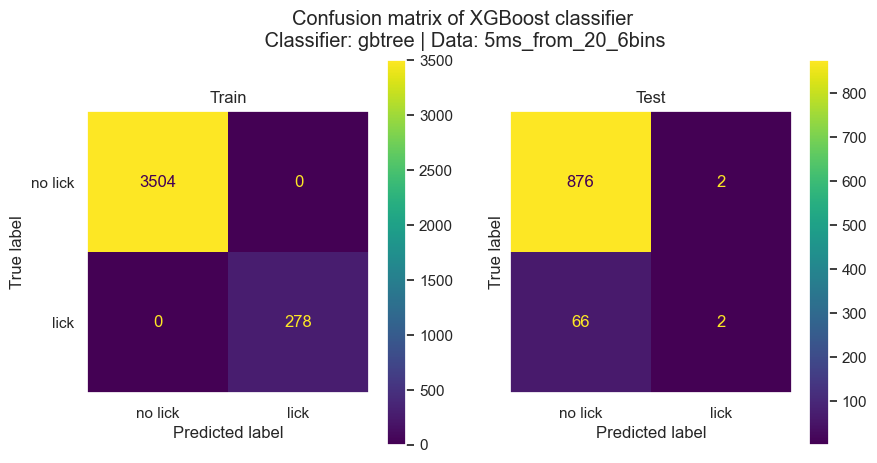

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 65   3]]


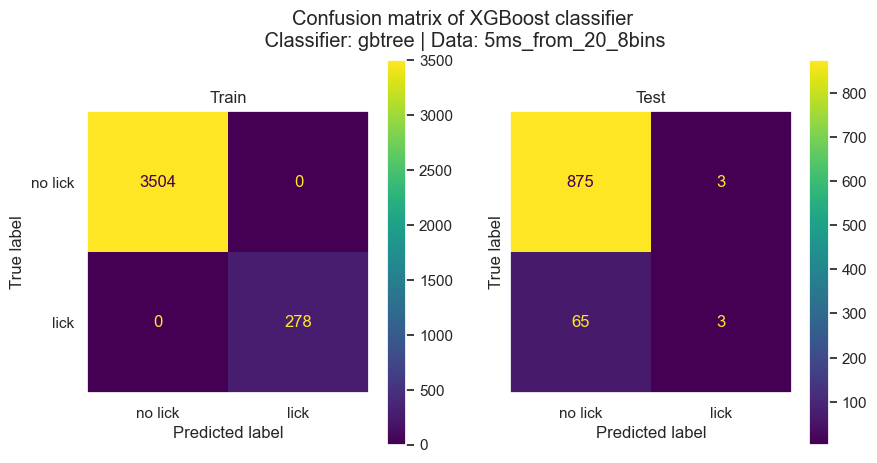

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.750 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 65   3]]


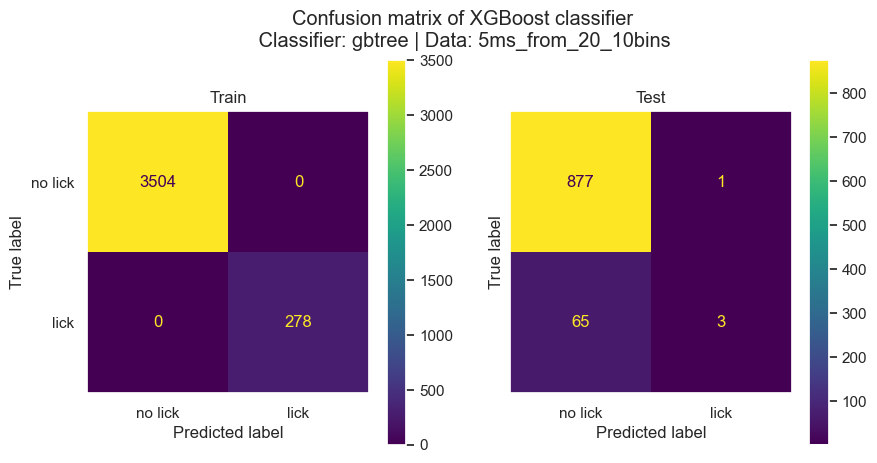

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.400 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 66   2]]


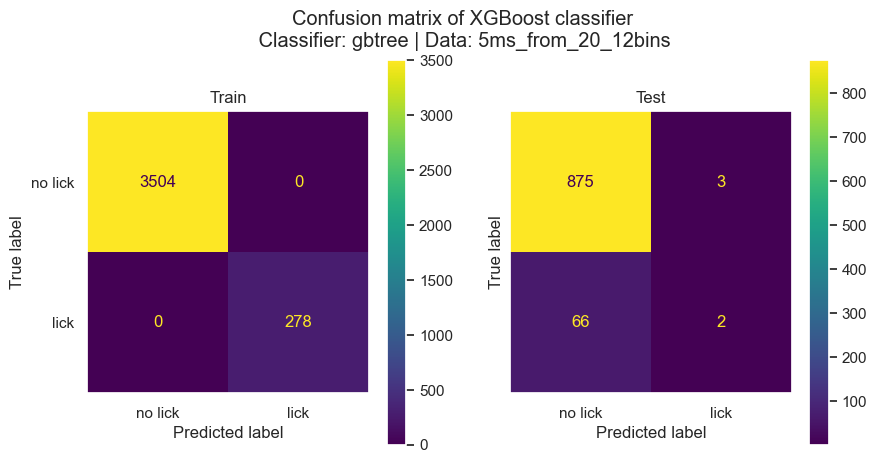

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.286 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 66   2]]


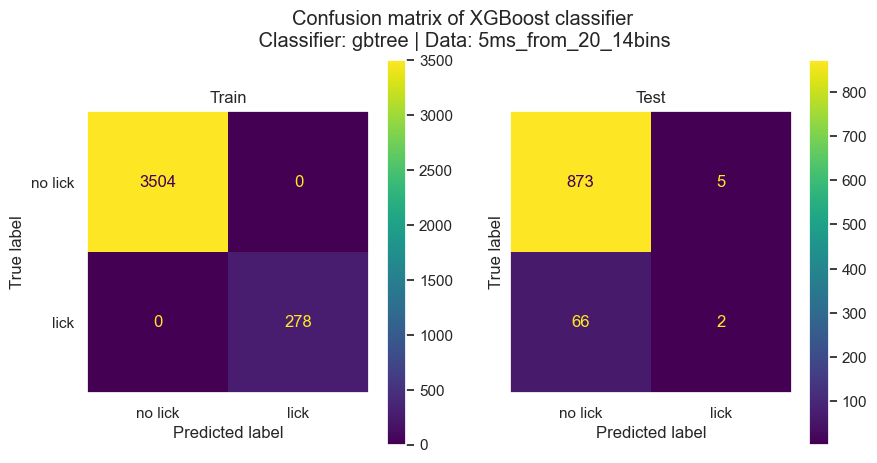

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 66   2]]


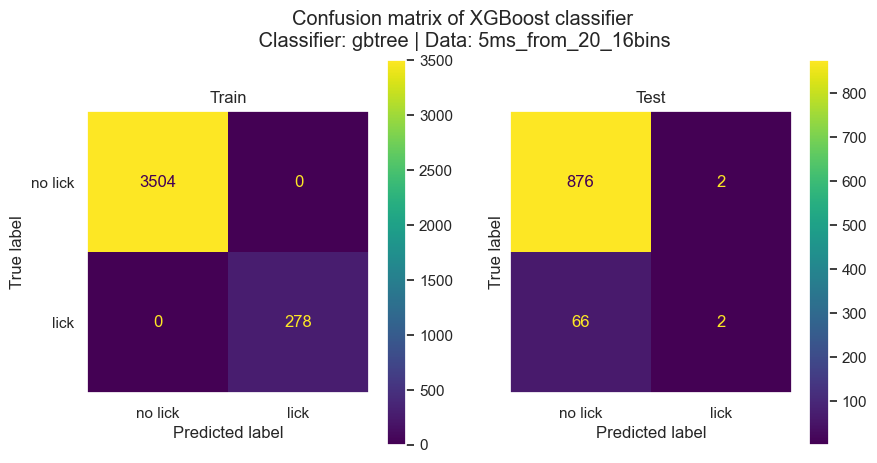

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[872   6]
 [ 65   3]]


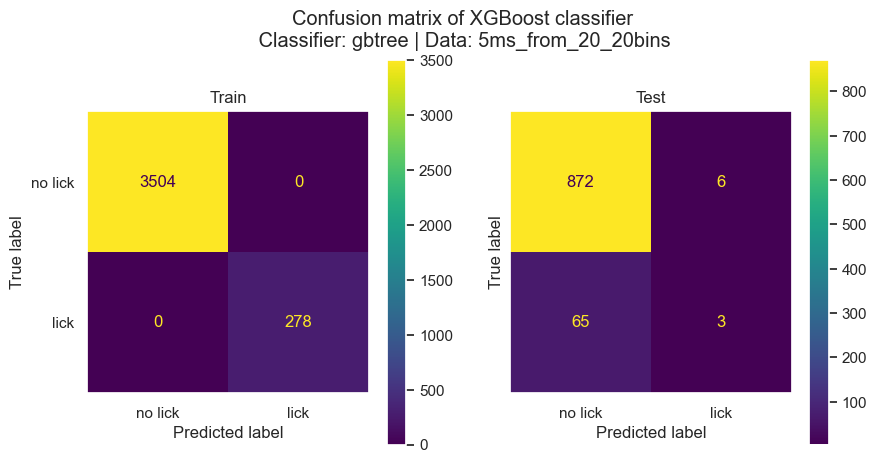

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.545 
TP / (TP + FN): train: 1.000 test: 0.088 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 62   6]]


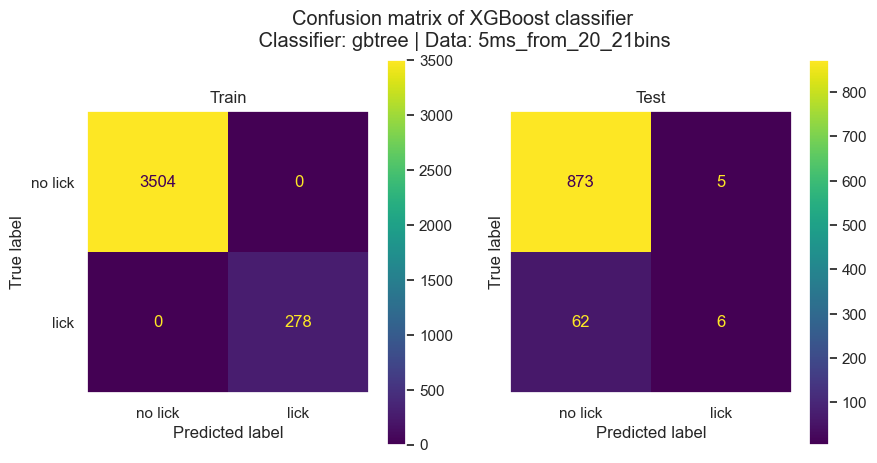

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 67   1]]


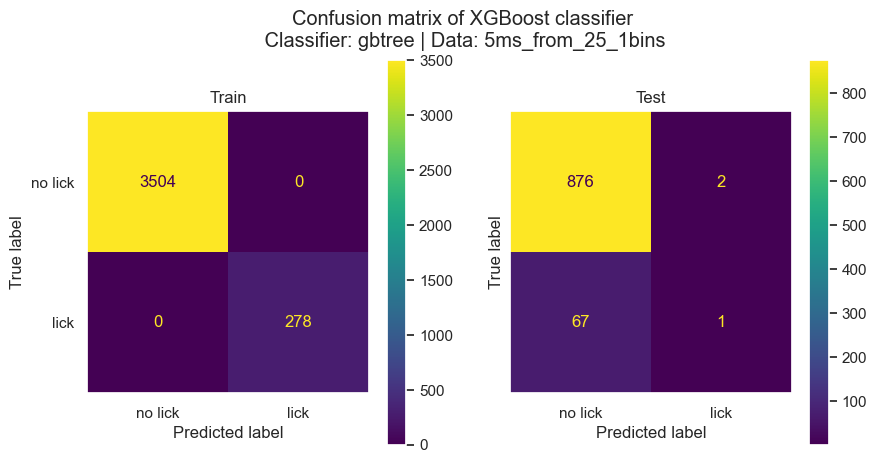

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[874   4]
 [ 66   2]]


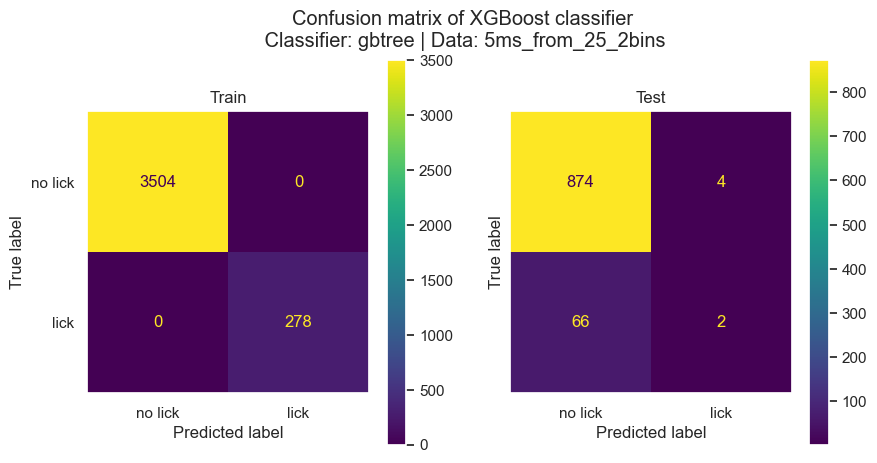

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 67   1]]


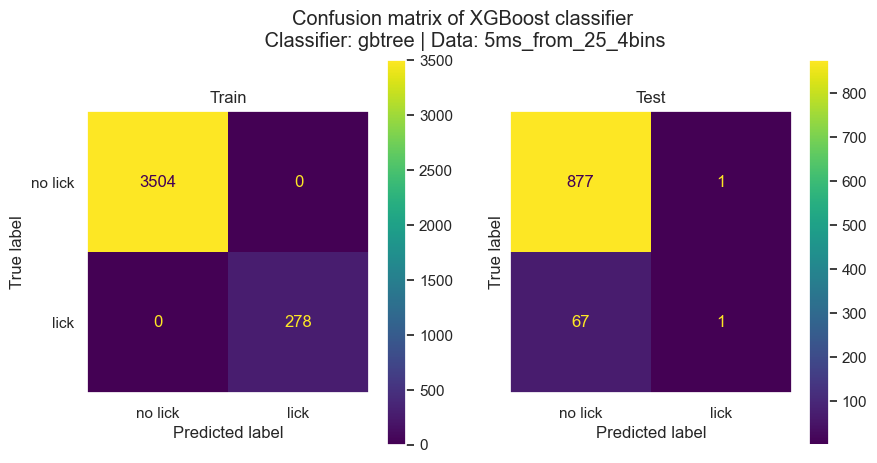

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 68   0]]


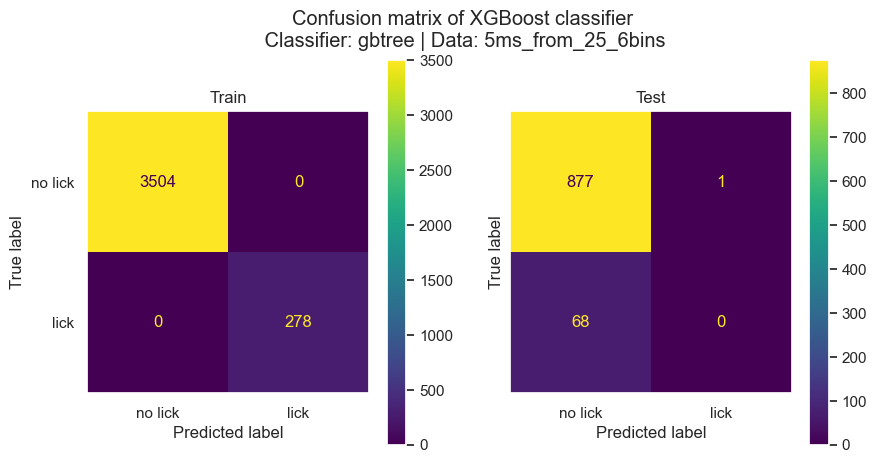

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 68   0]]


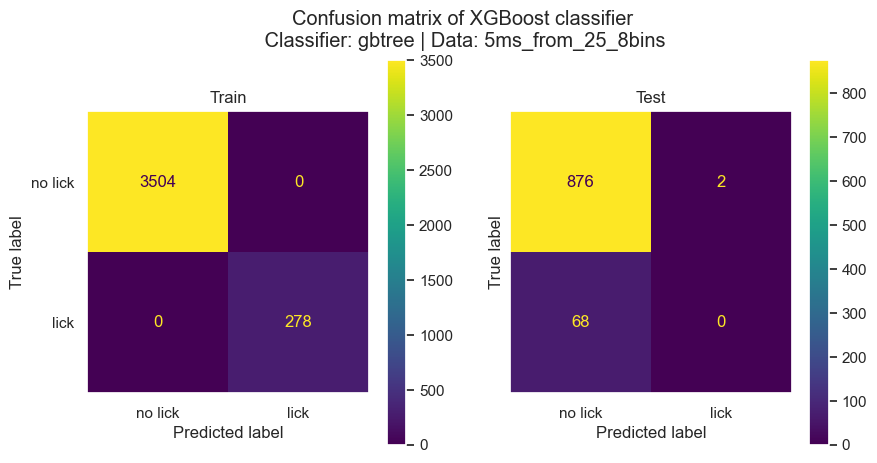

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[875   3]
 [ 68   0]]


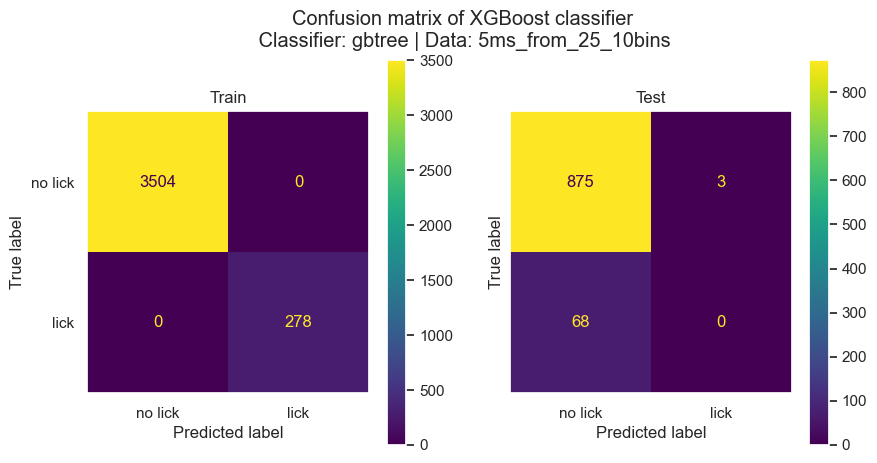

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 68   0]]


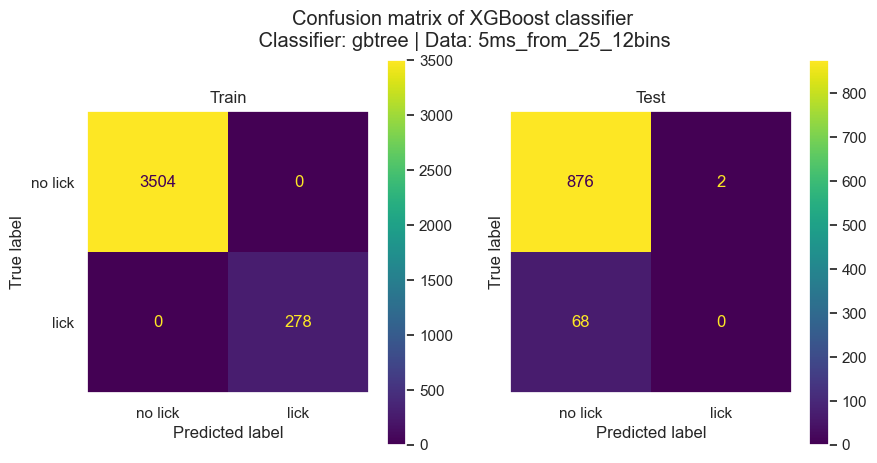

Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 68   0]]


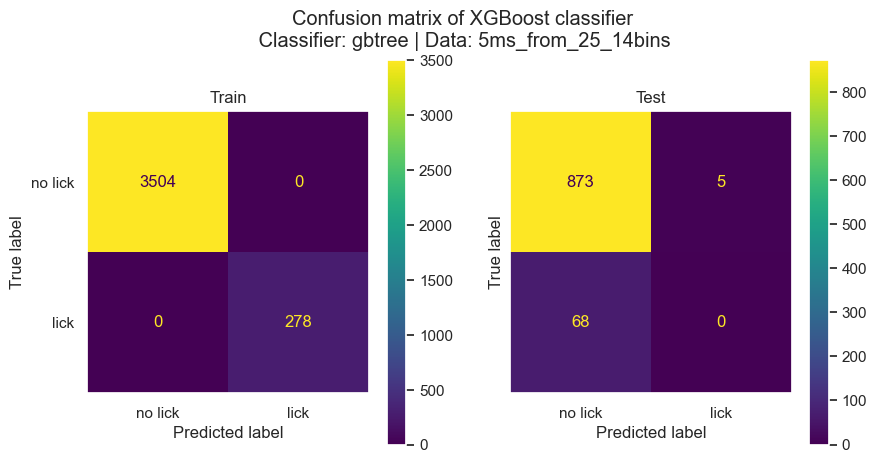

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.385 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[870   8]
 [ 63   5]]


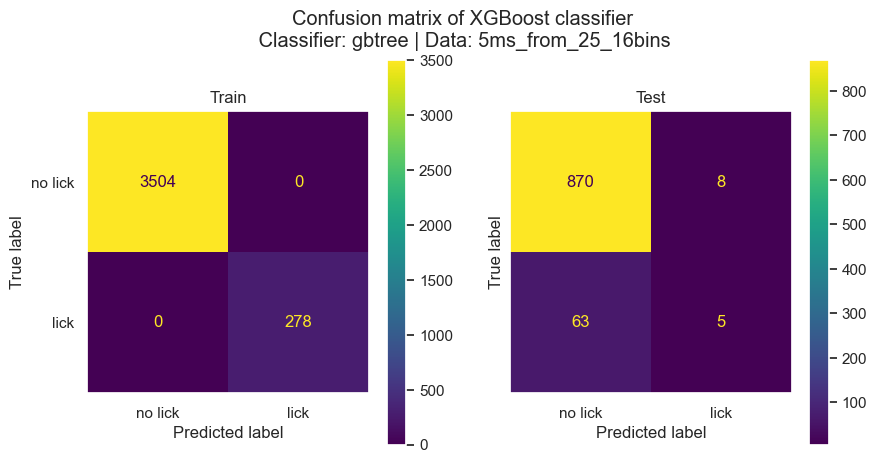

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.385 
TP / (TP + FN): train: 1.000 test: 0.074 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[870   8]
 [ 63   5]]


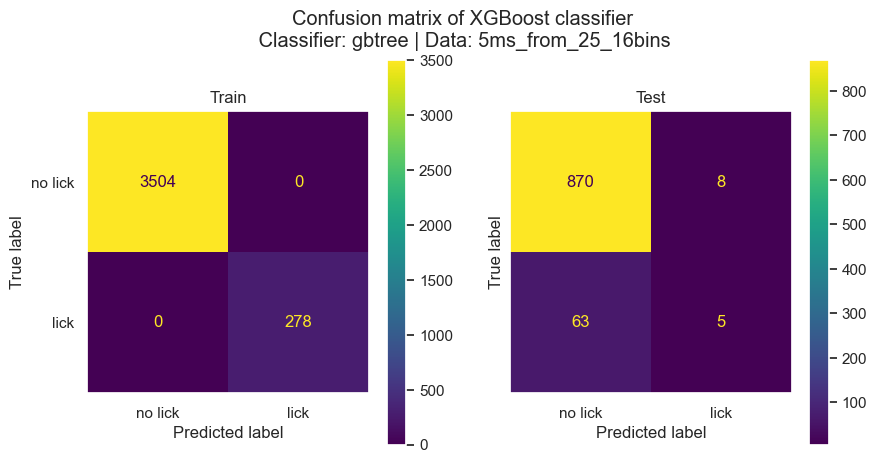

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 68   0]]


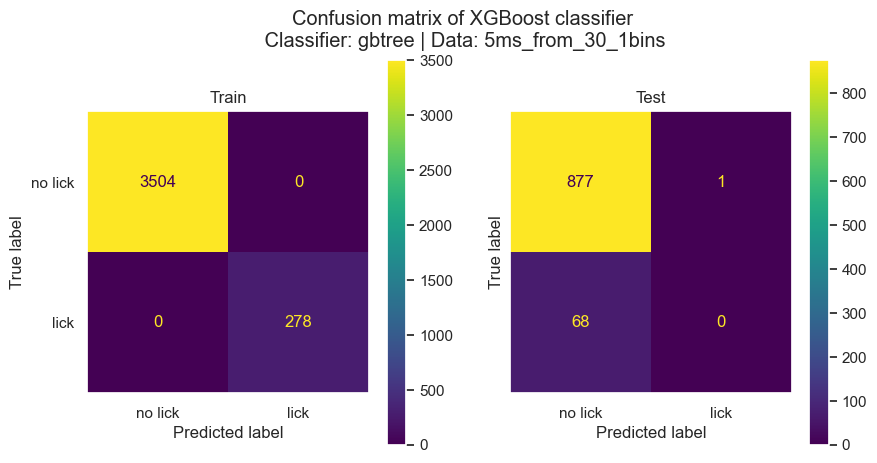

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: nan 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[878   0]
 [ 68   0]]


/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_24453/240369241.py:37: RuntimeWarning: invalid value encountered in scalar divide
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")


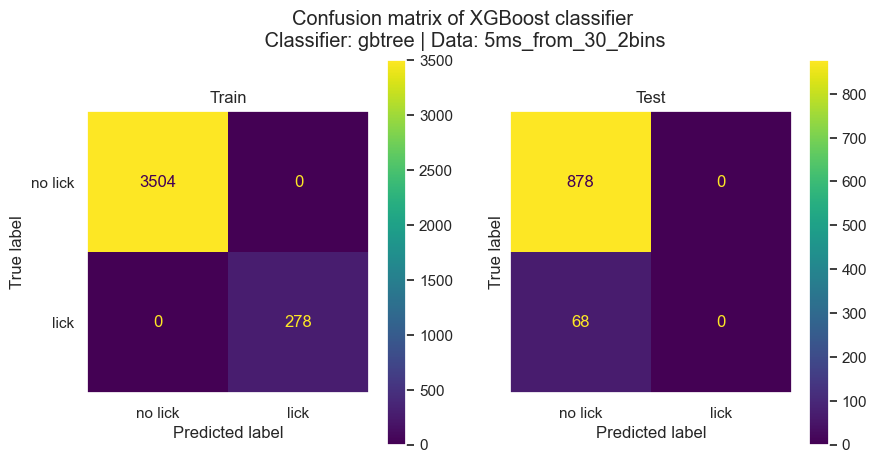

/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_24453/240369241.py:56: RuntimeWarning: invalid value encountered in scalar divide
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),


Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: nan 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[878   0]
 [ 68   0]]


/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_24453/240369241.py:37: RuntimeWarning: invalid value encountered in scalar divide
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")


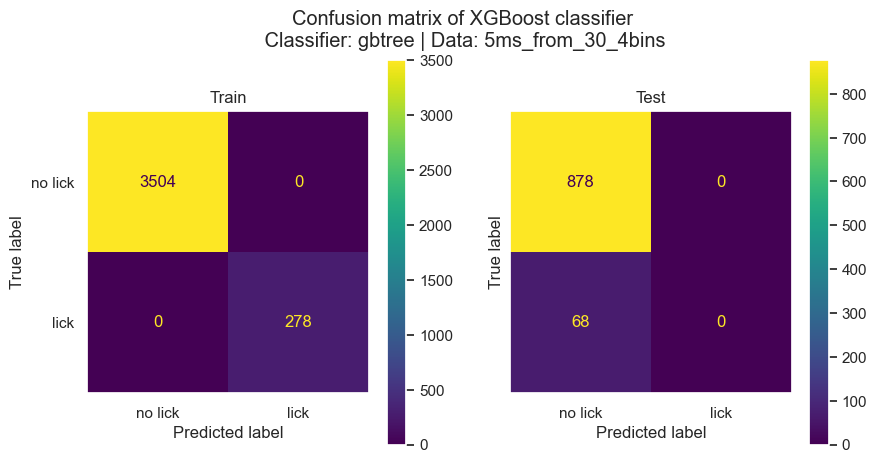

/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_24453/240369241.py:56: RuntimeWarning: invalid value encountered in scalar divide
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),


Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 1.000 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[878   0]
 [ 65   3]]


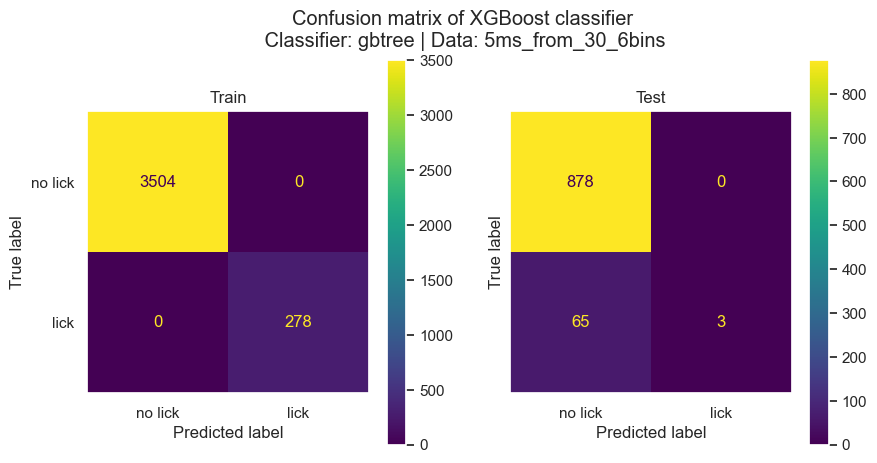

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 66   2]]


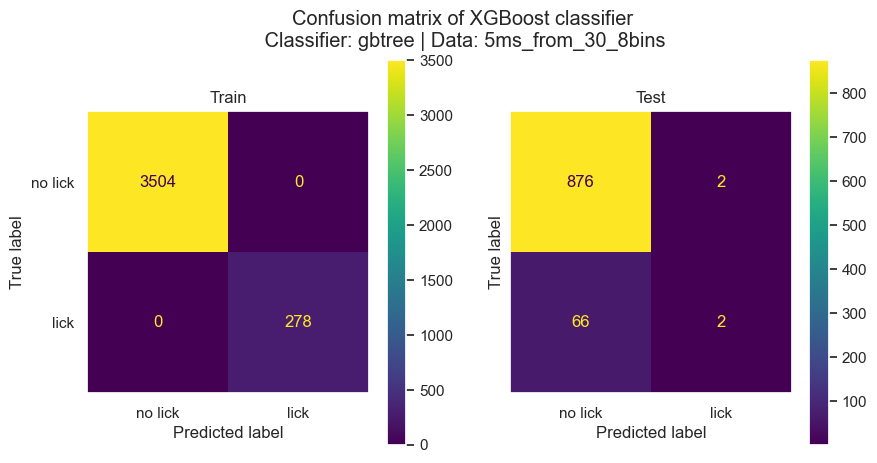

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 68   0]]


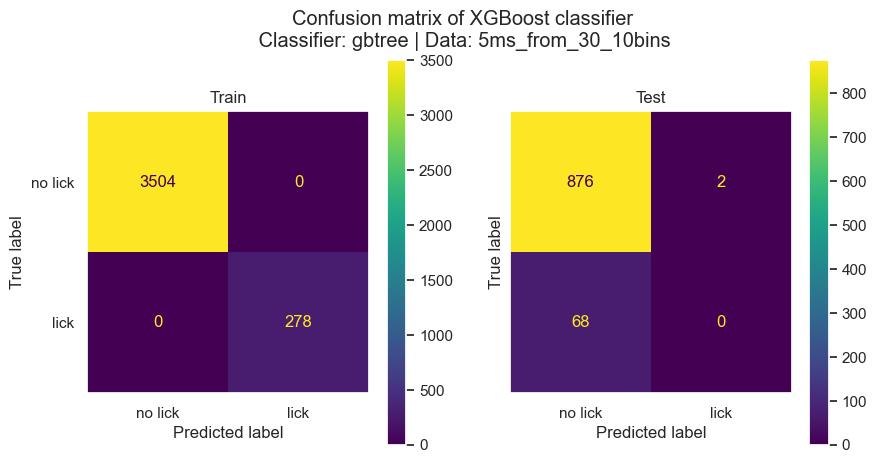

Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.167 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 67   1]]


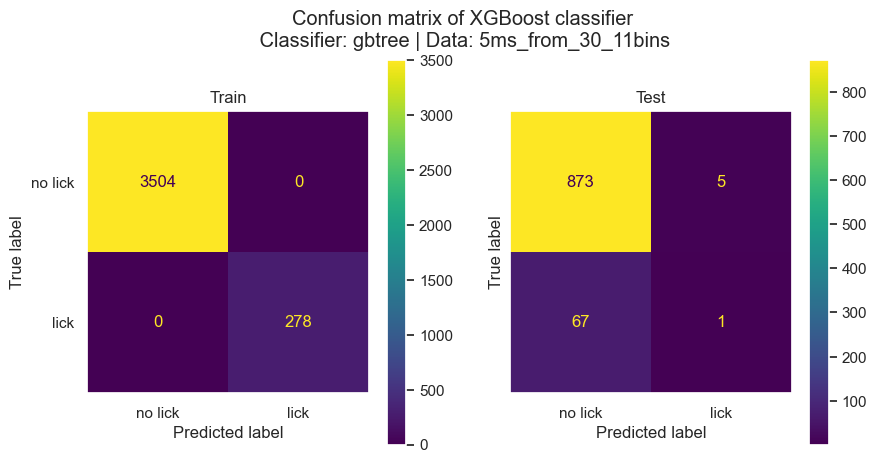

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.000 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[876   2]
 [ 68   0]]


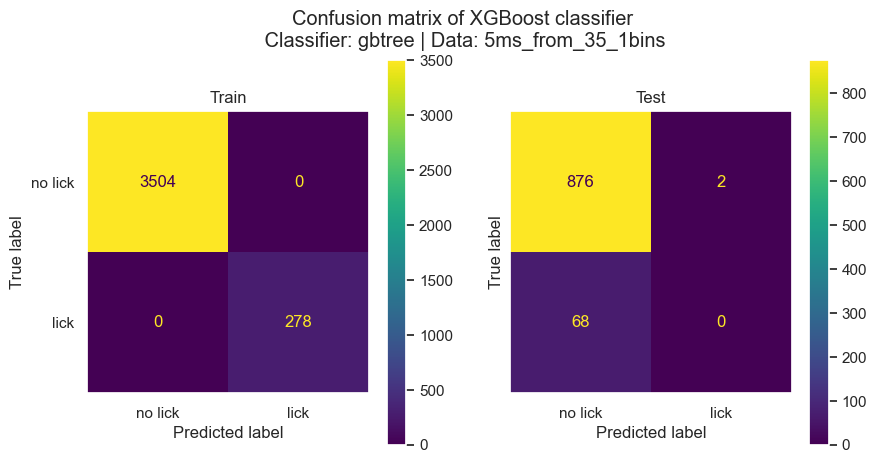

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.800 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[877   1]
 [ 64   4]]


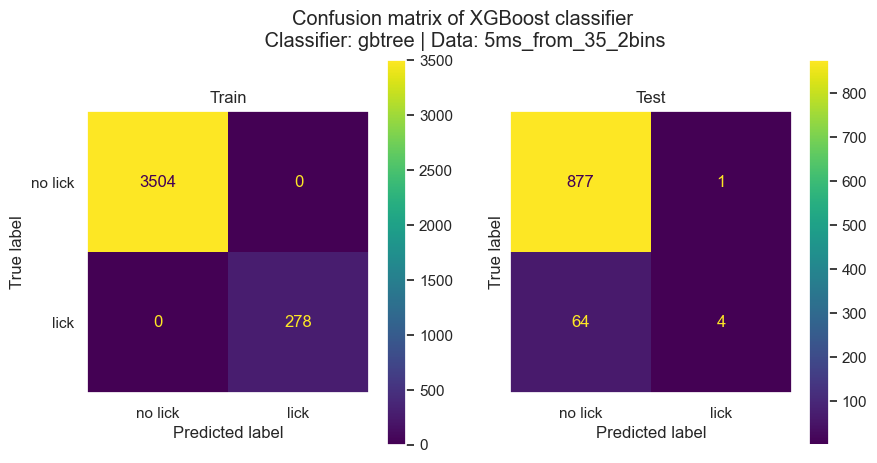

Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.444 
TP / (TP + FN): train: 1.000 test: 0.059 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[873   5]
 [ 64   4]]


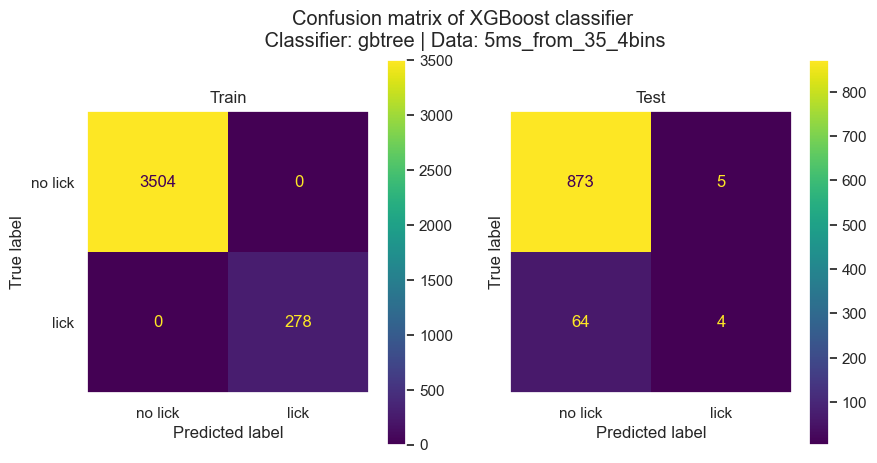

Accuracy: train: 1.000 test: 0.922
TP / (TP + FP): train: 1.000 test: 0.125 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 67   1]]


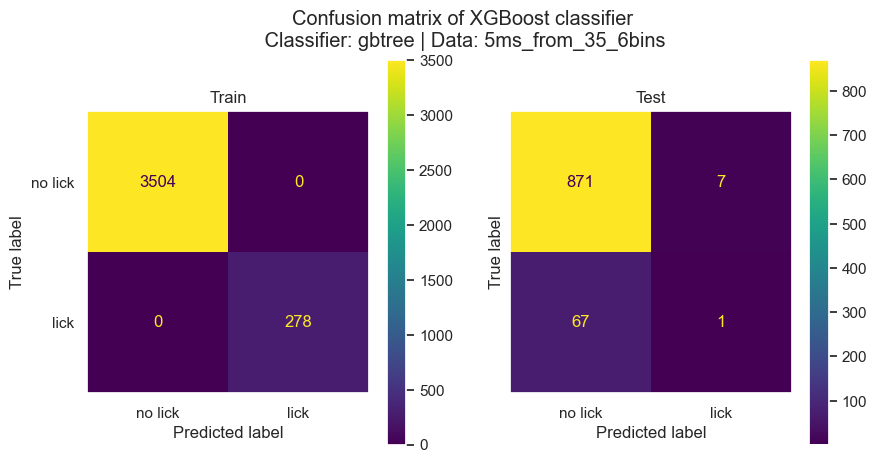

Accuracy: train: 1.000 test: 0.922
TP / (TP + FP): train: 1.000 test: 0.125 
TP / (TP + FN): train: 1.000 test: 0.015 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 67   1]]


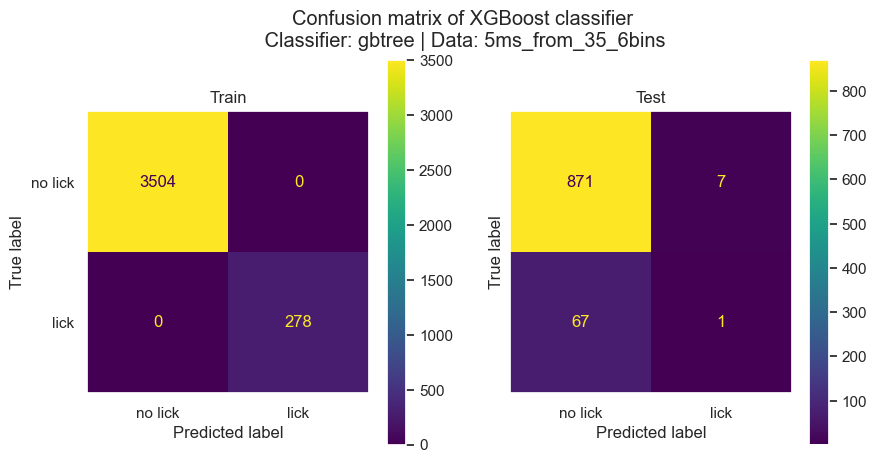

Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.300 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 65   3]]


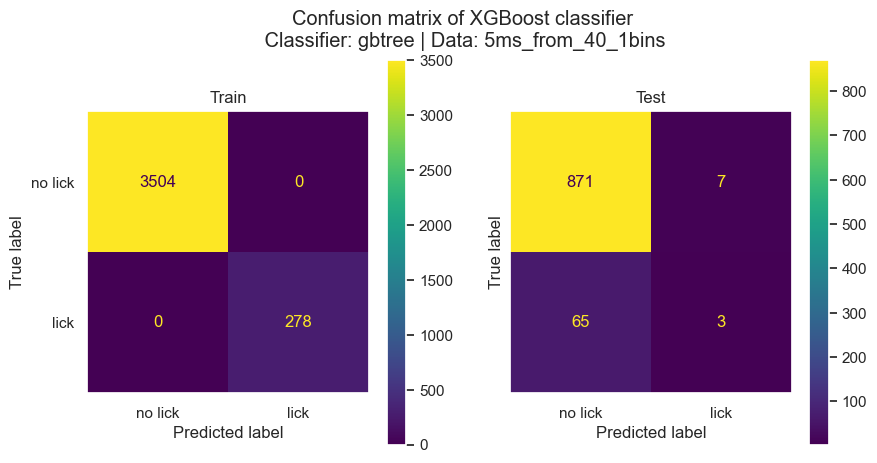

Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.300 
TP / (TP + FN): train: 1.000 test: 0.044 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 65   3]]


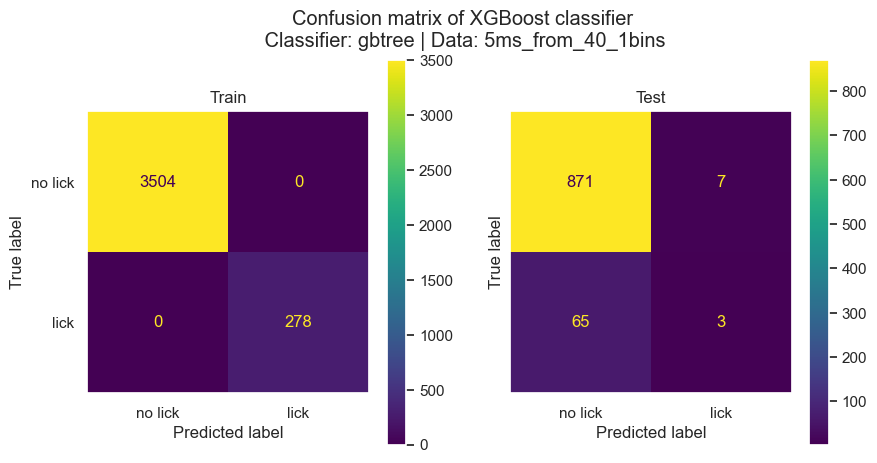

In [90]:
# fit model no training data
model_str = "gbtree" # "gblinear"
df_col = []
for init_bin in range(0, 41, 5):
    for lag in [1, 2, 4, 6, 8, 10, 12, 14, 16, 20, 24, 28, 32, 36, 40]:
        neural_mat_zscore = neural_tsr_zscore[:, :, init_bin:init_bin+lag].\
            reshape(neural_tsr_zscore.shape[0], -1)
        bin_num = neural_tsr_zscore[:, :, init_bin:init_bin+lag].shape[-1]
        data_str = f"5ms_from_{init_bin}_{bin_num}bins"
        y_mat = lick_mat[0]
        # split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                                y_mat, test_size=test_size, random_state=seed)
        model = XGBClassifier(booster=model_str,
                        objective="binary:logistic",
                        eval_metric="logloss",
                        use_label_encoder=False,
                        device="cpu", )
        model.fit(X_train, y_train)
        # make predictions for test data
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        # evaluate predictions
        acc_train = accuracy_score(y_train, y_train_pred)
        acc_test  = accuracy_score(y_test, y_test_pred)
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test  = confusion_matrix(y_test, y_test_pred)
        print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
        print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
        print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
        print("train_confmat\n", cm_train)
        print("test_confmat\n", cm_test)
        # plot confusion matrix
        figh, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[0])
        axs[0].set_title("Train")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[1])
        axs[1].set_title("Test") 
        plt.suptitle(f"Confusion matrix of XGBoost classifier\n Classifier: {model_str} | Data: {data_str}")
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.png"))
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.pdf"))
        plt.show()
        df_col.append({"init_bin": init_bin, "lag": lag, "acc_train": acc_train, "acc_test": acc_test,
                       "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
                       "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
                       "cm_train": cm_train, "cm_test": cm_test,
                       "model_str": model_str, "data_str": data_str})
        if bin_num < lag:
            break

df = pd.DataFrame(df_col)
df.to_csv(join(outdir, f"confmat_{model_str}_lags_tab.csv"), index=False)

## Linear classifier `gblinear`

Accuracy: train: 0.941 test: 0.911
TP / (TP + FP): train: 0.726 test: 0.278 
TP / (TP + FN): train: 0.726 test: 0.147 
train_confmat
 [[3470   34]
 [ 188   90]]
test_confmat
 [[852  26]
 [ 58  10]]


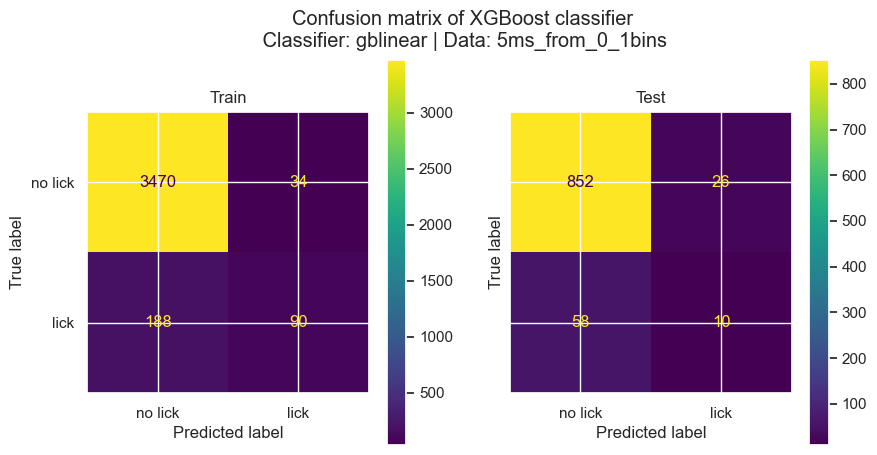

Accuracy: train: 0.998 test: 0.860
TP / (TP + FP): train: 0.996 test: 0.204 
TP / (TP + FN): train: 0.996 test: 0.324 
train_confmat
 [[3503    1]
 [   7  271]]
test_confmat
 [[792  86]
 [ 46  22]]


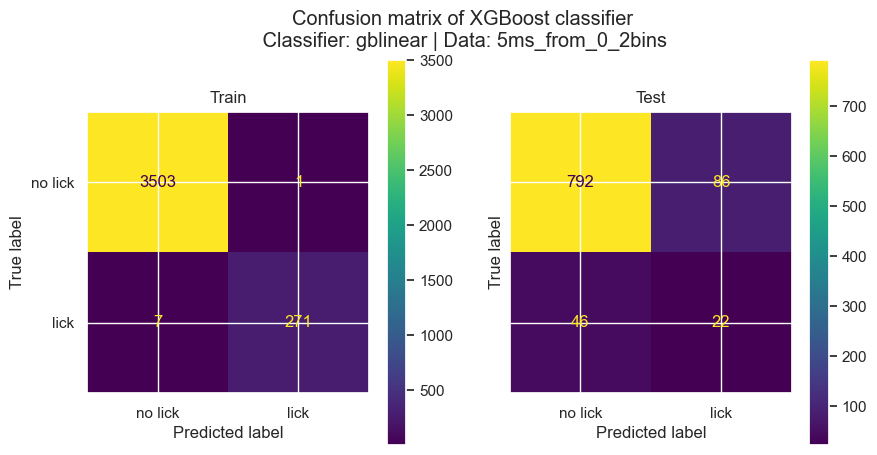

Accuracy: train: 1.000 test: 0.865
TP / (TP + FP): train: 1.000 test: 0.217 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[795  83]
 [ 45  23]]


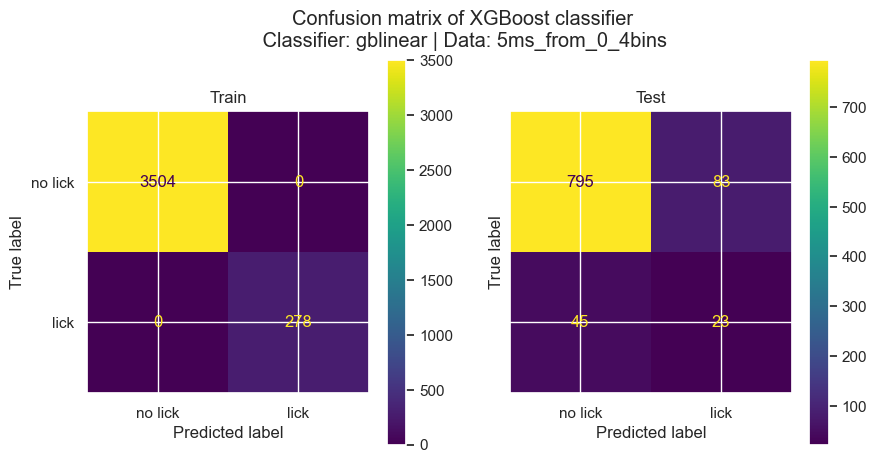

Accuracy: train: 1.000 test: 0.871
TP / (TP + FP): train: 1.000 test: 0.263 
TP / (TP + FN): train: 1.000 test: 0.441 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[794  84]
 [ 38  30]]


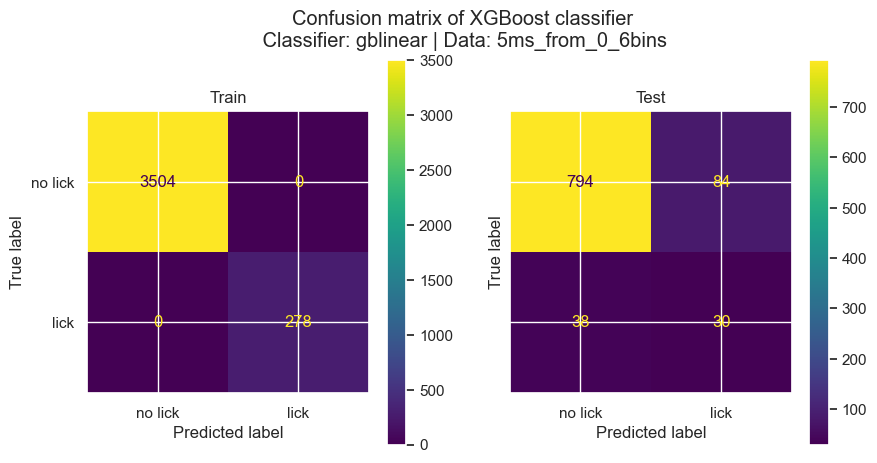

Accuracy: train: 1.000 test: 0.869
TP / (TP + FP): train: 1.000 test: 0.231 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[798  80]
 [ 44  24]]


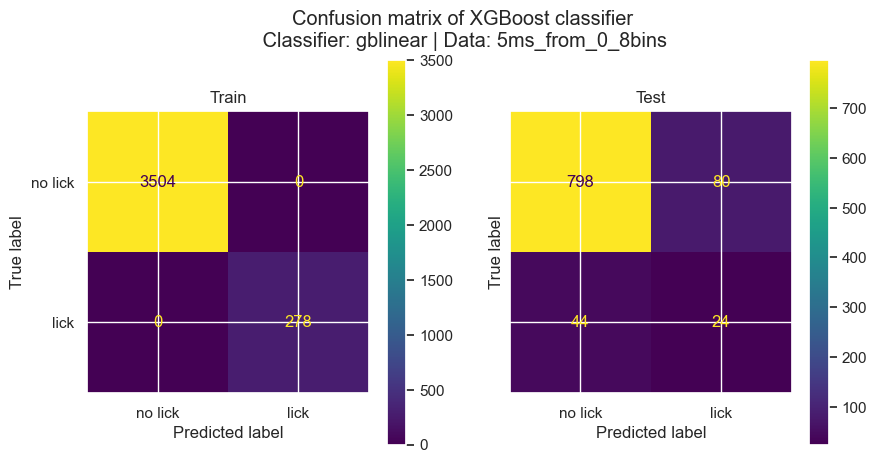

Accuracy: train: 1.000 test: 0.884
TP / (TP + FP): train: 1.000 test: 0.231 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[818  60]
 [ 50  18]]


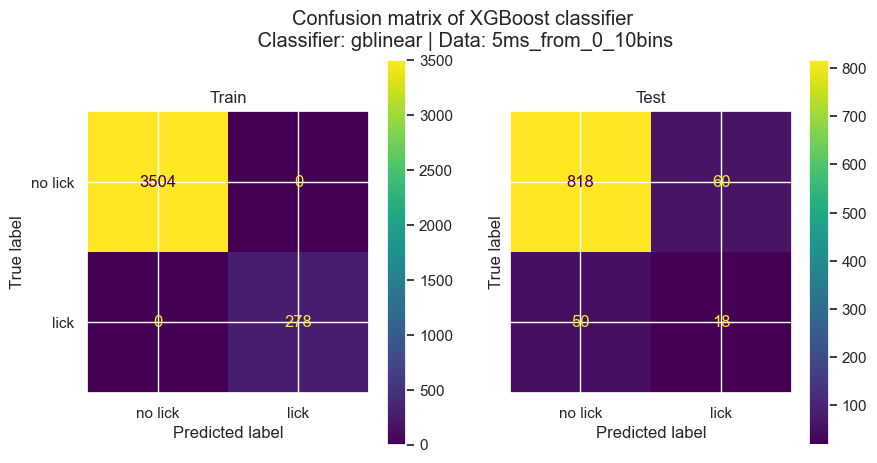

Accuracy: train: 1.000 test: 0.902
TP / (TP + FP): train: 1.000 test: 0.295 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[835  43]
 [ 50  18]]


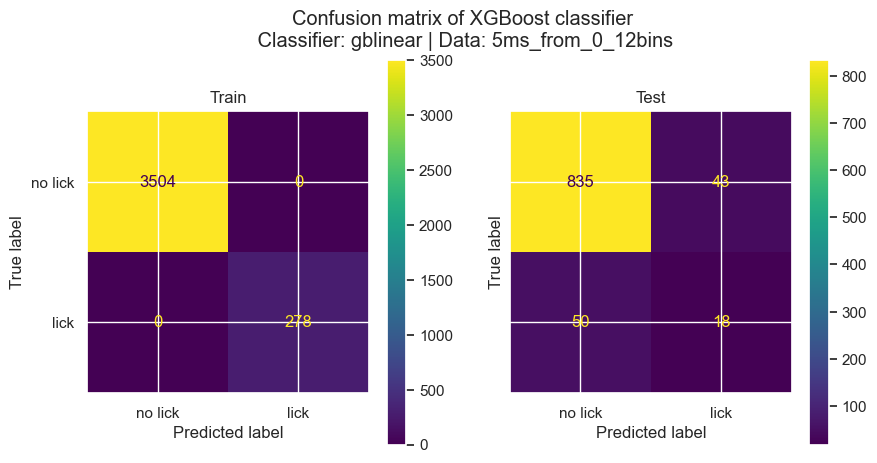

Accuracy: train: 1.000 test: 0.915
TP / (TP + FP): train: 1.000 test: 0.403 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[841  37]
 [ 43  25]]


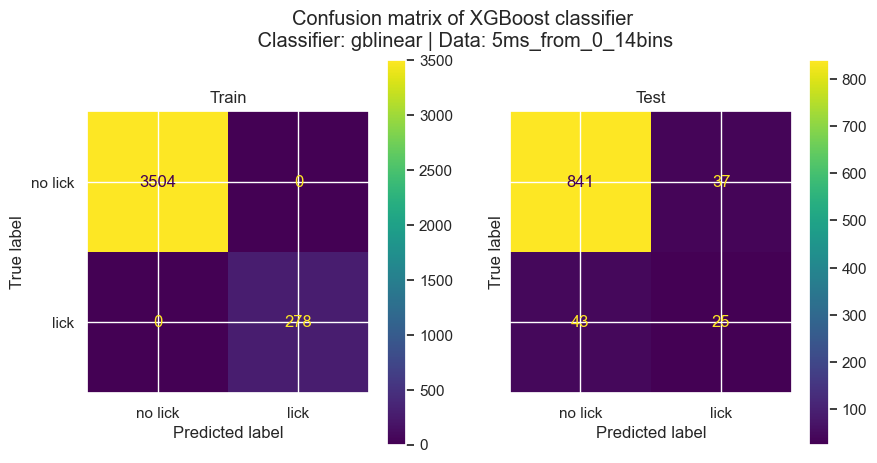

Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.509 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[851  27]
 [ 40  28]]


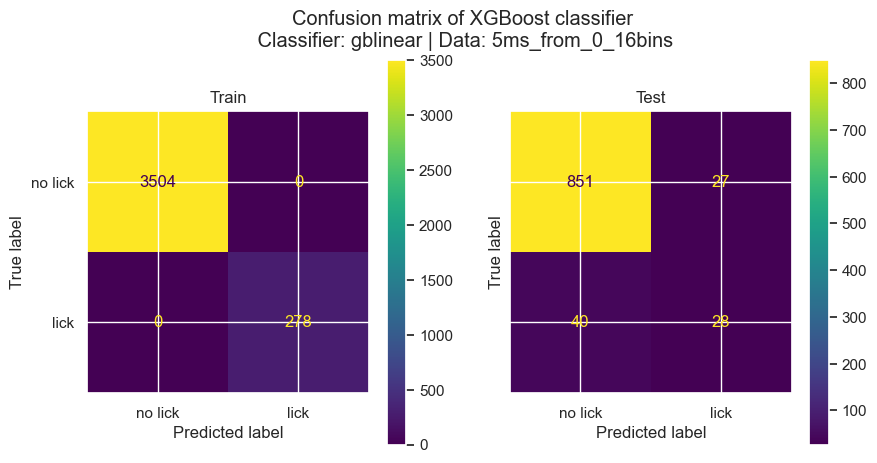

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.543 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 43  25]]


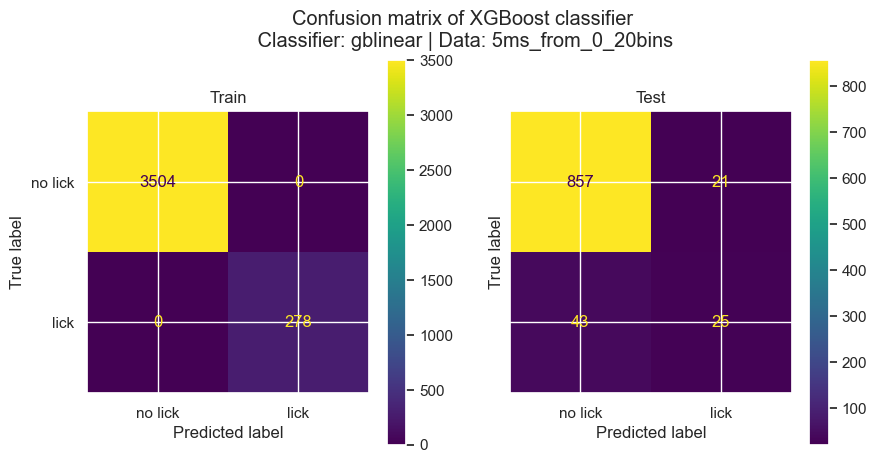

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.595 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 46  22]]


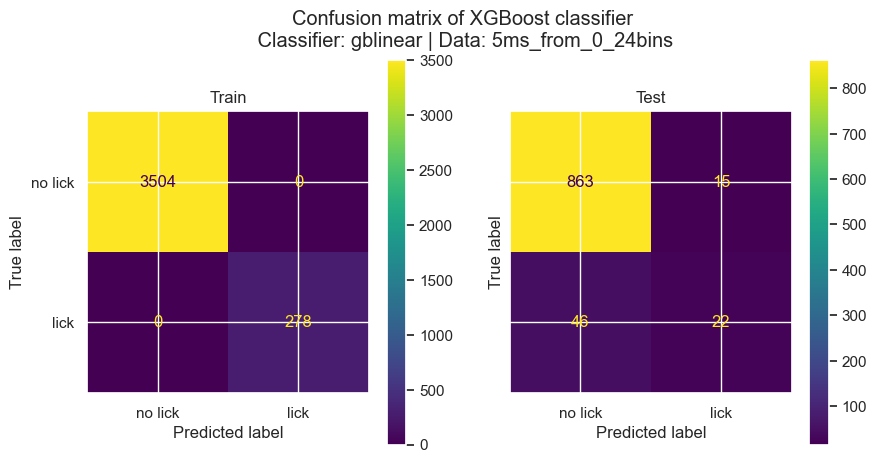

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.535 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[858  20]
 [ 45  23]]


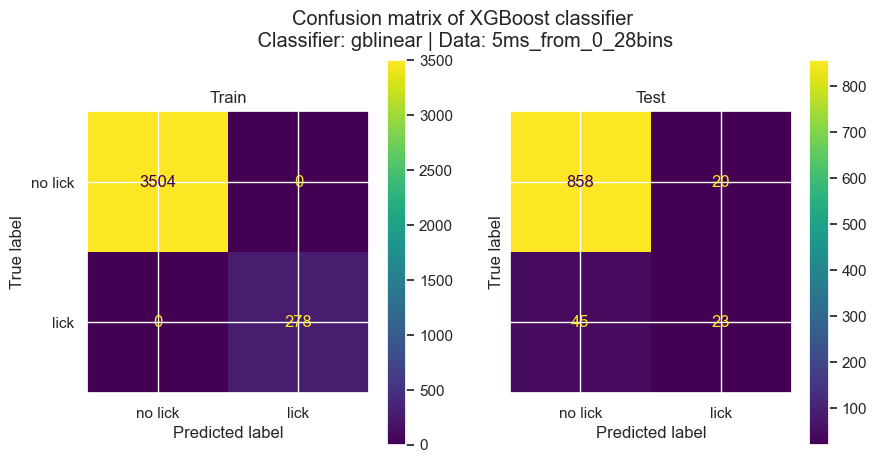

Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.585 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[861  17]
 [ 44  24]]


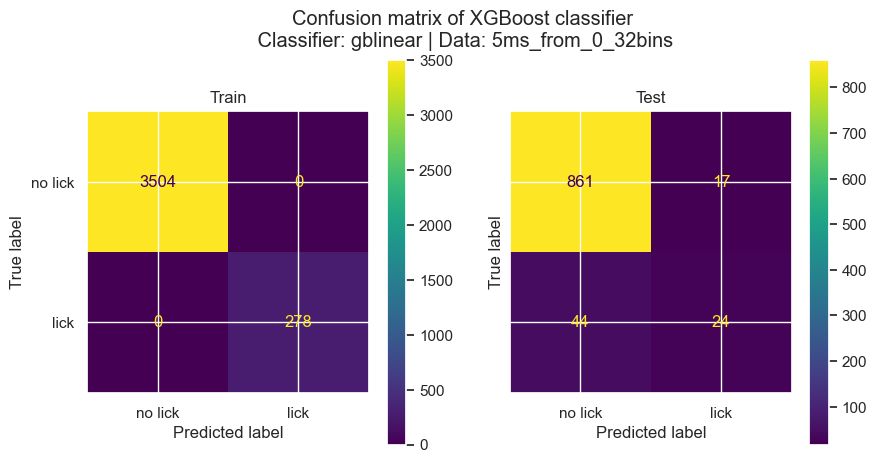

Accuracy: train: 1.000 test: 0.945
TP / (TP + FP): train: 1.000 test: 0.786 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[872   6]
 [ 46  22]]


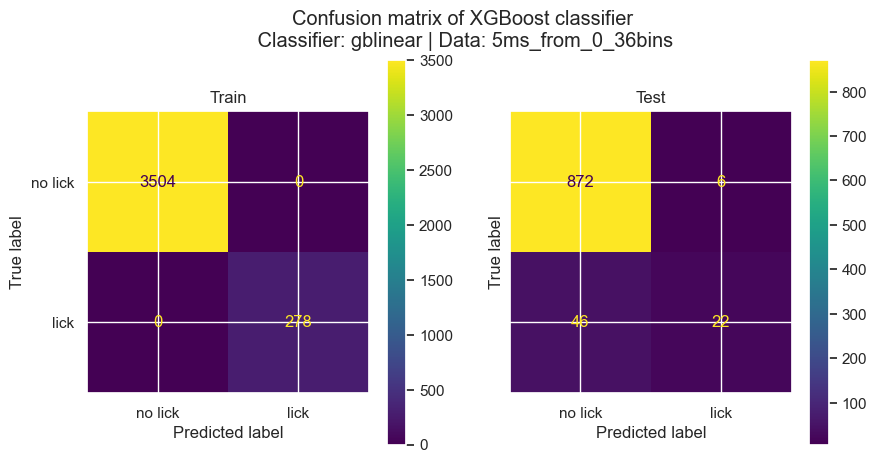

Accuracy: train: 1.000 test: 0.946
TP / (TP + FP): train: 1.000 test: 0.730 
TP / (TP + FN): train: 1.000 test: 0.397 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 41  27]]


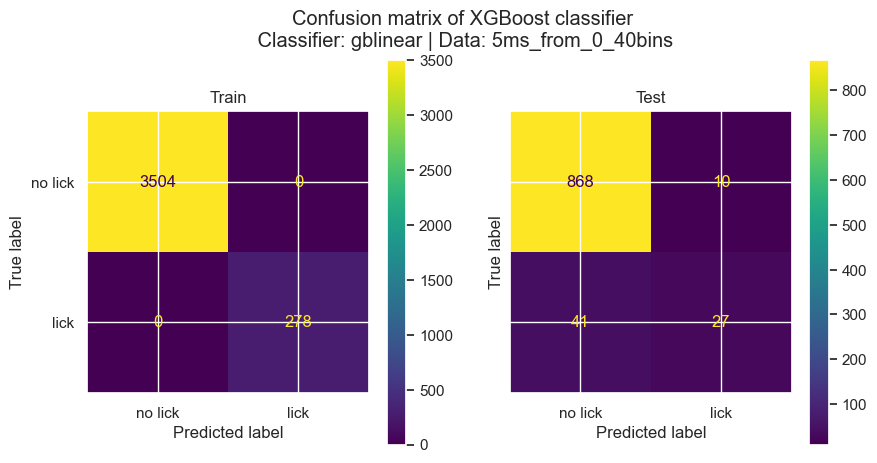

Accuracy: train: 0.941 test: 0.899
TP / (TP + FP): train: 0.739 test: 0.132 
TP / (TP + FN): train: 0.739 test: 0.074 
train_confmat
 [[3474   30]
 [ 193   85]]
test_confmat
 [[845  33]
 [ 63   5]]


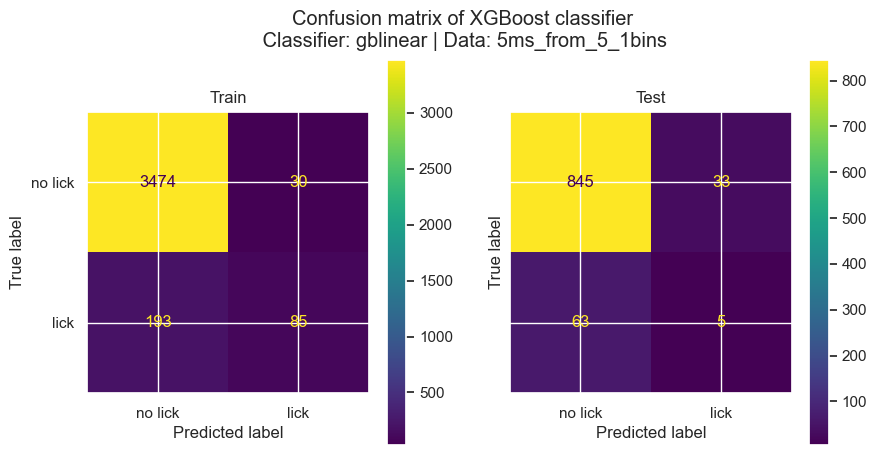

Accuracy: train: 0.984 test: 0.858
TP / (TP + FP): train: 0.958 test: 0.125 
TP / (TP + FN): train: 0.958 test: 0.162 
train_confmat
 [[3494   10]
 [  51  227]]
test_confmat
 [[801  77]
 [ 57  11]]


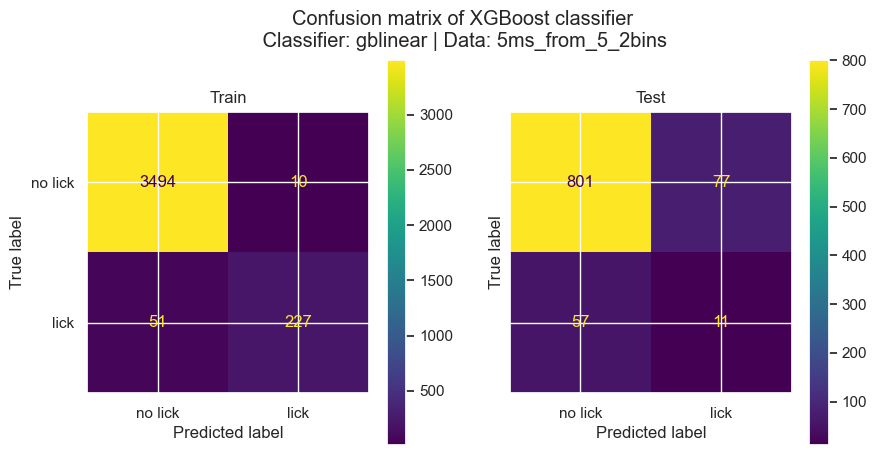

Accuracy: train: 1.000 test: 0.852
TP / (TP + FP): train: 1.000 test: 0.133 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[793  85]
 [ 55  13]]


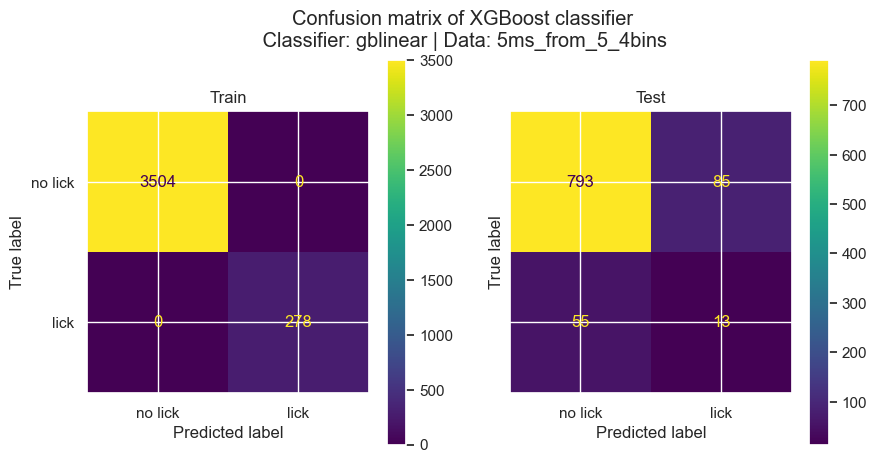

Accuracy: train: 1.000 test: 0.878
TP / (TP + FP): train: 1.000 test: 0.210 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[814  64]
 [ 51  17]]


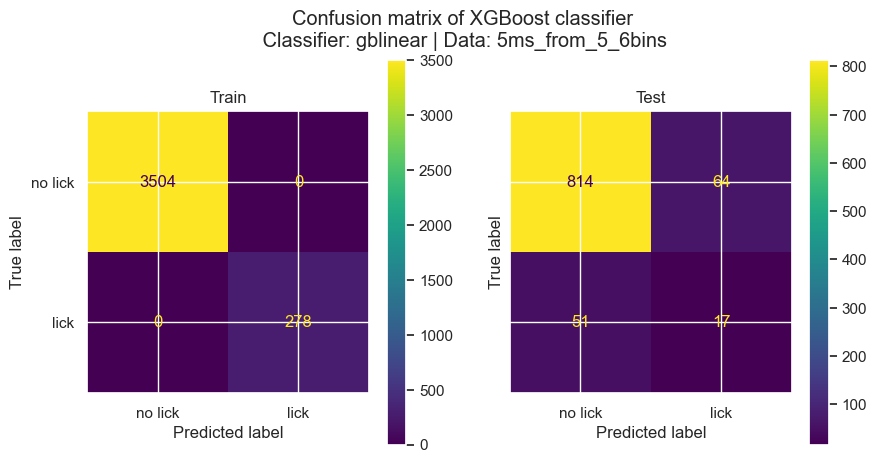

Accuracy: train: 1.000 test: 0.893
TP / (TP + FP): train: 1.000 test: 0.274 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[825  53]
 [ 48  20]]


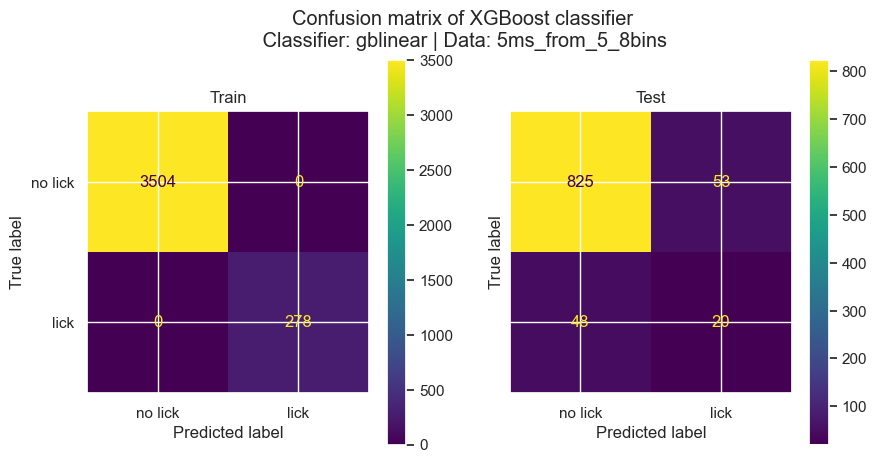

Accuracy: train: 1.000 test: 0.910
TP / (TP + FP): train: 1.000 test: 0.345 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[842  36]
 [ 49  19]]


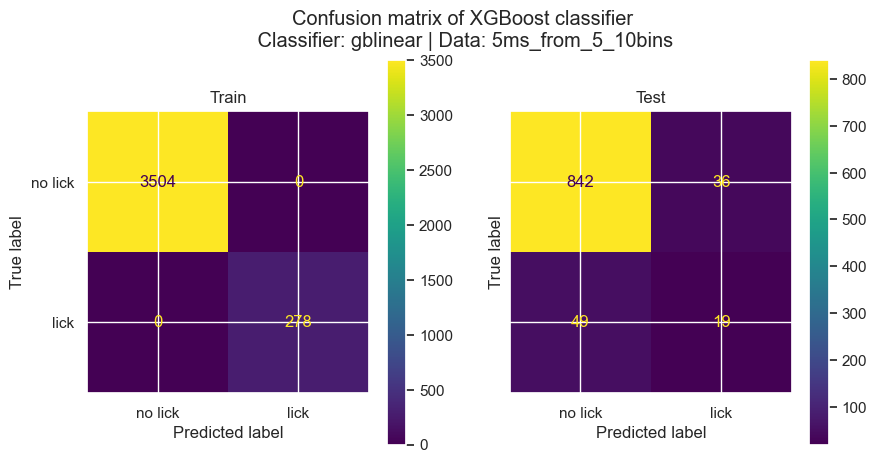

Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.447 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[852  26]
 [ 47  21]]


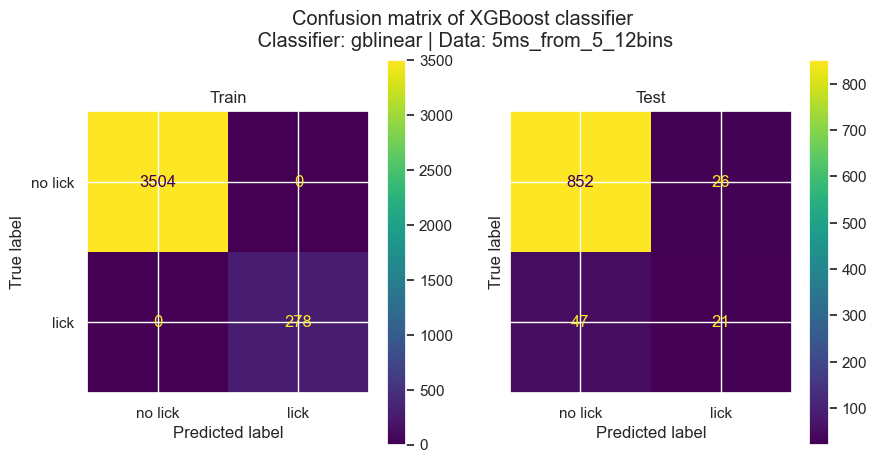

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.520 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[854  24]
 [ 42  26]]


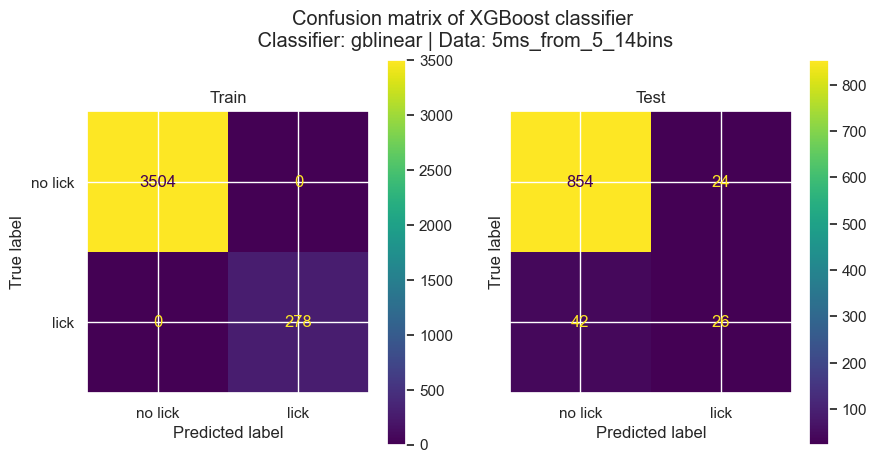

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.480 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[852  26]
 [ 44  24]]


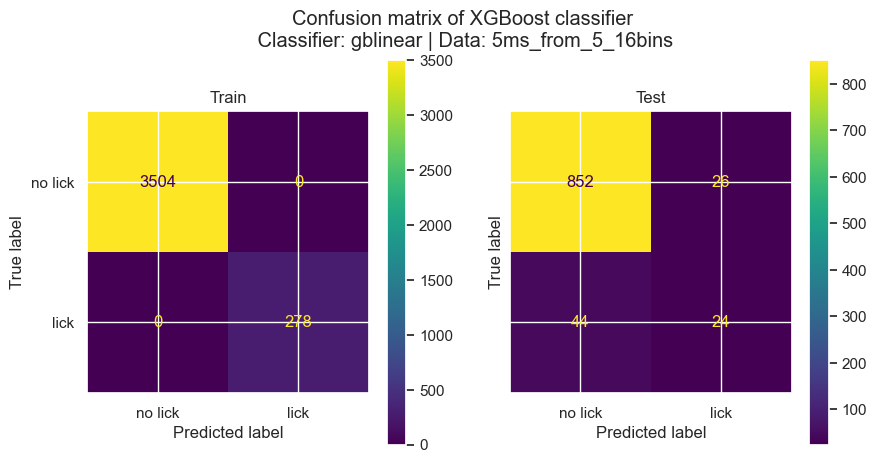

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.523 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 45  23]]


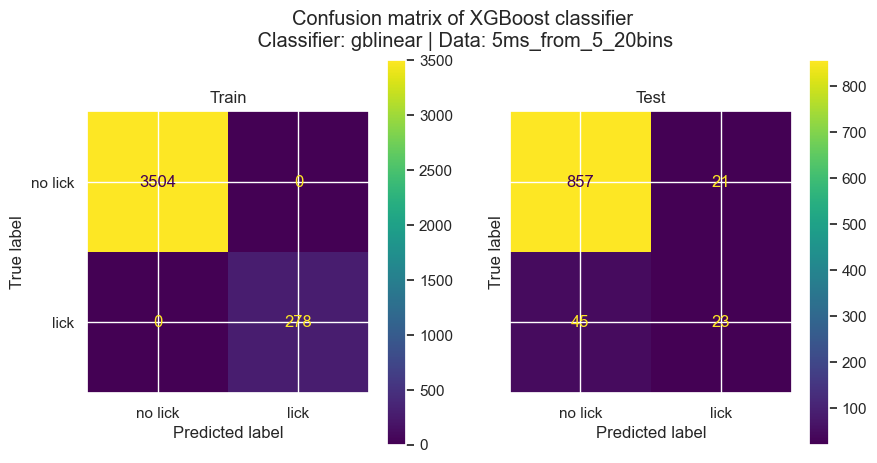

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 47  21]]


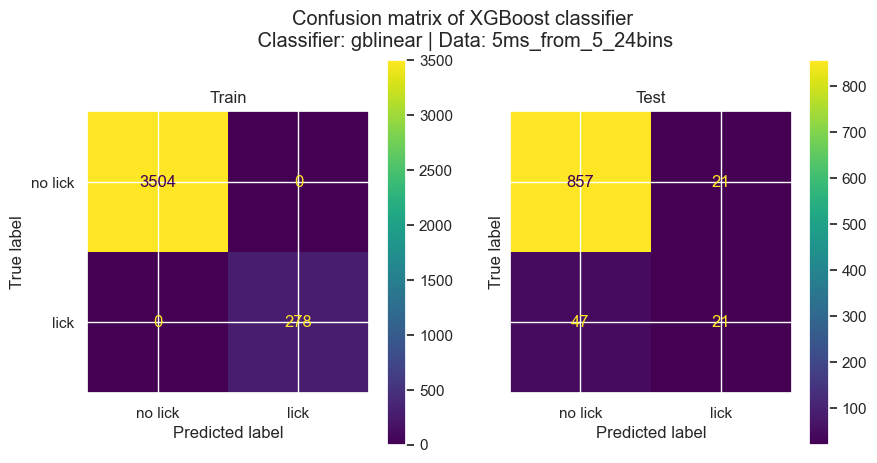

Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.625 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 43  25]]


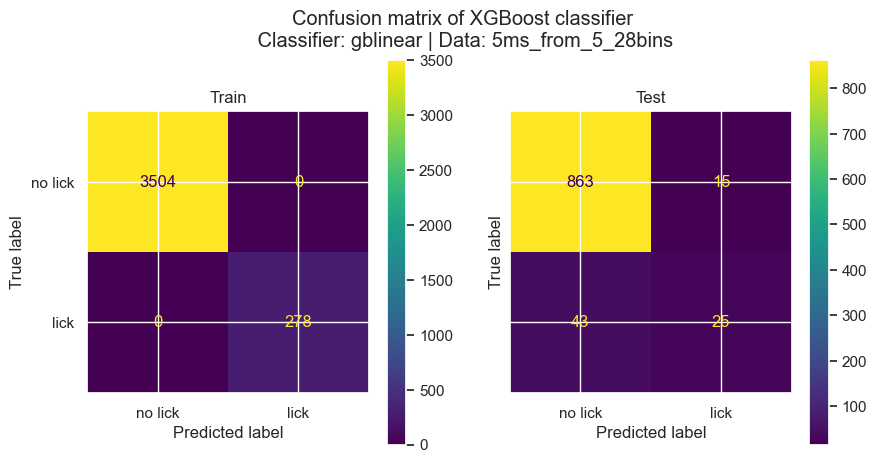

Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.558 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 44  24]]


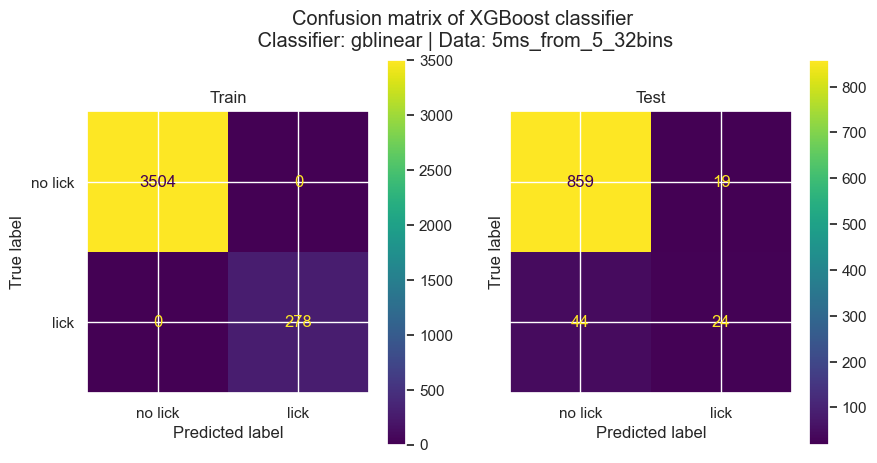

Accuracy: train: 1.000 test: 0.944
TP / (TP + FP): train: 1.000 test: 0.692 
TP / (TP + FN): train: 1.000 test: 0.397 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[866  12]
 [ 41  27]]


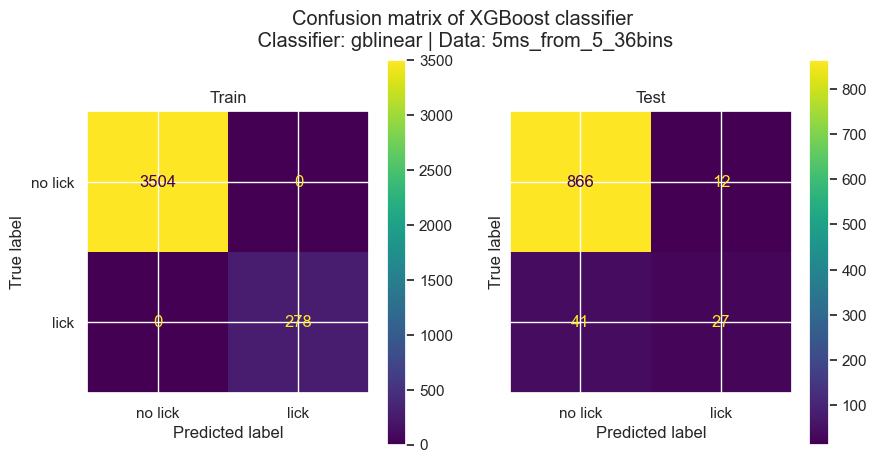

Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.632 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[864  14]
 [ 44  24]]


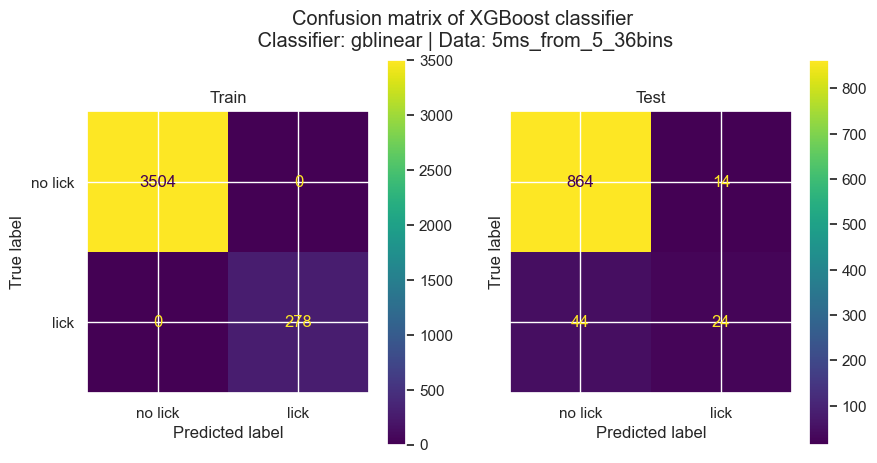

Accuracy: train: 0.945 test: 0.905
TP / (TP + FP): train: 0.780 test: 0.238 
TP / (TP + FN): train: 0.780 test: 0.147 
train_confmat
 [[3476   28]
 [ 179   99]]
test_confmat
 [[846  32]
 [ 58  10]]


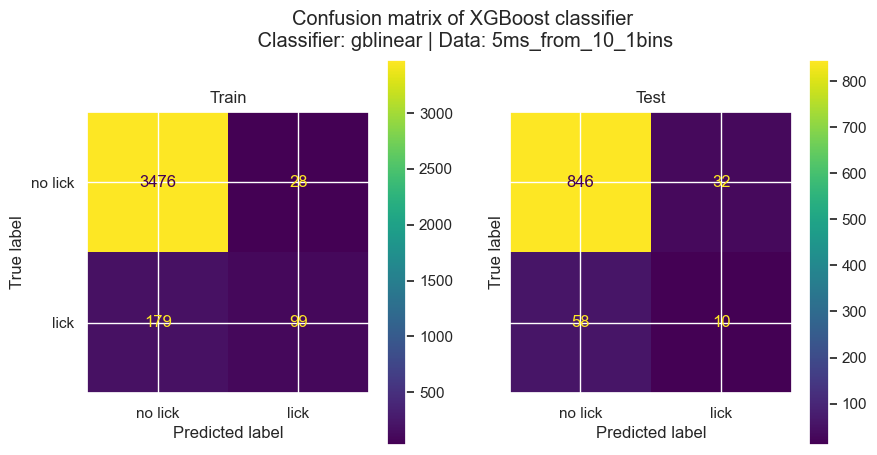

Accuracy: train: 0.998 test: 0.879
TP / (TP + FP): train: 0.996 test: 0.250 
TP / (TP + FN): train: 0.996 test: 0.338 
train_confmat
 [[3503    1]
 [   5  273]]
test_confmat
 [[809  69]
 [ 45  23]]


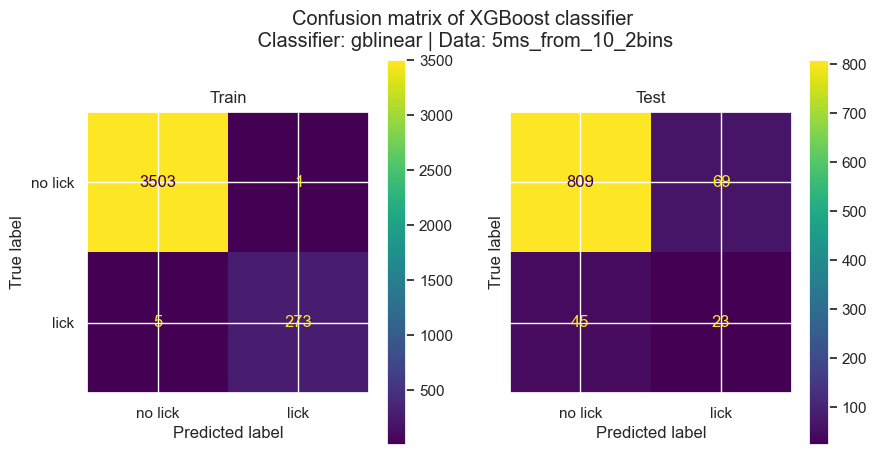

Accuracy: train: 1.000 test: 0.892
TP / (TP + FP): train: 1.000 test: 0.311 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[816  62]
 [ 40  28]]


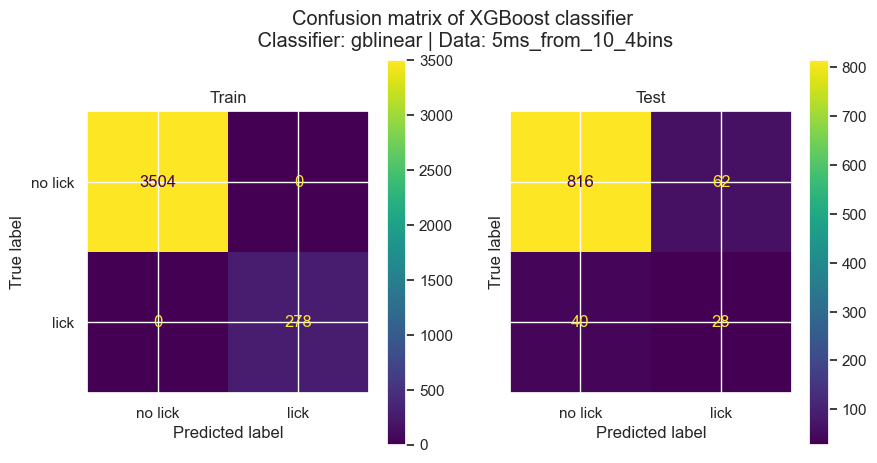

Accuracy: train: 1.000 test: 0.894
TP / (TP + FP): train: 1.000 test: 0.318 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[818  60]
 [ 40  28]]


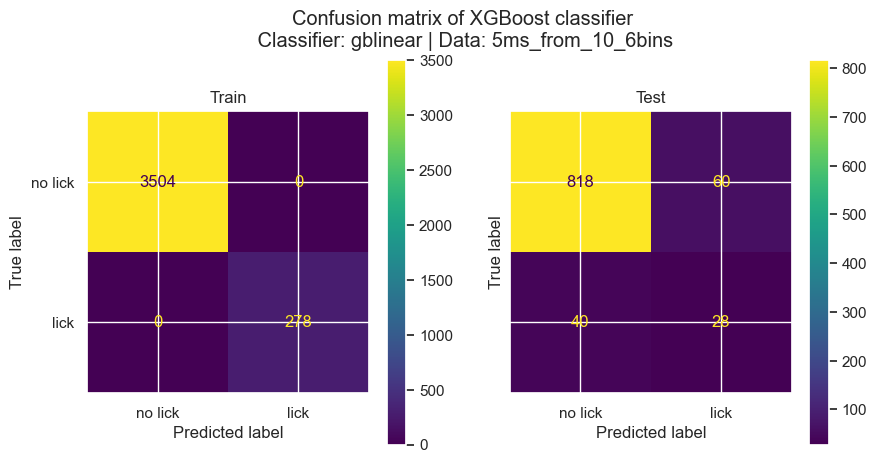

Accuracy: train: 1.000 test: 0.908
TP / (TP + FP): train: 1.000 test: 0.366 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[833  45]
 [ 42  26]]


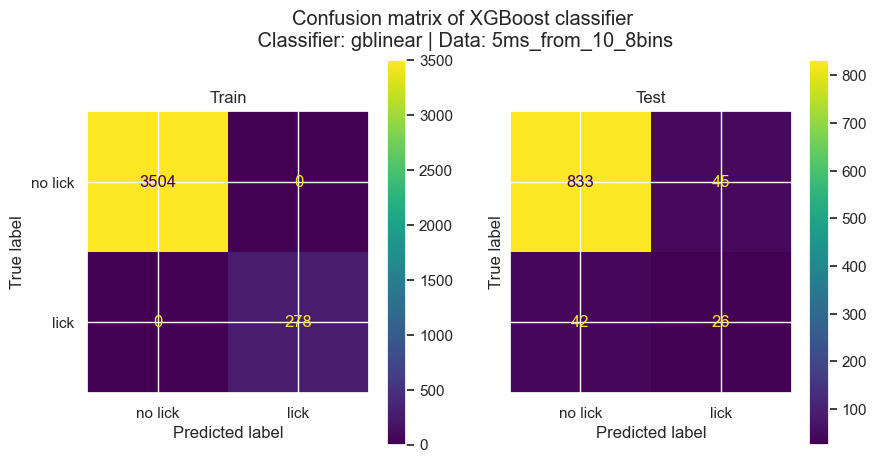

Accuracy: train: 1.000 test: 0.911
TP / (TP + FP): train: 1.000 test: 0.379 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[837  41]
 [ 43  25]]


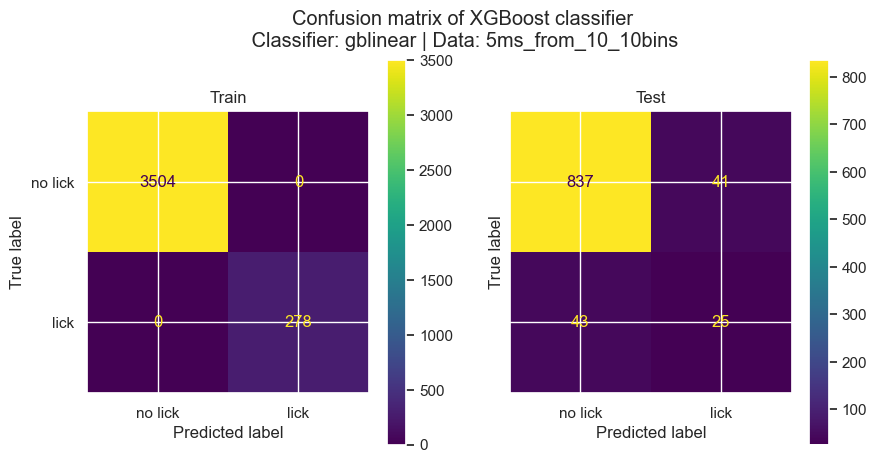

Accuracy: train: 1.000 test: 0.916
TP / (TP + FP): train: 1.000 test: 0.404 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[844  34]
 [ 45  23]]


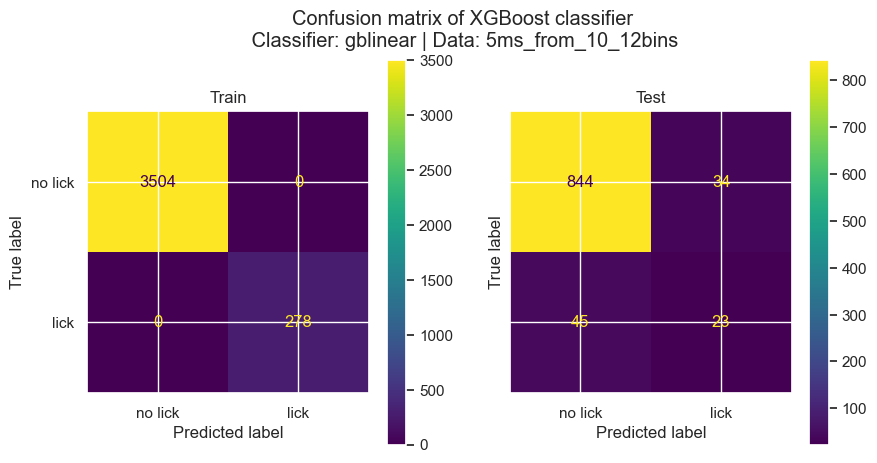

Accuracy: train: 1.000 test: 0.915
TP / (TP + FP): train: 1.000 test: 0.397 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[843  35]
 [ 45  23]]


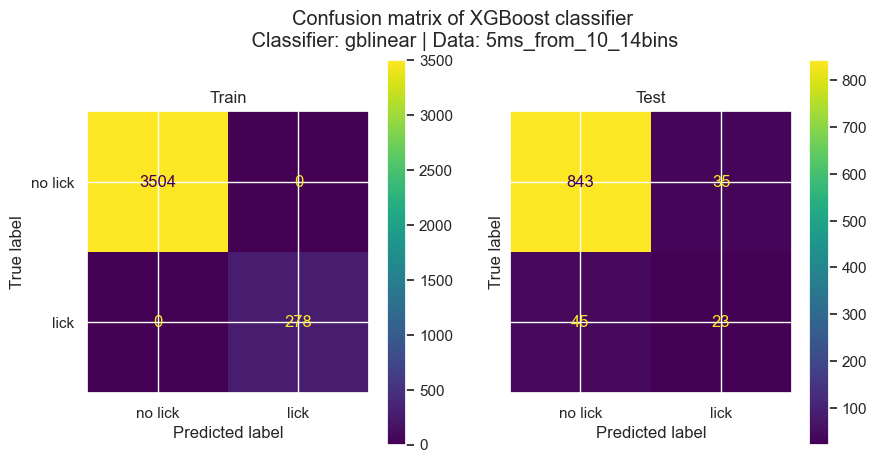

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.467 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[854  24]
 [ 47  21]]


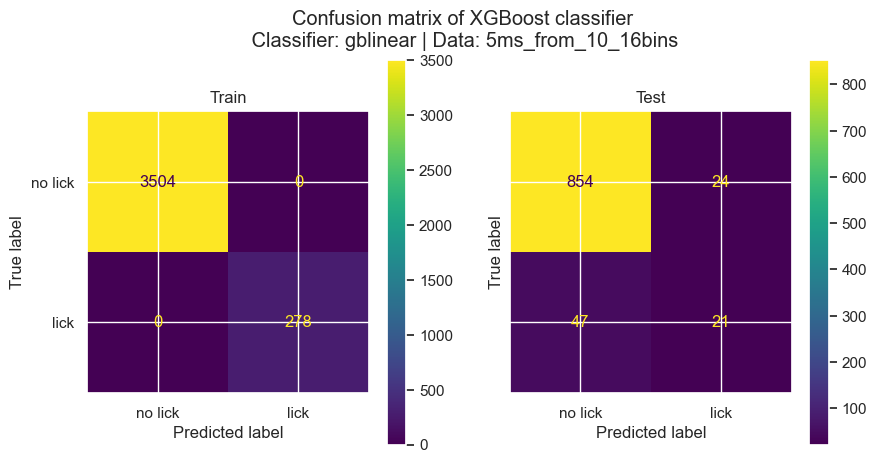

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.545 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[858  20]
 [ 44  24]]


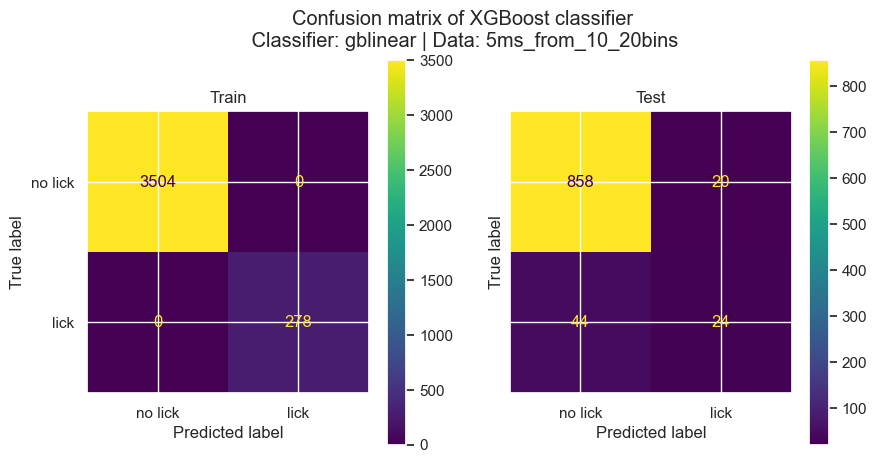

Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.545 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 50  18]]


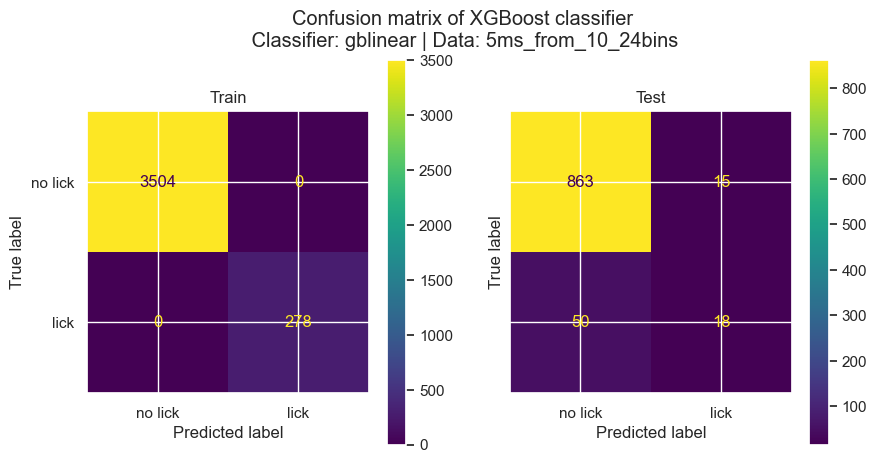

Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.548 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 45  23]]


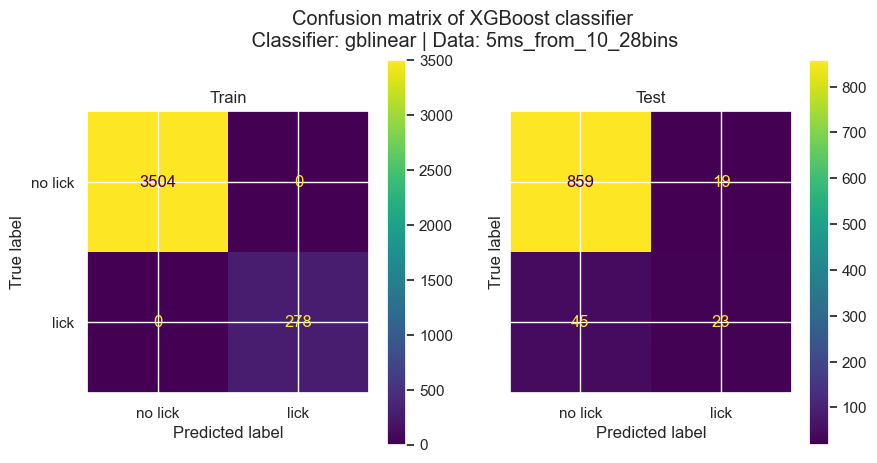

Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 0.562 
TP / (TP + FN): train: 1.000 test: 0.397 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 41  27]]


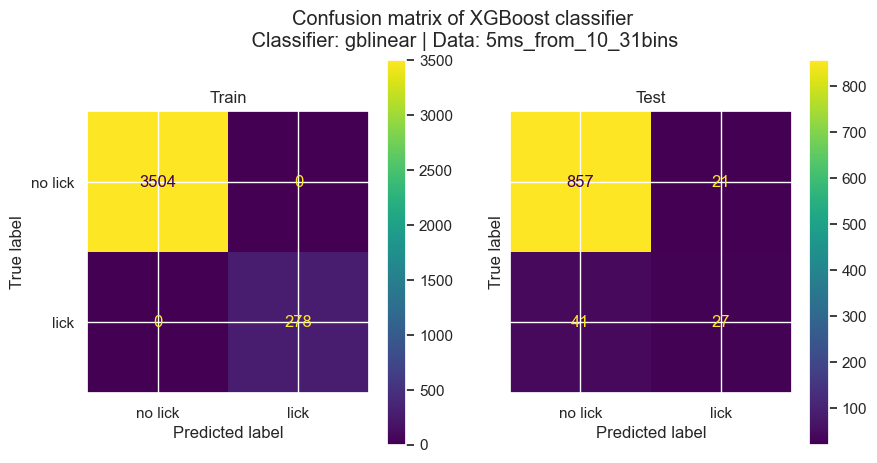

Accuracy: train: 0.937 test: 0.910
TP / (TP + FP): train: 0.707 test: 0.282 
TP / (TP + FN): train: 0.707 test: 0.162 
train_confmat
 [[3477   27]
 [ 213   65]]
test_confmat
 [[850  28]
 [ 57  11]]


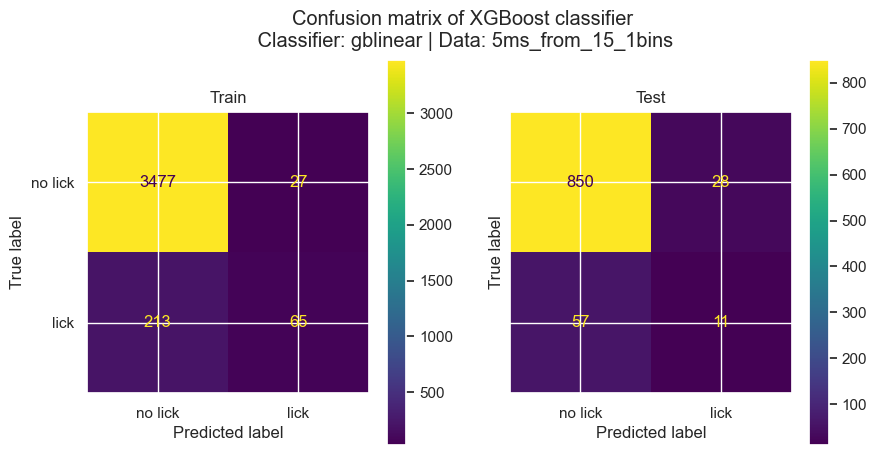

Accuracy: train: 0.996 test: 0.862
TP / (TP + FP): train: 0.993 test: 0.211 
TP / (TP + FN): train: 0.993 test: 0.338 
train_confmat
 [[3502    2]
 [  13  265]]
test_confmat
 [[792  86]
 [ 45  23]]


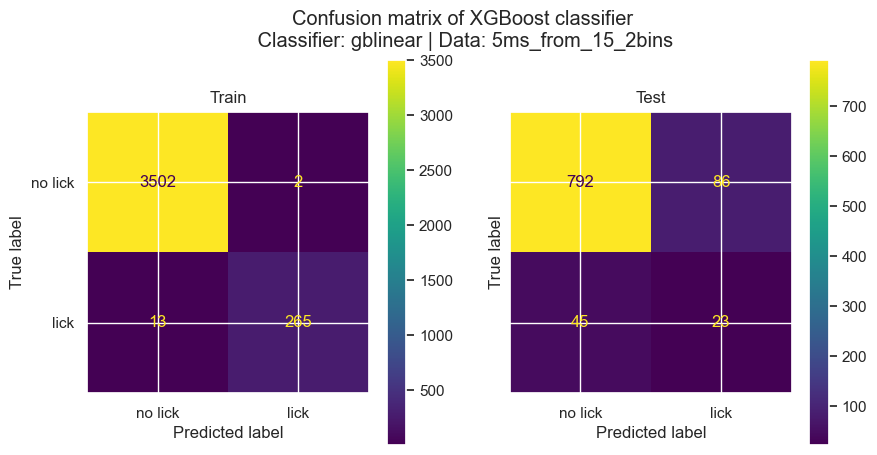

Accuracy: train: 1.000 test: 0.876
TP / (TP + FP): train: 1.000 test: 0.231 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[808  70]
 [ 47  21]]


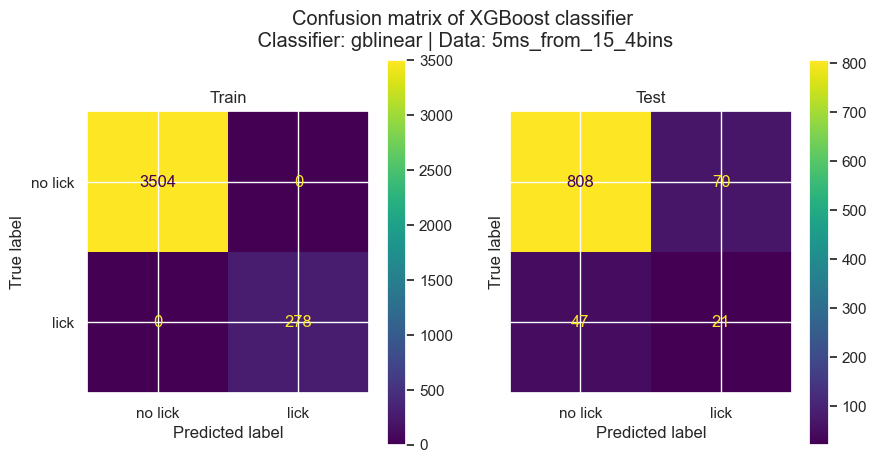

Accuracy: train: 1.000 test: 0.889
TP / (TP + FP): train: 1.000 test: 0.282 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[817  61]
 [ 44  24]]


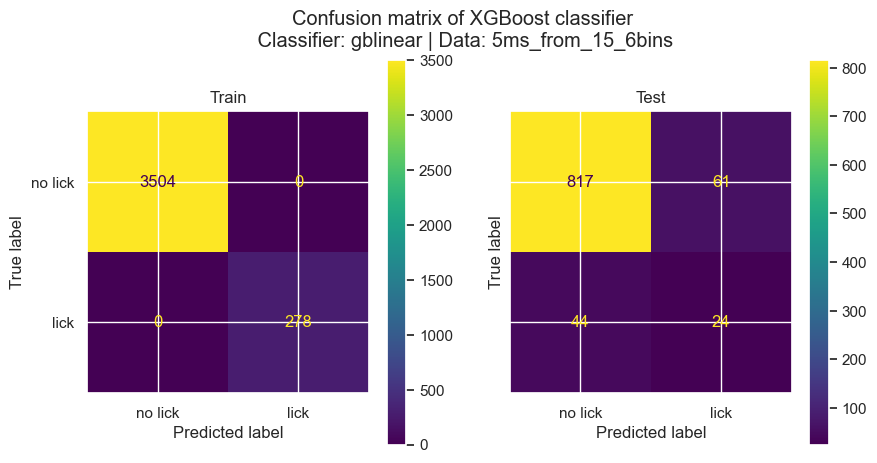

Accuracy: train: 1.000 test: 0.906
TP / (TP + FP): train: 1.000 test: 0.322 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[838  40]
 [ 49  19]]


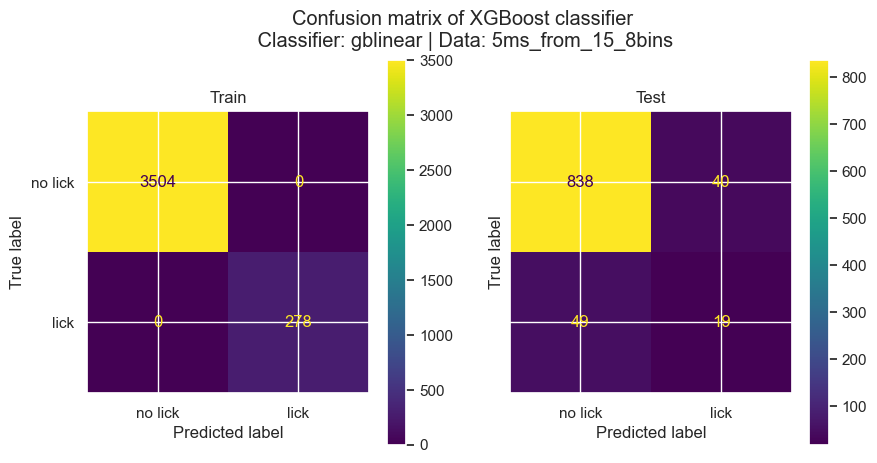

Accuracy: train: 1.000 test: 0.919
TP / (TP + FP): train: 1.000 test: 0.421 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[845  33]
 [ 44  24]]


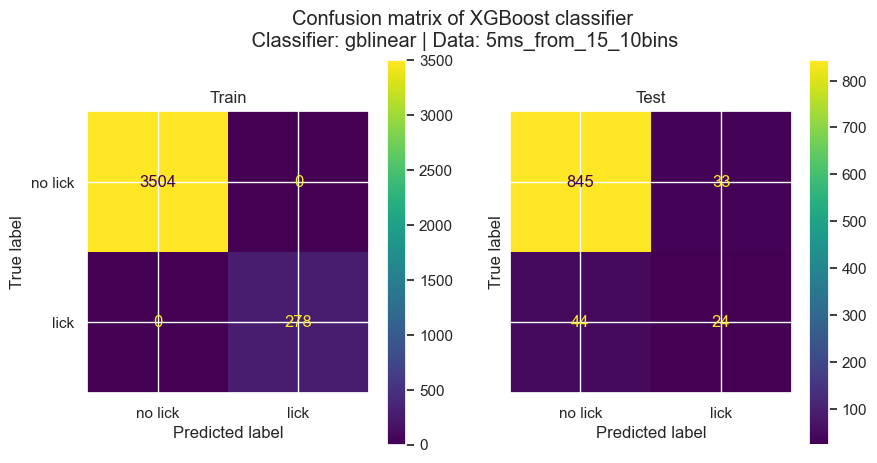

Accuracy: train: 1.000 test: 0.914
TP / (TP + FP): train: 1.000 test: 0.393 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[841  37]
 [ 44  24]]


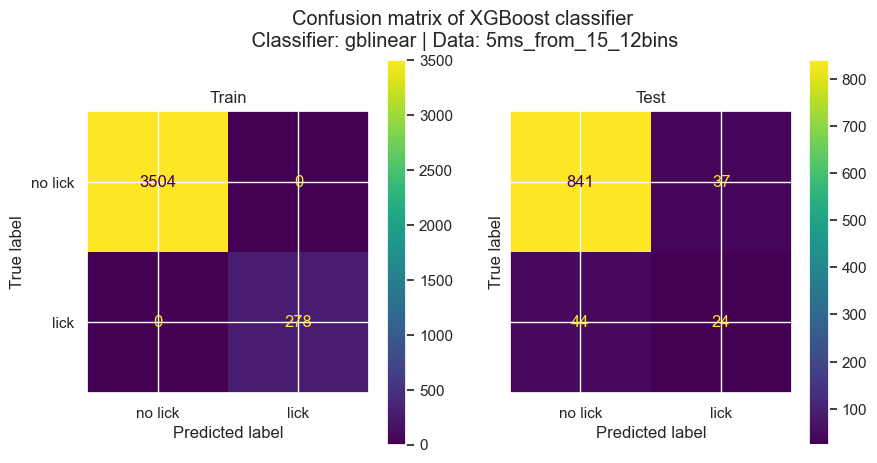

Accuracy: train: 1.000 test: 0.914
TP / (TP + FP): train: 1.000 test: 0.382 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[844  34]
 [ 47  21]]


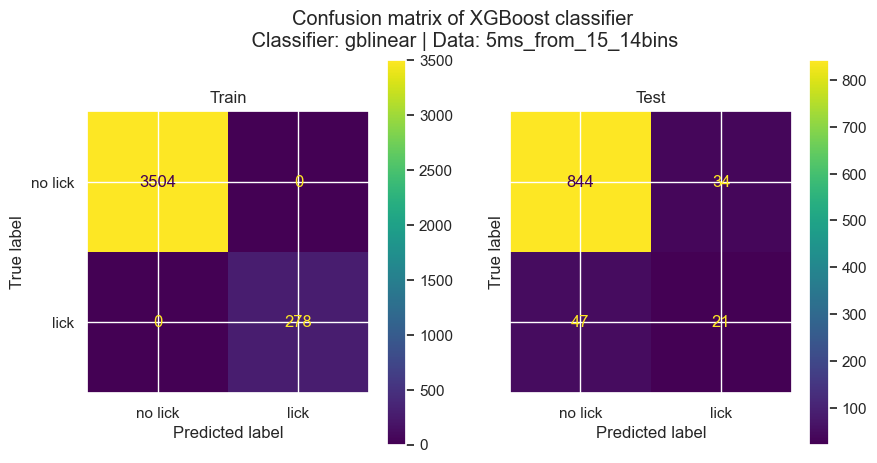

Accuracy: train: 1.000 test: 0.911
TP / (TP + FP): train: 1.000 test: 0.357 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[842  36]
 [ 48  20]]


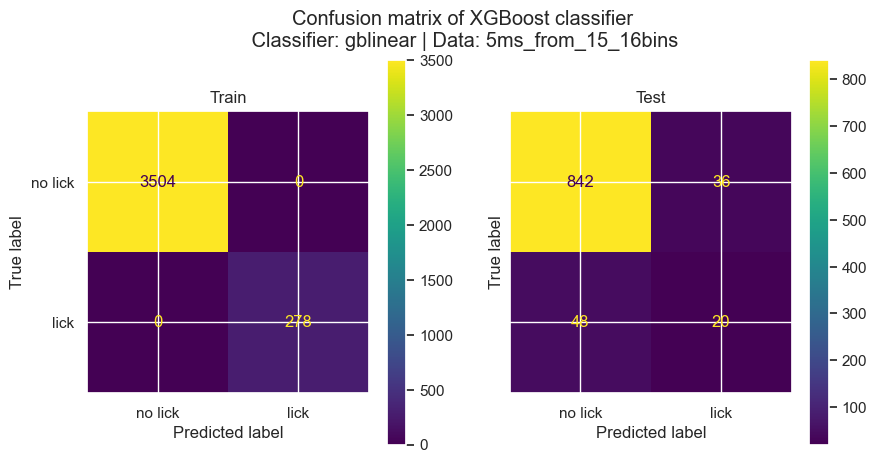

Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.476 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[856  22]
 [ 48  20]]


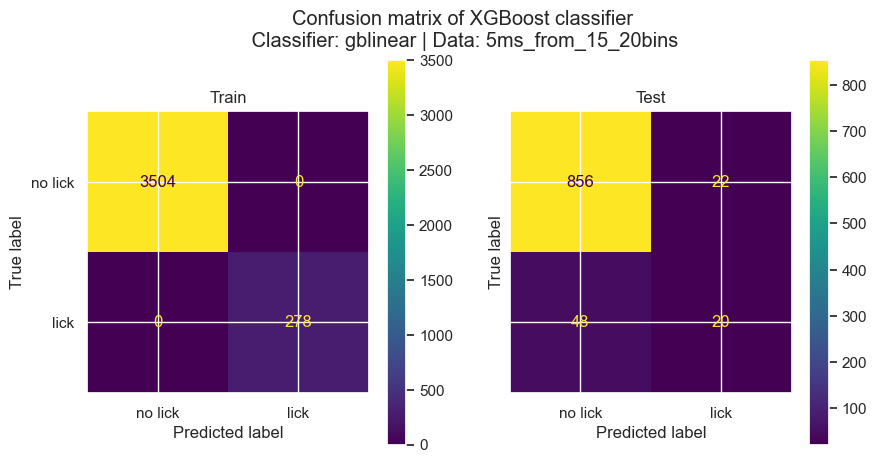

Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.460 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[851  27]
 [ 45  23]]


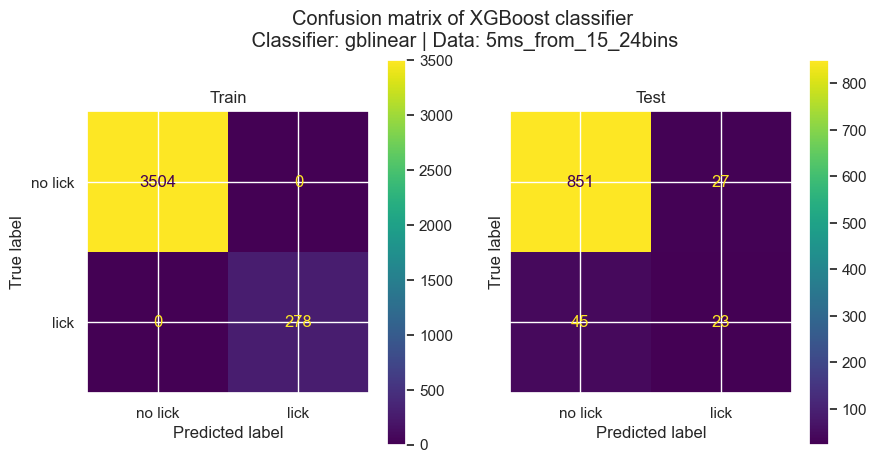

Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[855  23]
 [ 45  23]]


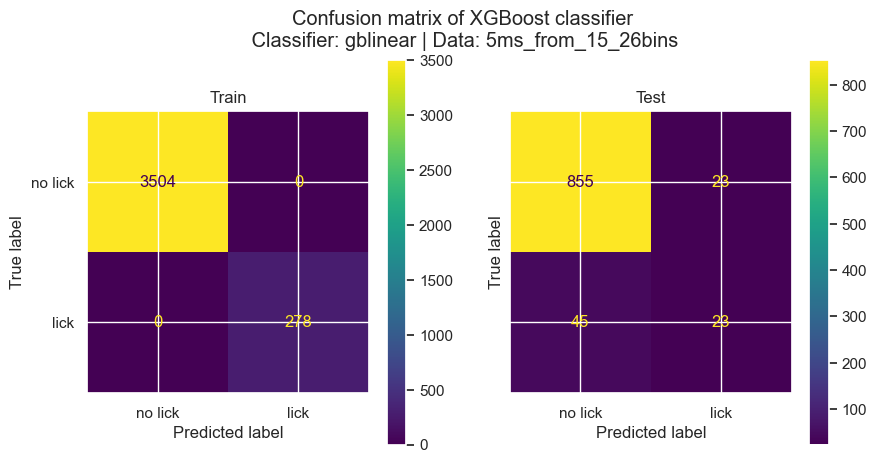

Accuracy: train: 0.941 test: 0.910
TP / (TP + FP): train: 0.743 test: 0.327 
TP / (TP + FN): train: 0.743 test: 0.235 
train_confmat
 [[3476   28]
 [ 197   81]]
test_confmat
 [[845  33]
 [ 52  16]]


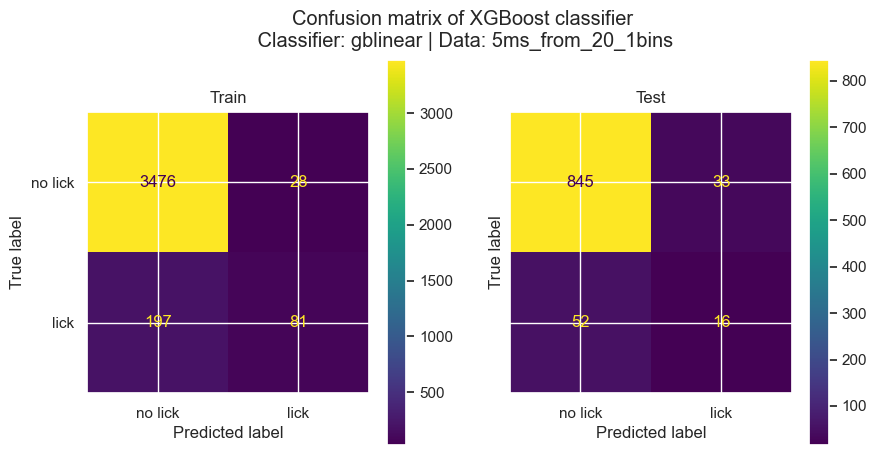

Accuracy: train: 0.998 test: 0.866
TP / (TP + FP): train: 0.996 test: 0.219 
TP / (TP + FN): train: 0.996 test: 0.338 
train_confmat
 [[3503    1]
 [   6  272]]
test_confmat
 [[796  82]
 [ 45  23]]


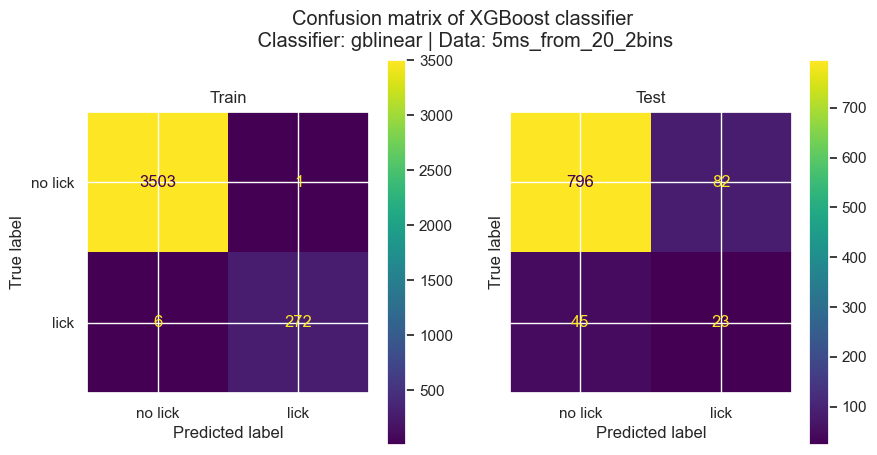

Accuracy: train: 1.000 test: 0.885
TP / (TP + FP): train: 1.000 test: 0.275 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[812  66]
 [ 43  25]]


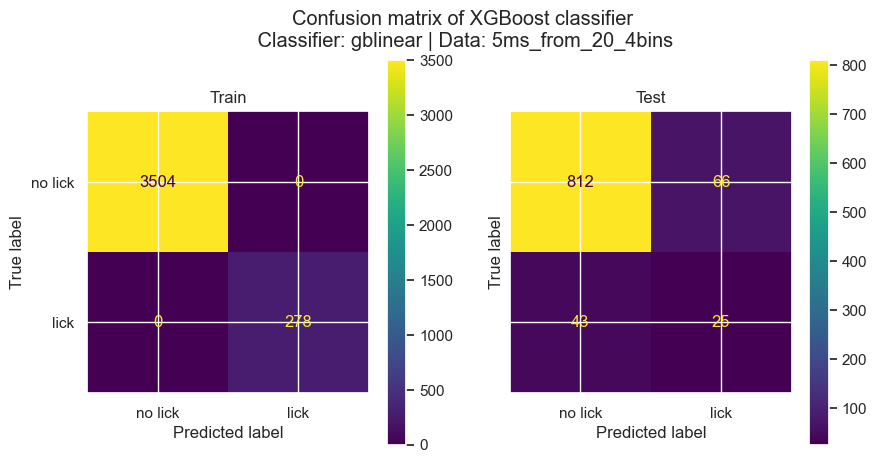

Accuracy: train: 1.000 test: 0.883
TP / (TP + FP): train: 1.000 test: 0.213 
TP / (TP + FN): train: 1.000 test: 0.235 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[819  59]
 [ 52  16]]


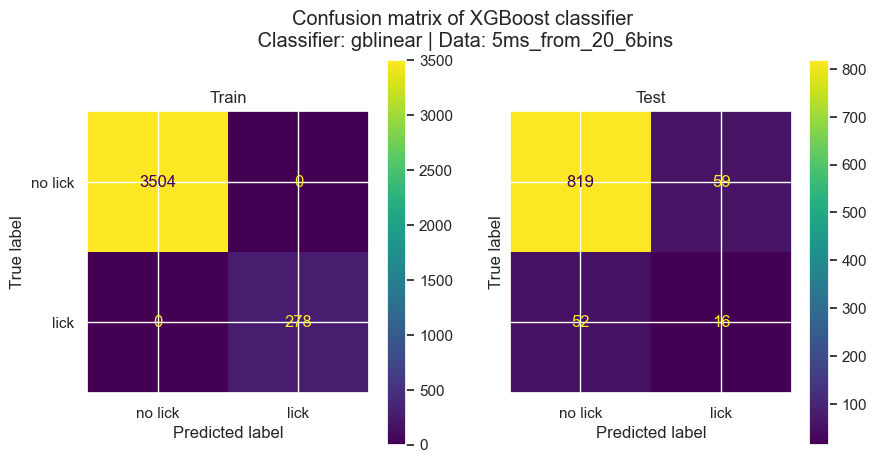

Accuracy: train: 1.000 test: 0.903
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[830  48]
 [ 44  24]]


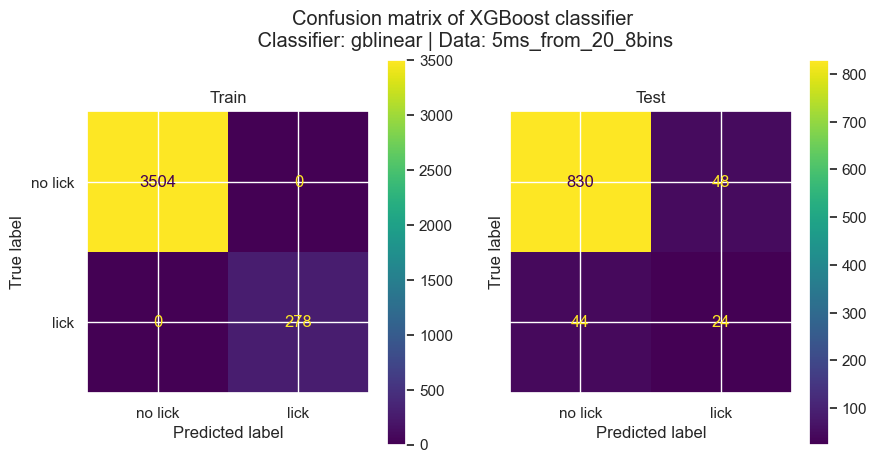

Accuracy: train: 1.000 test: 0.910
TP / (TP + FP): train: 1.000 test: 0.361 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[839  39]
 [ 46  22]]


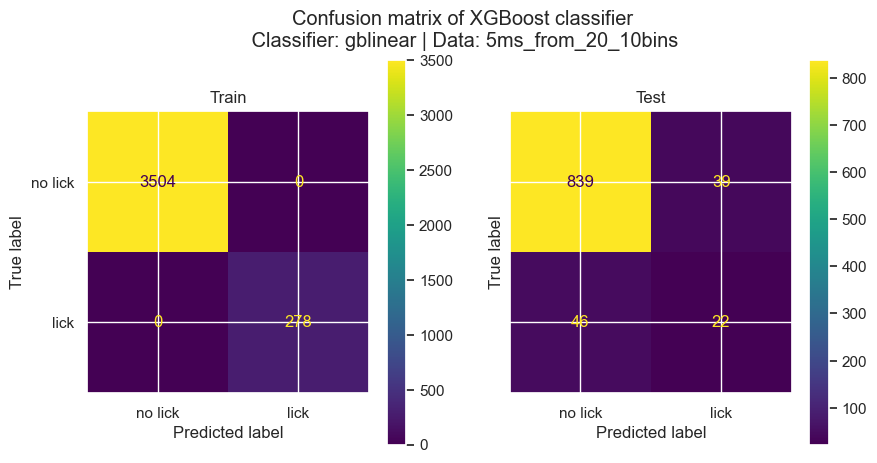

Accuracy: train: 1.000 test: 0.906
TP / (TP + FP): train: 1.000 test: 0.338 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[835  43]
 [ 46  22]]


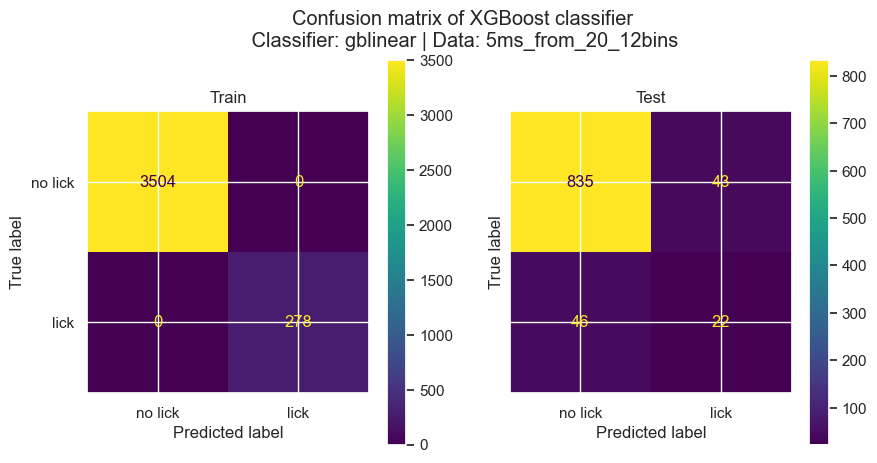

Accuracy: train: 1.000 test: 0.916
TP / (TP + FP): train: 1.000 test: 0.410 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[842  36]
 [ 43  25]]


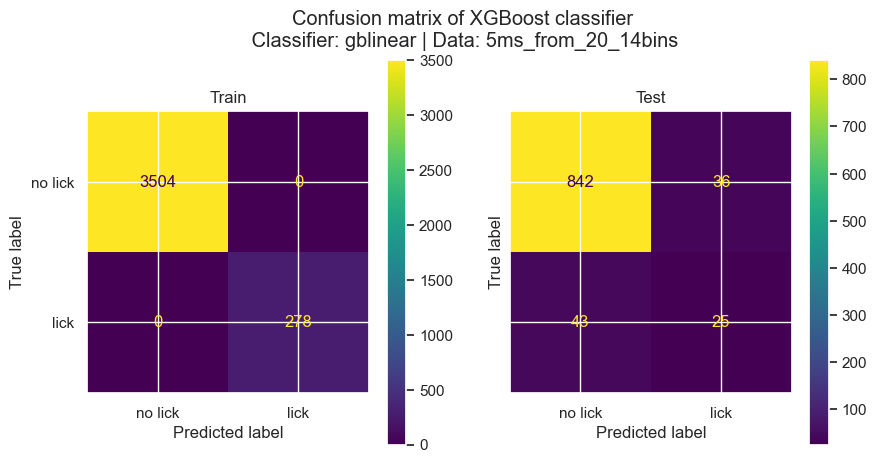

Accuracy: train: 1.000 test: 0.919
TP / (TP + FP): train: 1.000 test: 0.418 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[846  32]
 [ 45  23]]


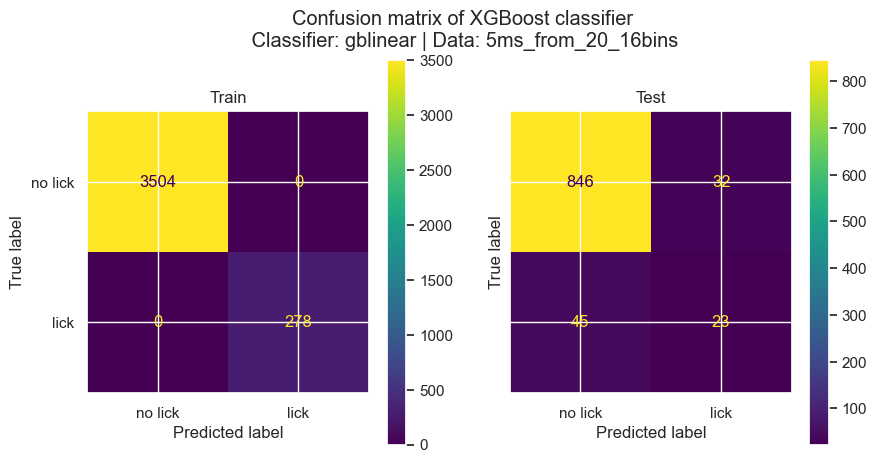

Accuracy: train: 1.000 test: 0.925
TP / (TP + FP): train: 1.000 test: 0.462 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 50  18]]


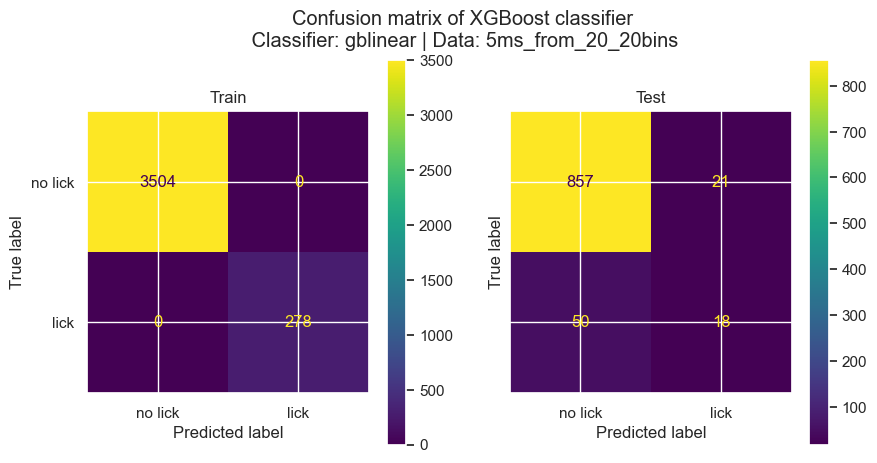

Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.528 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[861  17]
 [ 49  19]]


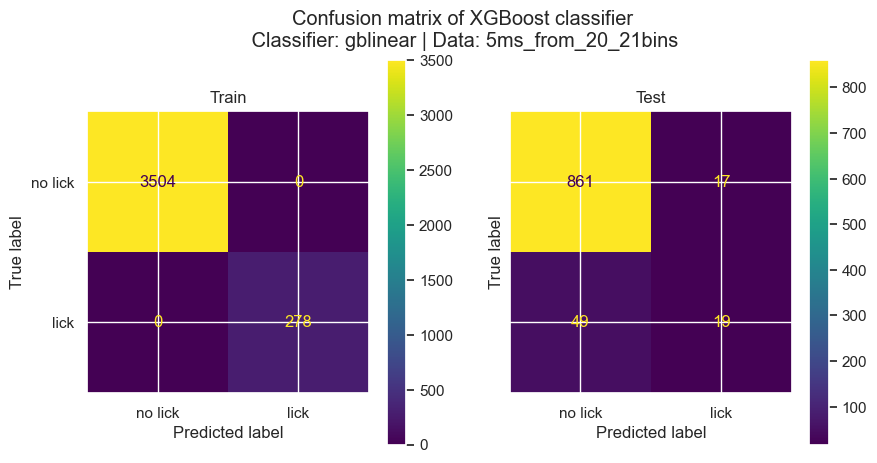

Accuracy: train: 0.939 test: 0.894
TP / (TP + FP): train: 0.733 test: 0.119 
TP / (TP + FN): train: 0.733 test: 0.074 
train_confmat
 [[3476   28]
 [ 201   77]]
test_confmat
 [[841  37]
 [ 63   5]]


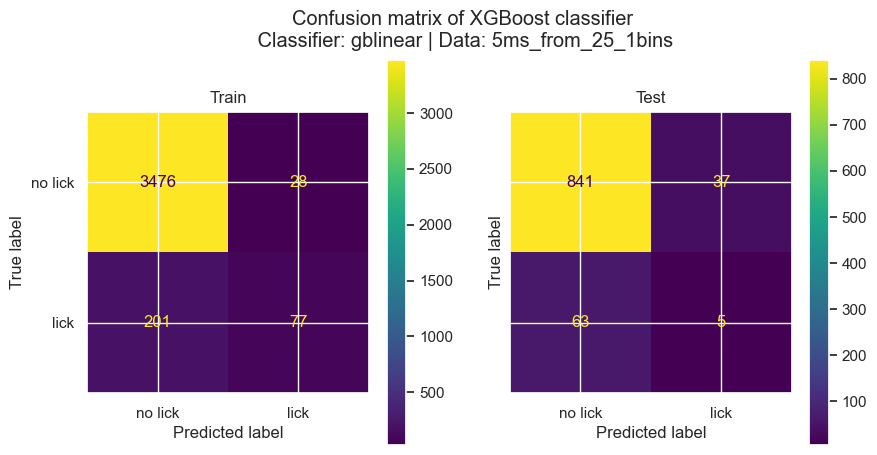

Accuracy: train: 0.984 test: 0.870
TP / (TP + FP): train: 0.962 test: 0.176 
TP / (TP + FN): train: 0.962 test: 0.221 
train_confmat
 [[3495    9]
 [  51  227]]
test_confmat
 [[808  70]
 [ 53  15]]


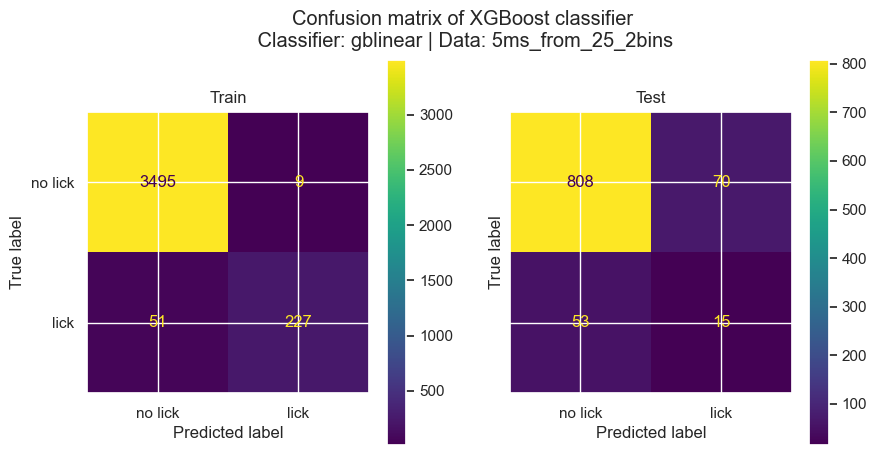

Accuracy: train: 1.000 test: 0.878
TP / (TP + FP): train: 1.000 test: 0.217 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[813  65]
 [ 50  18]]


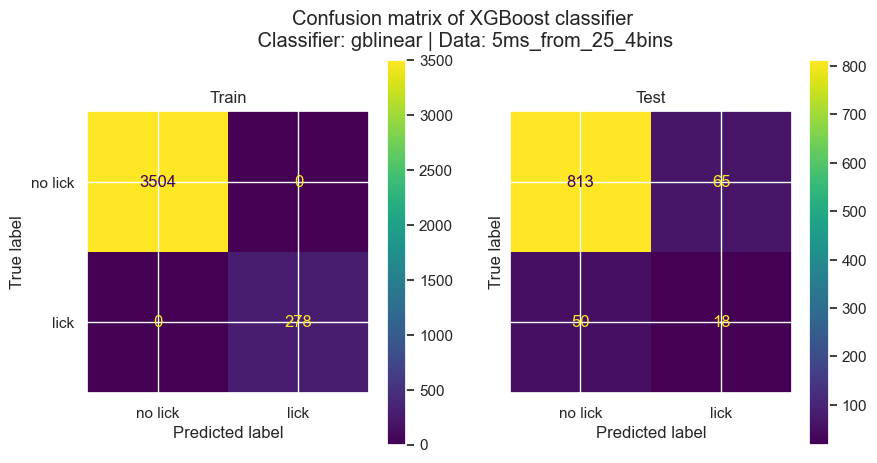

Accuracy: train: 1.000 test: 0.872
TP / (TP + FP): train: 1.000 test: 0.202 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[807  71]
 [ 50  18]]


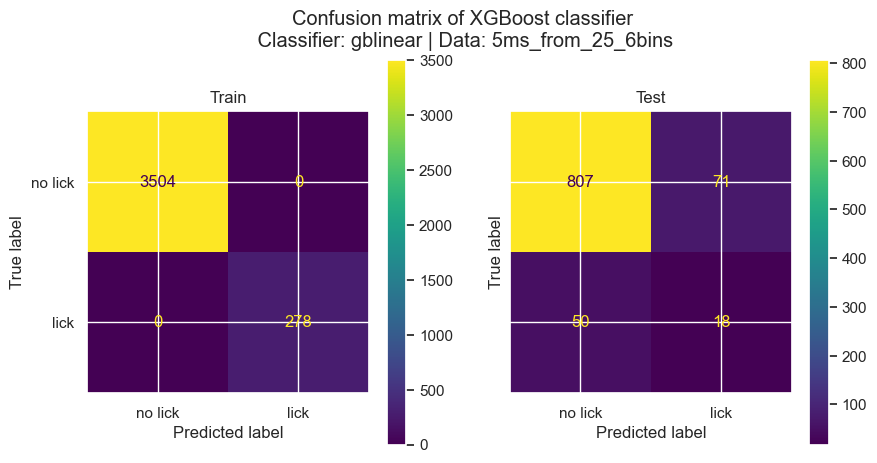

Accuracy: train: 1.000 test: 0.888
TP / (TP + FP): train: 1.000 test: 0.243 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[822  56]
 [ 50  18]]


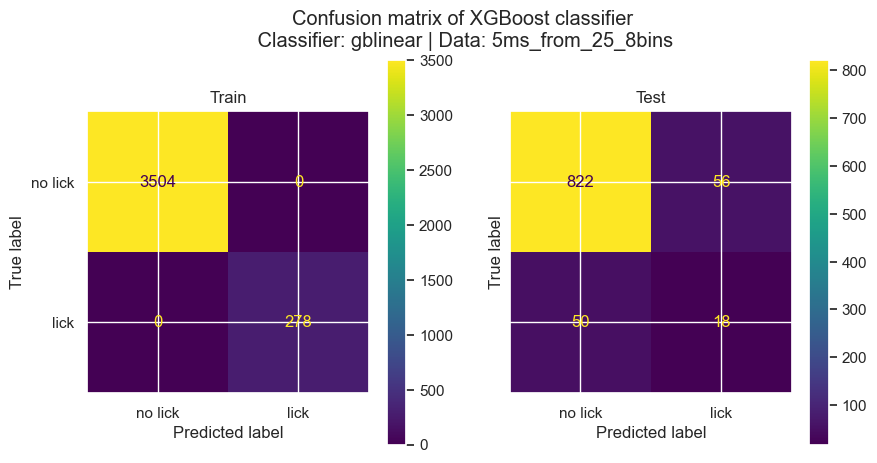

Accuracy: train: 1.000 test: 0.886
TP / (TP + FP): train: 1.000 test: 0.237 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[820  58]
 [ 50  18]]


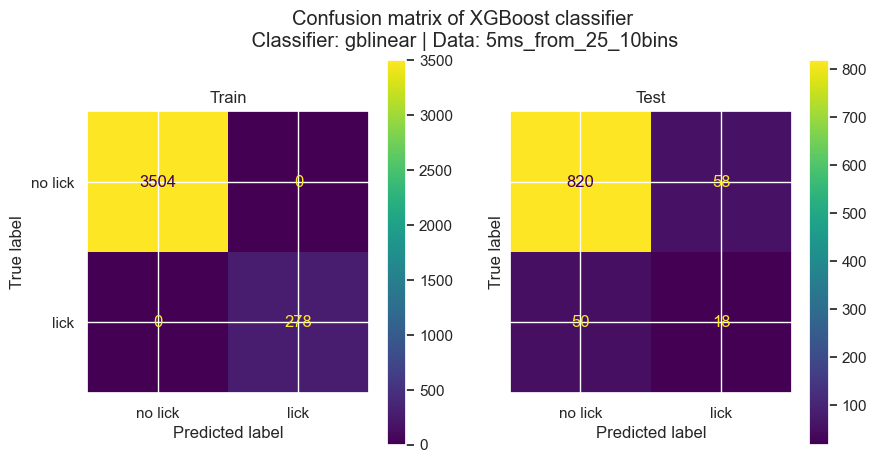

Accuracy: train: 1.000 test: 0.900
TP / (TP + FP): train: 1.000 test: 0.292 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[832  46]
 [ 49  19]]


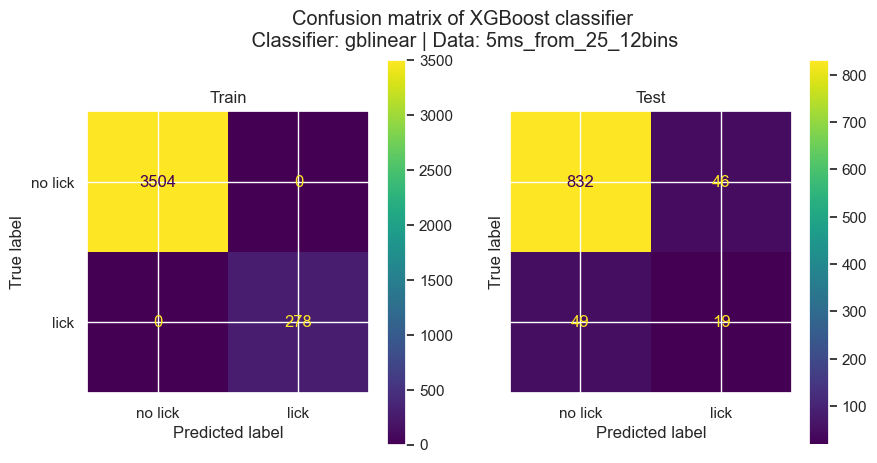

Accuracy: train: 1.000 test: 0.897
TP / (TP + FP): train: 1.000 test: 0.301 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[827  51]
 [ 46  22]]


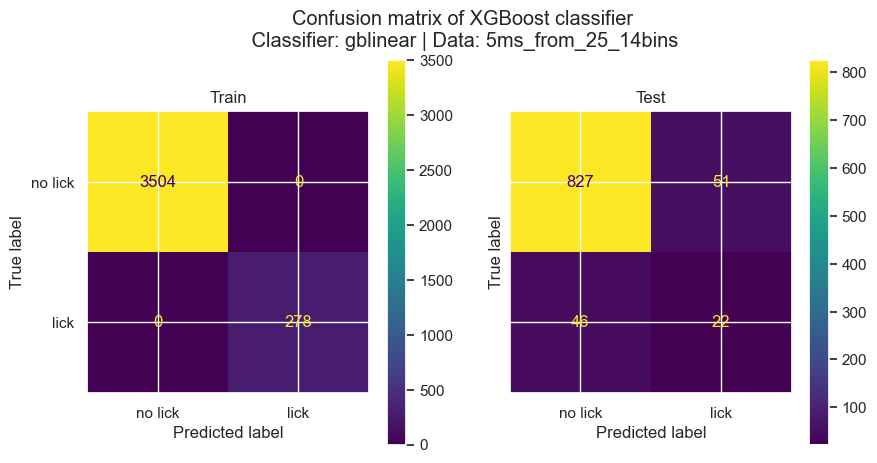

Accuracy: train: 1.000 test: 0.916
TP / (TP + FP): train: 1.000 test: 0.410 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[842  36]
 [ 43  25]]


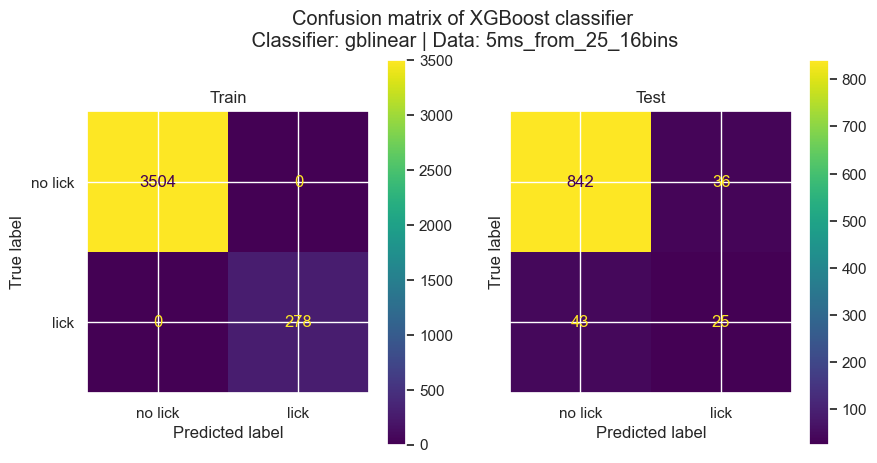

Accuracy: train: 1.000 test: 0.906
TP / (TP + FP): train: 1.000 test: 0.338 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[835  43]
 [ 46  22]]


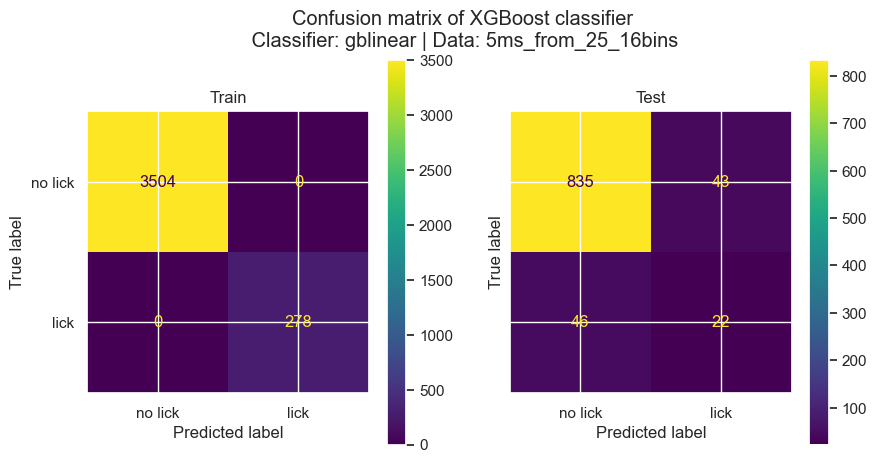

Accuracy: train: 0.943 test: 0.889
TP / (TP + FP): train: 0.746 test: 0.122 
TP / (TP + FN): train: 0.746 test: 0.088 
train_confmat
 [[3471   33]
 [ 181   97]]
test_confmat
 [[835  43]
 [ 62   6]]


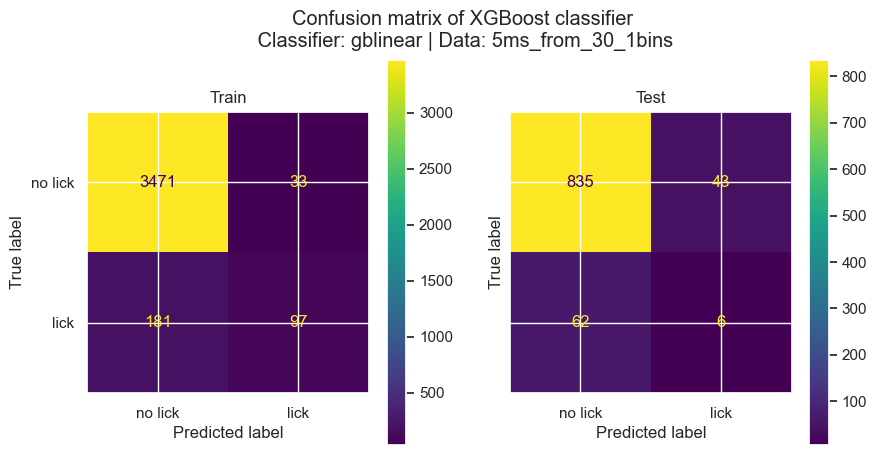

Accuracy: train: 0.996 test: 0.863
TP / (TP + FP): train: 0.996 test: 0.163 
TP / (TP + FN): train: 0.996 test: 0.221 
train_confmat
 [[3503    1]
 [  16  262]]
test_confmat
 [[801  77]
 [ 53  15]]


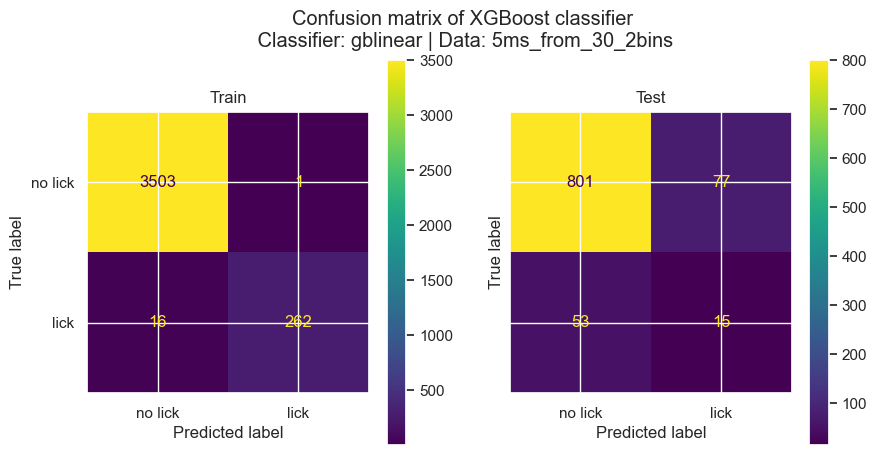

Accuracy: train: 1.000 test: 0.857
TP / (TP + FP): train: 1.000 test: 0.175 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[793  85]
 [ 50  18]]


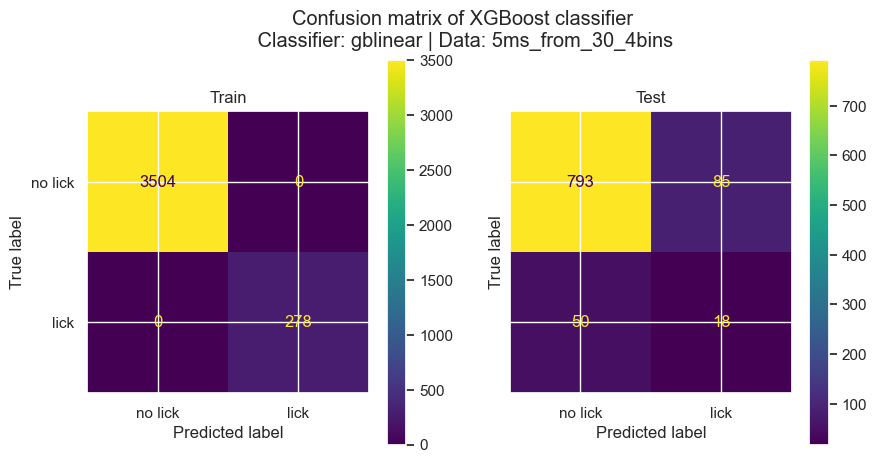

Accuracy: train: 1.000 test: 0.877
TP / (TP + FP): train: 1.000 test: 0.192 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[815  63]
 [ 53  15]]


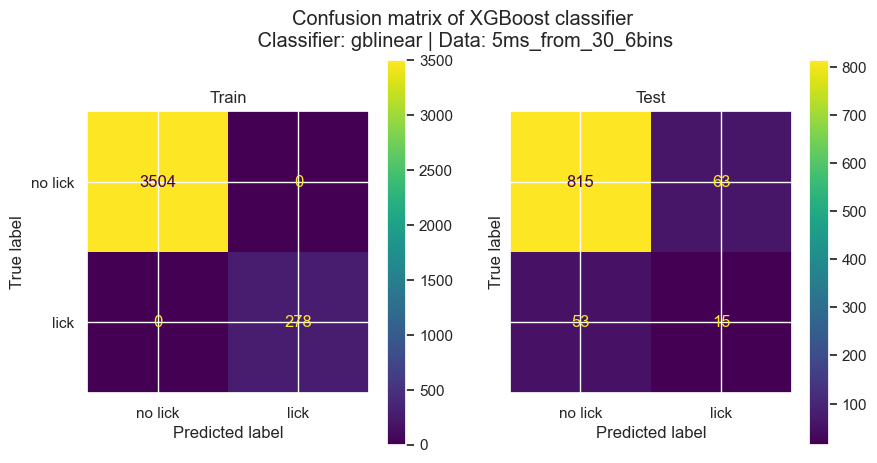

Accuracy: train: 1.000 test: 0.886
TP / (TP + FP): train: 1.000 test: 0.197 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[825  53]
 [ 55  13]]


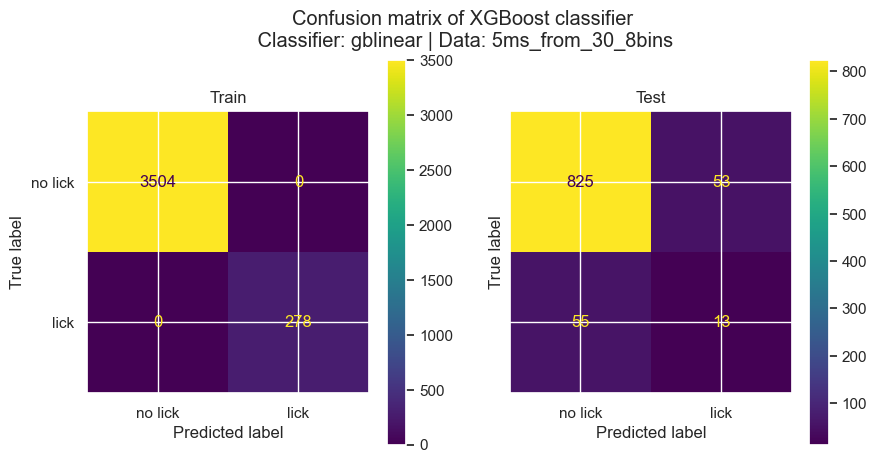

Accuracy: train: 1.000 test: 0.905
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[834  44]
 [ 46  22]]


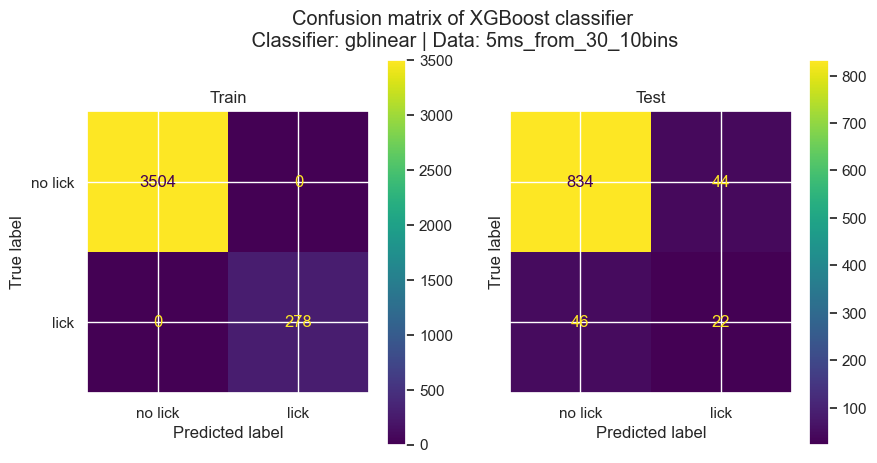

Accuracy: train: 1.000 test: 0.897
TP / (TP + FP): train: 1.000 test: 0.290 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[829  49]
 [ 48  20]]


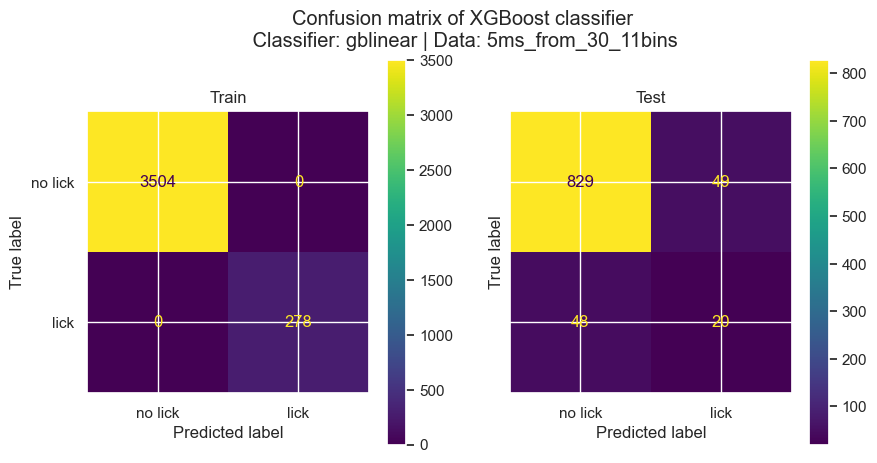

Accuracy: train: 0.940 test: 0.906
TP / (TP + FP): train: 0.720 test: 0.182 
TP / (TP + FN): train: 0.720 test: 0.088 
train_confmat
 [[3471   33]
 [ 193   85]]
test_confmat
 [[851  27]
 [ 62   6]]


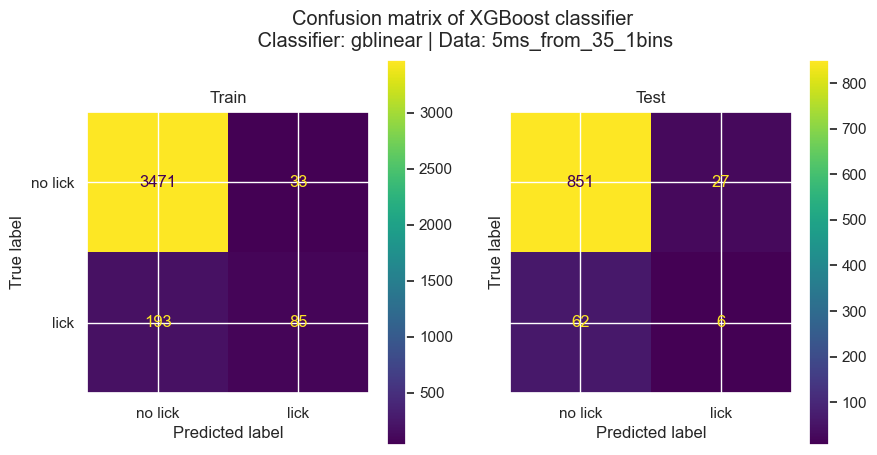

Accuracy: train: 0.997 test: 0.866
TP / (TP + FP): train: 1.000 test: 0.224 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [  13  265]]
test_confmat
 [[795  83]
 [ 44  24]]


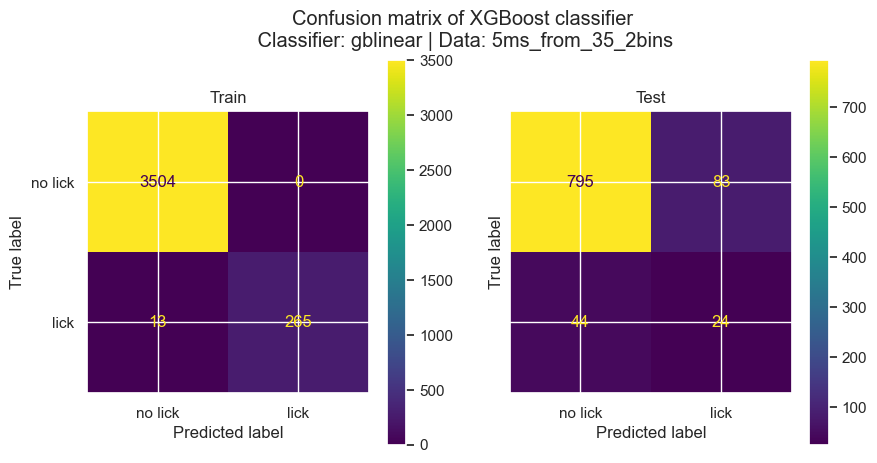

Accuracy: train: 1.000 test: 0.881
TP / (TP + FP): train: 1.000 test: 0.222 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[815  63]
 [ 50  18]]


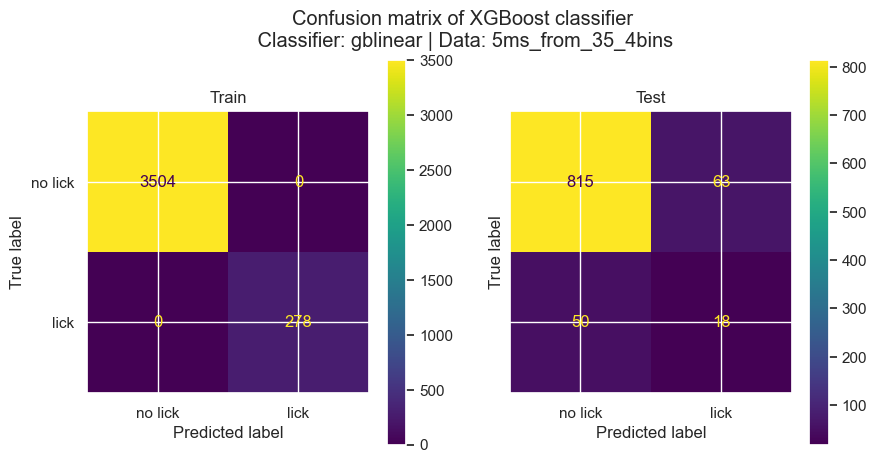

Accuracy: train: 1.000 test: 0.897
TP / (TP + FP): train: 1.000 test: 0.316 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[824  54]
 [ 43  25]]


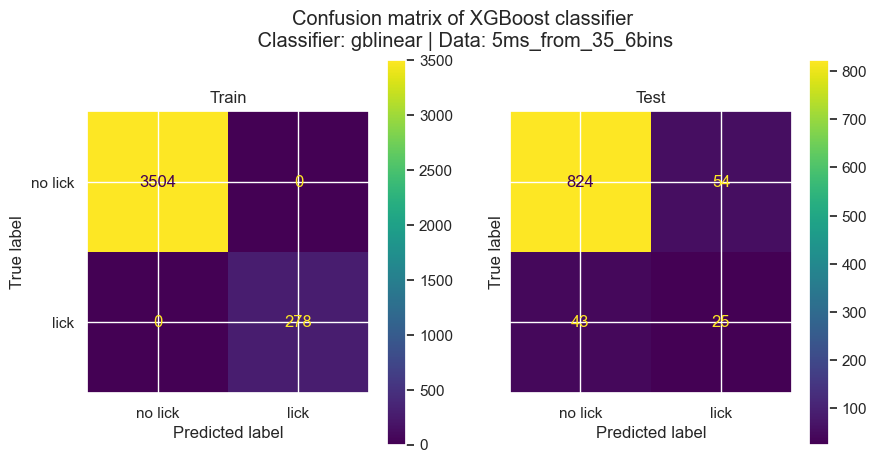

Accuracy: train: 1.000 test: 0.893
TP / (TP + FP): train: 1.000 test: 0.301 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[820  58]
 [ 43  25]]


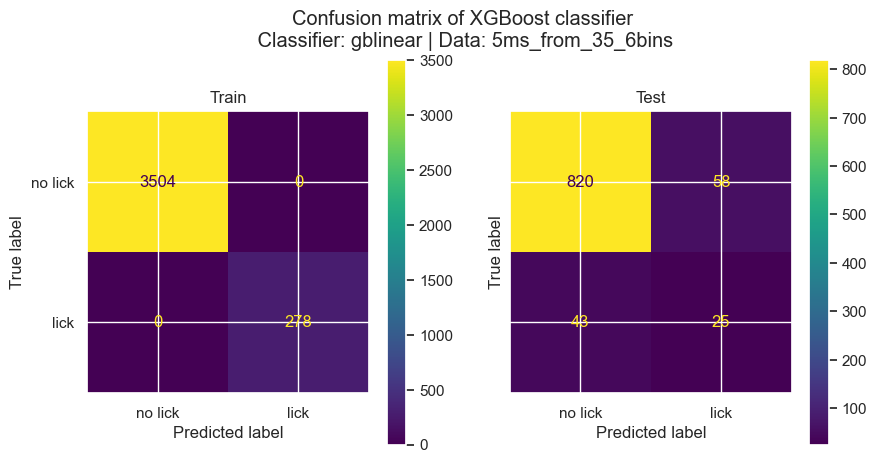

Accuracy: train: 0.953 test: 0.901
TP / (TP + FP): train: 0.784 test: 0.268 
TP / (TP + FN): train: 0.784 test: 0.221 
train_confmat
 [[3466   38]
 [ 140  138]]
test_confmat
 [[837  41]
 [ 53  15]]


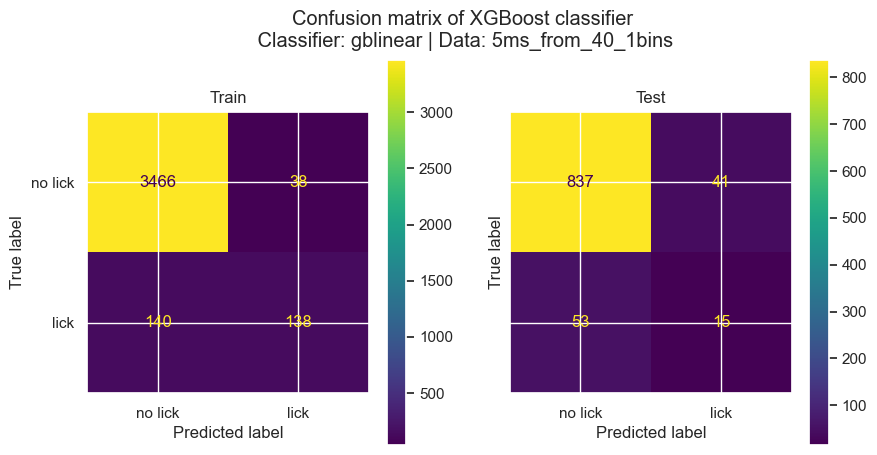

Accuracy: train: 0.952 test: 0.901
TP / (TP + FP): train: 0.775 test: 0.268 
TP / (TP + FN): train: 0.775 test: 0.221 
train_confmat
 [[3464   40]
 [ 140  138]]
test_confmat
 [[837  41]
 [ 53  15]]


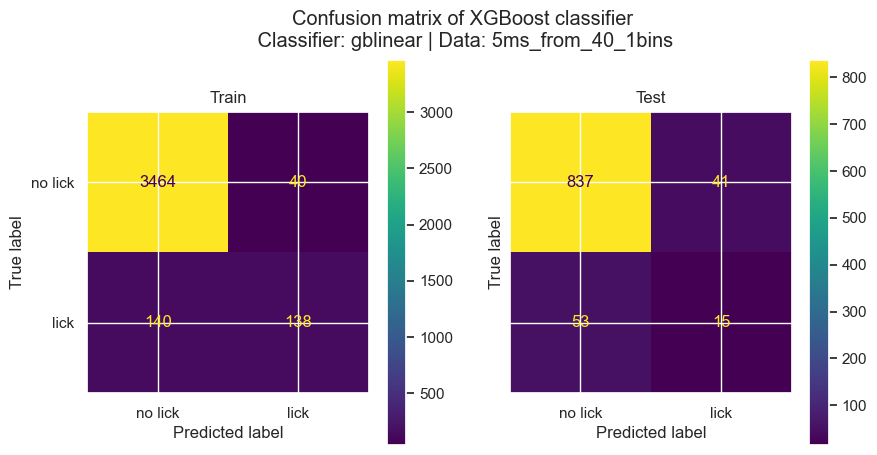

In [125]:
# fit model no training data
model_str = "gblinear" # "gblinear"
df_col = []
for init_bin in range(0, 41, 5):
    for lag in [1, 2, 4, 6, 8, 10, 12, 14, 16, 20, 24, 28, 32, 36, 40]:
        neural_mat_zscore = neural_tsr_zscore[:, :, init_bin:init_bin+lag].\
            reshape(neural_tsr_zscore.shape[0], -1)
        bin_num = neural_tsr_zscore[:, :, init_bin:init_bin+lag].shape[-1]
        data_str = f"5ms_from_{init_bin}_{bin_num}bins"
        y_mat = lick_mat[0]
        # split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                                y_mat, test_size=test_size, random_state=seed)
        model = XGBClassifier(booster=model_str,
                        objective="binary:logistic",
                        eval_metric="logloss",
                        use_label_encoder=False,
                        device="cpu", )
        model.fit(X_train, y_train)
        # make predictions for test data
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        # evaluate predictions
        acc_train = accuracy_score(y_train, y_train_pred)
        acc_test  = accuracy_score(y_test, y_test_pred)
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test  = confusion_matrix(y_test, y_test_pred)
        print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
        print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
        print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
        print("train_confmat\n", cm_train)
        print("test_confmat\n", cm_test)
        # plot confusion matrix
        figh, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[0])
        axs[0].set_title("Train")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[1])
        axs[1].set_title("Test") 
        plt.suptitle(f"Confusion matrix of XGBoost classifier\n Classifier: {model_str} | Data: {data_str}")
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.png"))
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.pdf"))
        plt.show()
        df_col.append({"init_bin": init_bin, "lag": lag, "acc_train": acc_train, "acc_test": acc_test,
                       "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
                       "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
                       "hit_rate_train": cm_train[1, 1] / cm_train[1, :].sum(),
                       "hit_rate_test":  cm_test[1, 1] / cm_test[1, :].sum(),
                       "cm_train": cm_train, "cm_test": cm_test,
                       "model_str": model_str, "data_str": data_str})
        if bin_num < lag:
            break

df = pd.DataFrame(df_col)
df.to_csv(join(outdir, f"confmat_{model_str}_lags_tab.csv"), index=False)

In [126]:
hit_rate = df["cm_test"].apply(lambda x: x[1, 1] / x[1, :].sum())
df["hit_rate_test"] = hit_rate
hit_rate = df["cm_train"].apply(lambda x: x[1, 1] / x[1, :].sum())
df["hit_rate_train"] = hit_rate

In [127]:

df.to_csv(join(figdir, f"confmat_{model_str}_lags_tab.csv"), index=False)

In [ ]:
def moving_average_nd(arr, window_size, axis=0):
    """
    Compute the moving average over a 2D array along the specified axis.

    Parameters:
    arr (numpy.ndarray): The input 2D array.
    window_size (int): The size of the moving average window.
    axis (int): The axis along which to compute the moving average.

    Returns:
    numpy.ndarray: The array after applying the moving average.
    """
    kernel = np.ones(window_size) / window_size
    return np.apply_along_axis(lambda m: np.convolve(m, kernel, mode='valid'), axis=axis, arr=arr)


In [ ]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import time
# FILEPATH: /n/home12/binxuwang/Github/Mice-Licking-Classification/neural_licking_XGBoost_classifier.ipynb
# fit model no training data
# fit model no training data
model_str = "gblinear" # "gblinear"
df_col = []
for avg_n in [1, 2, 3, 4, 5, 6, 8, 10, 15, 20, 40]:
    mva_neural_mat = moving_average_nd(neural_mat, window_size=avg_n, axis=-1)
    print (mva_neural_mat.shape)
    mva_neural_mat_subsp = mva_neural_mat[:, :, ::avg_n]
    print(mva_neural_mat_subsp.shape)
    # normalize
    mva_neuron_mean = mva_neural_mat_subsp.mean(axis=(0, 2))
    mva_neuron_std = mva_neural_mat_subsp.std(axis=(0, 2))
    mva_neural_tsr_zscore = ((mva_neural_mat_subsp.astype("float32") - mva_neural_mat_subsp.mean(axis=(0, 2), keepdims=True))
                        / mva_neural_mat_subsp.std(axis=(0, 2), keepdims=True))
    total_bin_num = mva_neural_mat_subsp.shape[-1]
    for lag in range(1, total_bin_num+1):
        for init_bin in range(0, total_bin_num, lag):
        # for lag in [1, 2, 3, 4, 5, 6, 8, 10, 12, 14, 16, 20]:
            neural_mat_zscore = mva_neural_tsr_zscore[:, :, init_bin:init_bin+lag]
            neural_mat_zscore = neural_mat_zscore.reshape(neural_mat_zscore.shape[0], -1)
            bin_num = mva_neural_tsr_zscore[:, :, init_bin:init_bin+lag].shape[-1]
            if bin_num == 0:
                break
            data_str = f"{5 * avg_n}ms_from_{init_bin}_{bin_num}bins"
            y_mat = lick_mat[0]
            # split data into train and test sets
            t0 = time.time()
            X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                                    y_mat, test_size=test_size, random_state=seed)
            model = XGBClassifier(booster=model_str,
                        objective="binary:logistic",
                        eval_metric="logloss",
                        use_label_encoder=False,
                        device="cuda", )
            model.fit(X_train, y_train)
            # make predictions for test data
            y_train_pred = model.predict(X_train)
            y_test_pred = model.predict(X_test)
            # evaluate predictions
            t1 = time.time()
            acc_train = accuracy_score(y_train, y_train_pred)
            acc_test  = accuracy_score(y_test, y_test_pred)
            cm_train = confusion_matrix(y_train, y_train_pred)
            cm_test  = confusion_matrix(y_test, y_test_pred)
            print(f"Avg bins {avg_n}, from {init_bin} to {init_bin + bin_num} bin")
            print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
            print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
                f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
            print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
                f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
            print("train_confmat\n", cm_train)
            print("test_confmat\n", cm_test)
            print (f"Time for model: {t1-t0:.2f}s")
            df_col.append({"init_bin": init_bin, "lag": lag, "bin_num": bin_num,
                           "acc_train": acc_train, "acc_test": acc_test,
                        "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
                        "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
                        "cm_train": cm_train, "cm_test": cm_test,
                        "model_str": model_str, "data_str": data_str})
            if bin_num < lag:
                break
            
df = pd.DataFrame(df_col)
df.to_csv(join(outdir, f"confmat_{model_str}_avg_multi_ms_tab.csv"), index=False)

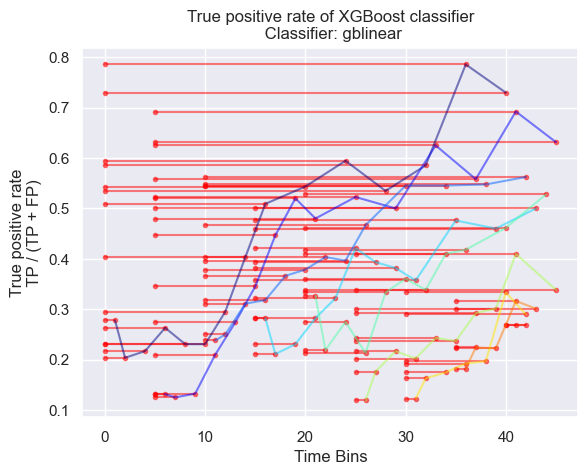

In [128]:
# iterate over rows
cm = plt.get_cmap("jet")
for ri, row in df.iterrows():
    plt.plot([row["init_bin"], row["init_bin"]+row["lag"]], 
             [row["tp_test"],row["tp_test"]], 
             marker=".", color="red", alpha=0.5)
for i, init_bin in enumerate(range(0, 41, 5)):
    clr = cm(i/len(range(0, 41, 5)))
    row_idx = df["init_bin"]==init_bin
    plt.plot(df.loc[row_idx, "init_bin"]+df.loc[row_idx, "lag"], 
             df.loc[row_idx, "tp_test"], 
             color=clr, alpha=0.5,)    
plt.xlabel("Time Bins")
plt.ylabel("True positive rate\n TP / (TP + FP) ")
plt.title(f"True positive rate of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_test_bar_curv_{model_str}_lags.png"))
plt.savefig(join(figdir, f"tp_test_bar_curv_{model_str}_lags.pdf"))
plt.show()

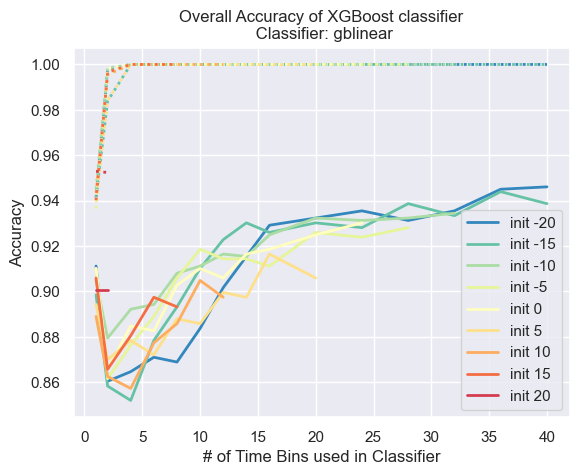

In [135]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="acc_train",
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="acc_test",
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("Accuracy")
plt.xlabel("# of Time Bins used in Classifier")
plt.title(f"Overall Accuracy of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"acc_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"acc_{model_str}_init_bin.pdf"))
plt.show()

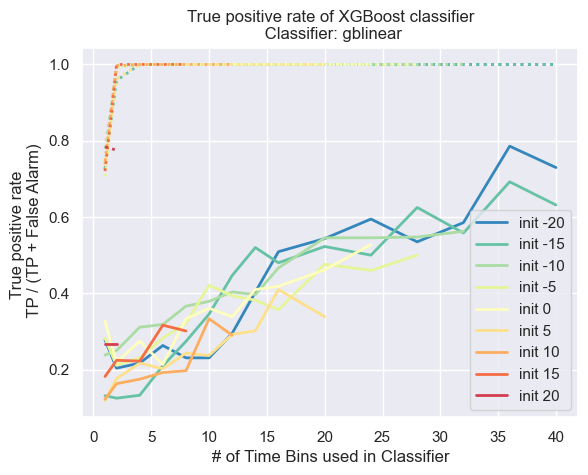

In [136]:
# gradual color map for init_bin
# sns.set_context("paper")
# sns.set_style("ticks")
# sns.set_palette("viridis", n_colors=9)
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="tp_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="tp_test", 
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("True positive rate \n TP / (TP + False Alarm)")
plt.xlabel("# of Time Bins used in Classifier")
plt.title(f"True positive rate of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_rate_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"tp_rate_{model_str}_init_bin.pdf"))
plt.show()

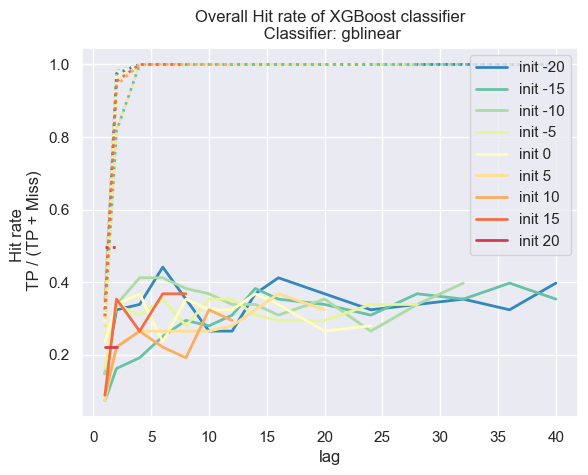

In [137]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="hit_rate_train",
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="hit_rate_test",
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("Hit rate \n TP / (TP + Miss)")
plt.title(f"Overall Hit rate of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"hit_rate_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"hit_rate_{model_str}_init_bin.pdf"))
plt.show()

In [138]:
df.lag.unique()

array([ 1,  2,  4,  6,  8, 10, 12, 14, 16, 20, 24, 28, 32, 36, 40])

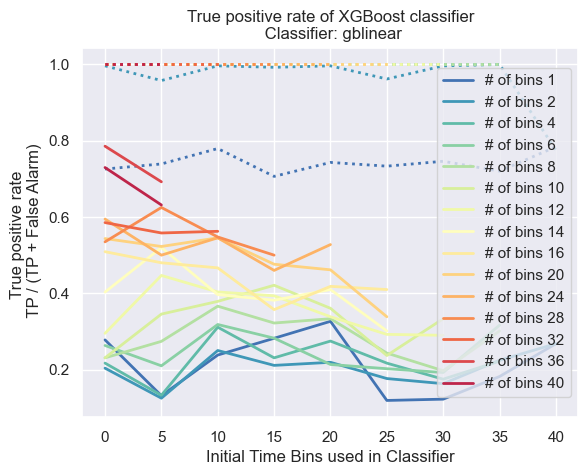

In [140]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=len(df.lag.unique()))
current_palette = sns.color_palette()
for i, lag in enumerate(df.lag.unique()):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="tp_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="tp_test", 
                 color=clr, label=f"# of bins {lag}", linewidth=2, )
plt.ylabel("True positive rate \n TP / (TP + False Alarm)")
plt.xlabel("Initial Time Bins used in Classifier")
plt.title(f"True positive rate of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_rate_{model_str}_lag.png"))
plt.savefig(join(figdir, f"tp_rate_{model_str}_lag.pdf"))
plt.show()

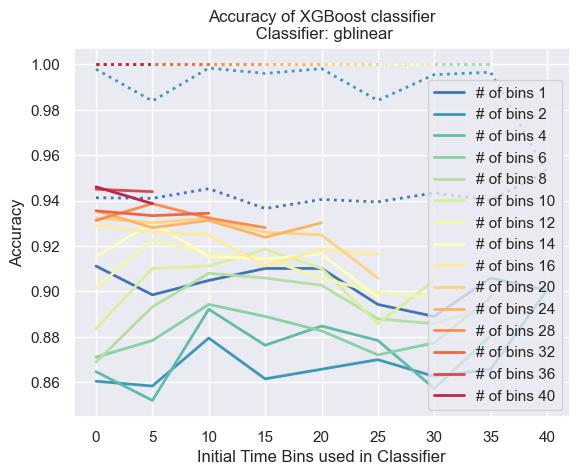

In [142]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=len(df.lag.unique()))
current_palette = sns.color_palette()
for i, lag in enumerate(df.lag.unique()):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="acc_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="acc_test", 
                 color=clr, label=f"# of bins {lag}", linewidth=2, )
plt.ylabel("Accuracy")
plt.xlabel("Initial Time Bins used in Classifier")
plt.title(f"Accuracy of XGBoost classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"acc_{model_str}_lag.png"))
plt.savefig(join(figdir, f"acc_{model_str}_lag.pdf"))
plt.show()

How the classifier accuracy depends on the bin size, which time point of the bin and which time is it?
* Use different time point around the lick
* Bin size? 5ms - 50ms?
* The lick before the last lick. 

## Simple Logistic regression

Accuracy: train: 0.942 test: 0.911
TP / (TP + FP): train: 0.748 test: 0.265 
TP / (TP + FN): train: 0.748 test: 0.132 
train_confmat
 [[3474   30]
 [ 189   89]]
test_confmat
 [[853  25]
 [ 59   9]]


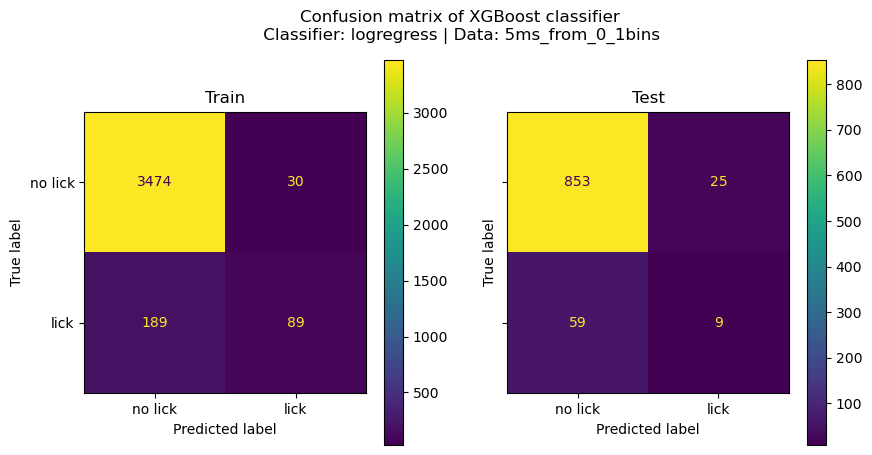

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.998 test: 0.865
TP / (TP + FP): train: 0.993 test: 0.188 
TP / (TP + FN): train: 0.993 test: 0.265 
train_confmat
 [[3502    2]
 [   6  272]]
test_confmat
 [[800  78]
 [ 50  18]]


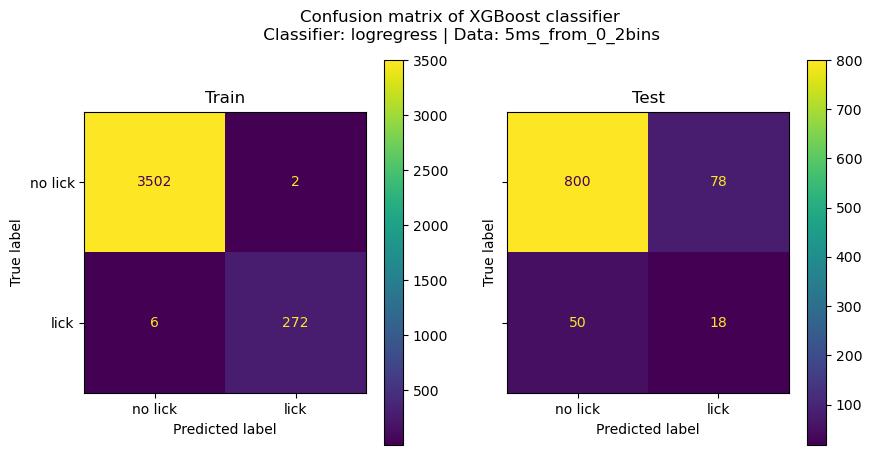

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.891
TP / (TP + FP): train: 1.000 test: 0.222 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[829  49]
 [ 54  14]]


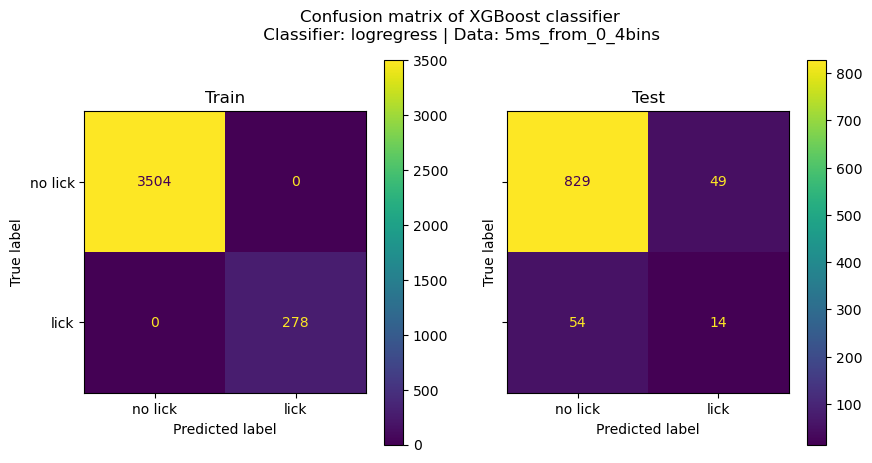

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.914
TP / (TP + FP): train: 1.000 test: 0.367 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[847  31]
 [ 50  18]]


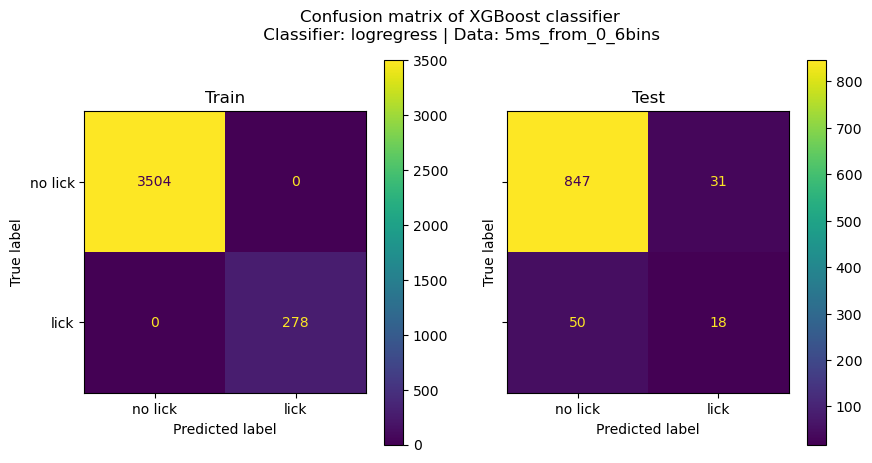

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.911
TP / (TP + FP): train: 1.000 test: 0.318 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[848  30]
 [ 54  14]]


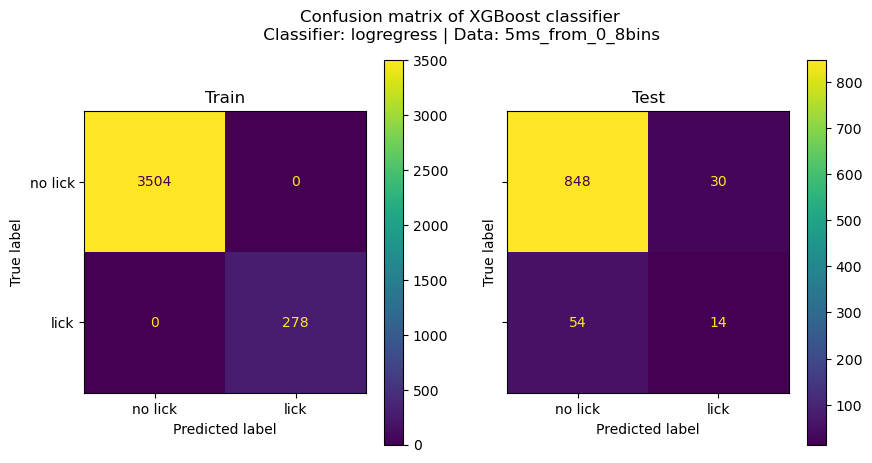

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.447 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 51  17]]


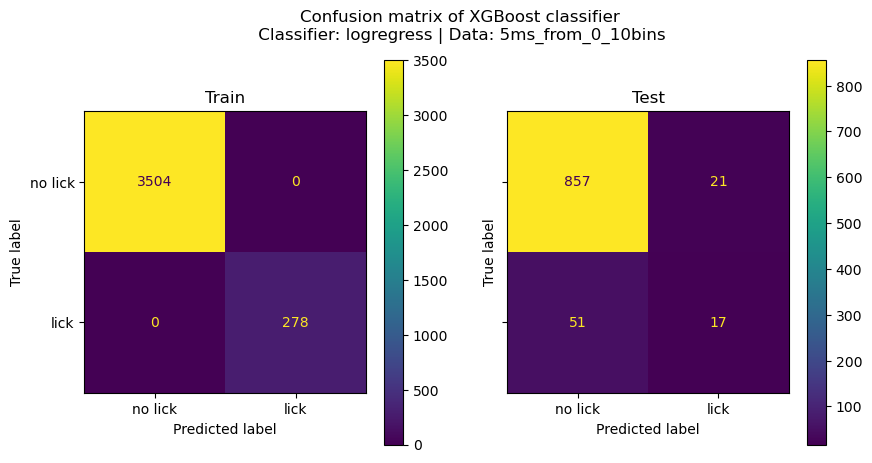

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.432 
TP / (TP + FN): train: 1.000 test: 0.235 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 52  16]]


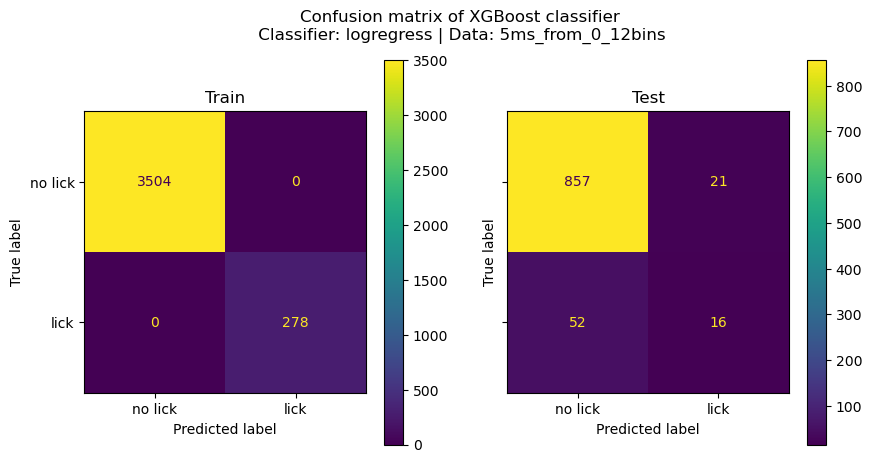

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.586 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[866  12]
 [ 51  17]]


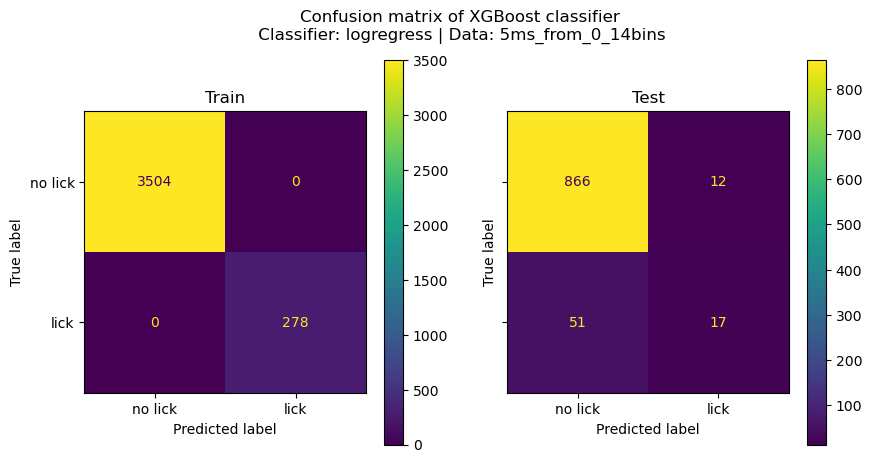

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.618 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[865  13]
 [ 47  21]]


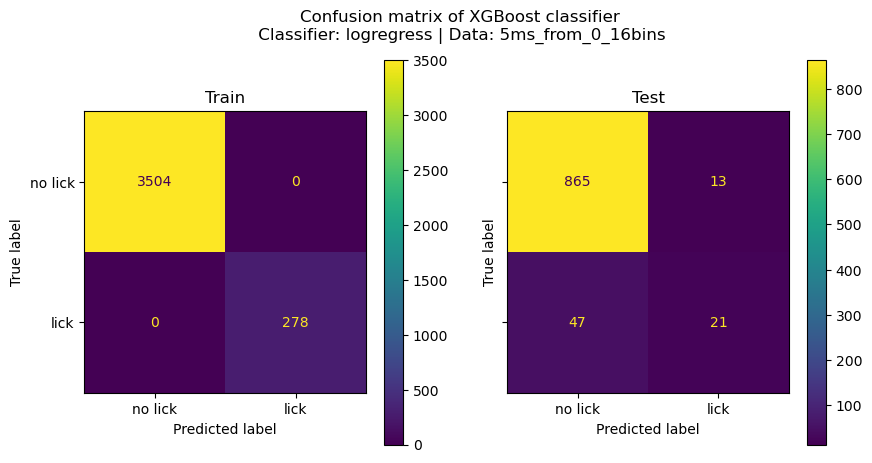

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.940
TP / (TP + FP): train: 1.000 test: 0.657 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[866  12]
 [ 45  23]]


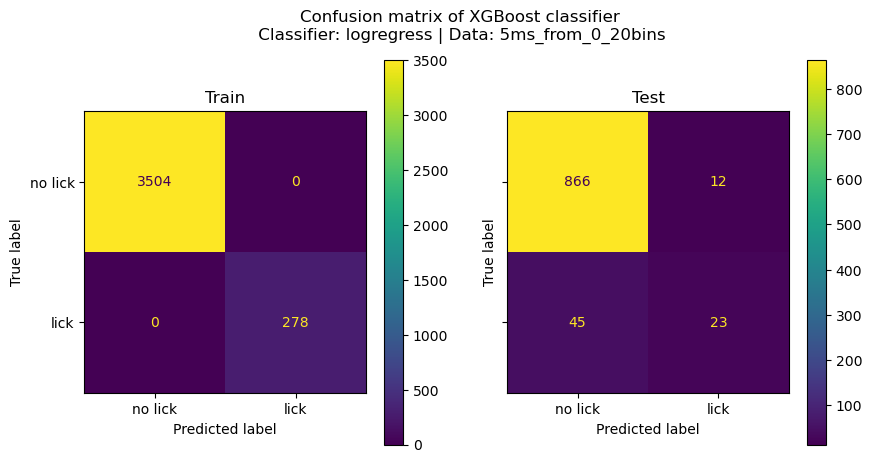

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.945
TP / (TP + FP): train: 1.000 test: 0.735 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 43  25]]


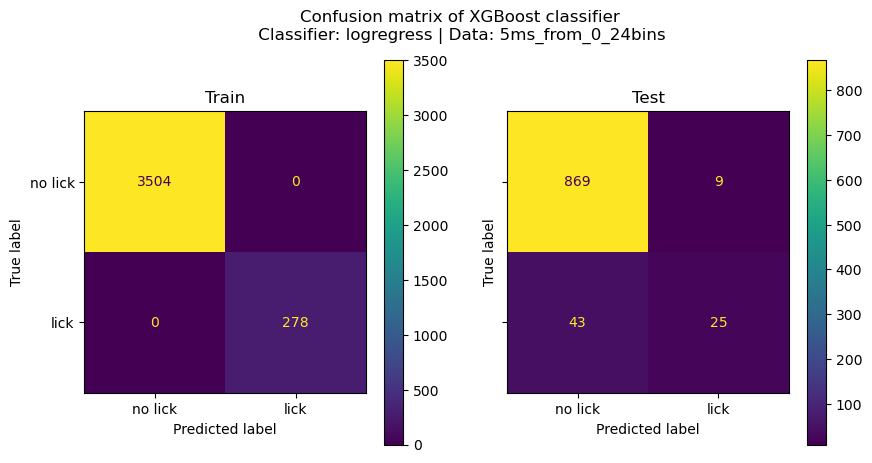

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.614 
TP / (TP + FN): train: 1.000 test: 0.397 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[861  17]
 [ 41  27]]


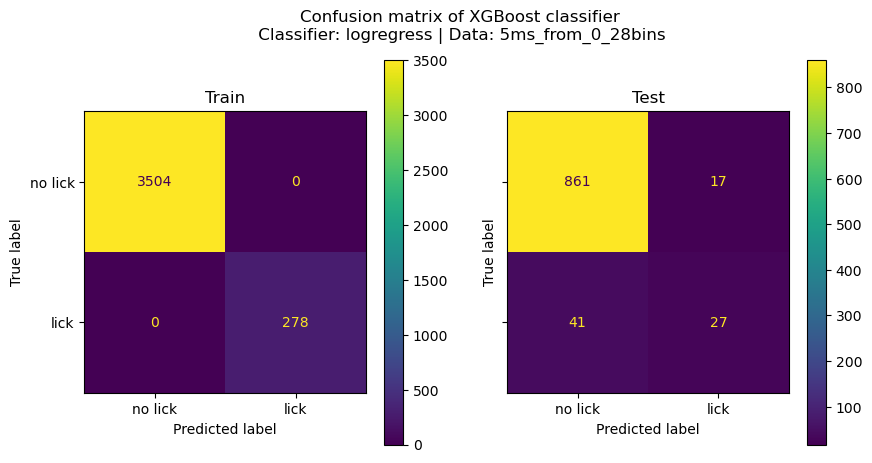

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.944
TP / (TP + FP): train: 1.000 test: 0.703 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[867  11]
 [ 42  26]]


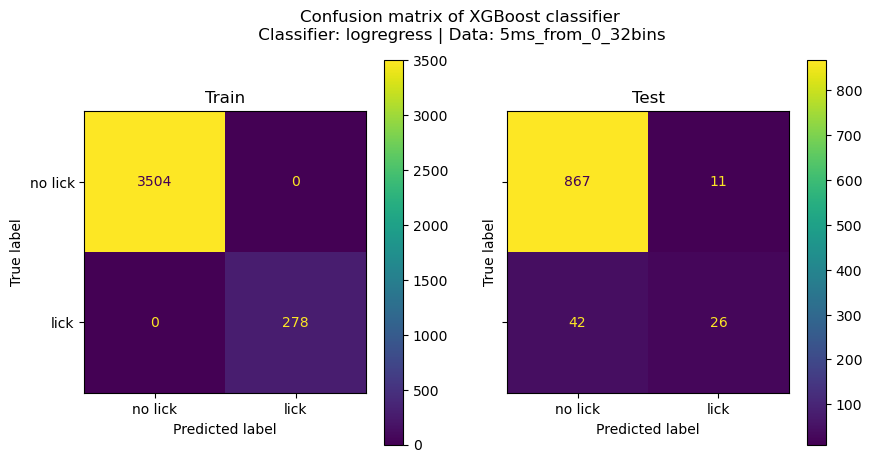

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.947
TP / (TP + FP): train: 1.000 test: 0.737 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 40  28]]


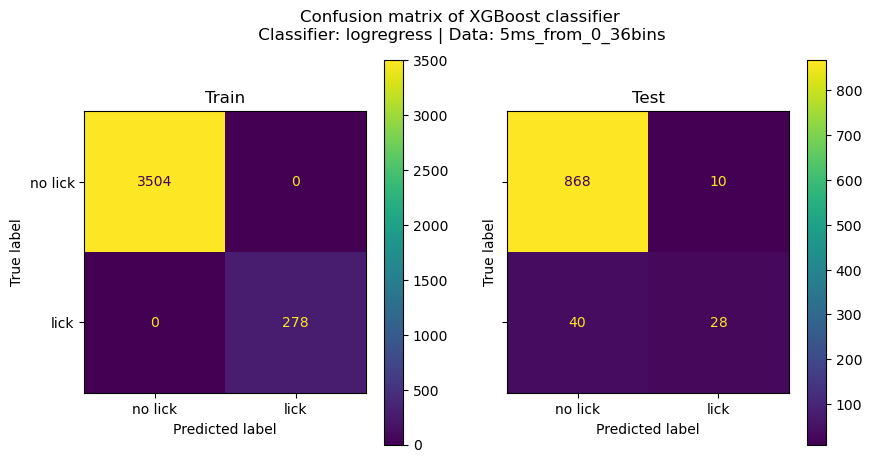

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.950
TP / (TP + FP): train: 1.000 test: 0.800 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 40  28]]


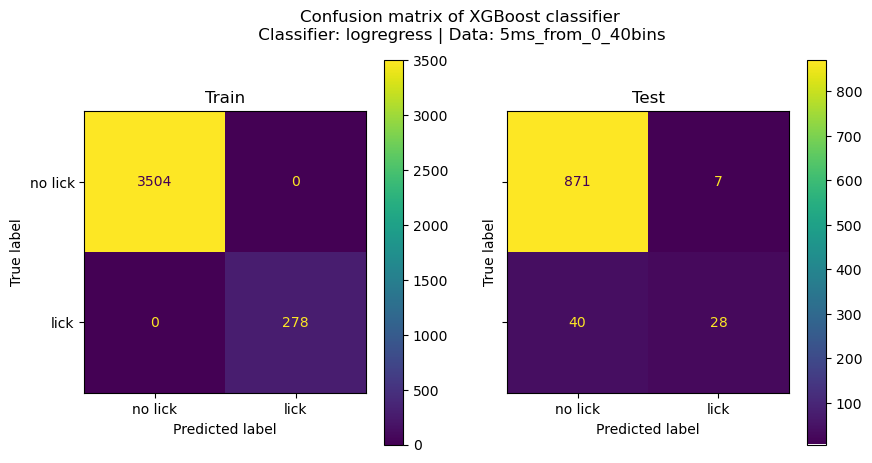

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.941 test: 0.901
TP / (TP + FP): train: 0.745 test: 0.139 
TP / (TP + FN): train: 0.745 test: 0.074 
train_confmat
 [[3476   28]
 [ 196   82]]
test_confmat
 [[847  31]
 [ 63   5]]


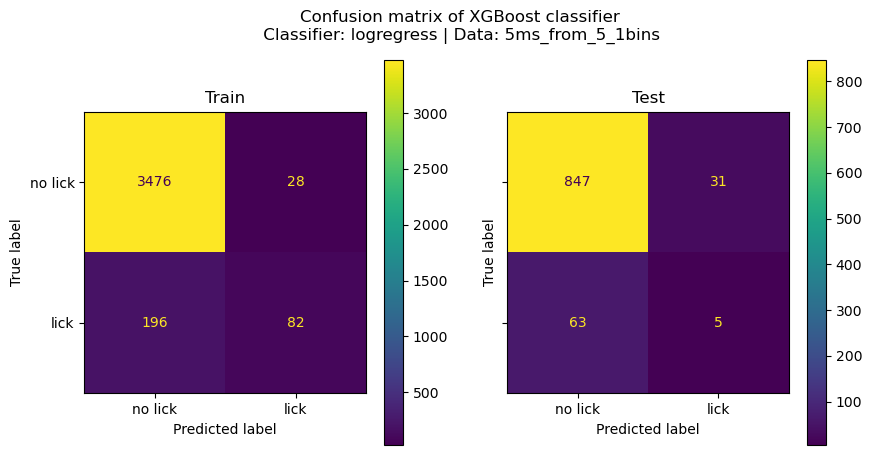

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.987 test: 0.867
TP / (TP + FP): train: 0.975 test: 0.146 
TP / (TP + FN): train: 0.975 test: 0.176 
train_confmat
 [[3498    6]
 [  43  235]]
test_confmat
 [[808  70]
 [ 56  12]]


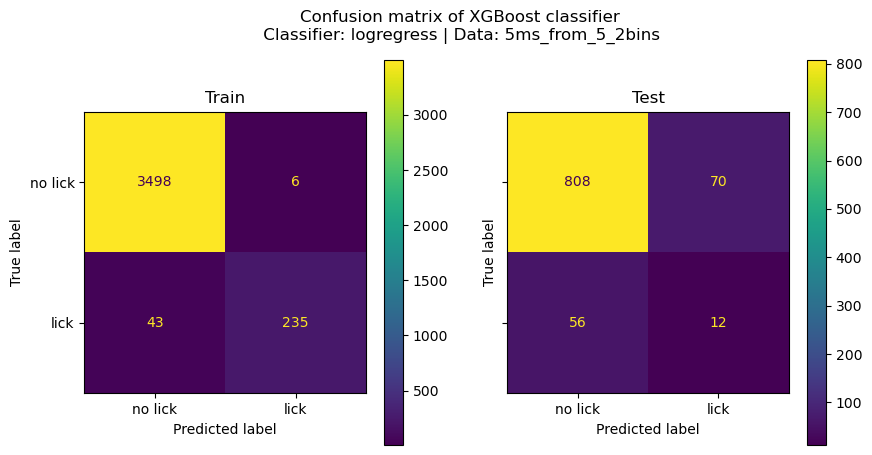

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.885
TP / (TP + FP): train: 1.000 test: 0.194 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[824  54]
 [ 55  13]]


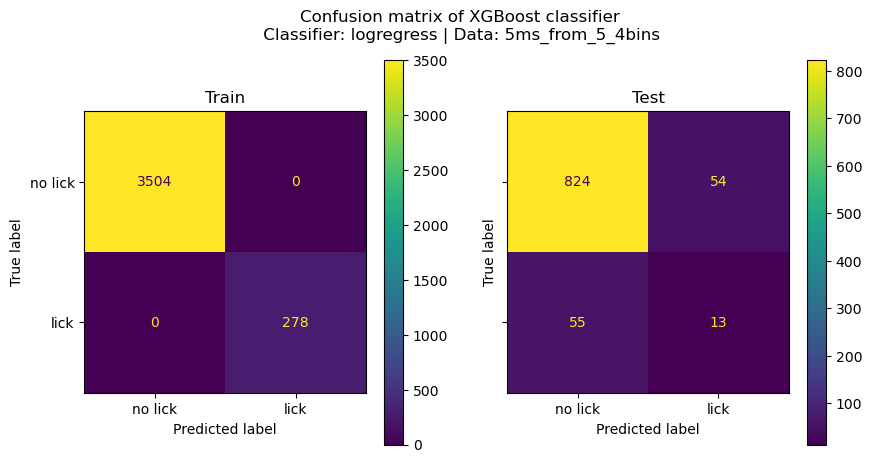

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.901
TP / (TP + FP): train: 1.000 test: 0.250 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[839  39]
 [ 55  13]]


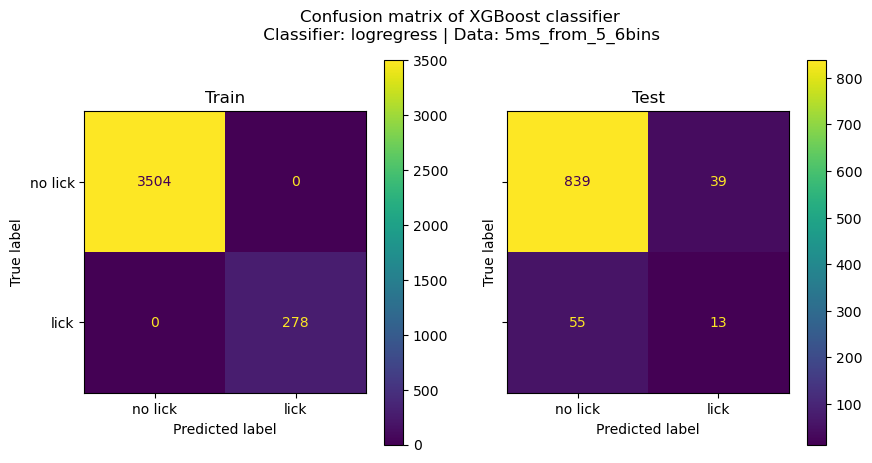

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.914
TP / (TP + FP): train: 1.000 test: 0.349 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[850  28]
 [ 53  15]]


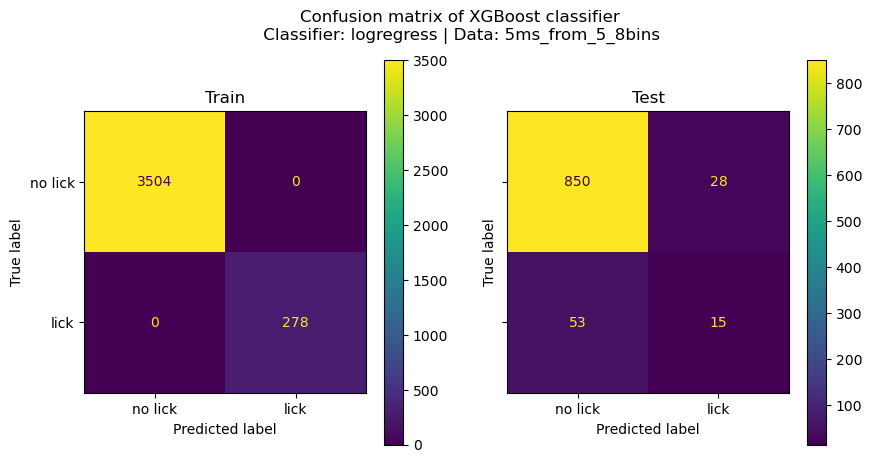

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.488 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 48  20]]


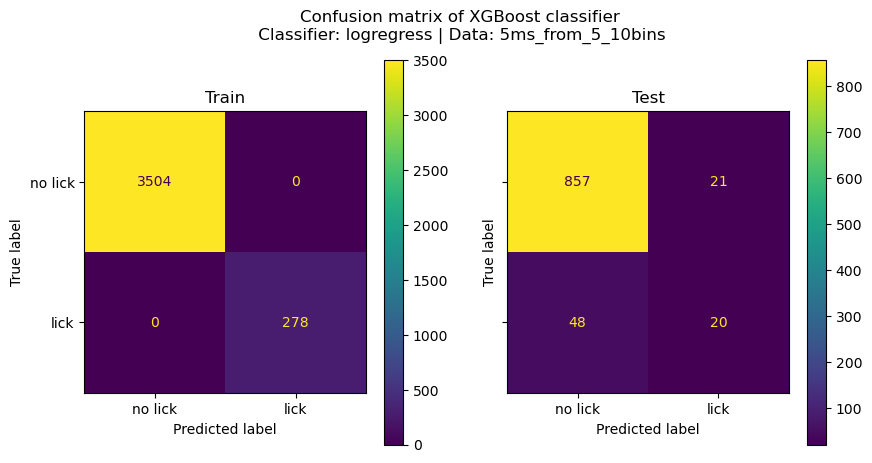

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.511 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[856  22]
 [ 45  23]]


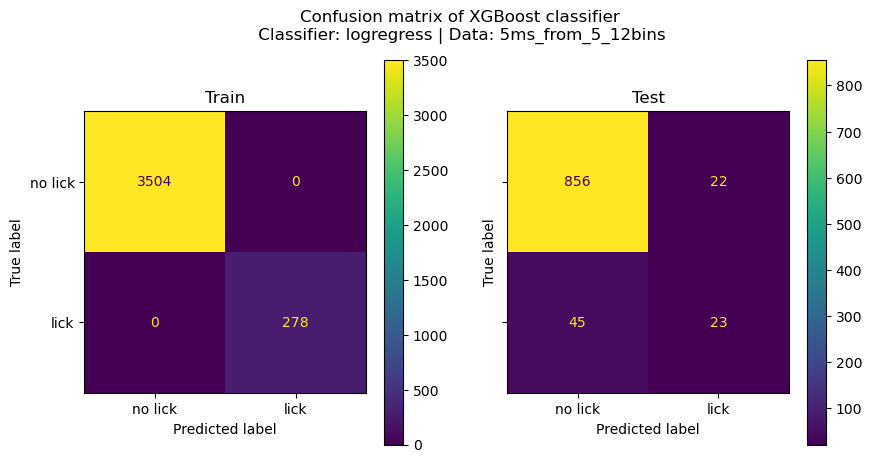

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.514 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[860  18]
 [ 49  19]]


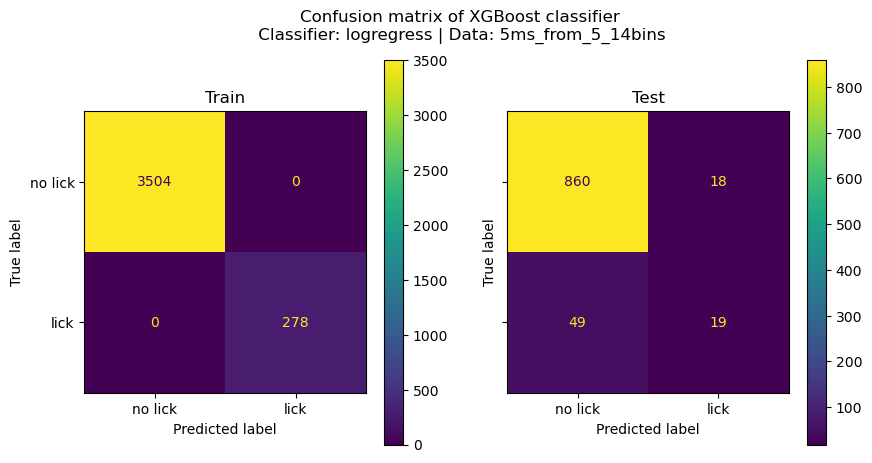

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.550 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[860  18]
 [ 46  22]]


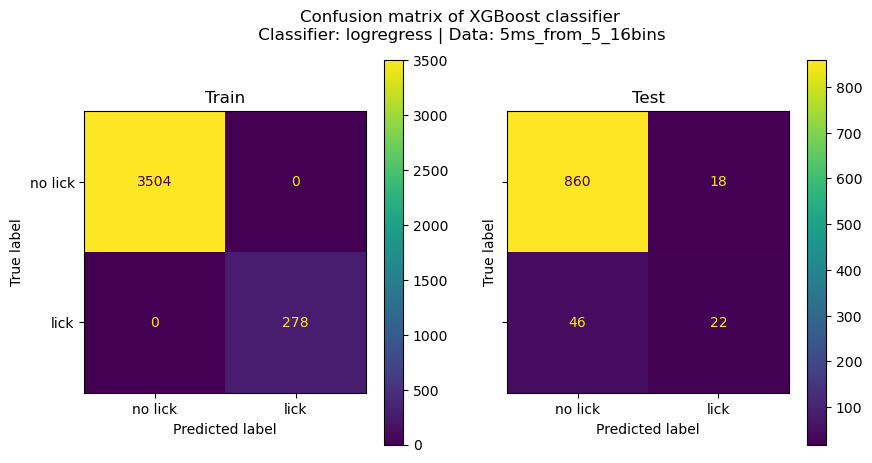

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.936
TP / (TP + FP): train: 1.000 test: 0.595 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 46  22]]


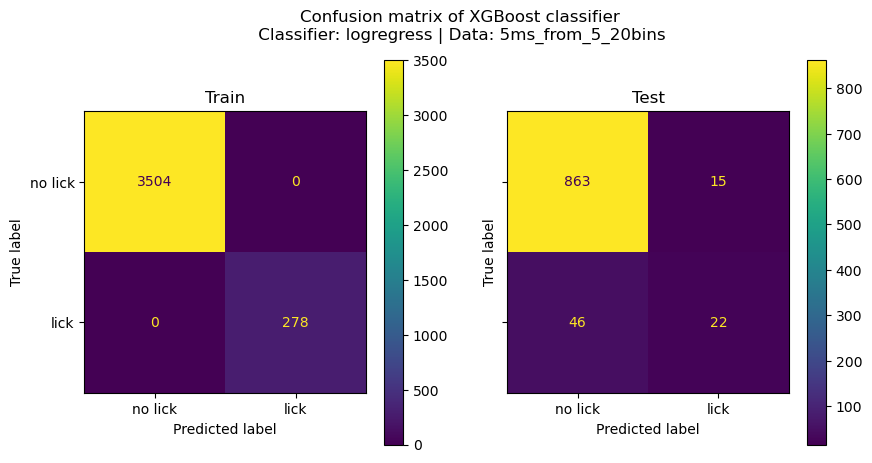

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.591 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[860  18]
 [ 42  26]]


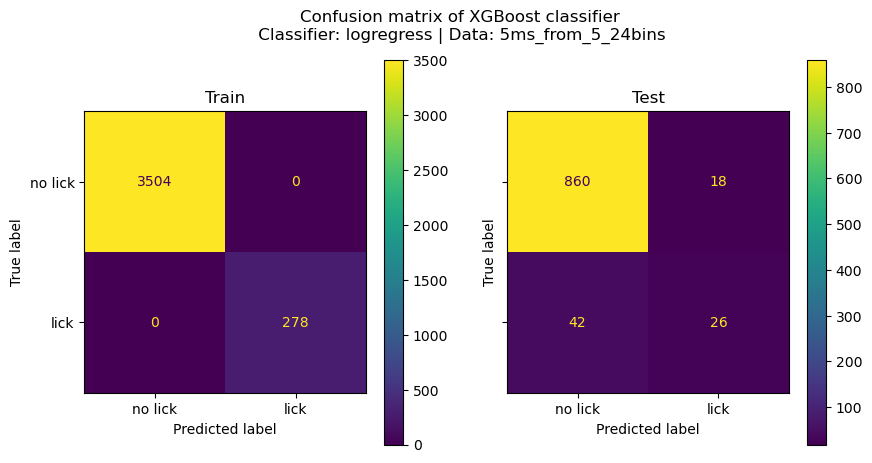

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.625 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 43  25]]


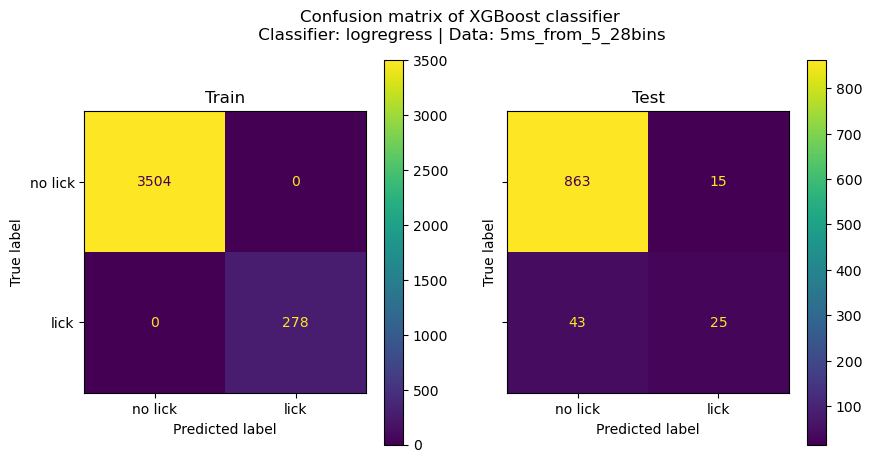

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.944
TP / (TP + FP): train: 1.000 test: 0.703 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[867  11]
 [ 42  26]]


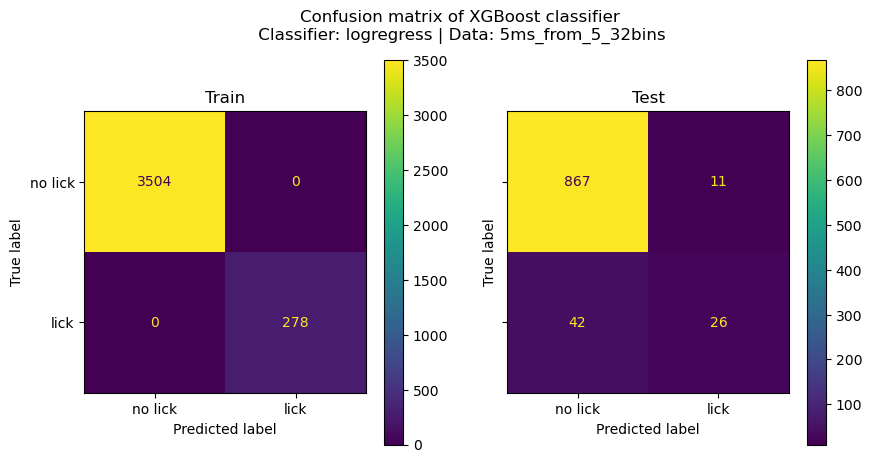

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.947
TP / (TP + FP): train: 1.000 test: 0.737 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 40  28]]


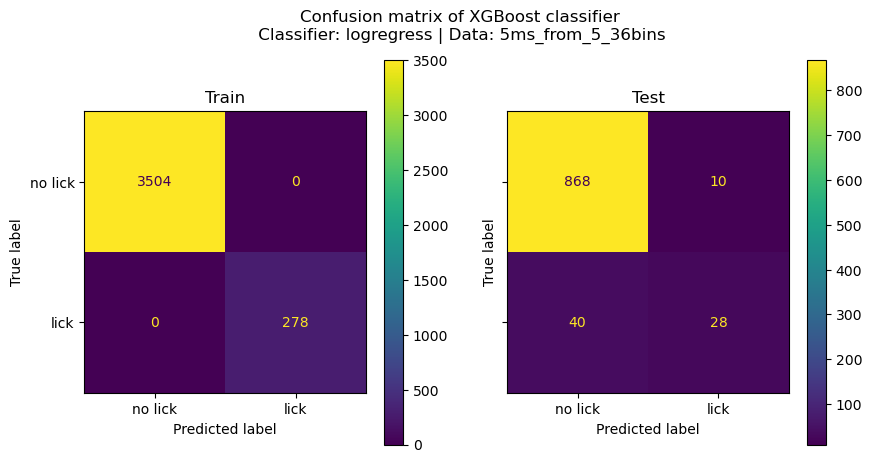

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.947
TP / (TP + FP): train: 1.000 test: 0.737 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 40  28]]


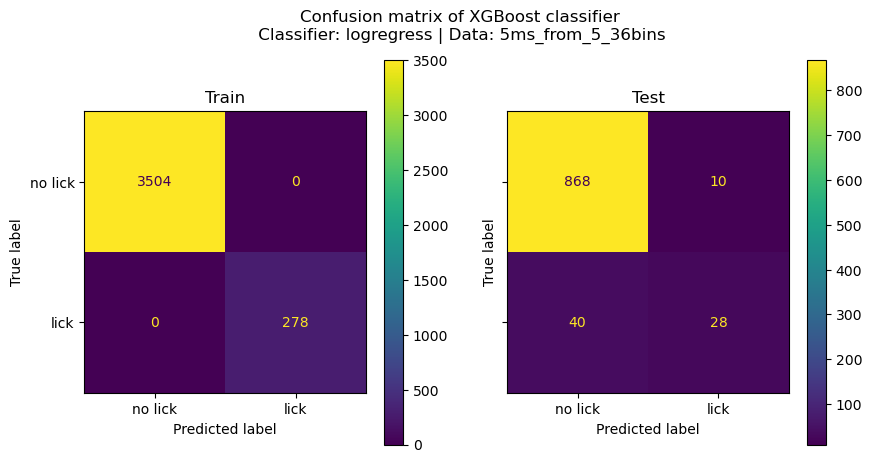

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.946 test: 0.909
TP / (TP + FP): train: 0.795 test: 0.250 
TP / (TP + FN): train: 0.795 test: 0.132 
train_confmat
 [[3479   25]
 [ 181   97]]
test_confmat
 [[851  27]
 [ 59   9]]


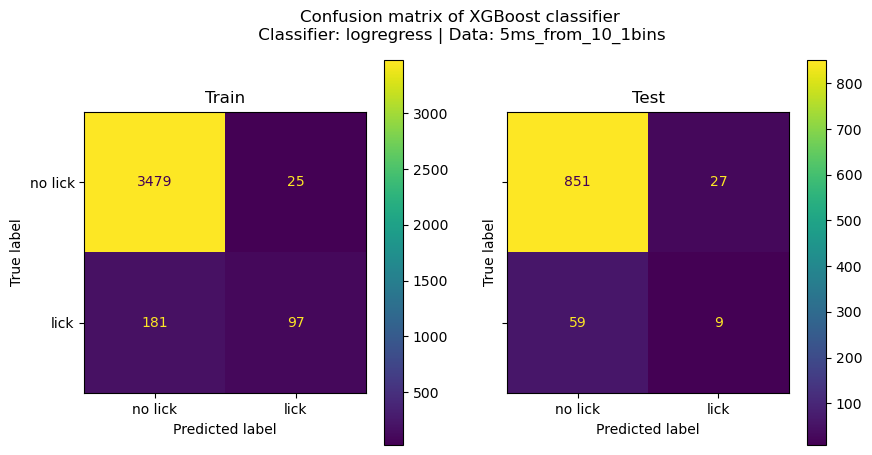

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.998 test: 0.883
TP / (TP + FP): train: 0.996 test: 0.241 
TP / (TP + FN): train: 0.996 test: 0.294 
train_confmat
 [[3503    1]
 [   6  272]]
test_confmat
 [[815  63]
 [ 48  20]]


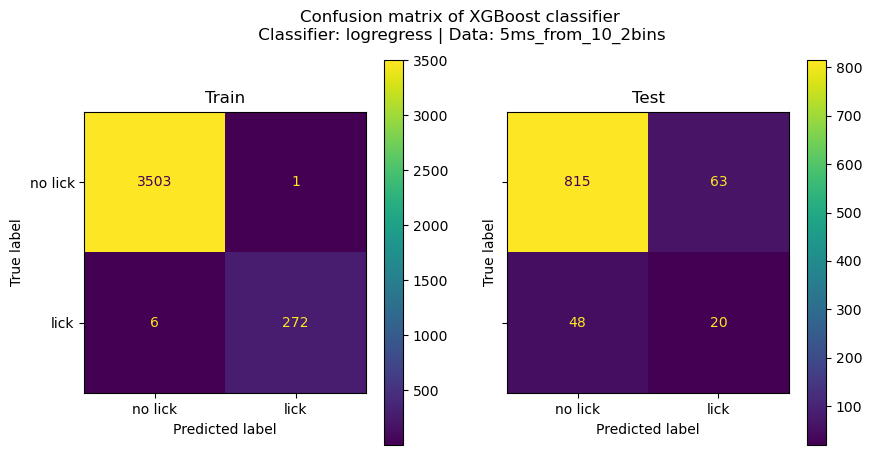

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.915
TP / (TP + FP): train: 1.000 test: 0.397 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[843  35]
 [ 45  23]]


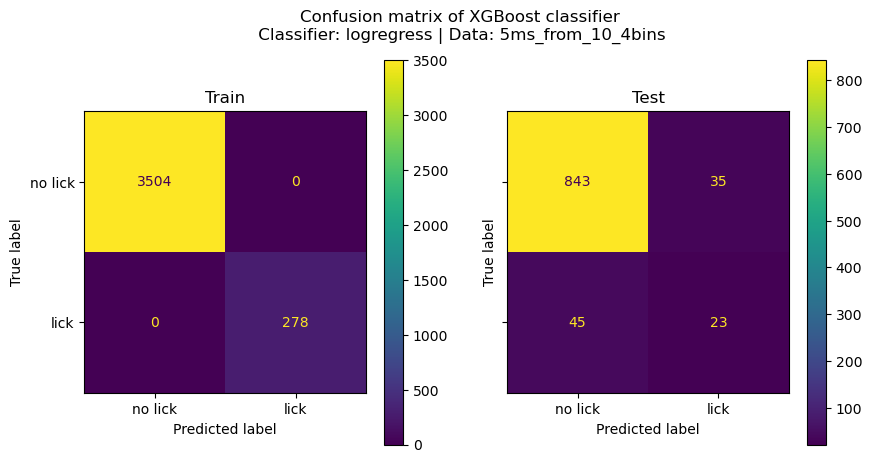

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.921
TP / (TP + FP): train: 1.000 test: 0.441 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[845  33]
 [ 42  26]]


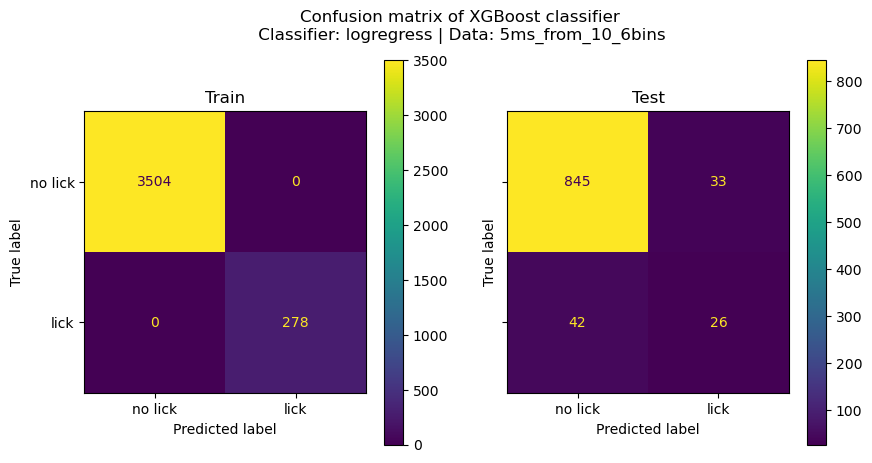

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.480 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[852  26]
 [ 44  24]]


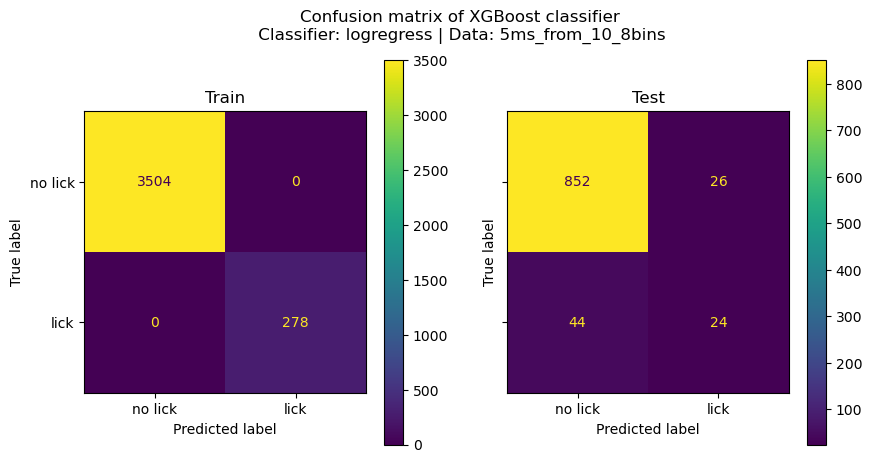

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.548 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 45  23]]


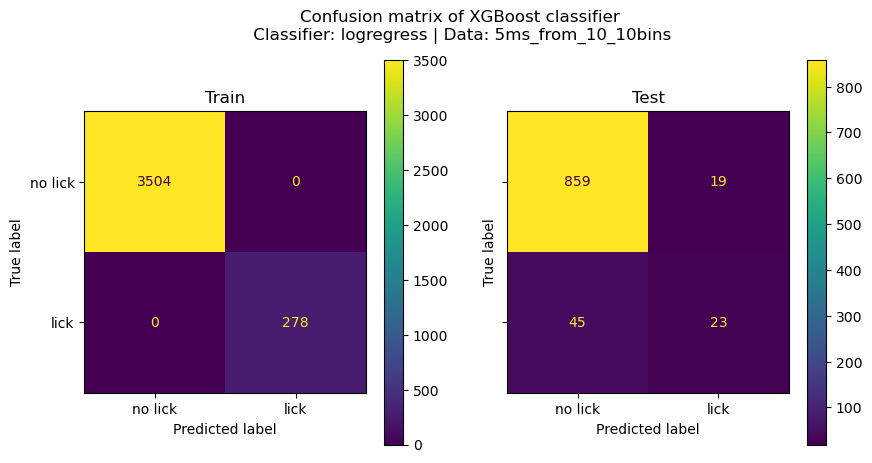

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.564 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[861  17]
 [ 46  22]]


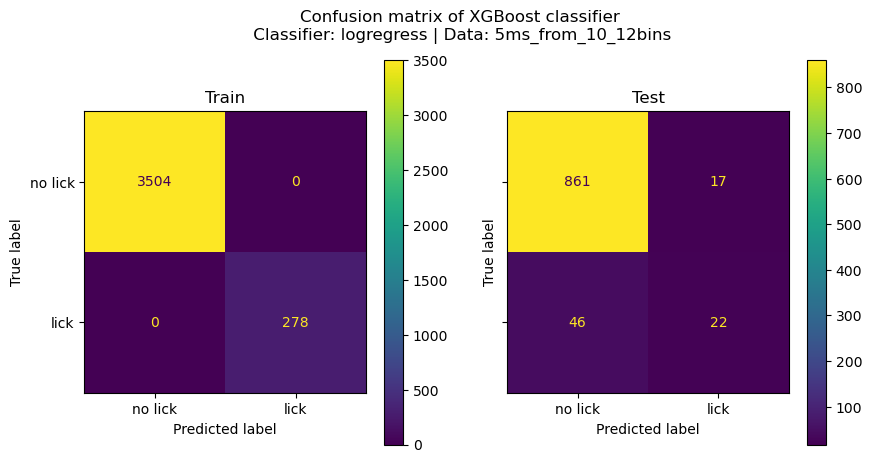

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.619 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[862  16]
 [ 42  26]]


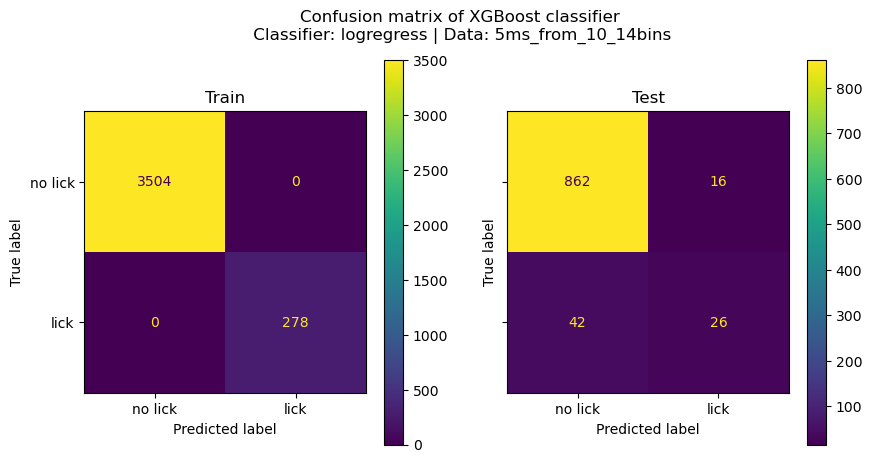

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.523 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 45  23]]


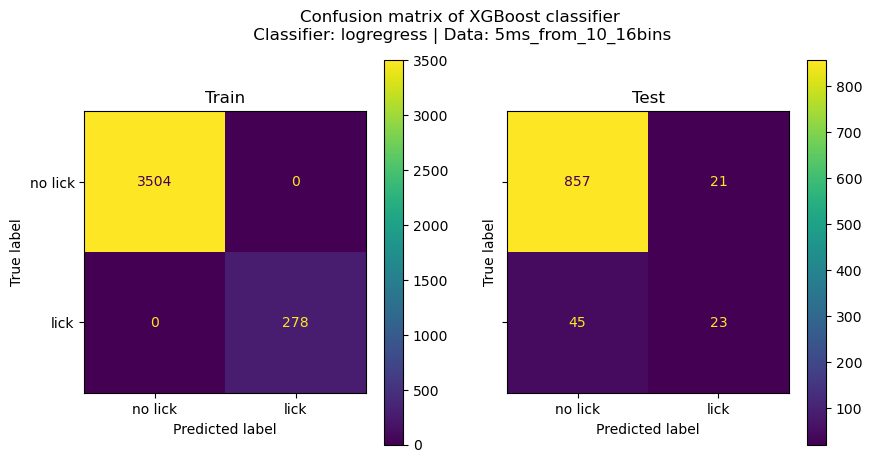

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.938
TP / (TP + FP): train: 1.000 test: 0.596 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 40  28]]


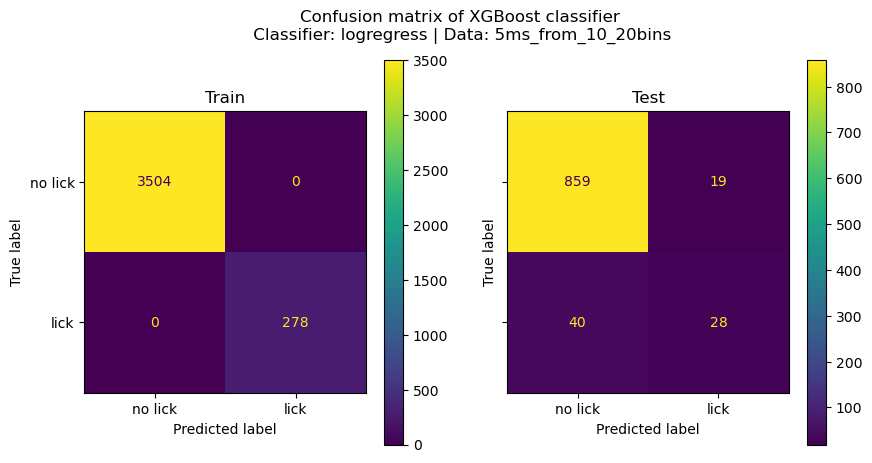

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.625 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 43  25]]


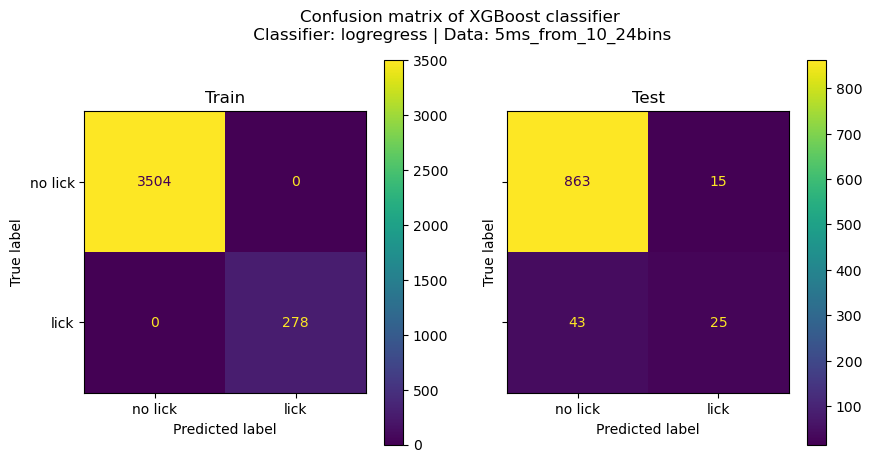

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.945
TP / (TP + FP): train: 1.000 test: 0.735 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 43  25]]


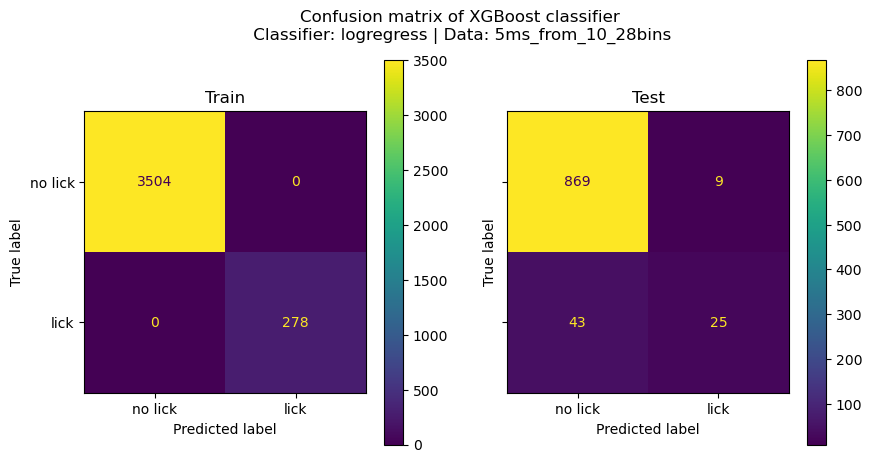

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.945
TP / (TP + FP): train: 1.000 test: 0.690 
TP / (TP + FN): train: 1.000 test: 0.426 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[865  13]
 [ 39  29]]


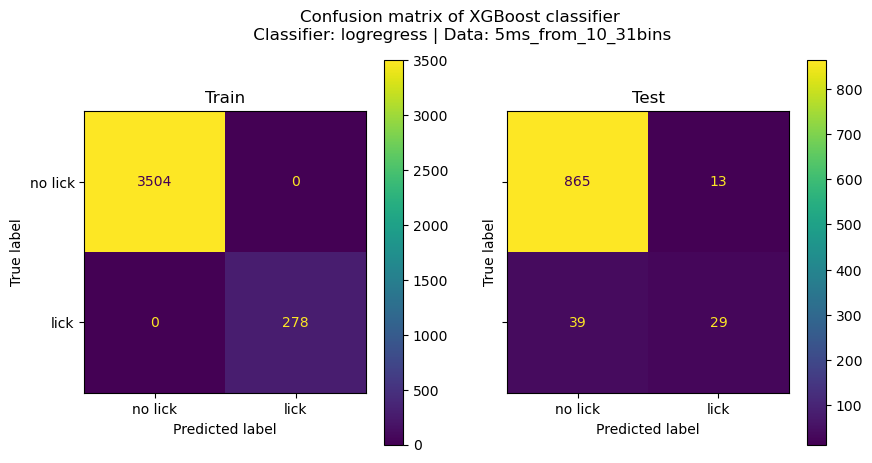

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.937 test: 0.913
TP / (TP + FP): train: 0.736 test: 0.306 
TP / (TP + FN): train: 0.736 test: 0.162 
train_confmat
 [[3481   23]
 [ 214   64]]
test_confmat
 [[853  25]
 [ 57  11]]


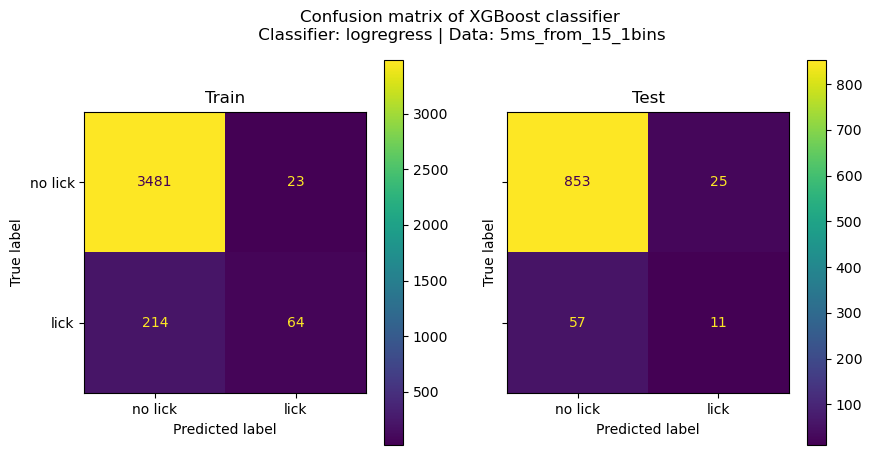

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.992 test: 0.870
TP / (TP + FP): train: 0.984 test: 0.222 
TP / (TP + FN): train: 0.984 test: 0.324 
train_confmat
 [[3500    4]
 [  25  253]]
test_confmat
 [[801  77]
 [ 46  22]]


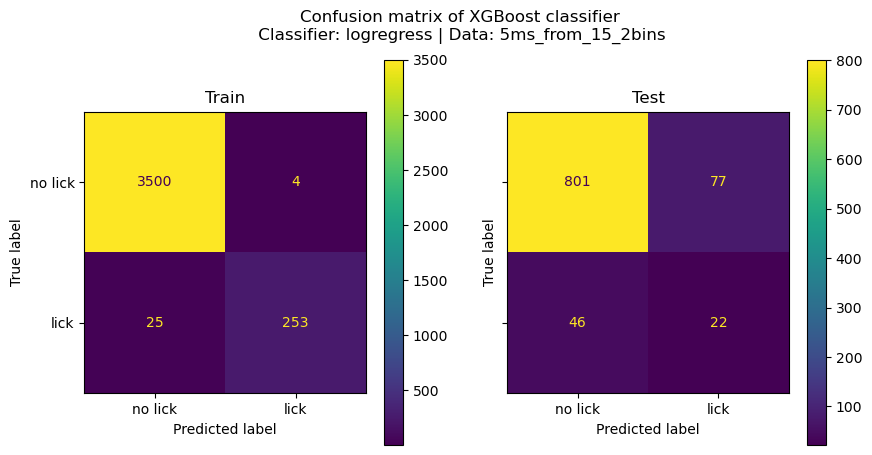

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.902
TP / (TP + FP): train: 1.000 test: 0.295 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[835  43]
 [ 50  18]]


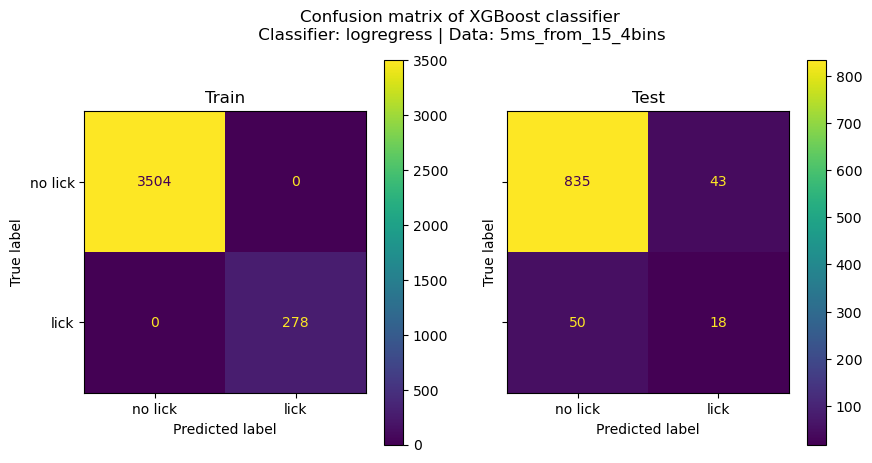

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.921
TP / (TP + FP): train: 1.000 test: 0.436 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[847  31]
 [ 44  24]]


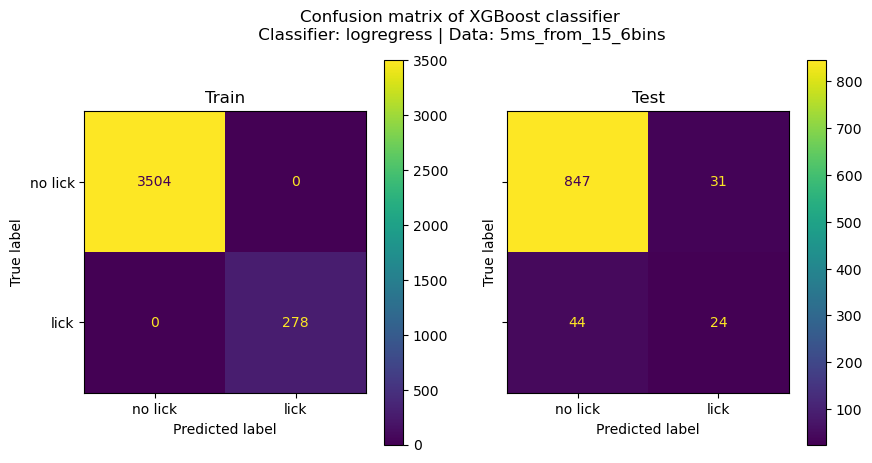

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 49  19]]


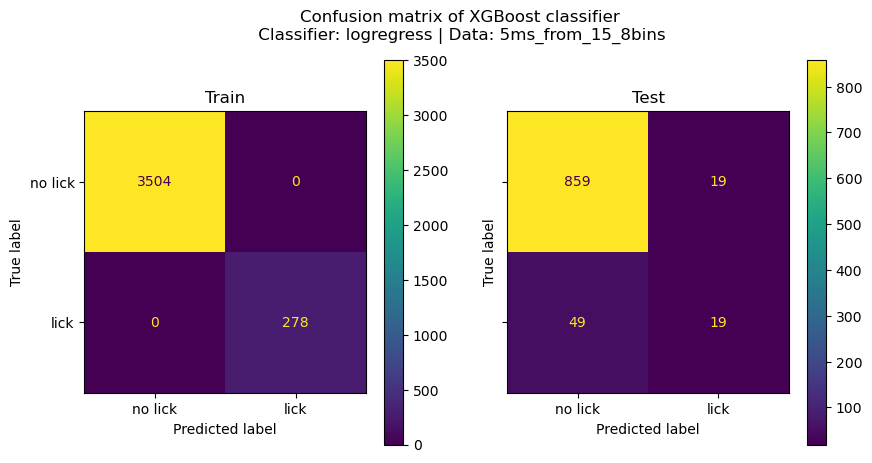

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.489 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[855  23]
 [ 46  22]]


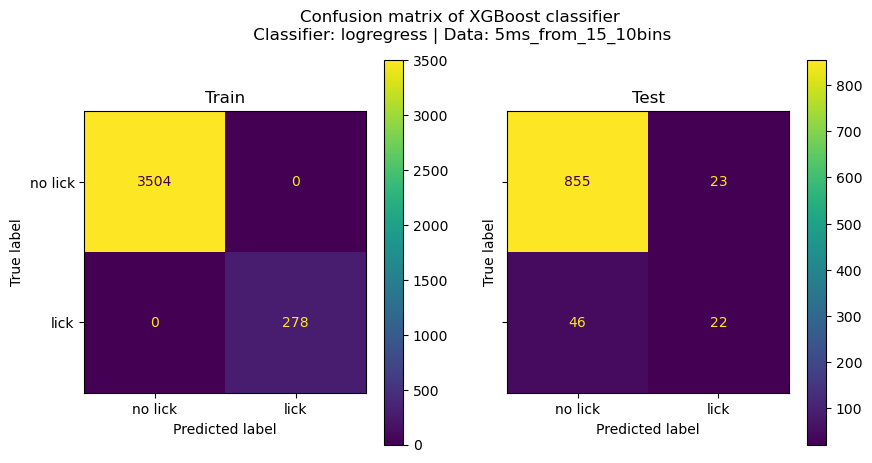

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.511 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[855  23]
 [ 44  24]]


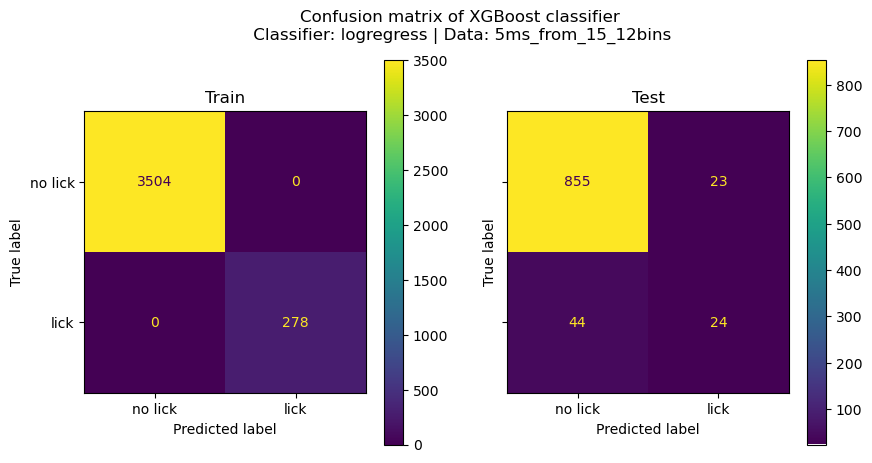

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.457 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[853  25]
 [ 47  21]]


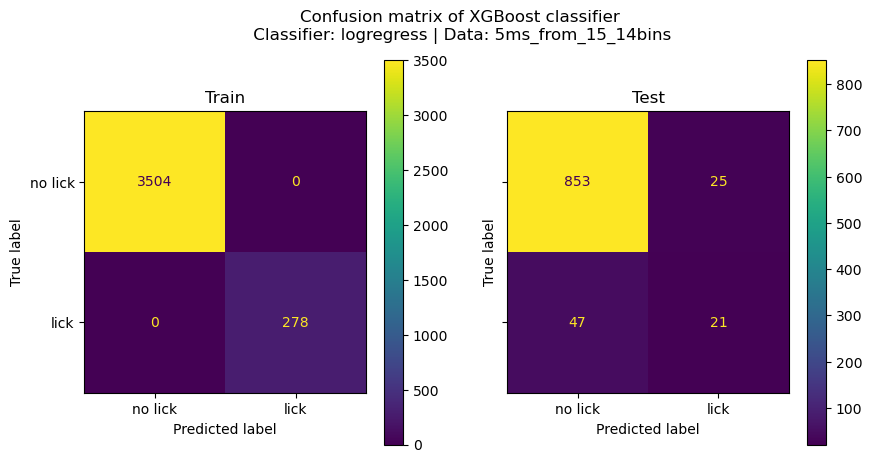

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.477 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[855  23]
 [ 47  21]]


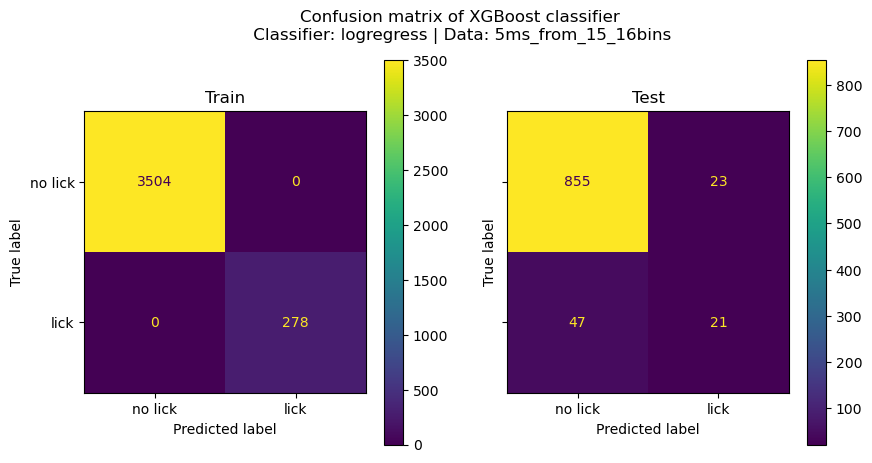

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.605 
TP / (TP + FN): train: 1.000 test: 0.338 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 45  23]]


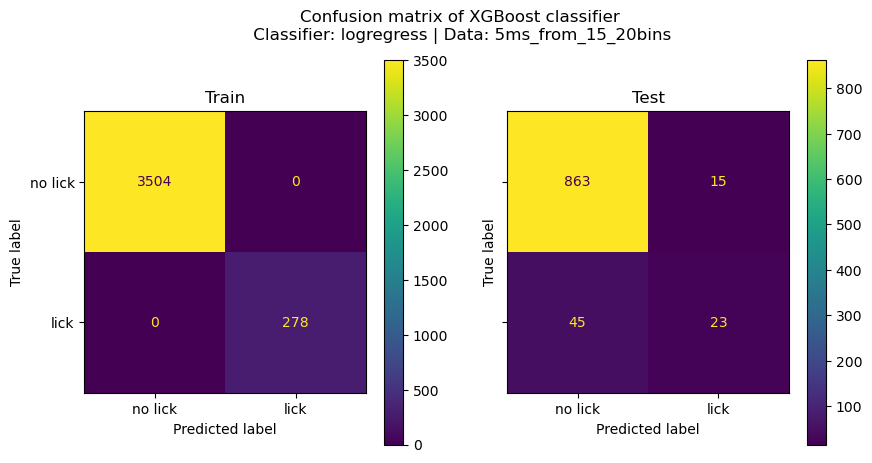

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.939
TP / (TP + FP): train: 1.000 test: 0.632 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[864  14]
 [ 44  24]]


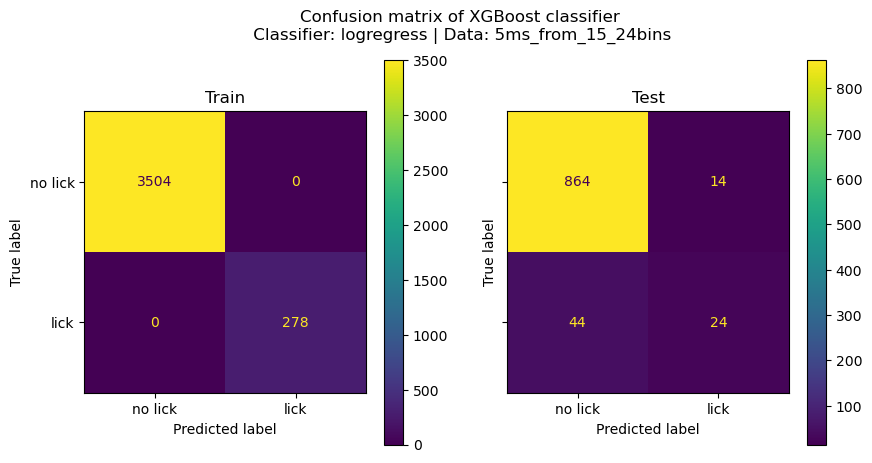

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.611 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[864  14]
 [ 46  22]]


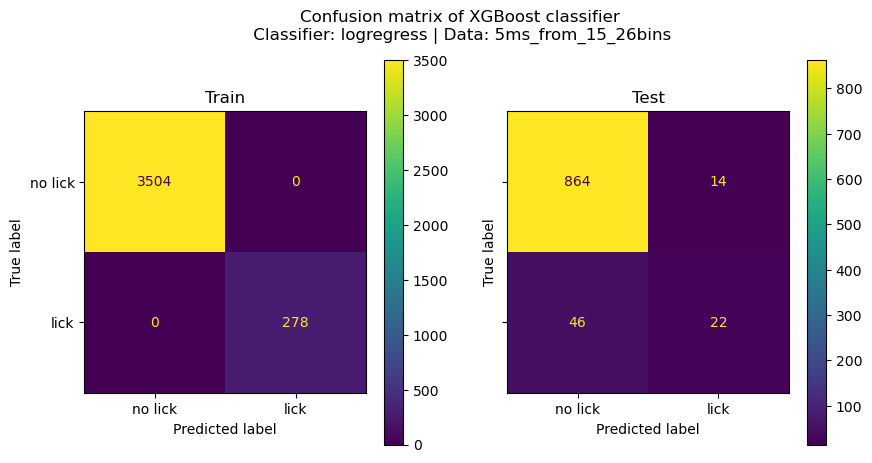

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.939 test: 0.916
TP / (TP + FP): train: 0.743 test: 0.378 
TP / (TP + FN): train: 0.743 test: 0.250 
train_confmat
 [[3478   26]
 [ 203   75]]
test_confmat
 [[850  28]
 [ 51  17]]


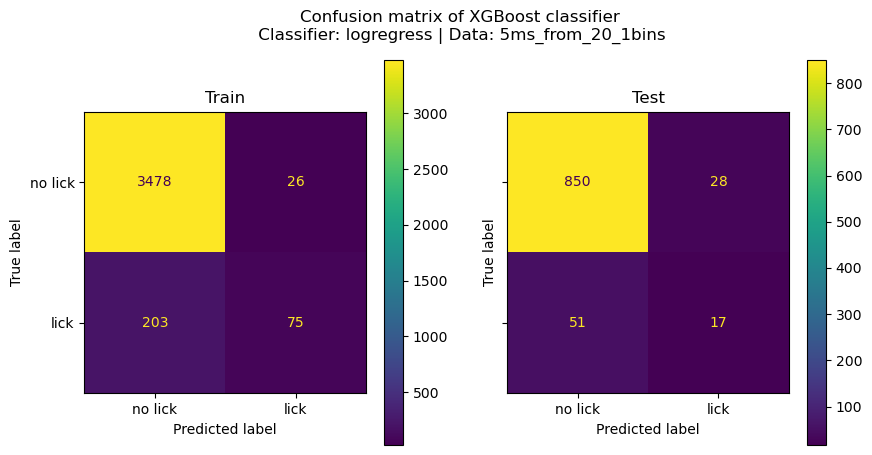

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.996 test: 0.873
TP / (TP + FP): train: 0.996 test: 0.229 
TP / (TP + FN): train: 0.996 test: 0.324 
train_confmat
 [[3503    1]
 [  16  262]]
test_confmat
 [[804  74]
 [ 46  22]]


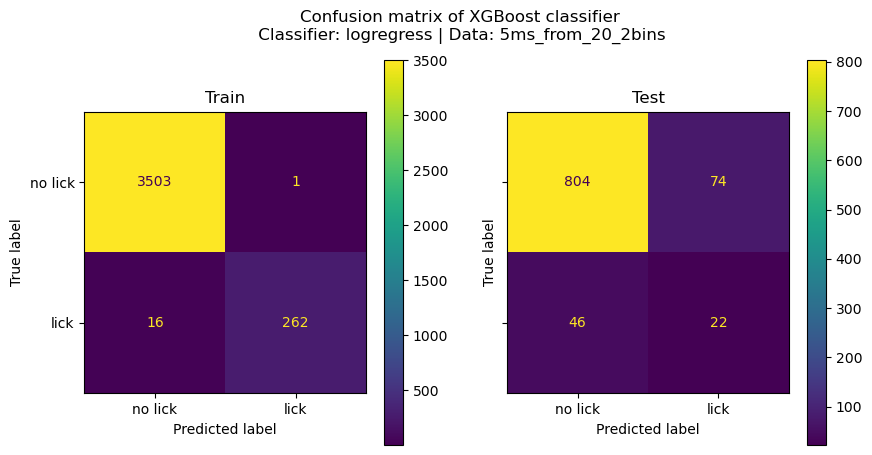

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.915
TP / (TP + FP): train: 1.000 test: 0.389 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[845  33]
 [ 47  21]]


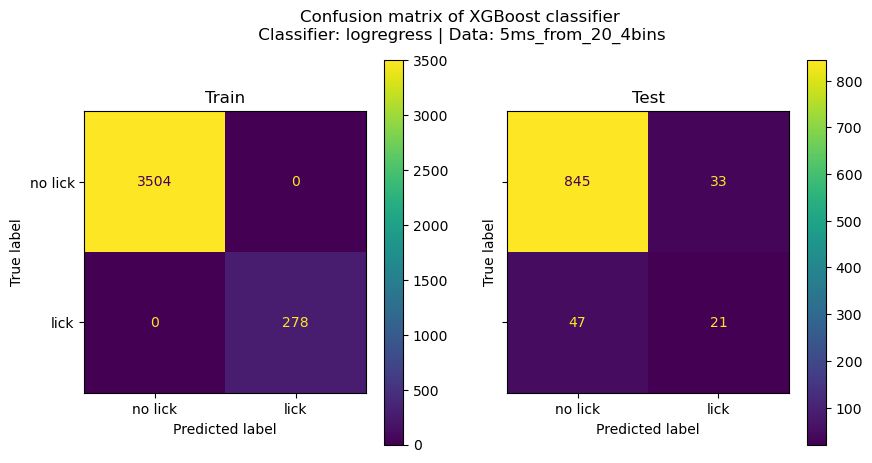

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.907
TP / (TP + FP): train: 1.000 test: 0.315 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[841  37]
 [ 51  17]]


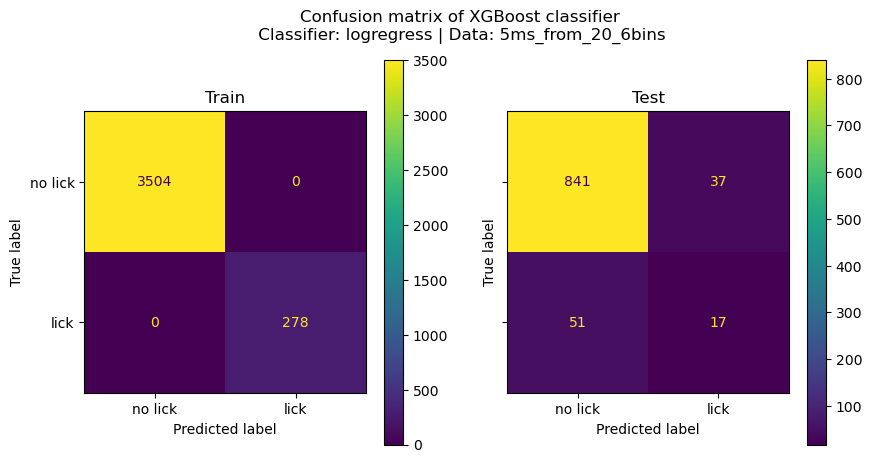

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.921
TP / (TP + FP): train: 1.000 test: 0.429 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[850  28]
 [ 47  21]]


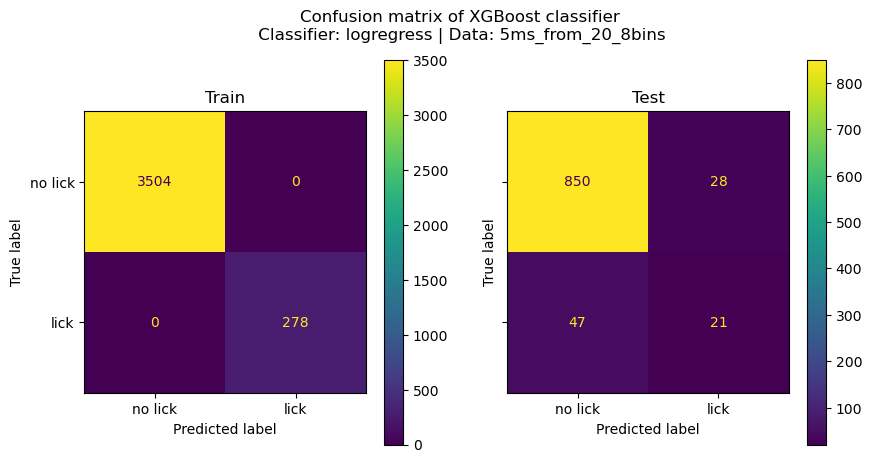

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.462 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[850  28]
 [ 44  24]]


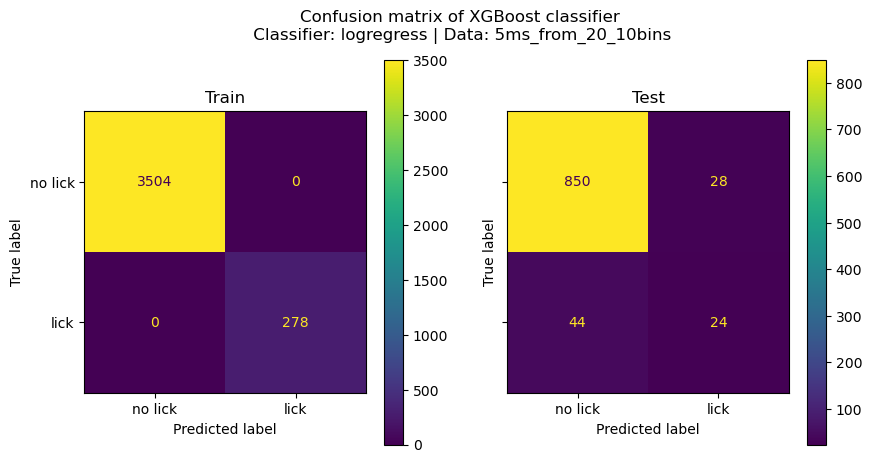

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.453 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[849  29]
 [ 44  24]]


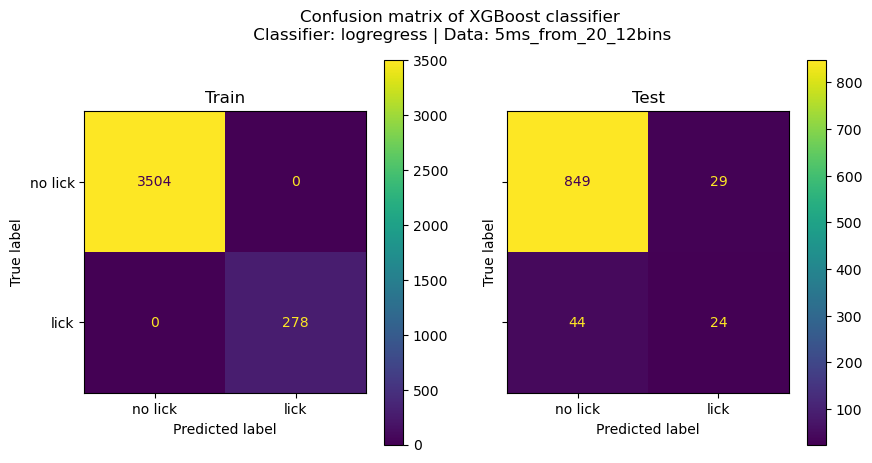

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.923
TP / (TP + FP): train: 1.000 test: 0.453 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[849  29]
 [ 44  24]]


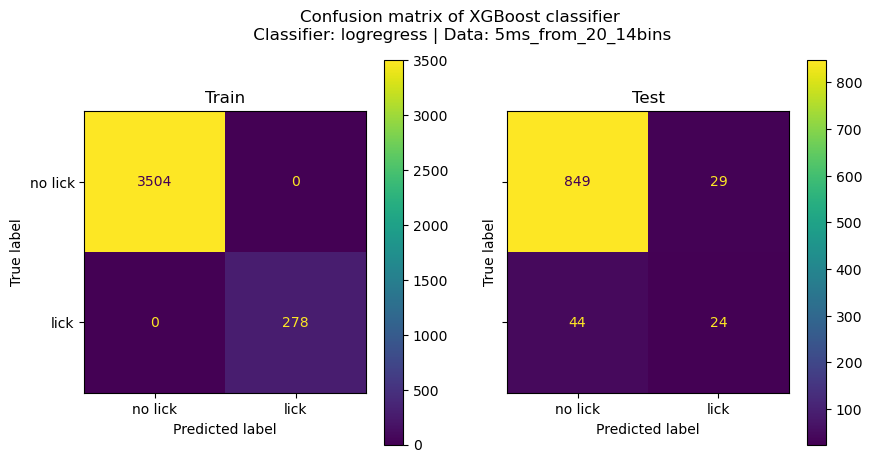

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.512 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 46  22]]


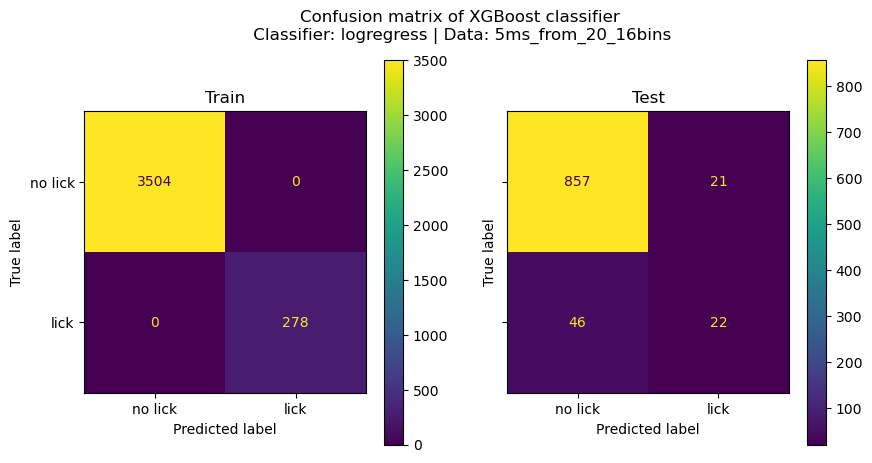

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.537 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[859  19]
 [ 46  22]]


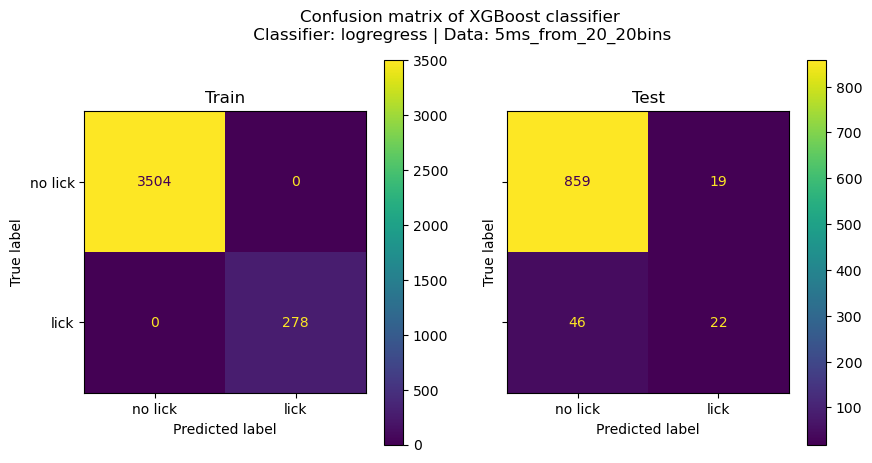

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.934
TP / (TP + FP): train: 1.000 test: 0.571 
TP / (TP + FN): train: 1.000 test: 0.353 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[860  18]
 [ 44  24]]


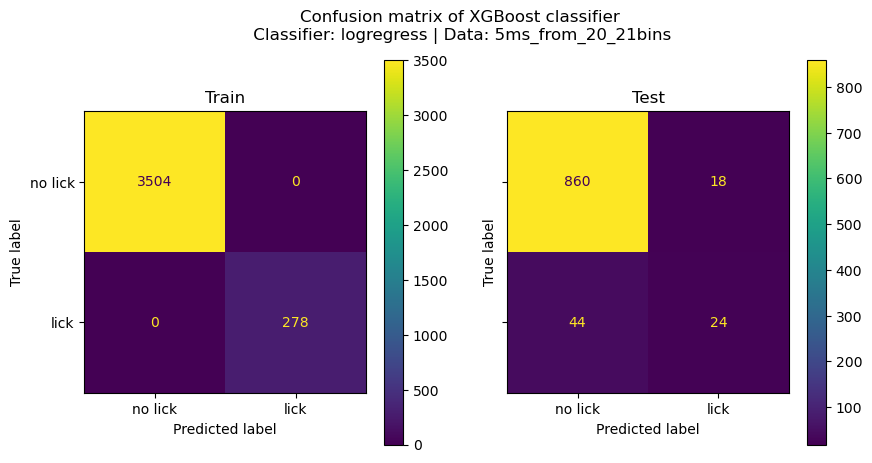

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.941 test: 0.894
TP / (TP + FP): train: 0.752 test: 0.119 
TP / (TP + FN): train: 0.752 test: 0.074 
train_confmat
 [[3478   26]
 [ 199   79]]
test_confmat
 [[841  37]
 [ 63   5]]


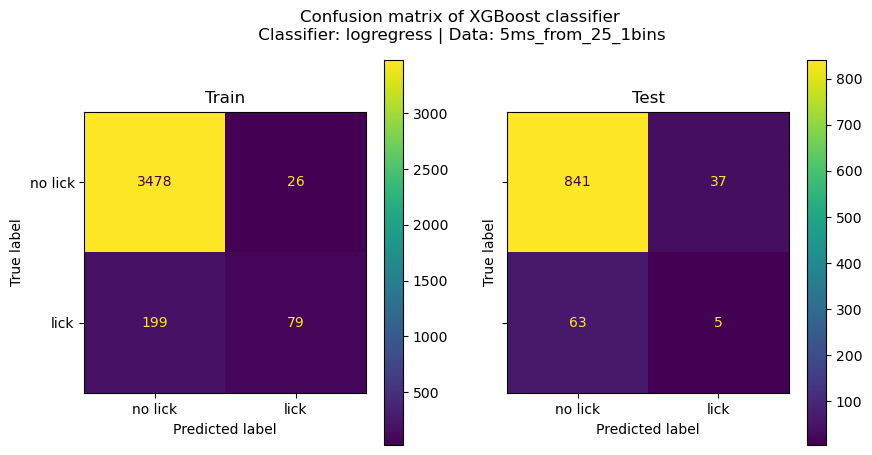

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.994 test: 0.865
TP / (TP + FP): train: 0.992 test: 0.181 
TP / (TP + FN): train: 0.992 test: 0.250 
train_confmat
 [[3502    2]
 [  19  259]]
test_confmat
 [[801  77]
 [ 51  17]]


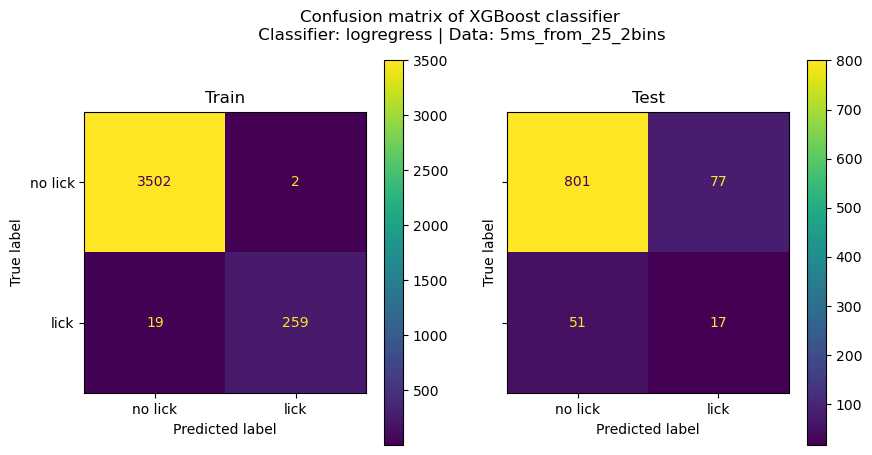

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.884
TP / (TP + FP): train: 1.000 test: 0.216 
TP / (TP + FN): train: 1.000 test: 0.235 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[820  58]
 [ 52  16]]


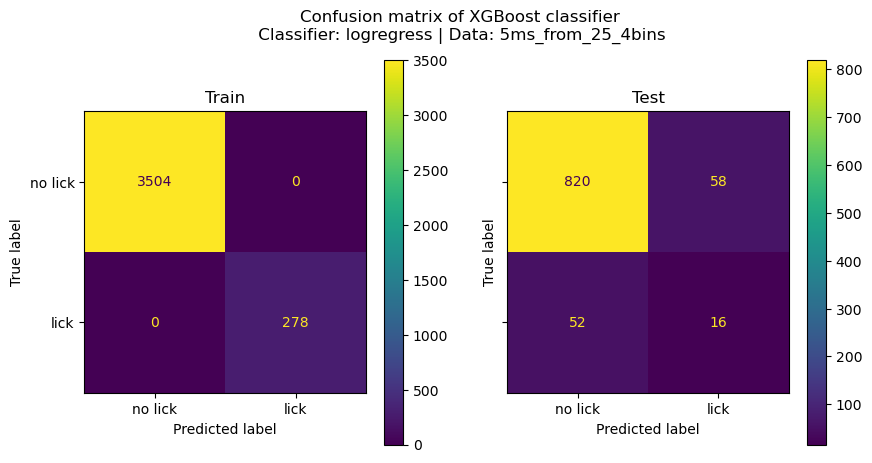

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.901
TP / (TP + FP): train: 1.000 test: 0.268 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[837  41]
 [ 53  15]]


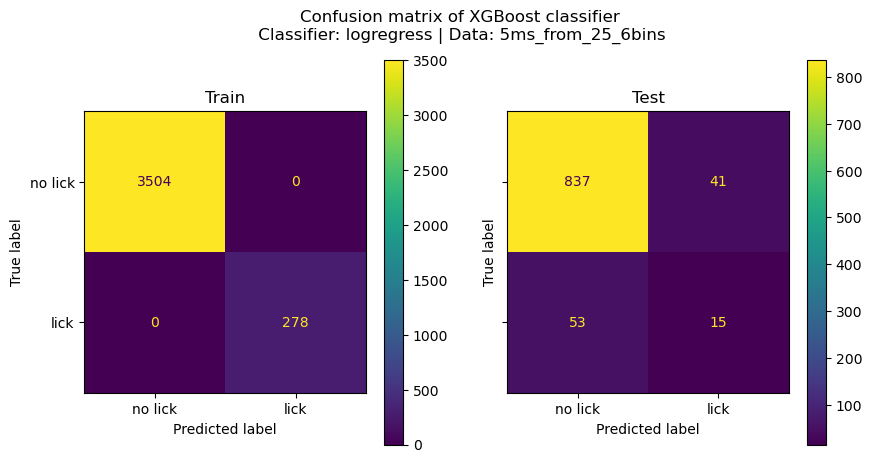

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.911
TP / (TP + FP): train: 1.000 test: 0.352 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[843  35]
 [ 49  19]]


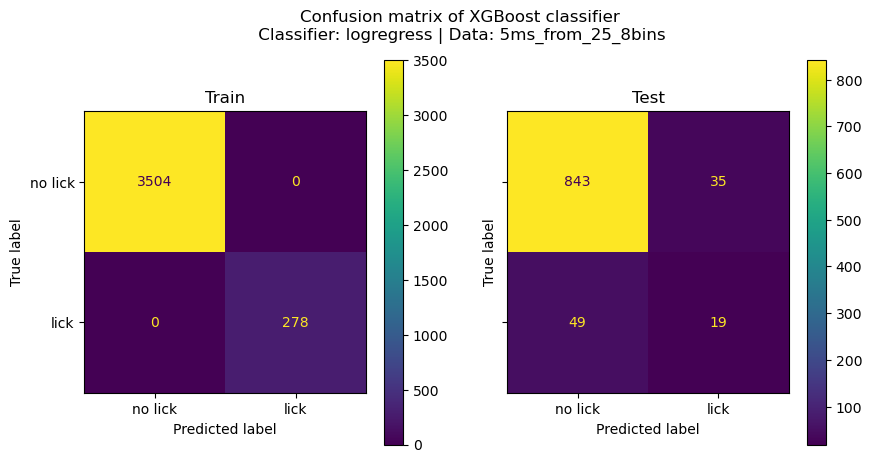

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.909
TP / (TP + FP): train: 1.000 test: 0.304 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[846  32]
 [ 54  14]]


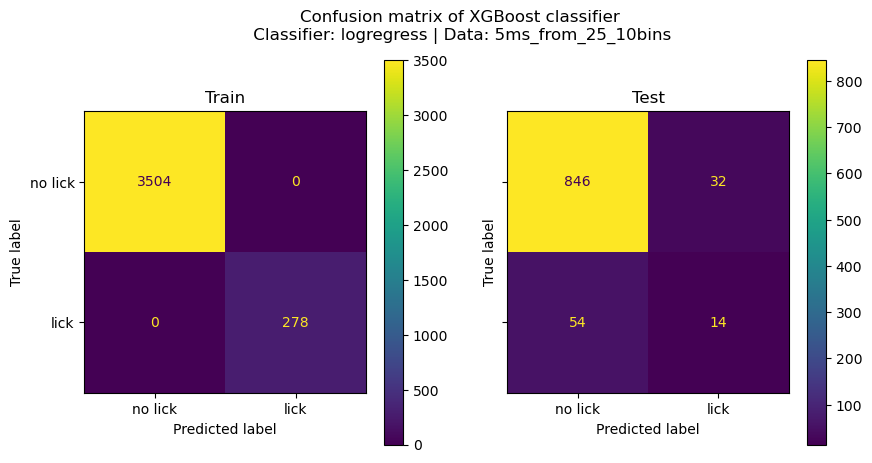

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.920
TP / (TP + FP): train: 1.000 test: 0.382 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[857  21]
 [ 55  13]]


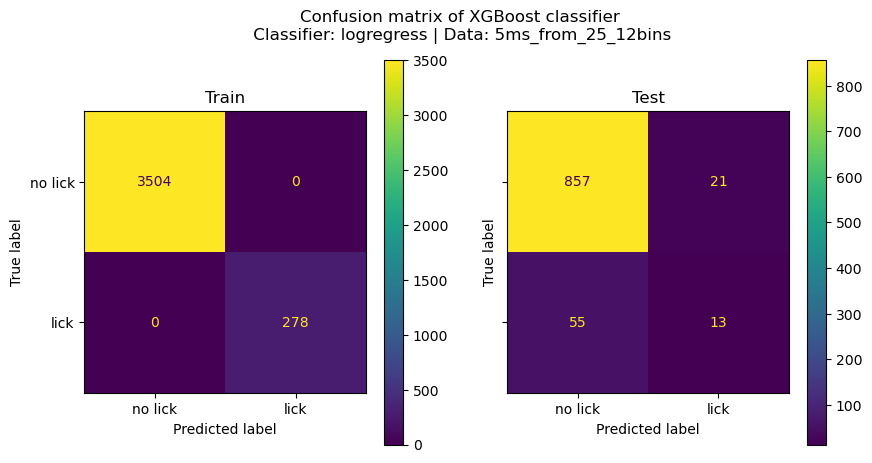

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.924
TP / (TP + FP): train: 1.000 test: 0.444 
TP / (TP + FN): train: 1.000 test: 0.235 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[858  20]
 [ 52  16]]


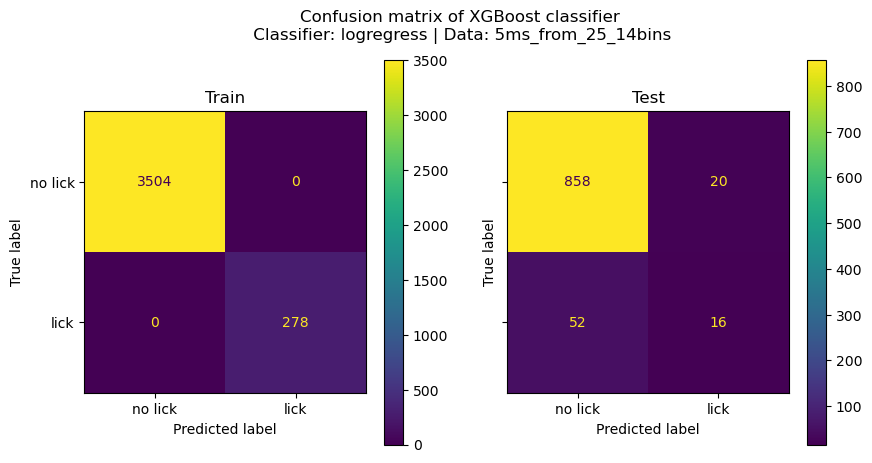

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.488 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[856  22]
 [ 47  21]]


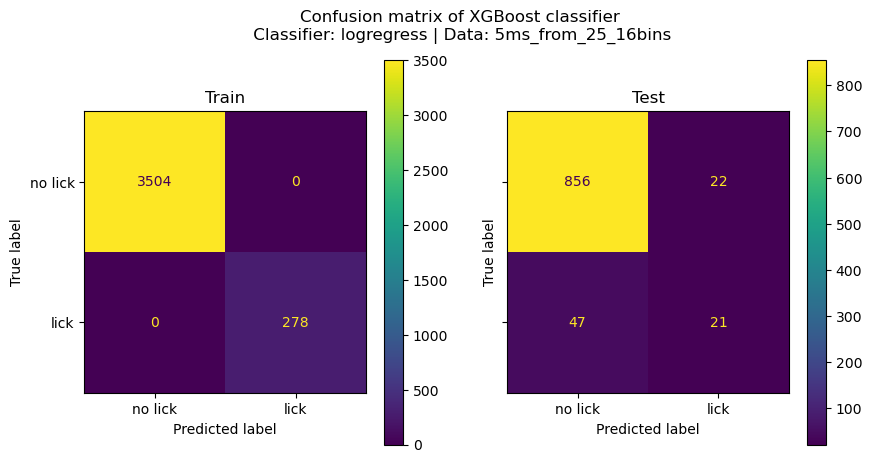

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.927
TP / (TP + FP): train: 1.000 test: 0.488 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[856  22]
 [ 47  21]]


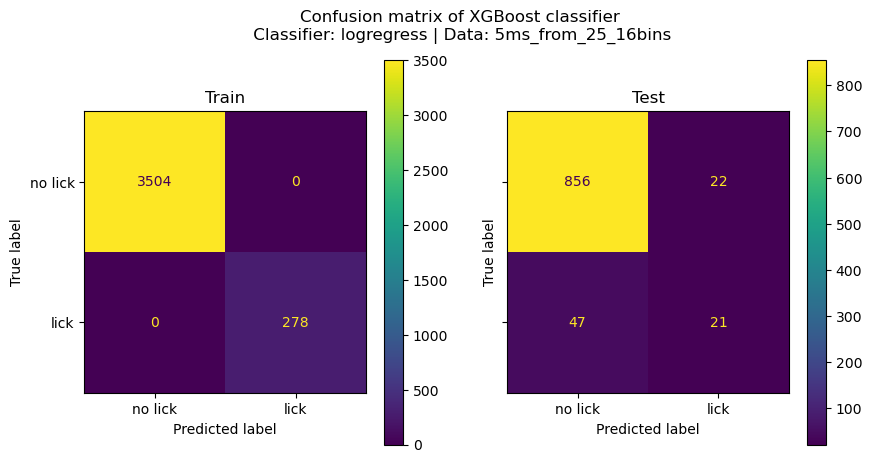

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.942 test: 0.892
TP / (TP + FP): train: 0.724 test: 0.130 
TP / (TP + FN): train: 0.724 test: 0.088 
train_confmat
 [[3469   35]
 [ 186   92]]
test_confmat
 [[838  40]
 [ 62   6]]


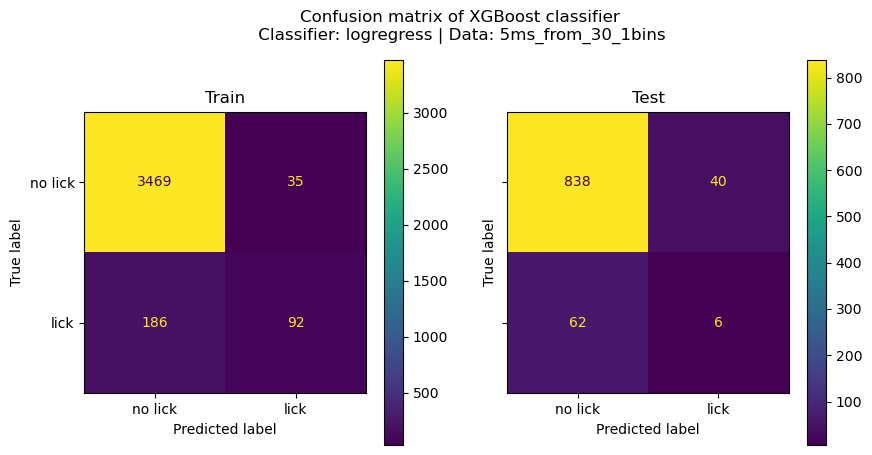

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.997 test: 0.878
TP / (TP + FP): train: 1.000 test: 0.210 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [  10  268]]
test_confmat
 [[814  64]
 [ 51  17]]


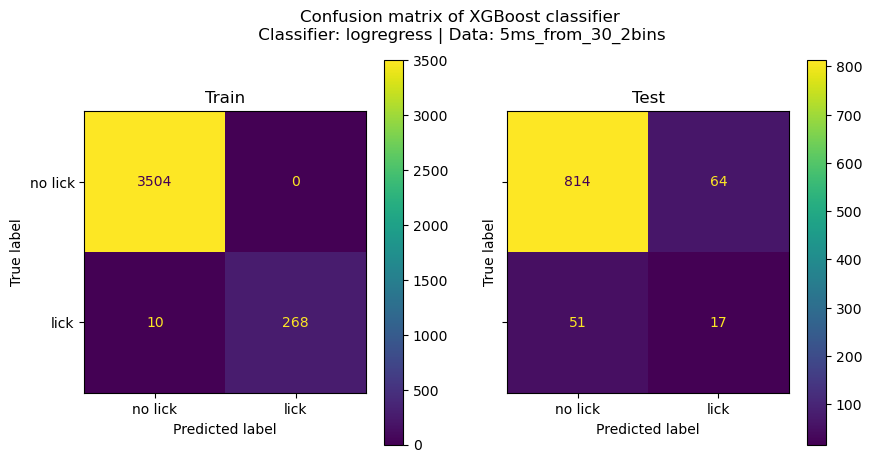

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.886
TP / (TP + FP): train: 1.000 test: 0.206 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[824  54]
 [ 54  14]]


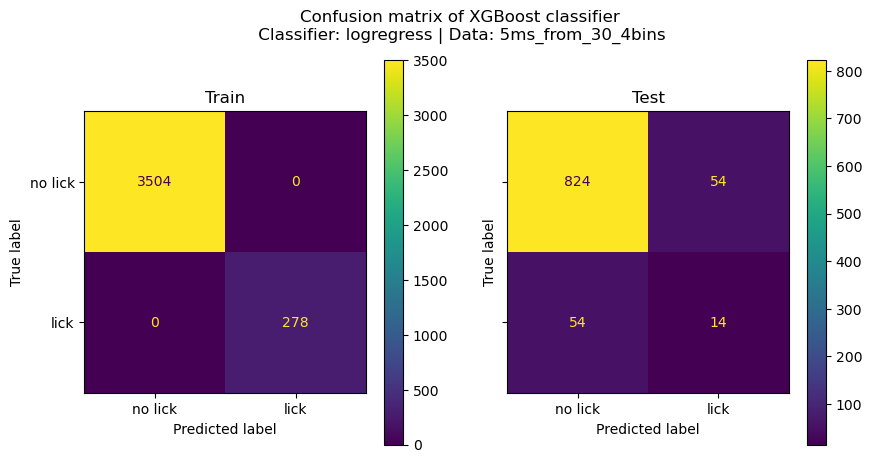

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.906
TP / (TP + FP): train: 1.000 test: 0.277 
TP / (TP + FN): train: 1.000 test: 0.191 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[844  34]
 [ 55  13]]


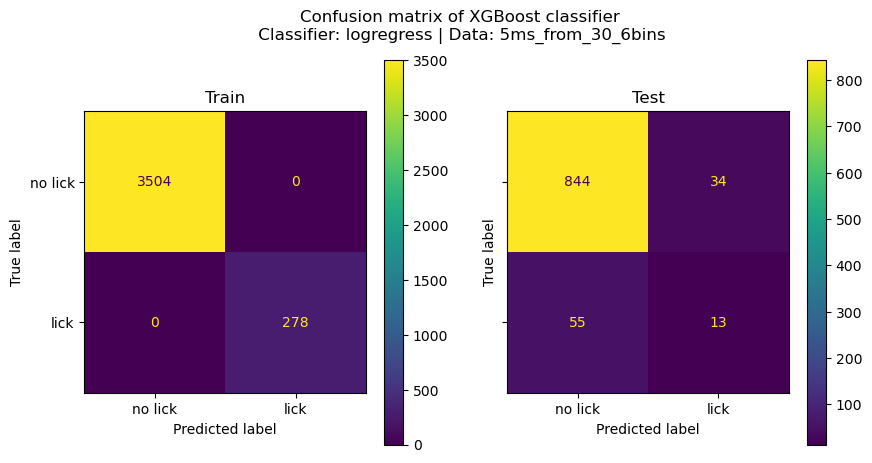

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.915
TP / (TP + FP): train: 1.000 test: 0.357 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[851  27]
 [ 53  15]]


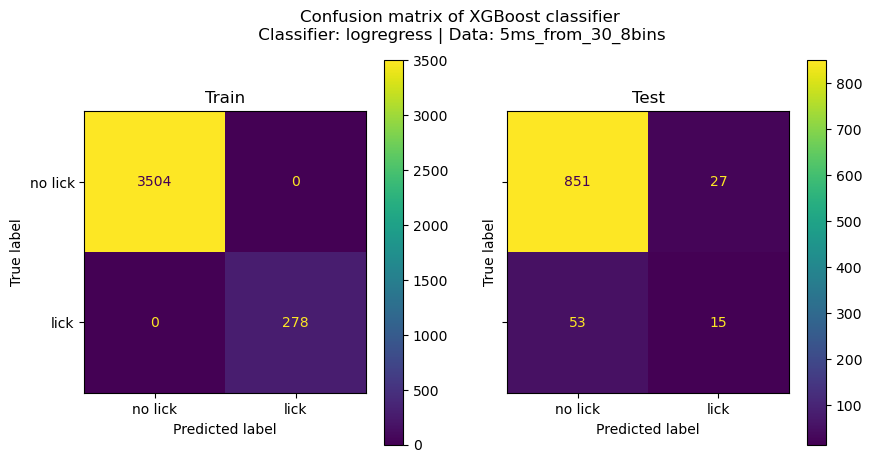

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.922
TP / (TP + FP): train: 1.000 test: 0.429 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[854  24]
 [ 50  18]]


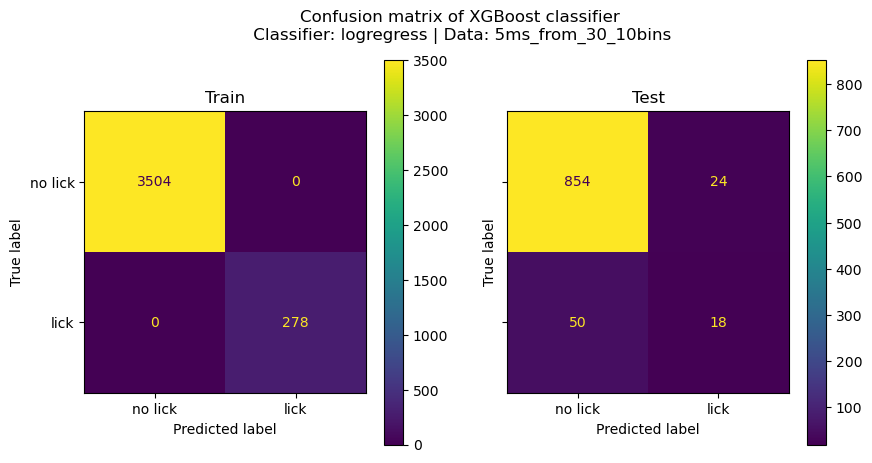

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.922
TP / (TP + FP): train: 1.000 test: 0.432 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[853  25]
 [ 49  19]]


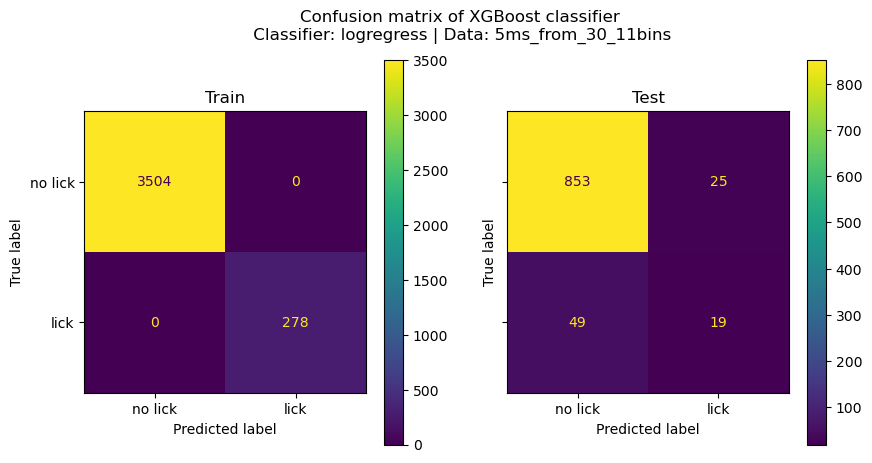

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.940 test: 0.907
TP / (TP + FP): train: 0.723 test: 0.188 
TP / (TP + FN): train: 0.723 test: 0.088 
train_confmat
 [[3473   31]
 [ 197   81]]
test_confmat
 [[852  26]
 [ 62   6]]


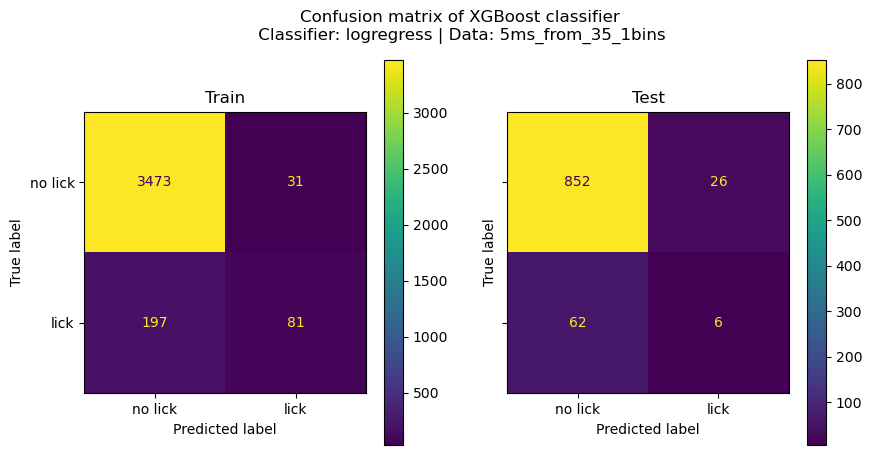

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.996 test: 0.887
TP / (TP + FP): train: 1.000 test: 0.265 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [  16  262]]
test_confmat
 [[817  61]
 [ 46  22]]


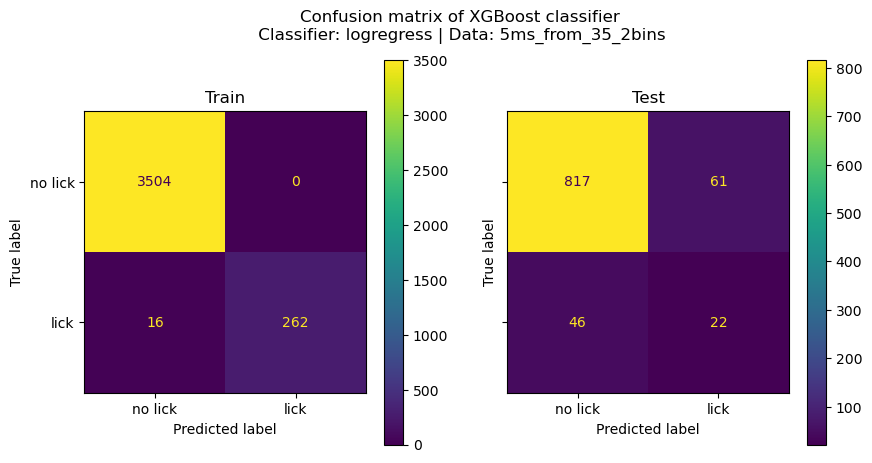

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.899
TP / (TP + FP): train: 1.000 test: 0.274 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[833  45]
 [ 51  17]]


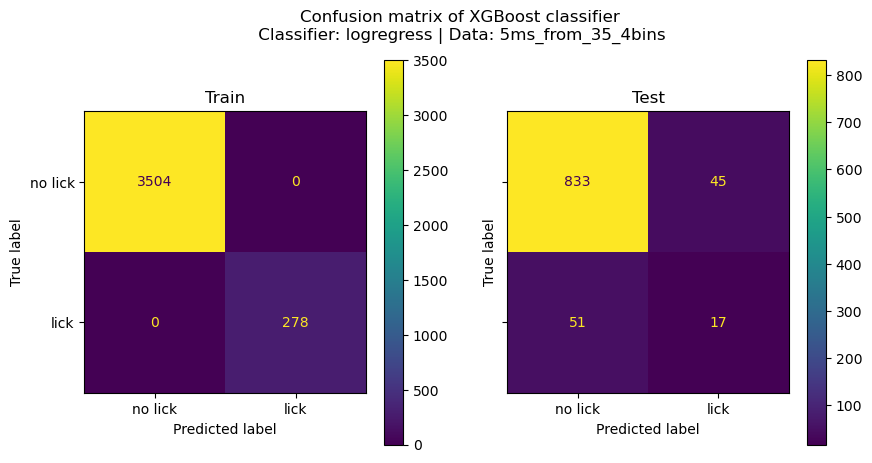

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.919
TP / (TP + FP): train: 1.000 test: 0.415 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[847  31]
 [ 46  22]]


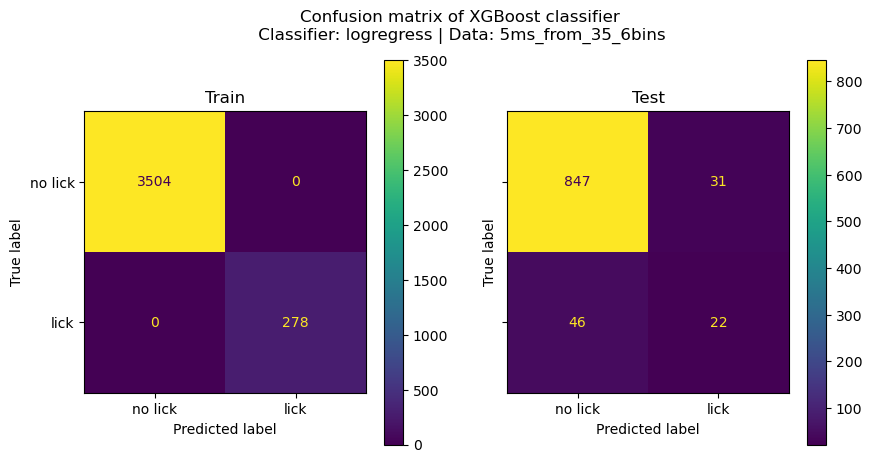

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 1.000 test: 0.919
TP / (TP + FP): train: 1.000 test: 0.415 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[847  31]
 [ 46  22]]


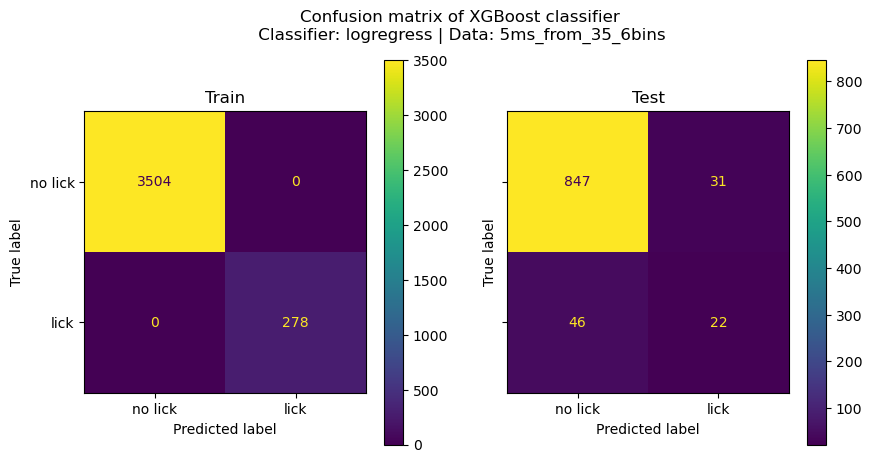

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.952 test: 0.895
TP / (TP + FP): train: 0.787 test: 0.208 
TP / (TP + FN): train: 0.787 test: 0.162 
train_confmat
 [[3468   36]
 [ 145  133]]
test_confmat
 [[836  42]
 [ 57  11]]


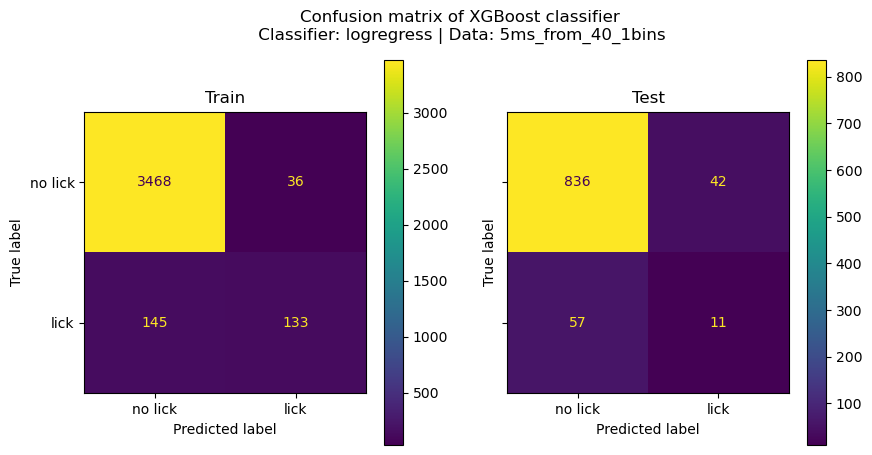

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: train: 0.952 test: 0.895
TP / (TP + FP): train: 0.787 test: 0.208 
TP / (TP + FN): train: 0.787 test: 0.162 
train_confmat
 [[3468   36]
 [ 145  133]]
test_confmat
 [[836  42]
 [ 57  11]]


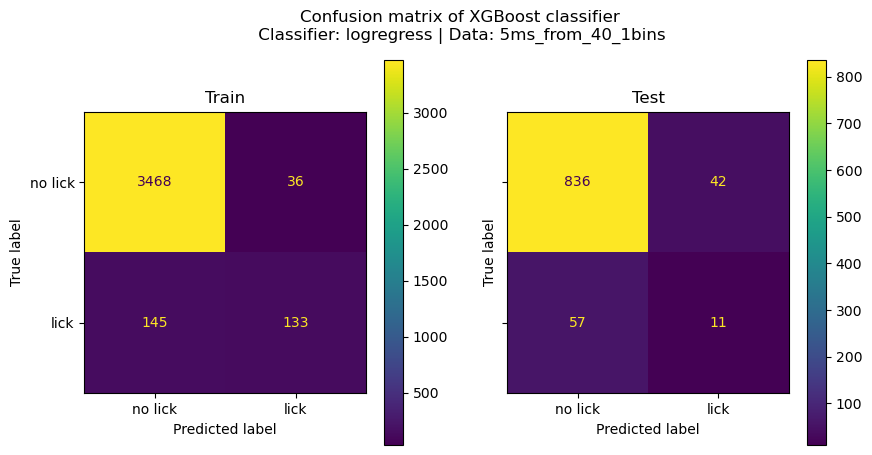

In [10]:
from sklearn.linear_model import LogisticRegression

# fit model no training data
model_str = "logregress" # "gblinear"
df_col = []
for init_bin in range(0, 41, 5):
    for lag in [1, 2, 4, 6, 8, 10, 12, 14, 16, 20, 24, 28, 32, 36, 40]:
        neural_mat_zscore = neural_tsr_zscore[:, :, init_bin:init_bin+lag].\
            reshape(neural_tsr_zscore.shape[0], -1)
        bin_num = neural_tsr_zscore[:, :, init_bin:init_bin+lag].shape[-1]
        data_str = f"5ms_from_{init_bin}_{bin_num}bins"
        y_mat = lick_mat[0]
        # split data into train and test sets
        X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                                y_mat, test_size=test_size, random_state=seed)
        model = LogisticRegression(penalty="l2")
        model.fit(X_train, y_train)
        # make predictions for test data
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        # evaluate predictions
        acc_train = accuracy_score(y_train, y_train_pred)
        acc_test  = accuracy_score(y_test, y_test_pred)
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test  = confusion_matrix(y_test, y_test_pred)
        print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
        print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
        print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
            f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
        print("train_confmat\n", cm_train)
        print("test_confmat\n", cm_test)
        # plot confusion matrix
        figh, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[0])
        axs[0].set_title("Train")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["no lick", "lick"])
        disp.plot(ax=axs[1])
        axs[1].set_title("Test") 
        plt.suptitle(f"Confusion matrix of XGBoost classifier\n Classifier: {model_str} | Data: {data_str}")
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.png"))
        plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.pdf"))
        plt.show()
        df_col.append({"init_bin": init_bin, "lag": lag, "acc_train": acc_train, "acc_test": acc_test,
                       "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
                       "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
                       "cm_train": cm_train, "cm_test": cm_test,
                       "model_str": model_str, "data_str": data_str})
        if bin_num < lag:
            break

df = pd.DataFrame(df_col)
df.to_csv(join(outdir, f"confmat_{model_str}_lags_tab.csv"), index=False)

In [11]:
hit_rate = df["cm_test"].apply(lambda x: x[1, 1] / x[1, :].sum())
df["hit_rate_test"] = hit_rate
hit_rate = df["cm_train"].apply(lambda x: x[1, 1] / x[1, :].sum())
df["hit_rate_train"] = hit_rate

In [12]:
df.to_csv(join(figdir, f"confmat_{model_str}_lags_tab.csv"), index=False)

In [24]:
def moving_average_nd(arr, window_size, axis=0):
    """
    Compute the moving average over a 2D array along the specified axis.

    Parameters:
    arr (numpy.ndarray): The input 2D array.
    window_size (int): The size of the moving average window.
    axis (int): The axis along which to compute the moving average.

    Returns:
    numpy.ndarray: The array after applying the moving average.
    """
    kernel = np.ones(window_size) / window_size
    return np.apply_along_axis(lambda m: np.convolve(m, kernel, mode='valid'), axis=axis, arr=arr)

# Example usage
avg_n = 2
mva_neural_mat = moving_average_nd(neural_mat, window_size=avg_n, axis=-1)
print (mva_neural_mat.shape)
mva_neural_mat_subsp = mva_neural_mat[:, :, ::avg_n]
print(mva_neural_mat_subsp.shape)

(4728, 385, 40)
(4728, 385, 20)


In [25]:
mva_neuron_mean = mva_neural_mat_subsp.mean(axis=(0, 2))
mva_neuron_std = mva_neural_mat_subsp.std(axis=(0, 2))
# normalize
mva_neural_tsr_zscore = ((mva_neural_mat_subsp.astype("float32") - mva_neural_mat_subsp.mean(axis=(0, 2), keepdims=True))
                     / mva_neural_mat_subsp.std(axis=(0, 2), keepdims=True))

In [26]:
outdir

'/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures'

In [31]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
import time
# FILEPATH: /n/home12/binxuwang/Github/Mice-Licking-Classification/neural_licking_XGBoost_classifier.ipynb
# fit model no training data
model_str = "logregress" # "gblinear"
df_col = []
for avg_n in [2, 3, 4, 5, 6, 8, 10, 15, 20, 40]:
    mva_neural_mat = moving_average_nd(neural_mat, window_size=avg_n, axis=-1)
    print (mva_neural_mat.shape)
    mva_neural_mat_subsp = mva_neural_mat[:, :, ::avg_n]
    print(mva_neural_mat_subsp.shape)
    # normalize
    mva_neuron_mean = mva_neural_mat_subsp.mean(axis=(0, 2))
    mva_neuron_std = mva_neural_mat_subsp.std(axis=(0, 2))
    mva_neural_tsr_zscore = ((mva_neural_mat_subsp.astype("float32") - mva_neural_mat_subsp.mean(axis=(0, 2), keepdims=True))
                        / mva_neural_mat_subsp.std(axis=(0, 2), keepdims=True))
    total_bin_num = mva_neural_mat_subsp.shape[-1]
    for lag in range(1, total_bin_num+1):
        for init_bin in range(0, total_bin_num, lag):
        # for lag in [1, 2, 3, 4, 5, 6, 8, 10, 12, 14, 16, 20]:
            neural_mat_zscore = mva_neural_tsr_zscore[:, :, init_bin:init_bin+lag]
            neural_mat_zscore = neural_mat_zscore.reshape(neural_mat_zscore.shape[0], -1)
            bin_num = mva_neural_tsr_zscore[:, :, init_bin:init_bin+lag].shape[-1]
            if bin_num == 0:
                break
            data_str = f"{5 * avg_n}ms_from_{init_bin}_{bin_num}bins"
            y_mat = lick_mat[0]
            # split data into train and test sets
            t0 = time.time()
            X_train, X_test, y_train, y_test = train_test_split(neural_mat_zscore,
                                    y_mat, test_size=test_size, random_state=seed)
            model = LogisticRegressionCV(penalty="l2", cv=5, random_state=seed)
            model.fit(X_train, y_train)
            # make predictions for test data
            y_train_pred = model.predict(X_train)
            y_test_pred = model.predict(X_test)
            # evaluate predictions
            t1 = time.time()
            acc_train = accuracy_score(y_train, y_train_pred)
            acc_test  = accuracy_score(y_test, y_test_pred)
            cm_train = confusion_matrix(y_train, y_train_pred)
            cm_test  = confusion_matrix(y_test, y_test_pred)
            print(f"Avg bins {avg_n}, from {init_bin} to {init_bin + bin_num} bin")
            print(f"Accuracy: train: {acc_train:.3f} test: {acc_test:.3f}")
            print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
                f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
            print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
                f"test: {cm_test[1, 1] / cm_test[1, :].sum():.3f} ")
            print("train_confmat\n", cm_train)
            print("test_confmat\n", cm_test)
            print (f"Time for model: {t1-t0:.2f}s")
            # plot confusion matrix
            # figh, axs = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
            # disp = ConfusionMatrixDisplay(confusion_matrix=cm_train, display_labels=["no lick", "lick"])
            # disp.plot(ax=axs[0])
            # axs[0].set_title("Train")
            # disp = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=["no lick", "lick"])
            # disp.plot(ax=axs[1])
            # axs[1].set_title("Test") 
            # plt.suptitle(f"Confusion matrix of XGBoost classifier\n Classifier: {model_str} | Data: {data_str}")
            # plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.png"))
            # plt.savefig(join(outdir,f"confmat_{model_str}_{data_str}.pdf"))
            # plt.show()
            df_col.append({"init_bin": init_bin, "lag": lag, "bin_num": bin_num,
                           "acc_train": acc_train, "acc_test": acc_test,
                        "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
                        "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
                        "cm_train": cm_train, "cm_test": cm_test,
                        "model_str": model_str, "data_str": data_str})
            if bin_num < lag:
                break

df = pd.DataFrame(df_col)
# df.to_csv(join(outdir, f"confmat_{model_str}_avg_{5*avg_n}ms_tab.csv"), index=False)
df.to_csv(join(outdir, f"confmat_{model_str}_avg_multi_ms_tab.csv"), index=False)

(4728, 385, 40)
(4728, 385, 20)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 1 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 2.71s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 2, from 1 to 2 bin
Accuracy: train: 0.929 test: 0.928
TP / (TP + FP): train: 0.923 test: 0.500 
TP / (TP + FN): train: 0.923 test: 0.015 
train_confmat
 [[3503    1]
 [ 266   12]]
test_confmat
 [[877   1]
 [ 67   1]]
Time for model: 2.78s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 2 to 3 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.60s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 2, from 3 to 4 bin
Accuracy: train: 0.927 test: 0.928
TP / (TP + FP): train: 1.000 test: nan 
TP / (TP + FN): train: 1.000 test: 0.000 
train_confmat
 [[3504    0]
 [ 275    3]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.64s


/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=

Avg bins 2, from 4 to 5 bin
Accuracy: train: 0.929 test: 0.929
TP / (TP + FP): train: 0.857 test: 0.600 
TP / (TP + FN): train: 0.857 test: 0.044 
train_confmat
 [[3502    2]
 [ 266   12]]
test_confmat
 [[876   2]
 [ 65   3]]
Time for model: 3.30s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 5 to 6 bin
Accuracy: train: 0.929 test: 0.931
TP / (TP + FP): train: 0.846 test: 1.000 
TP / (TP + FN): train: 0.846 test: 0.044 
train_confmat
 [[3502    2]
 [ 267   11]]
test_confmat
 [[878   0]
 [ 65   3]]
Time for model: 3.66s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 6 to 7 bin
Accuracy: train: 0.931 test: 0.929
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [ 260   18]]
test_confmat
 [[877   1]
 [ 66   2]]
Time for model: 3.60s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 7 to 8 bin
Accuracy: train: 0.931 test: 0.930
TP / (TP + FP): train: 0.833 test: 1.000 
TP / (TP + FN): train: 0.833 test: 0.029 
train_confmat
 [[3500    4]
 [ 258   20]]
test_confmat
 [[878   0]
 [ 66   2]]
Time for model: 3.61s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 8 to 9 bin
Accuracy: train: 0.933 test: 0.928
TP / (TP + FP): train: 0.963 test: 0.500 
TP / (TP + FN): train: 0.963 test: 0.029 
train_confmat
 [[3503    1]
 [ 252   26]]
test_confmat
 [[876   2]
 [ 66   2]]
Time for model: 3.63s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 9 to 10 bin
Accuracy: train: 0.930 test: 0.930
TP / (TP + FP): train: 0.792 test: 0.750 
TP / (TP + FN): train: 0.792 test: 0.044 
train_confmat
 [[3499    5]
 [ 259   19]]
test_confmat
 [[877   1]
 [ 65   3]]
Time for model: 3.66s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 10 to 11 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.49s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 2, from 11 to 12 bin
Accuracy: train: 0.929 test: 0.933
TP / (TP + FP): train: 0.739 test: 0.857 
TP / (TP + FN): train: 0.739 test: 0.088 
train_confmat
 [[3498    6]
 [ 261   17]]
test_confmat
 [[877   1]
 [ 62   6]]
Time for model: 2.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 13 bin
Accuracy: train: 0.931 test: 0.925
TP / (TP + FP): train: 0.905 test: 0.200 
TP / (TP + FN): train: 0.905 test: 0.015 
train_confmat
 [[3502    2]
 [ 259   19]]
test_confmat
 [[874   4]
 [ 67   1]]
Time for model: 2.87s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 13 to 14 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 2.91s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 2, from 14 to 15 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.62s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 2, from 15 to 16 bin
Accuracy: train: 0.942 test: 0.926
TP / (TP + FP): train: 0.831 test: 0.455 
TP / (TP + FN): train: 0.831 test: 0.147 
train_confmat
 [[3489   15]
 [ 204   74]]
test_confmat
 [[866  12]
 [ 58  10]]
Time for model: 3.64s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 16 to 17 bin
Accuracy: train: 0.930 test: 0.928
TP / (TP + FP): train: 0.933 test: nan 
TP / (TP + FN): train: 0.933 test: 0.000 
train_confmat
 [[3503    1]
 [ 264   14]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.66s


/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=

Avg bins 2, from 17 to 18 bin
Accuracy: train: 0.931 test: 0.928
TP / (TP + FP): train: 1.000 test: 0.500 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [ 261   17]]
test_confmat
 [[876   2]
 [ 66   2]]
Time for model: 3.64s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 19 bin
Accuracy: train: 0.934 test: 0.928
TP / (TP + FP): train: 0.909 test: 0.500 
TP / (TP + FN): train: 0.909 test: 0.044 
train_confmat
 [[3501    3]
 [ 248   30]]
test_confmat
 [[875   3]
 [ 65   3]]
Time for model: 3.63s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 19 to 20 bin
Accuracy: train: 0.935 test: 0.929
TP / (TP + FP): train: 0.886 test: 0.600 
TP / (TP + FN): train: 0.886 test: 0.044 
train_confmat
 [[3499    5]
 [ 239   39]]
test_confmat
 [[876   2]
 [ 65   3]]
Time for model: 3.67s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 2 bin
Accuracy: train: 0.942 test: 0.930
TP / (TP + FP): train: 0.984 test: 0.750 
TP / (TP + FN): train: 0.984 test: 0.044 
train_confmat
 [[3503    1]
 [ 217   61]]
test_confmat
 [[877   1]
 [ 65   3]]
Time for model: 6.40s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 2 to 4 bin
Accuracy: train: 0.934 test: 0.929
TP / (TP + FP): train: 0.968 test: 0.667 
TP / (TP + FN): train: 0.968 test: 0.029 
train_confmat
 [[3503    1]
 [ 248   30]]
test_confmat
 [[877   1]
 [ 66   2]]
Time for model: 6.45s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 4 to 6 bin
Accuracy: train: 0.940 test: 0.929
TP / (TP + FP): train: 0.964 test: 0.538 
TP / (TP + FN): train: 0.964 test: 0.103 
train_confmat
 [[3502    2]
 [ 224   54]]
test_confmat
 [[872   6]
 [ 61   7]]
Time for model: 6.61s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 6 to 8 bin
Accuracy: train: 0.941 test: 0.937
TP / (TP + FP): train: 0.921 test: 0.750 
TP / (TP + FN): train: 0.921 test: 0.176 
train_confmat
 [[3499    5]
 [ 220   58]]
test_confmat
 [[874   4]
 [ 56  12]]
Time for model: 6.74s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 8 to 10 bin
Accuracy: train: 0.942 test: 0.934
TP / (TP + FP): train: 0.925 test: 0.688 
TP / (TP + FN): train: 0.925 test: 0.162 
train_confmat
 [[3499    5]
 [ 216   62]]
test_confmat
 [[873   5]
 [ 57  11]]
Time for model: 6.67s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 10 to 12 bin
Accuracy: train: 0.946 test: 0.933
TP / (TP + FP): train: 0.939 test: 0.727 
TP / (TP + FN): train: 0.939 test: 0.118 
train_confmat
 [[3499    5]
 [ 201   77]]
test_confmat
 [[875   3]
 [ 60   8]]
Time for model: 6.72s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 14 bin
Accuracy: train: 0.941 test: 0.928
TP / (TP + FP): train: 0.965 test: 0.500 
TP / (TP + FN): train: 0.965 test: 0.074 
train_confmat
 [[3502    2]
 [ 223   55]]
test_confmat
 [[873   5]
 [ 63   5]]
Time for model: 7.12s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 14 to 16 bin
Accuracy: train: 0.940 test: 0.930
TP / (TP + FP): train: 0.903 test: 0.625 
TP / (TP + FN): train: 0.903 test: 0.074 
train_confmat
 [[3498    6]
 [ 222   56]]
test_confmat
 [[875   3]
 [ 63   5]]
Time for model: 6.70s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 16 to 18 bin
Accuracy: train: 0.940 test: 0.931
TP / (TP + FP): train: 0.964 test: 0.667 
TP / (TP + FN): train: 0.964 test: 0.088 
train_confmat
 [[3502    2]
 [ 225   53]]
test_confmat
 [[875   3]
 [ 62   6]]
Time for model: 6.73s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 20 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.931 test: 0.375 
TP / (TP + FN): train: 0.931 test: 0.088 
train_confmat
 [[3497    7]
 [ 184   94]]
test_confmat
 [[868  10]
 [ 62   6]]
Time for model: 6.58s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 3 bin
Accuracy: train: 0.951 test: 0.933
TP / (TP + FP): train: 0.990 test: 0.667 
TP / (TP + FN): train: 0.990 test: 0.147 
train_confmat
 [[3503    1]
 [ 183   95]]
test_confmat
 [[873   5]
 [ 58  10]]
Time for model: 9.35s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 3 to 6 bin
Accuracy: train: 0.952 test: 0.929
TP / (TP + FP): train: 0.990 test: 0.533 
TP / (TP + FN): train: 0.990 test: 0.118 
train_confmat
 [[3503    1]
 [ 181   97]]
test_confmat
 [[871   7]
 [ 60   8]]
Time for model: 9.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 6 to 9 bin
Accuracy: train: 0.953 test: 0.934
TP / (TP + FP): train: 0.981 test: 0.636 
TP / (TP + FN): train: 0.981 test: 0.206 
train_confmat
 [[3502    2]
 [ 174  104]]
test_confmat
 [[870   8]
 [ 54  14]]
Time for model: 9.17s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 9 to 12 bin
Accuracy: train: 0.956 test: 0.939
TP / (TP + FP): train: 0.944 test: 0.778 
TP / (TP + FN): train: 0.944 test: 0.206 
train_confmat
 [[3497    7]
 [ 160  118]]
test_confmat
 [[874   4]
 [ 54  14]]
Time for model: 9.64s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 15 bin
Accuracy: train: 0.951 test: 0.927
TP / (TP + FP): train: 0.979 test: 0.455 
TP / (TP + FN): train: 0.979 test: 0.074 
train_confmat
 [[3502    2]
 [ 185   93]]
test_confmat
 [[872   6]
 [ 63   5]]
Time for model: 10.60s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 15 to 18 bin
Accuracy: train: 0.953 test: 0.929
TP / (TP + FP): train: 0.972 test: 0.538 
TP / (TP + FN): train: 0.972 test: 0.103 
train_confmat
 [[3501    3]
 [ 174  104]]
test_confmat
 [[872   6]
 [ 61   7]]
Time for model: 8.96s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 20 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.931 test: 0.375 
TP / (TP + FN): train: 0.931 test: 0.088 
train_confmat
 [[3497    7]
 [ 184   94]]
test_confmat
 [[868  10]
 [ 62   6]]
Time for model: 6.65s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 4 bin
Accuracy: train: 0.962 test: 0.938
TP / (TP + FP): train: 0.986 test: 0.765 
TP / (TP + FN): train: 0.986 test: 0.191 
train_confmat
 [[3502    2]
 [ 140  138]]
test_confmat
 [[874   4]
 [ 55  13]]
Time for model: 13.21s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 4 to 8 bin
Accuracy: train: 0.962 test: 0.937
TP / (TP + FP): train: 0.986 test: 0.700 
TP / (TP + FN): train: 0.986 test: 0.206 
train_confmat
 [[3502    2]
 [ 140  138]]
test_confmat
 [[872   6]
 [ 54  14]]
Time for model: 13.22s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 8 to 12 bin
Accuracy: train: 0.964 test: 0.937
TP / (TP + FP): train: 0.973 test: 0.667 
TP / (TP + FN): train: 0.973 test: 0.235 
train_confmat
 [[3500    4]
 [ 133  145]]
test_confmat
 [[870   8]
 [ 52  16]]
Time for model: 13.00s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 16 bin
Accuracy: train: 0.964 test: 0.929
TP / (TP + FP): train: 0.980 test: 0.524 
TP / (TP + FN): train: 0.980 test: 0.162 
train_confmat
 [[3501    3]
 [ 134  144]]
test_confmat
 [[868  10]
 [ 57  11]]
Time for model: 14.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 16 to 20 bin
Accuracy: train: 0.966 test: 0.925
TP / (TP + FP): train: 0.969 test: 0.435 
TP / (TP + FN): train: 0.969 test: 0.147 
train_confmat
 [[3499    5]
 [ 124  154]]
test_confmat
 [[865  13]
 [ 58  10]]
Time for model: 12.81s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 5 bin
Accuracy: train: 0.973 test: 0.937
TP / (TP + FP): train: 0.989 test: 0.682 
TP / (TP + FN): train: 0.989 test: 0.221 
train_confmat
 [[3502    2]
 [ 101  177]]
test_confmat
 [[871   7]
 [ 53  15]]
Time for model: 20.65s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 5 to 10 bin
Accuracy: train: 0.972 test: 0.945
TP / (TP + FP): train: 0.983 test: 0.750 
TP / (TP + FN): train: 0.983 test: 0.353 
train_confmat
 [[3501    3]
 [ 104  174]]
test_confmat
 [[870   8]
 [ 44  24]]
Time for model: 18.49s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 10 to 15 bin
Accuracy: train: 0.972 test: 0.930
TP / (TP + FP): train: 0.994 test: 0.536 
TP / (TP + FN): train: 0.994 test: 0.221 
train_confmat
 [[3503    1]
 [ 105  173]]
test_confmat
 [[865  13]
 [ 53  15]]
Time for model: 20.59s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 15 to 20 bin
Accuracy: train: 0.975 test: 0.931
TP / (TP + FP): train: 0.995 test: 0.560 
TP / (TP + FN): train: 0.995 test: 0.206 
train_confmat
 [[3503    1]
 [  94  184]]
test_confmat
 [[867  11]
 [ 54  14]]
Time for model: 19.27s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 6 bin
Accuracy: train: 0.981 test: 0.937
TP / (TP + FP): train: 1.000 test: 0.682 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [  71  207]]
test_confmat
 [[871   7]
 [ 53  15]]
Time for model: 27.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 6 to 12 bin
Accuracy: train: 0.980 test: 0.942
TP / (TP + FP): train: 0.990 test: 0.724 
TP / (TP + FN): train: 0.990 test: 0.309 
train_confmat
 [[3502    2]
 [  73  205]]
test_confmat
 [[870   8]
 [ 47  21]]
Time for model: 26.47s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 18 bin
Accuracy: train: 0.983 test: 0.931
TP / (TP + FP): train: 0.995 test: 0.565 
TP / (TP + FN): train: 0.995 test: 0.191 
train_confmat
 [[3503    1]
 [  64  214]]
test_confmat
 [[868  10]
 [ 55  13]]
Time for model: 28.82s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 20 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.931 test: 0.375 
TP / (TP + FN): train: 0.931 test: 0.088 
train_confmat
 [[3497    7]
 [ 184   94]]
test_confmat
 [[868  10]
 [ 62   6]]
Time for model: 6.70s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 7 bin
Accuracy: train: 0.987 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.609 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [  49  229]]
test_confmat
 [[869   9]
 [ 54  14]]
Time for model: 36.29s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 7 to 14 bin
Accuracy: train: 0.988 test: 0.944
TP / (TP + FP): train: 0.996 test: 0.727 
TP / (TP + FN): train: 0.996 test: 0.353 
train_confmat
 [[3503    1]
 [  45  233]]
test_confmat
 [[869   9]
 [ 44  24]]
Time for model: 38.39s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 14 to 20 bin
Accuracy: train: 0.981 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.538 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [  72  206]]
test_confmat
 [[866  12]
 [ 54  14]]
Time for model: 25.62s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 8 bin
Accuracy: train: 0.992 test: 0.938
TP / (TP + FP): train: 1.000 test: 0.667 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [  31  247]]
test_confmat
 [[869   9]
 [ 50  18]]
Time for model: 43.79s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 8 to 16 bin
Accuracy: train: 0.994 test: 0.940
TP / (TP + FP): train: 1.000 test: 0.677 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [  22  256]]
test_confmat
 [[868  10]
 [ 47  21]]
Time for model: 44.07s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 16 to 20 bin
Accuracy: train: 0.966 test: 0.925
TP / (TP + FP): train: 0.969 test: 0.435 
TP / (TP + FN): train: 0.969 test: 0.147 
train_confmat
 [[3499    5]
 [ 124  154]]
test_confmat
 [[865  13]
 [ 58  10]]
Time for model: 12.84s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 9 bin
Accuracy: train: 0.996 test: 0.940
TP / (TP + FP): train: 1.000 test: 0.690 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [  14  264]]
test_confmat
 [[869   9]
 [ 48  20]]
Time for model: 50.75s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 9 to 18 bin
Accuracy: train: 0.997 test: 0.940
TP / (TP + FP): train: 1.000 test: 0.677 
TP / (TP + FN): train: 1.000 test: 0.309 
train_confmat
 [[3504    0]
 [  10  268]]
test_confmat
 [[868  10]
 [ 47  21]]
Time for model: 44.05s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 20 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.931 test: 0.375 
TP / (TP + FN): train: 0.931 test: 0.088 
train_confmat
 [[3497    7]
 [ 184   94]]
test_confmat
 [[868  10]
 [ 62   6]]
Time for model: 6.45s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 10 bin
Accuracy: train: 1.000 test: 0.941
TP / (TP + FP): train: 1.000 test: 0.658 
TP / (TP + FN): train: 1.000 test: 0.368 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[865  13]
 [ 43  25]]
Time for model: 47.21s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 10 to 20 bin
Accuracy: train: 0.999 test: 0.932
TP / (TP + FP): train: 1.000 test: 0.559 
TP / (TP + FN): train: 1.000 test: 0.279 
train_confmat
 [[3504    0]
 [   3  275]]
test_confmat
 [[863  15]
 [ 49  19]]
Time for model: 50.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 11 bin
Accuracy: train: 0.999 test: 0.941
TP / (TP + FP): train: 1.000 test: 0.688 
TP / (TP + FN): train: 1.000 test: 0.324 
train_confmat
 [[3504    0]
 [   3  275]]
test_confmat
 [[868  10]
 [ 46  22]]
Time for model: 51.32s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 11 to 20 bin
Accuracy: train: 0.998 test: 0.931
TP / (TP + FP): train: 1.000 test: 0.548 
TP / (TP + FN): train: 1.000 test: 0.250 
train_confmat
 [[3504    0]
 [   8  270]]
test_confmat
 [[864  14]
 [ 51  17]]
Time for model: 41.81s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 12 bin
Accuracy: train: 1.000 test: 0.945
TP / (TP + FP): train: 1.000 test: 0.722 
TP / (TP + FN): train: 1.000 test: 0.382 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 42  26]]
Time for model: 58.95s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 12 to 20 bin
Accuracy: train: 0.995 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.536 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [  20  258]]
test_confmat
 [[865  13]
 [ 53  15]]
Time for model: 38.68s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 13 bin
Accuracy: train: 1.000 test: 0.951
TP / (TP + FP): train: 1.000 test: 0.775 
TP / (TP + FN): train: 1.000 test: 0.456 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 37  31]]
Time for model: 76.81s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 13 to 20 bin
Accuracy: train: 0.989 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.536 
TP / (TP + FN): train: 1.000 test: 0.221 
train_confmat
 [[3504    0]
 [  40  238]]
test_confmat
 [[865  13]
 [ 53  15]]
Time for model: 29.33s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 14 bin
Accuracy: train: 1.000 test: 0.951
TP / (TP + FP): train: 1.000 test: 0.775 
TP / (TP + FN): train: 1.000 test: 0.456 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 37  31]]
Time for model: 72.12s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 14 to 20 bin
Accuracy: train: 0.981 test: 0.930
TP / (TP + FP): train: 1.000 test: 0.538 
TP / (TP + FN): train: 1.000 test: 0.206 
train_confmat
 [[3504    0]
 [  72  206]]
test_confmat
 [[866  12]
 [ 54  14]]
Time for model: 23.05s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 15 bin
Accuracy: train: 1.000 test: 0.952
TP / (TP + FP): train: 1.000 test: 0.780 
TP / (TP + FN): train: 1.000 test: 0.471 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 36  32]]
Time for model: 76.96s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 15 to 20 bin
Accuracy: train: 0.975 test: 0.931
TP / (TP + FP): train: 0.995 test: 0.560 
TP / (TP + FN): train: 0.995 test: 0.206 
train_confmat
 [[3503    1]
 [  94  184]]
test_confmat
 [[867  11]
 [ 54  14]]
Time for model: 17.39s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 16 bin
Accuracy: train: 1.000 test: 0.949
TP / (TP + FP): train: 1.000 test: 0.738 
TP / (TP + FN): train: 1.000 test: 0.456 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[867  11]
 [ 37  31]]
Time for model: 91.51s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 16 to 20 bin
Accuracy: train: 0.966 test: 0.925
TP / (TP + FP): train: 0.969 test: 0.435 
TP / (TP + FN): train: 0.969 test: 0.147 
train_confmat
 [[3499    5]
 [ 124  154]]
test_confmat
 [[865  13]
 [ 58  10]]
Time for model: 12.88s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 17 bin
Accuracy: train: 1.000 test: 0.951
TP / (TP + FP): train: 1.000 test: 0.775 
TP / (TP + FN): train: 1.000 test: 0.456 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[869   9]
 [ 37  31]]
Time for model: 104.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 17 to 20 bin
Accuracy: train: 0.957 test: 0.925
TP / (TP + FP): train: 0.960 test: 0.440 
TP / (TP + FN): train: 0.960 test: 0.162 
train_confmat
 [[3499    5]
 [ 157  121]]
test_confmat
 [[864  14]
 [ 57  11]]
Time for model: 9.65s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 18 bin
Accuracy: train: 1.000 test: 0.949
TP / (TP + FP): train: 1.000 test: 0.717 
TP / (TP + FN): train: 1.000 test: 0.485 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[865  13]
 [ 35  33]]
Time for model: 104.12s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 18 to 20 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.931 test: 0.375 
TP / (TP + FN): train: 0.931 test: 0.088 
train_confmat
 [[3497    7]
 [ 184   94]]
test_confmat
 [[868  10]
 [ 62   6]]
Time for model: 6.08s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 19 bin
Accuracy: train: 1.000 test: 0.947
TP / (TP + FP): train: 1.000 test: 0.688 
TP / (TP + FN): train: 1.000 test: 0.485 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[863  15]
 [ 35  33]]
Time for model: 106.94s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 19 to 20 bin
Accuracy: train: 0.935 test: 0.929
TP / (TP + FP): train: 0.886 test: 0.600 
TP / (TP + FN): train: 0.886 test: 0.044 
train_confmat
 [[3499    5]
 [ 239   39]]
test_confmat
 [[876   2]
 [ 65   3]]
Time for model: 3.42s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 2, from 0 to 20 bin
Accuracy: train: 1.000 test: 0.951
TP / (TP + FP): train: 1.000 test: 0.762 
TP / (TP + FN): train: 1.000 test: 0.471 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[868  10]
 [ 36  32]]
Time for model: 108.73s
(4728, 385, 39)
(4728, 385, 13)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 1 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 2.77s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 3, from 1 to 2 bin
Accuracy: train: 0.929 test: 0.928
TP / (TP + FP): train: 0.917 test: 0.500 
TP / (TP + FN): train: 0.917 test: 0.015 
train_confmat
 [[3503    1]
 [ 267   11]]
test_confmat
 [[877   1]
 [ 67   1]]
Time for model: 3.36s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 2 to 3 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.37s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 3, from 3 to 4 bin
Accuracy: train: 0.931 test: 0.931
TP / (TP + FP): train: 0.808 test: 0.800 
TP / (TP + FN): train: 0.808 test: 0.059 
train_confmat
 [[3499    5]
 [ 257   21]]
test_confmat
 [[877   1]
 [ 64   4]]
Time for model: 3.07s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 4 to 5 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 3.23s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 3, from 5 to 6 bin
Accuracy: train: 0.933 test: 0.927
TP / (TP + FP): train: 0.875 test: 0.333 
TP / (TP + FN): train: 0.875 test: 0.015 
train_confmat
 [[3500    4]
 [ 250   28]]
test_confmat
 [[876   2]
 [ 67   1]]
Time for model: 3.27s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 6 to 7 bin
Accuracy: train: 0.934 test: 0.933
TP / (TP + FP): train: 0.892 test: 0.857 
TP / (TP + FN): train: 0.892 test: 0.088 
train_confmat
 [[3500    4]
 [ 245   33]]
test_confmat
 [[877   1]
 [ 62   6]]
Time for model: 3.25s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 7 to 8 bin
Accuracy: train: 0.933 test: 0.931
TP / (TP + FP): train: 0.825 test: 0.714 
TP / (TP + FN): train: 0.825 test: 0.074 
train_confmat
 [[3497    7]
 [ 245   33]]
test_confmat
 [[876   2]
 [ 63   5]]
Time for model: 2.88s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 8 to 9 bin
Accuracy: train: 0.932 test: 0.926
TP / (TP + FP): train: 1.000 test: 0.333 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [ 256   22]]
test_confmat
 [[874   4]
 [ 66   2]]
Time for model: 2.70s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 9 to 10 bin
Accuracy: train: 0.926 test: 0.928
TP / (TP + FP): train: nan test: nan 
TP / (TP + FN): train: nan test: 0.000 
train_confmat
 [[3504    0]
 [ 278    0]]
test_confmat
 [[878   0]
 [ 68   0]]
Time for model: 2.67s


/tmp/ipykernel_1917633/2544233989.py:45: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FP): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:46: RuntimeWarning: invalid value encountered in long_scalars
  f"test: {cm_test[1, 1] / cm_test[:, 1].sum():.3f} ")
/tmp/ipykernel_1917633/2544233989.py:47: RuntimeWarning: invalid value encountered in long_scalars
  print(f"TP / (TP + FN): train: {cm_train[1, 1] / cm_train[:, 1].sum():.3f} "
/tmp/ipykernel_1917633/2544233989.py:66: RuntimeWarning: invalid value encountered in long_scalars
  "tp_train": cm_train[1, 1] / cm_train[:, 1].sum(),
/tmp/ipykernel_1917633/2544233989.py:67: RuntimeWarning: invalid value encountered in long_scalars
  "tp_test": cm_test[1, 1] / cm_test[:, 1].sum(),
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATI

Avg bins 3, from 10 to 11 bin
Accuracy: train: 0.932 test: 0.929
TP / (TP + FP): train: 0.955 test: 1.000 
TP / (TP + FN): train: 0.955 test: 0.015 
train_confmat
 [[3503    1]
 [ 257   21]]
test_confmat
 [[878   0]
 [ 67   1]]
Time for model: 3.27s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 11 to 12 bin
Accuracy: train: 0.948 test: 0.925
TP / (TP + FP): train: 0.839 test: 0.444 
TP / (TP + FN): train: 0.839 test: 0.176 
train_confmat
 [[3485   19]
 [ 179   99]]
test_confmat
 [[863  15]
 [ 56  12]]
Time for model: 3.31s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.32s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 2 bin
Accuracy: train: 0.942 test: 0.932
TP / (TP + FP): train: 0.967 test: 0.700 
TP / (TP + FN): train: 0.967 test: 0.103 
train_confmat
 [[3502    2]
 [ 219   59]]
test_confmat
 [[875   3]
 [ 61   7]]
Time for model: 6.55s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 2 to 4 bin
Accuracy: train: 0.940 test: 0.932
TP / (TP + FP): train: 0.918 test: 0.643 
TP / (TP + FN): train: 0.918 test: 0.132 
train_confmat
 [[3499    5]
 [ 222   56]]
test_confmat
 [[873   5]
 [ 59   9]]
Time for model: 6.68s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 4 to 6 bin
Accuracy: train: 0.944 test: 0.934
TP / (TP + FP): train: 0.912 test: 0.625 
TP / (TP + FN): train: 0.912 test: 0.221 
train_confmat
 [[3497    7]
 [ 205   73]]
test_confmat
 [[869   9]
 [ 53  15]]
Time for model: 6.61s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 6 to 8 bin
Accuracy: train: 0.948 test: 0.933
TP / (TP + FP): train: 0.937 test: 0.647 
TP / (TP + FN): train: 0.937 test: 0.162 
train_confmat
 [[3498    6]
 [ 189   89]]
test_confmat
 [[872   6]
 [ 57  11]]
Time for model: 6.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 8 to 10 bin
Accuracy: train: 0.941 test: 0.929
TP / (TP + FP): train: 0.924 test: 0.545 
TP / (TP + FN): train: 0.924 test: 0.088 
train_confmat
 [[3499    5]
 [ 217   61]]
test_confmat
 [[873   5]
 [ 62   6]]
Time for model: 7.24s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 10 to 12 bin
Accuracy: train: 0.945 test: 0.929
TP / (TP + FP): train: 0.960 test: 0.529 
TP / (TP + FN): train: 0.960 test: 0.132 
train_confmat
 [[3501    3]
 [ 206   72]]
test_confmat
 [[870   8]
 [ 59   9]]
Time for model: 6.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 3 bin
Accuracy: train: 0.956 test: 0.936
TP / (TP + FP): train: 0.966 test: 0.684 
TP / (TP + FN): train: 0.966 test: 0.191 
train_confmat
 [[3500    4]
 [ 164  114]]
test_confmat
 [[872   6]
 [ 55  13]]
Time for model: 9.81s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 3 to 6 bin
Accuracy: train: 0.955 test: 0.940
TP / (TP + FP): train: 0.966 test: 0.704 
TP / (TP + FN): train: 0.966 test: 0.279 
train_confmat
 [[3500    4]
 [ 166  112]]
test_confmat
 [[870   8]
 [ 49  19]]
Time for model: 9.42s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 6 to 9 bin
Accuracy: train: 0.959 test: 0.930
TP / (TP + FP): train: 0.942 test: 0.536 
TP / (TP + FN): train: 0.942 test: 0.221 
train_confmat
 [[3496    8]
 [ 148  130]]
test_confmat
 [[865  13]
 [ 53  15]]
Time for model: 9.91s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 9 to 12 bin
Accuracy: train: 0.955 test: 0.930
TP / (TP + FP): train: 0.950 test: 0.562 
TP / (TP + FN): train: 0.950 test: 0.132 
train_confmat
 [[3498    6]
 [ 163  115]]
test_confmat
 [[871   7]
 [ 59   9]]
Time for model: 8.73s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 4 bin
Accuracy: train: 0.964 test: 0.937
TP / (TP + FP): train: 0.967 test: 0.682 
TP / (TP + FN): train: 0.967 test: 0.221 
train_confmat
 [[3499    5]
 [ 132  146]]
test_confmat
 [[871   7]
 [ 53  15]]
Time for model: 12.15s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 4 to 8 bin
Accuracy: train: 0.965 test: 0.939
TP / (TP + FP): train: 0.968 test: 0.692 
TP / (TP + FN): train: 0.968 test: 0.265 
train_confmat
 [[3499    5]
 [ 128  150]]
test_confmat
 [[870   8]
 [ 50  18]]
Time for model: 12.20s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 8 to 12 bin
Accuracy: train: 0.965 test: 0.932
TP / (TP + FP): train: 0.980 test: 0.562 
TP / (TP + FN): train: 0.980 test: 0.265 
train_confmat
 [[3501    3]
 [ 130  148]]
test_confmat
 [[864  14]
 [ 50  18]]
Time for model: 13.07s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 5 bin
Accuracy: train: 0.972 test: 0.940
TP / (TP + FP): train: 0.978 test: 0.677 
TP / (TP + FN): train: 0.978 test: 0.309 
train_confmat
 [[3500    4]
 [ 102  176]]
test_confmat
 [[868  10]
 [ 47  21]]
Time for model: 17.62s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 5 to 10 bin
Accuracy: train: 0.975 test: 0.932
TP / (TP + FP): train: 0.969 test: 0.567 
TP / (TP + FN): train: 0.969 test: 0.250 
train_confmat
 [[3498    6]
 [  89  189]]
test_confmat
 [[865  13]
 [ 51  17]]
Time for model: 18.77s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 10 to 13 bin
Accuracy: train: 0.957 test: 0.930
TP / (TP + FP): train: 0.925 test: 0.562 
TP / (TP + FN): train: 0.925 test: 0.132 
train_confmat
 [[3494   10]
 [ 154  124]]
test_confmat
 [[871   7]
 [ 59   9]]
Time for model: 8.74s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 6 bin
Accuracy: train: 0.981 test: 0.934
TP / (TP + FP): train: 0.986 test: 0.594 
TP / (TP + FN): train: 0.986 test: 0.279 
train_confmat
 [[3501    3]
 [  70  208]]
test_confmat
 [[865  13]
 [ 49  19]]
Time for model: 24.17s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 6 to 12 bin
Accuracy: train: 0.985 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.571 
TP / (TP + FN): train: 1.000 test: 0.294 
train_confmat
 [[3504    0]
 [  55  223]]
test_confmat
 [[863  15]
 [ 48  20]]
Time for model: 24.59s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.48s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 7 bin
Accuracy: train: 0.990 test: 0.943
TP / (TP + FP): train: 0.992 test: 0.684 
TP / (TP + FN): train: 0.992 test: 0.382 
train_confmat
 [[3502    2]
 [  36  242]]
test_confmat
 [[866  12]
 [ 42  26]]
Time for model: 30.81s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 7 to 13 bin
Accuracy: train: 0.985 test: 0.931
TP / (TP + FP): train: 0.995 test: 0.548 
TP / (TP + FN): train: 0.995 test: 0.250 
train_confmat
 [[3503    1]
 [  57  221]]
test_confmat
 [[864  14]
 [ 51  17]]
Time for model: 26.29s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 8 bin
Accuracy: train: 0.994 test: 0.944
TP / (TP + FP): train: 0.996 test: 0.714 
TP / (TP + FN): train: 0.996 test: 0.368 
train_confmat
 [[3503    1]
 [  22  256]]
test_confmat
 [[868  10]
 [ 43  25]]
Time for model: 36.60s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 8 to 13 bin
Accuracy: train: 0.974 test: 0.939
TP / (TP + FP): train: 0.989 test: 0.656 
TP / (TP + FN): train: 0.989 test: 0.309 
train_confmat
 [[3502    2]
 [  96  182]]
test_confmat
 [[867  11]
 [ 47  21]]
Time for model: 19.68s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 9 bin
Accuracy: train: 0.996 test: 0.949
TP / (TP + FP): train: 1.000 test: 0.778 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [  15  263]]
test_confmat
 [[870   8]
 [ 40  28]]
Time for model: 46.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 9 to 13 bin
Accuracy: train: 0.966 test: 0.934
TP / (TP + FP): train: 0.975 test: 0.650 
TP / (TP + FN): train: 0.975 test: 0.191 
train_confmat
 [[3500    4]
 [ 125  153]]
test_confmat
 [[871   7]
 [ 55  13]]
Time for model: 13.78s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 10 bin
Accuracy: train: 0.998 test: 0.948
TP / (TP + FP): train: 1.000 test: 0.757 
TP / (TP + FN): train: 1.000 test: 0.412 
train_confmat
 [[3504    0]
 [   6  272]]
test_confmat
 [[869   9]
 [ 40  28]]
Time for model: 55.98s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 10 to 13 bin
Accuracy: train: 0.957 test: 0.930
TP / (TP + FP): train: 0.925 test: 0.562 
TP / (TP + FN): train: 0.925 test: 0.132 
train_confmat
 [[3494   10]
 [ 154  124]]
test_confmat
 [[871   7]
 [ 59   9]]
Time for model: 9.45s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 11 bin
Accuracy: train: 0.999 test: 0.951
TP / (TP + FP): train: 1.000 test: 0.806 
TP / (TP + FN): train: 1.000 test: 0.426 
train_confmat
 [[3504    0]
 [   4  274]]
test_confmat
 [[871   7]
 [ 39  29]]
Time for model: 68.92s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 11 to 13 bin
Accuracy: train: 0.948 test: 0.926
TP / (TP + FP): train: 0.935 test: 0.444 
TP / (TP + FN): train: 0.935 test: 0.118 
train_confmat
 [[3498    6]
 [ 192   86]]
test_confmat
 [[868  10]
 [ 60   8]]
Time for model: 6.82s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 12 bin
Accuracy: train: 1.000 test: 0.949
TP / (TP + FP): train: 1.000 test: 0.717 
TP / (TP + FN): train: 1.000 test: 0.485 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[865  13]
 [ 35  33]]
Time for model: 75.49s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 12 to 13 bin
Accuracy: train: 0.949 test: 0.921
TP / (TP + FP): train: 0.816 test: 0.405 
TP / (TP + FN): train: 0.816 test: 0.221 
train_confmat
 [[3479   25]
 [ 167  111]]
test_confmat
 [[856  22]
 [ 53  15]]
Time for model: 3.57s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 3, from 0 to 13 bin
Accuracy: train: 1.000 test: 0.952
TP / (TP + FP): train: 1.000 test: 0.767 
TP / (TP + FN): train: 1.000 test: 0.485 
train_confmat
 [[3504    0]
 [   1  277]]
test_confmat
 [[868  10]
 [ 35  33]]
Time for model: 82.80s
(4728, 385, 38)
(4728, 385, 10)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 1 bin
Accuracy: train: 0.932 test: 0.931
TP / (TP + FP): train: 0.852 test: 1.000 
TP / (TP + FN): train: 0.852 test: 0.044 
train_confmat
 [[3500    4]
 [ 255   23]]
test_confmat
 [[878   0]
 [ 65   3]]
Time for model: 3.56s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 1 to 2 bin
Accuracy: train: 0.928 test: 0.930
TP / (TP + FP): train: 1.000 test: 1.000 
TP / (TP + FN): train: 1.000 test: 0.029 
train_confmat
 [[3504    0]
 [ 271    7]]
test_confmat
 [[878   0]
 [ 66   2]]
Time for model: 3.31s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 2 to 3 bin
Accuracy: train: 0.932 test: 0.932
TP / (TP + FP): train: 0.844 test: 0.833 
TP / (TP + FN): train: 0.844 test: 0.074 
train_confmat
 [[3499    5]
 [ 251   27]]
test_confmat
 [[877   1]
 [ 63   5]]
Time for model: 3.72s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 3 to 4 bin
Accuracy: train: 0.946 test: 0.926
TP / (TP + FP): train: 0.810 test: 0.472 
TP / (TP + FN): train: 0.810 test: 0.250 
train_confmat
 [[3482   22]
 [ 184   94]]
test_confmat
 [[859  19]
 [ 51  17]]
Time for model: 3.73s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 4 to 5 bin
Accuracy: train: 0.936 test: 0.929
TP / (TP + FP): train: 0.857 test: 0.571 
TP / (TP + FN): train: 0.857 test: 0.059 
train_confmat
 [[3497    7]
 [ 236   42]]
test_confmat
 [[875   3]
 [ 64   4]]
Time for model: 3.69s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 5 to 6 bin
Accuracy: train: 0.936 test: 0.933
TP / (TP + FP): train: 0.830 test: 1.000 
TP / (TP + FN): train: 0.830 test: 0.074 
train_confmat
 [[3495    9]
 [ 234   44]]
test_confmat
 [[878   0]
 [ 63   5]]
Time for model: 3.41s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 6 to 7 bin
Accuracy: train: 0.933 test: 0.927
TP / (TP + FP): train: 0.931 test: 0.429 
TP / (TP + FN): train: 0.931 test: 0.044 
train_confmat
 [[3502    2]
 [ 251   27]]
test_confmat
 [[874   4]
 [ 65   3]]
Time for model: 3.21s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 7 to 8 bin
Accuracy: train: 0.932 test: 0.930
TP / (TP + FP): train: 0.806 test: 0.750 
TP / (TP + FN): train: 0.806 test: 0.044 
train_confmat
 [[3498    6]
 [ 253   25]]
test_confmat
 [[877   1]
 [ 65   3]]
Time for model: 3.60s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 8 to 9 bin
Accuracy: train: 0.948 test: 0.925
TP / (TP + FP): train: 0.828 test: 0.429 
TP / (TP + FN): train: 0.828 test: 0.132 
train_confmat
 [[3483   21]
 [ 177  101]]
test_confmat
 [[866  12]
 [ 59   9]]
Time for model: 3.75s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 9 to 10 bin
Accuracy: train: 0.940 test: 0.927
TP / (TP + FP): train: 0.892 test: 0.455 
TP / (TP + FN): train: 0.892 test: 0.074 
train_confmat
 [[3497    7]
 [ 220   58]]
test_confmat
 [[872   6]
 [ 63   5]]
Time for model: 3.73s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 2 bin
Accuracy: train: 0.941 test: 0.938
TP / (TP + FP): train: 0.899 test: 0.846 
TP / (TP + FN): train: 0.899 test: 0.162 
train_confmat
 [[3497    7]
 [ 216   62]]
test_confmat
 [[876   2]
 [ 57  11]]
Time for model: 6.86s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 2 to 4 bin
Accuracy: train: 0.947 test: 0.933
TP / (TP + FP): train: 0.889 test: 0.632 
TP / (TP + FN): train: 0.889 test: 0.176 
train_confmat
 [[3493   11]
 [ 190   88]]
test_confmat
 [[871   7]
 [ 56  12]]
Time for model: 6.86s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 4 to 6 bin
Accuracy: train: 0.948 test: 0.939
TP / (TP + FP): train: 0.872 test: 0.812 
TP / (TP + FN): train: 0.872 test: 0.191 
train_confmat
 [[3490   14]
 [ 183   95]]
test_confmat
 [[875   3]
 [ 55  13]]
Time for model: 6.87s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 6 to 8 bin
Accuracy: train: 0.946 test: 0.930
TP / (TP + FP): train: 0.939 test: 0.571 
TP / (TP + FN): train: 0.939 test: 0.118 
train_confmat
 [[3499    5]
 [ 201   77]]
test_confmat
 [[872   6]
 [ 60   8]]
Time for model: 7.16s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 8 to 10 bin
Accuracy: train: 0.951 test: 0.932
TP / (TP + FP): train: 0.920 test: 0.611 
TP / (TP + FN): train: 0.920 test: 0.162 
train_confmat
 [[3495    9]
 [ 175  103]]
test_confmat
 [[871   7]
 [ 57  11]]
Time for model: 6.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 3 bin
Accuracy: train: 0.956 test: 0.941
TP / (TP + FP): train: 0.951 test: 0.773 
TP / (TP + FN): train: 0.951 test: 0.250 
train_confmat
 [[3498    6]
 [ 162  116]]
test_confmat
 [[873   5]
 [ 51  17]]
Time for model: 9.41s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 3 to 6 bin
Accuracy: train: 0.958 test: 0.945
TP / (TP + FP): train: 0.934 test: 0.833 
TP / (TP + FN): train: 0.934 test: 0.294 
train_confmat
 [[3495    9]
 [ 150  128]]
test_confmat
 [[874   4]
 [ 48  20]]
Time for model: 9.45s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 6 to 9 bin
Accuracy: train: 0.957 test: 0.931
TP / (TP + FP): train: 0.975 test: 0.571 
TP / (TP + FN): train: 0.975 test: 0.176 
train_confmat
 [[3501    3]
 [ 160  118]]
test_confmat
 [[869   9]
 [ 56  12]]
Time for model: 9.99s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 9 to 10 bin
Accuracy: train: 0.940 test: 0.927
TP / (TP + FP): train: 0.892 test: 0.455 
TP / (TP + FN): train: 0.892 test: 0.074 
train_confmat
 [[3497    7]
 [ 220   58]]
test_confmat
 [[872   6]
 [ 63   5]]
Time for model: 3.72s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 4 bin
Accuracy: train: 0.964 test: 0.937
TP / (TP + FP): train: 0.950 test: 0.625 
TP / (TP + FN): train: 0.950 test: 0.294 
train_confmat
 [[3496    8]
 [ 127  151]]
test_confmat
 [[866  12]
 [ 48  20]]
Time for model: 13.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 4 to 8 bin
Accuracy: train: 0.971 test: 0.939
TP / (TP + FP): train: 0.951 test: 0.679 
TP / (TP + FN): train: 0.951 test: 0.279 
train_confmat
 [[3495    9]
 [ 102  176]]
test_confmat
 [[869   9]
 [ 49  19]]
Time for model: 13.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 8 to 10 bin
Accuracy: train: 0.951 test: 0.932
TP / (TP + FP): train: 0.920 test: 0.611 
TP / (TP + FN): train: 0.920 test: 0.162 
train_confmat
 [[3495    9]
 [ 175  103]]
test_confmat
 [[871   7]
 [ 57  11]]
Time for model: 6.78s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 5 bin
Accuracy: train: 0.974 test: 0.943
TP / (TP + FP): train: 0.964 test: 0.719 
TP / (TP + FN): train: 0.964 test: 0.338 
train_confmat
 [[3497    7]
 [  90  188]]
test_confmat
 [[869   9]
 [ 45  23]]
Time for model: 20.01s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 5 to 10 bin
Accuracy: train: 0.982 test: 0.941
TP / (TP + FP): train: 0.995 test: 0.667 
TP / (TP + FN): train: 0.995 test: 0.353 
train_confmat
 [[3503    1]
 [  67  211]]
test_confmat
 [[866  12]
 [ 44  24]]
Time for model: 20.21s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 6 bin
Accuracy: train: 0.981 test: 0.948
TP / (TP + FP): train: 0.977 test: 0.771 
TP / (TP + FN): train: 0.977 test: 0.397 
train_confmat
 [[3499    5]
 [  65  213]]
test_confmat
 [[870   8]
 [ 41  27]]
Time for model: 27.51s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 6 to 10 bin
Accuracy: train: 0.970 test: 0.933
TP / (TP + FP): train: 1.000 test: 0.581 
TP / (TP + FN): train: 1.000 test: 0.265 
train_confmat
 [[3504    0]
 [ 112  166]]
test_confmat
 [[865  13]
 [ 50  18]]
Time for model: 13.65s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 7 bin
Accuracy: train: 0.988 test: 0.951
TP / (TP + FP): train: 0.979 test: 0.824 
TP / (TP + FN): train: 0.979 test: 0.412 
train_confmat
 [[3499    5]
 [  42  236]]
test_confmat
 [[872   6]
 [ 40  28]]
Time for model: 34.31s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 7 to 10 bin
Accuracy: train: 0.962 test: 0.932
TP / (TP + FP): train: 0.966 test: 0.571 
TP / (TP + FN): train: 0.966 test: 0.235 
train_confmat
 [[3499    5]
 [ 137  141]]
test_confmat
 [[866  12]
 [ 52  16]]
Time for model: 9.18s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 8 bin
Accuracy: train: 0.994 test: 0.955
TP / (TP + FP): train: 0.985 test: 0.879 
TP / (TP + FN): train: 0.985 test: 0.426 
train_confmat
 [[3500    4]
 [  20  258]]
test_confmat
 [[874   4]
 [ 39  29]]
Time for model: 44.71s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 8 to 10 bin
Accuracy: train: 0.951 test: 0.932
TP / (TP + FP): train: 0.920 test: 0.611 
TP / (TP + FN): train: 0.920 test: 0.162 
train_confmat
 [[3495    9]
 [ 175  103]]
test_confmat
 [[871   7]
 [ 57  11]]
Time for model: 6.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 9 bin
Accuracy: train: 1.000 test: 0.957
TP / (TP + FP): train: 1.000 test: 0.829 
TP / (TP + FN): train: 1.000 test: 0.500 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[871   7]
 [ 34  34]]
Time for model: 51.56s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 9 to 10 bin
Accuracy: train: 0.940 test: 0.927
TP / (TP + FP): train: 0.892 test: 0.455 
TP / (TP + FN): train: 0.892 test: 0.074 
train_confmat
 [[3497    7]
 [ 220   58]]
test_confmat
 [[872   6]
 [ 63   5]]
Time for model: 3.71s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 4, from 0 to 10 bin
Accuracy: train: 1.000 test: 0.953
TP / (TP + FP): train: 1.000 test: 0.750 
TP / (TP + FN): train: 1.000 test: 0.529 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[866  12]
 [ 32  36]]
Time for model: 50.41s
(4728, 385, 37)
(4728, 385, 8)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 1 bin
Accuracy: train: 0.933 test: 0.931
TP / (TP + FP): train: 0.848 test: 0.800 
TP / (TP + FN): train: 0.848 test: 0.059 
train_confmat
 [[3499    5]
 [ 250   28]]
test_confmat
 [[877   1]
 [ 64   4]]
Time for model: 3.28s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 1 to 2 bin
Accuracy: train: 0.932 test: 0.929
TP / (TP + FP): train: 0.880 test: 0.667 
TP / (TP + FN): train: 0.880 test: 0.029 
train_confmat
 [[3501    3]
 [ 256   22]]
test_confmat
 [[877   1]
 [ 66   2]]
Time for model: 3.28s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 2 to 3 bin
Accuracy: train: 0.934 test: 0.937
TP / (TP + FP): train: 0.872 test: 0.786 
TP / (TP + FN): train: 0.872 test: 0.162 
train_confmat
 [[3499    5]
 [ 244   34]]
test_confmat
 [[875   3]
 [ 57  11]]
Time for model: 3.35s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 3 to 4 bin
Accuracy: train: 0.935 test: 0.932
TP / (TP + FP): train: 0.840 test: 0.750 
TP / (TP + FN): train: 0.840 test: 0.088 
train_confmat
 [[3496    8]
 [ 236   42]]
test_confmat
 [[876   2]
 [ 62   6]]
Time for model: 3.73s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 4 to 5 bin
Accuracy: train: 0.937 test: 0.934
TP / (TP + FP): train: 0.852 test: 0.714 
TP / (TP + FN): train: 0.852 test: 0.147 
train_confmat
 [[3496    8]
 [ 232   46]]
test_confmat
 [[874   4]
 [ 58  10]]
Time for model: 3.77s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 5 to 6 bin
Accuracy: train: 0.931 test: 0.930
TP / (TP + FP): train: 0.909 test: 0.667 
TP / (TP + FN): train: 0.909 test: 0.059 
train_confmat
 [[3502    2]
 [ 258   20]]
test_confmat
 [[876   2]
 [ 64   4]]
Time for model: 3.19s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 6 to 7 bin
Accuracy: train: 0.950 test: 0.925
TP / (TP + FP): train: 0.831 test: 0.455 
TP / (TP + FN): train: 0.831 test: 0.221 
train_confmat
 [[3481   23]
 [ 165  113]]
test_confmat
 [[860  18]
 [ 53  15]]
Time for model: 3.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 7 to 8 bin
Accuracy: train: 0.941 test: 0.926
TP / (TP + FP): train: 0.889 test: 0.417 
TP / (TP + FN): train: 0.889 test: 0.074 
train_confmat
 [[3496    8]
 [ 214   64]]
test_confmat
 [[871   7]
 [ 63   5]]
Time for model: 3.74s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 2 bin
Accuracy: train: 0.947 test: 0.938
TP / (TP + FP): train: 0.913 test: 0.909 
TP / (TP + FN): train: 0.913 test: 0.147 
train_confmat
 [[3496    8]
 [ 194   84]]
test_confmat
 [[877   1]
 [ 58  10]]
Time for model: 6.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 2 to 4 bin
Accuracy: train: 0.946 test: 0.939
TP / (TP + FP): train: 0.878 test: 0.708 
TP / (TP + FN): train: 0.878 test: 0.250 
train_confmat
 [[3492   12]
 [ 192   86]]
test_confmat
 [[871   7]
 [ 51  17]]
Time for model: 6.98s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 4 to 6 bin
Accuracy: train: 0.948 test: 0.933
TP / (TP + FP): train: 0.910 test: 0.609 
TP / (TP + FN): train: 0.910 test: 0.206 
train_confmat
 [[3495    9]
 [ 187   91]]
test_confmat
 [[869   9]
 [ 54  14]]
Time for model: 6.58s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 6 to 8 bin
Accuracy: train: 0.948 test: 0.933
TP / (TP + FP): train: 0.873 test: 0.632 
TP / (TP + FN): train: 0.873 test: 0.176 
train_confmat
 [[3490   14]
 [ 182   96]]
test_confmat
 [[871   7]
 [ 56  12]]
Time for model: 6.41s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 3 bin
Accuracy: train: 0.957 test: 0.937
TP / (TP + FP): train: 0.920 test: 0.722 
TP / (TP + FN): train: 0.920 test: 0.191 
train_confmat
 [[3493   11]
 [ 152  126]]
test_confmat
 [[873   5]
 [ 55  13]]
Time for model: 8.88s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 3 to 6 bin
Accuracy: train: 0.957 test: 0.944
TP / (TP + FP): train: 0.907 test: 0.742 
TP / (TP + FN): train: 0.907 test: 0.338 
train_confmat
 [[3491   13]
 [ 151  127]]
test_confmat
 [[870   8]
 [ 45  23]]
Time for model: 9.22s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 6 to 8 bin
Accuracy: train: 0.948 test: 0.933
TP / (TP + FP): train: 0.873 test: 0.632 
TP / (TP + FN): train: 0.873 test: 0.176 
train_confmat
 [[3490   14]
 [ 182   96]]
test_confmat
 [[871   7]
 [ 56  12]]
Time for model: 6.67s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 4 bin
Accuracy: train: 0.966 test: 0.942
TP / (TP + FP): train: 0.952 test: 0.741 
TP / (TP + FN): train: 0.952 test: 0.294 
train_confmat
 [[3496    8]
 [ 120  158]]
test_confmat
 [[871   7]
 [ 48  20]]
Time for model: 14.22s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 4 to 8 bin
Accuracy: train: 0.970 test: 0.934
TP / (TP + FP): train: 0.956 test: 0.600 
TP / (TP + FN): train: 0.956 test: 0.265 
train_confmat
 [[3496    8]
 [ 104  174]]
test_confmat
 [[866  12]
 [ 50  18]]
Time for model: 13.56s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 5 bin
Accuracy: train: 0.973 test: 0.948
TP / (TP + FP): train: 0.959 test: 0.788 
TP / (TP + FN): train: 0.959 test: 0.382 
train_confmat
 [[3496    8]
 [  93  185]]
test_confmat
 [[871   7]
 [ 42  26]]
Time for model: 17.96s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 5 to 8 bin
Accuracy: train: 0.957 test: 0.938
TP / (TP + FP): train: 0.915 test: 0.696 
TP / (TP + FN): train: 0.915 test: 0.235 
train_confmat
 [[3492   12]
 [ 149  129]]
test_confmat
 [[871   7]
 [ 52  16]]
Time for model: 9.49s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 6 bin
Accuracy: train: 0.983 test: 0.949
TP / (TP + FP): train: 0.978 test: 0.794 
TP / (TP + FN): train: 0.978 test: 0.397 
train_confmat
 [[3499    5]
 [  58  220]]
test_confmat
 [[871   7]
 [ 41  27]]
Time for model: 26.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 6 to 8 bin
Accuracy: train: 0.948 test: 0.933
TP / (TP + FP): train: 0.873 test: 0.632 
TP / (TP + FN): train: 0.873 test: 0.176 
train_confmat
 [[3490   14]
 [ 182   96]]
test_confmat
 [[871   7]
 [ 56  12]]
Time for model: 6.14s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 7 bin
Accuracy: train: 0.989 test: 0.956
TP / (TP + FP): train: 0.980 test: 0.861 
TP / (TP + FN): train: 0.980 test: 0.456 
train_confmat
 [[3499    5]
 [  37  241]]
test_confmat
 [[873   5]
 [ 37  31]]
Time for model: 29.49s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 7 to 8 bin
Accuracy: train: 0.941 test: 0.926
TP / (TP + FP): train: 0.889 test: 0.417 
TP / (TP + FN): train: 0.889 test: 0.074 
train_confmat
 [[3496    8]
 [ 214   64]]
test_confmat
 [[871   7]
 [ 63   5]]
Time for model: 3.31s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 5, from 0 to 8 bin
Accuracy: train: 1.000 test: 0.952
TP / (TP + FP): train: 1.000 test: 0.756 
TP / (TP + FN): train: 1.000 test: 0.500 
train_confmat
 [[3504    0]
 [   0  278]]
test_confmat
 [[867  11]
 [ 34  34]]
Time for model: 36.06s
(4728, 385, 36)
(4728, 385, 6)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 1 bin
Accuracy: train: 0.951 test: 0.929
TP / (TP + FP): train: 0.844 test: 0.520 
TP / (TP + FN): train: 0.844 test: 0.191 
train_confmat
 [[3483   21]
 [ 164  114]]
test_confmat
 [[866  12]
 [ 55  13]]
Time for model: 3.50s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 1 to 2 bin
Accuracy: train: 0.934 test: 0.929
TP / (TP + FP): train: 0.886 test: 0.667 
TP / (TP + FN): train: 0.886 test: 0.029 
train_confmat
 [[3500    4]
 [ 247   31]]
test_confmat
 [[877   1]
 [ 66   2]]
Time for model: 3.56s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 2 to 3 bin
Accuracy: train: 0.935 test: 0.931
TP / (TP + FP): train: 0.816 test: 0.636 
TP / (TP + FN): train: 0.816 test: 0.103 
train_confmat
 [[3495    9]
 [ 238   40]]
test_confmat
 [[874   4]
 [ 61   7]]
Time for model: 3.49s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 3 to 4 bin
Accuracy: train: 0.937 test: 0.937
TP / (TP + FP): train: 0.831 test: 0.833 
TP / (TP + FN): train: 0.831 test: 0.147 
train_confmat
 [[3494   10]
 [ 229   49]]
test_confmat
 [[876   2]
 [ 58  10]]
Time for model: 3.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 4 to 5 bin
Accuracy: train: 0.933 test: 0.929
TP / (TP + FP): train: 0.929 test: 0.545 
TP / (TP + FN): train: 0.929 test: 0.088 
train_confmat
 [[3502    2]
 [ 252   26]]
test_confmat
 [[873   5]
 [ 62   6]]
Time for model: 3.48s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 5 to 6 bin
Accuracy: train: 0.951 test: 0.930
TP / (TP + FP): train: 0.855 test: 0.538 
TP / (TP + FN): train: 0.855 test: 0.206 
train_confmat
 [[3485   19]
 [ 166  112]]
test_confmat
 [[866  12]
 [ 54  14]]
Time for model: 3.51s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 2 bin
Accuracy: train: 0.946 test: 0.937
TP / (TP + FP): train: 0.903 test: 0.750 
TP / (TP + FN): train: 0.903 test: 0.176 
train_confmat
 [[3495    9]
 [ 194   84]]
test_confmat
 [[874   4]
 [ 56  12]]
Time for model: 6.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 2 to 4 bin
Accuracy: train: 0.948 test: 0.944
TP / (TP + FP): train: 0.867 test: 0.857 
TP / (TP + FN): train: 0.867 test: 0.265 
train_confmat
 [[3489   15]
 [ 180   98]]
test_confmat
 [[875   3]
 [ 50  18]]
Time for model: 6.35s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 4 to 6 bin
Accuracy: train: 0.948 test: 0.930
TP / (TP + FP): train: 0.935 test: 0.550 
TP / (TP + FN): train: 0.935 test: 0.162 
train_confmat
 [[3498    6]
 [ 191   87]]
test_confmat
 [[869   9]
 [ 57  11]]
Time for model: 6.63s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 3 bin
Accuracy: train: 0.956 test: 0.938
TP / (TP + FP): train: 0.912 test: 0.667 
TP / (TP + FN): train: 0.912 test: 0.265 
train_confmat
 [[3492   12]
 [ 153  125]]
test_confmat
 [[869   9]
 [ 50  18]]
Time for model: 9.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 3 to 6 bin
Accuracy: train: 0.959 test: 0.937
TP / (TP + FP): train: 0.924 test: 0.643 
TP / (TP + FN): train: 0.924 test: 0.265 
train_confmat
 [[3493   11]
 [ 144  134]]
test_confmat
 [[868  10]
 [ 50  18]]
Time for model: 9.92s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 4 bin
Accuracy: train: 0.967 test: 0.948
TP / (TP + FP): train: 0.947 test: 0.788 
TP / (TP + FN): train: 0.947 test: 0.382 
train_confmat
 [[3495    9]
 [ 116  162]]
test_confmat
 [[871   7]
 [ 42  26]]
Time for model: 12.33s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 4 to 6 bin
Accuracy: train: 0.948 test: 0.930
TP / (TP + FP): train: 0.935 test: 0.550 
TP / (TP + FN): train: 0.935 test: 0.162 
train_confmat
 [[3498    6]
 [ 191   87]]
test_confmat
 [[869   9]
 [ 57  11]]
Time for model: 7.16s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 5 bin
Accuracy: train: 0.977 test: 0.952
TP / (TP + FP): train: 0.966 test: 0.795 
TP / (TP + FN): train: 0.966 test: 0.456 
train_confmat
 [[3497    7]
 [  81  197]]
test_confmat
 [[870   8]
 [ 37  31]]
Time for model: 19.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 5 to 6 bin
Accuracy: train: 0.951 test: 0.930
TP / (TP + FP): train: 0.855 test: 0.538 
TP / (TP + FN): train: 0.855 test: 0.206 
train_confmat
 [[3485   19]
 [ 166  112]]
test_confmat
 [[866  12]
 [ 54  14]]
Time for model: 3.79s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 6, from 0 to 6 bin
Accuracy: train: 0.984 test: 0.951
TP / (TP + FP): train: 0.974 test: 0.806 
TP / (TP + FN): train: 0.974 test: 0.426 
train_confmat
 [[3498    6]
 [  55  223]]
test_confmat
 [[871   7]
 [ 39  29]]
Time for model: 25.73s
(4728, 385, 34)
(4728, 385, 5)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 0 to 1 bin
Accuracy: train: 0.949 test: 0.924
TP / (TP + FP): train: 0.854 test: 0.417 
TP / (TP + FN): train: 0.854 test: 0.147 
train_confmat
 [[3486   18]
 [ 173  105]]
test_confmat
 [[864  14]
 [ 58  10]]
Time for model: 3.38s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 1 to 2 bin
Accuracy: train: 0.949 test: 0.939
TP / (TP + FP): train: 0.818 test: 0.647 
TP / (TP + FN): train: 0.818 test: 0.324 
train_confmat
 [[3479   25]
 [ 166  112]]
test_confmat
 [[866  12]
 [ 46  22]]
Time for model: 3.41s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 2 to 3 bin
Accuracy: train: 0.937 test: 0.934
TP / (TP + FP): train: 0.797 test: 0.800 
TP / (TP + FN): train: 0.797 test: 0.118 
train_confmat
 [[3491   13]
 [ 227   51]]
test_confmat
 [[876   2]
 [ 60   8]]
Time for model: 3.31s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 3 to 4 bin
Accuracy: train: 0.934 test: 0.929
TP / (TP + FP): train: 0.865 test: 0.556 
TP / (TP + FN): train: 0.865 test: 0.074 
train_confmat
 [[3499    5]
 [ 246   32]]
test_confmat
 [[874   4]
 [ 63   5]]
Time for model: 3.40s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 4 to 5 bin
Accuracy: train: 0.956 test: 0.931
TP / (TP + FP): train: 0.859 test: 0.535 
TP / (TP + FN): train: 0.859 test: 0.338 
train_confmat
 [[3482   22]
 [ 144  134]]
test_confmat
 [[858  20]
 [ 45  23]]
Time for model: 3.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 0 to 2 bin
Accuracy: train: 0.949 test: 0.939
TP / (TP + FP): train: 0.921 test: 0.708 
TP / (TP + FN): train: 0.921 test: 0.250 
train_confmat
 [[3496    8]
 [ 185   93]]
test_confmat
 [[871   7]
 [ 51  17]]
Time for model: 6.57s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 2 to 4 bin
Accuracy: train: 0.947 test: 0.937
TP / (TP + FP): train: 0.853 test: 0.700 
TP / (TP + FN): train: 0.853 test: 0.206 
train_confmat
 [[3488   16]
 [ 185   93]]
test_confmat
 [[872   6]
 [ 54  14]]
Time for model: 6.51s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 4 to 5 bin
Accuracy: train: 0.956 test: 0.931
TP / (TP + FP): train: 0.859 test: 0.535 
TP / (TP + FN): train: 0.859 test: 0.338 
train_confmat
 [[3482   22]
 [ 144  134]]
test_confmat
 [[858  20]
 [ 45  23]]
Time for model: 3.83s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 0 to 3 bin
Accuracy: train: 0.958 test: 0.945
TP / (TP + FP): train: 0.912 test: 0.735 
TP / (TP + FN): train: 0.912 test: 0.368 
train_confmat
 [[3491   13]
 [ 144  134]]
test_confmat
 [[869   9]
 [ 43  25]]
Time for model: 9.85s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 3 to 5 bin
Accuracy: train: 0.953 test: 0.933
TP / (TP + FP): train: 0.916 test: 0.593 
TP / (TP + FN): train: 0.916 test: 0.235 
train_confmat
 [[3494   10]
 [ 169  109]]
test_confmat
 [[867  11]
 [ 52  16]]
Time for model: 6.93s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 0 to 4 bin
Accuracy: train: 0.969 test: 0.944
TP / (TP + FP): train: 0.935 test: 0.714 
TP / (TP + FN): train: 0.935 test: 0.368 
train_confmat
 [[3492   12]
 [ 106  172]]
test_confmat
 [[868  10]
 [ 43  25]]
Time for model: 12.52s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 4 to 5 bin
Accuracy: train: 0.956 test: 0.931
TP / (TP + FP): train: 0.859 test: 0.535 
TP / (TP + FN): train: 0.859 test: 0.338 
train_confmat
 [[3482   22]
 [ 144  134]]
test_confmat
 [[858  20]
 [ 45  23]]
Time for model: 3.44s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 8, from 0 to 5 bin
Accuracy: train: 0.980 test: 0.948
TP / (TP + FP): train: 0.968 test: 0.771 
TP / (TP + FN): train: 0.968 test: 0.397 
train_confmat
 [[3497    7]
 [  69  209]]
test_confmat
 [[870   8]
 [ 41  27]]
Time for model: 19.14s
(4728, 385, 32)
(4728, 385, 4)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 0 to 1 bin
Accuracy: train: 0.930 test: 0.928
TP / (TP + FP): train: 0.826 test: 0.500 
TP / (TP + FN): train: 0.826 test: 0.015 
train_confmat
 [[3500    4]
 [ 259   19]]
test_confmat
 [[877   1]
 [ 67   1]]
Time for model: 3.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 1 to 2 bin
Accuracy: train: 0.937 test: 0.938
TP / (TP + FP): train: 0.847 test: 0.909 
TP / (TP + FN): train: 0.847 test: 0.147 
train_confmat
 [[3495    9]
 [ 228   50]]
test_confmat
 [[877   1]
 [ 58  10]]
Time for model: 3.79s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 2 to 3 bin
Accuracy: train: 0.951 test: 0.929
TP / (TP + FP): train: 0.839 test: 0.512 
TP / (TP + FN): train: 0.839 test: 0.309 
train_confmat
 [[3482   22]
 [ 163  115]]
test_confmat
 [[858  20]
 [ 47  21]]
Time for model: 3.89s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 3 to 4 bin
Accuracy: train: 0.957 test: 0.926
TP / (TP + FP): train: 0.867 test: 0.472 
TP / (TP + FN): train: 0.867 test: 0.250 
train_confmat
 [[3483   21]
 [ 141  137]]
test_confmat
 [[859  19]
 [ 51  17]]
Time for model: 3.41s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 0 to 2 bin
Accuracy: train: 0.948 test: 0.940
TP / (TP + FP): train: 0.903 test: 0.789 
TP / (TP + FN): train: 0.903 test: 0.221 
train_confmat
 [[3494   10]
 [ 185   93]]
test_confmat
 [[874   4]
 [ 53  15]]
Time for model: 6.26s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 2 to 4 bin
Accuracy: train: 0.953 test: 0.940
TP / (TP + FP): train: 0.897 test: 0.690 
TP / (TP + FN): train: 0.897 test: 0.294 
train_confmat
 [[3491   13]
 [ 165  113]]
test_confmat
 [[869   9]
 [ 48  20]]
Time for model: 6.38s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 0 to 3 bin
Accuracy: train: 0.961 test: 0.944
TP / (TP + FP): train: 0.939 test: 0.742 
TP / (TP + FN): train: 0.939 test: 0.338 
train_confmat
 [[3495    9]
 [ 139  139]]
test_confmat
 [[870   8]
 [ 45  23]]
Time for model: 9.53s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 3 to 4 bin
Accuracy: train: 0.957 test: 0.926
TP / (TP + FP): train: 0.867 test: 0.472 
TP / (TP + FN): train: 0.867 test: 0.250 
train_confmat
 [[3483   21]
 [ 141  137]]
test_confmat
 [[859  19]
 [ 51  17]]
Time for model: 3.62s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 10, from 0 to 4 bin
Accuracy: train: 0.972 test: 0.949
TP / (TP + FP): train: 0.953 test: 0.763 
TP / (TP + FN): train: 0.953 test: 0.426 
train_confmat
 [[3495    9]
 [  97  181]]
test_confmat
 [[869   9]
 [ 39  29]]
Time for model: 13.75s
(4728, 385, 27)
(4728, 385, 2)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 15, from 0 to 1 bin
Accuracy: train: 0.946 test: 0.931
TP / (TP + FP): train: 0.794 test: 0.571 
TP / (TP + FN): train: 0.794 test: 0.176 
train_confmat
 [[3478   26]
 [ 178  100]]
test_confmat
 [[869   9]
 [ 56  12]]
Time for model: 3.76s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 15, from 1 to 2 bin
Accuracy: train: 0.951 test: 0.937
TP / (TP + FP): train: 0.851 test: 0.595 
TP / (TP + FN): train: 0.851 test: 0.368 
train_confmat
 [[3484   20]
 [ 164  114]]
test_confmat
 [[861  17]
 [ 43  25]]
Time for model: 3.47s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 15, from 0 to 2 bin
Accuracy: train: 0.946 test: 0.938
TP / (TP + FP): train: 0.871 test: 0.714 
TP / (TP + FN): train: 0.871 test: 0.221 
train_confmat
 [[3491   13]
 [ 190   88]]
test_confmat
 [[872   6]
 [ 53  15]]
Time for model: 6.50s
(4728, 385, 22)
(4728, 385, 2)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 20, from 0 to 1 bin
Accuracy: train: 0.951 test: 0.940
TP / (TP + FP): train: 0.824 test: 0.667 
TP / (TP + FN): train: 0.824 test: 0.324 
train_confmat
 [[3479   25]
 [ 161  117]]
test_confmat
 [[867  11]
 [ 46  22]]
Time for model: 3.83s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 20, from 1 to 2 bin
Accuracy: train: 0.960 test: 0.934
TP / (TP + FP): train: 0.851 test: 0.565 
TP / (TP + FN): train: 0.851 test: 0.382 
train_confmat
 [[3477   27]
 [ 124  154]]
test_confmat
 [[858  20]
 [ 42  26]]
Time for model: 3.70s


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 20, from 0 to 2 bin
Accuracy: train: 0.957 test: 0.945
TP / (TP + FP): train: 0.908 test: 0.735 
TP / (TP + FN): train: 0.908 test: 0.368 
train_confmat
 [[3491   13]
 [ 149  129]]
test_confmat
 [[869   9]
 [ 43  25]]
Time for model: 6.95s
(4728, 385, 2)
(4728, 385, 1)


/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/n/home12/binxuwang/.conda/envs/torch/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules

Avg bins 40, from 0 to 1 bin
Accuracy: train: 0.960 test: 0.948
TP / (TP + FP): train: 0.860 test: 0.711 
TP / (TP + FN): train: 0.860 test: 0.471 
train_confmat
 [[3479   25]
 [ 125  153]]
test_confmat
 [[865  13]
 [ 36  32]]
Time for model: 3.72s


In [34]:
df_sorted = df.sort_values(by='tp_test', ascending=False)[["init_bin", "lag", "tp_test", "acc_test", "cm_test"]]
print(df_sorted)

     init_bin  lag  tp_test  acc_test              cm_test
133         5    1      1.0  0.933404  [[878, 0], [63, 5]]
7           7    1      1.0  0.930233  [[878, 0], [66, 2]]
129         1    1      1.0  0.930233  [[878, 0], [66, 2]]
90         10    1      1.0  0.929175  [[878, 0], [67, 1]]
128         0    1      1.0  0.931290  [[878, 0], [65, 3]]
..        ...  ...      ...       ...                  ...
16         16    1      NaN  0.928118  [[878, 0], [68, 0]]
80          0    1      NaN  0.928118  [[878, 0], [68, 0]]
82          2    1      NaN  0.928118  [[878, 0], [68, 0]]
84          4    1      NaN  0.928118  [[878, 0], [68, 0]]
89          9    1      NaN  0.928118  [[878, 0], [68, 0]]

[230 rows x 5 columns]


In [35]:
df_sorted = df.sort_values(by='acc_test', ascending=False)[["init_bin", "lag", "tp_test", "acc_test", "cm_test"]]
print(df_sorted)

     init_bin  lag   tp_test  acc_test                cm_test
158         0    9  0.829268  0.956660   [[871, 7], [34, 34]]
182         0    7  0.861111  0.955603   [[873, 5], [37, 31]]
156         0    8  0.878788  0.954545   [[874, 4], [39, 29]]
160         0   10  0.750000  0.953488  [[866, 12], [32, 36]]
127         0   13  0.767442  0.952431  [[868, 10], [35, 33]]
..        ...  ...       ...       ...                    ...
99         12    2  0.405405  0.920719  [[856, 22], [53, 15]]
104        12    3  0.405405  0.920719  [[856, 22], [53, 15]]
114        12    6  0.405405  0.920719  [[856, 22], [53, 15]]
126        12   12  0.405405  0.920719  [[856, 22], [53, 15]]
108        12    4  0.405405  0.920719  [[856, 22], [53, 15]]

[230 rows x 5 columns]


## Post hoc Meta analysis 

* Let's combine all methods, see which is the best performing set up. 

In [36]:
import glob
glob.glob(join(outdir, "*.csv"))

['/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_logregress_lags_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_dart_avg_multi_ms_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_gblinear_avg_multi_ms_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_logregress_avg_multi_ms_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_gbtree_avg_multi_ms_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_logregress_avg_10ms_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/SabatiniShijiaLickingClassifier/Figures/confmat_gblinear_lags_tab.csv',
 '/n/holylabs/LABS/kempner_fellows/Users

In [37]:
df_all = []
for name in ["confmat_gbtree_avg_multi_ms_tab",
             "confmat_dart_avg_multi_ms_tab",
             "confmat_gblinear_avg_multi_ms_tab",
             "confmat_logregress_avg_multi_ms_tab",]:
    df = pd.read_csv(join(outdir, name+".csv"))
    df_all.append(df)
df_all = pd.concat(df_all, axis=0)

In [38]:
df_all.shape

(1517, 11)

In [46]:
import re
df_all['avg_bin_num'] = df_all['data_str'].apply(lambda x: int(re.findall(r'(\d+)ms_from', x)[0]) // 5)

In [50]:
df_all["time_beg"] = df_all["init_bin"] * 5 * df_all["avg_bin_num"]
df_all["time_end"] = (df_all["init_bin"] + df_all["bin_num"]) * 5 * df_all["avg_bin_num"]

In [55]:
df_all.to_csv(join(outdir, "confmat_allmethod_avg_multi_ms_tab.csv"), index=False)

In [54]:
df_filtered = df_all[(df_all['avg_bin_num'] == 10) & (df_all['lag'] == 3) & (df_all['init_bin'] == 0)]
df_filtered[["model_str","avg_bin_num","init_bin", "lag", "time_beg", "time_end", 
     "tp_test", "acc_test", "cm_test"]].head(25)

,model_str,avg_bin_num,init_bin,lag,time_beg,time_end,tp_test,acc_test,cm_test
419,gbtree,10,0,3,0,150,0.764706,0.947146,[[870 8]\n [ 42 26]]
419,dart,10,0,3,0,150,0.764706,0.947146,[[870 8]\n [ 42 26]]
419,gblinear,10,0,3,0,150,0.392857,0.909091,[[827 51]\n [ 35 33]]
220,logregress,10,0,3,0,150,0.741935,0.943975,[[870 8]\n [ 45 23]]


In [51]:
df_all.sort_values(by="acc_test", ascending=False)[
    ["model_str","avg_bin_num","init_bin", "lag", "time_beg", "time_end", 
     "tp_test", "acc_test", "cm_test"]].head(25)

,model_str,avg_bin_num,init_bin,lag,time_beg,time_end,tp_test,acc_test,cm_test
320,dart,3,0,10,0,150,0.888889,0.957717,[[874 4]\n [ 36 32]]
320,gbtree,3,0,10,0,150,0.888889,0.957717,[[874 4]\n [ 36 32]]
158,logregress,4,0,9,0,180,0.829268,0.956660,[[871 7]\n [ 34 34]]
182,logregress,5,0,7,0,175,0.861111,0.955603,[[873 5]\n [ 37 31]]
318,gbtree,3,0,9,0,135,0.906250,0.955603,[[875 3]\n [ 39 29]]
318,dart,3,0,9,0,135,0.906250,0.955603,[[875 3]\n [ 39 29]]
379,dart,5,0,6,0,150,0.790698,0.954545,[[869 9]\n [ 34 34]]
156,logregress,4,0,8,0,160,0.878788,0.954545,[[874 4]\n [ 39 29]]
379,gbtree,5,0,6,0,150,0.790698,0.954545,[[869 9]\n [ 34 34]]
375,gbtree,5,0,4,0,100,0.852941,0.953488,[[873 5]\n [ 39 29]]


In [28]:
df

,init_bin,lag,acc_train,acc_test,tp_train,tp_test,cm_train,cm_test,model_str,data_str
0,0,1,0.948440,0.918605,0.778523,0.384615,"[[3471, 33], [162, 116]]","[[854, 24], [53, 15]]",logregress,10ms_from_0_1bins
1,0,2,0.998942,0.893235,1.000000,0.273973,"[[3504, 0], [4, 274]]","[[825, 53], [48, 20]]",logregress,10ms_from_0_2bins
2,0,4,1.000000,0.921776,1.000000,0.442308,"[[3504, 0], [0, 278]]","[[849, 29], [45, 23]]",logregress,10ms_from_0_4bins
3,0,6,1.000000,0.921776,1.000000,0.440000,"[[3504, 0], [0, 278]]","[[850, 28], [46, 22]]",logregress,10ms_from_0_6bins
4,0,8,1.000000,0.929175,1.000000,0.509804,"[[3504, 0], [0, 278]]","[[853, 25], [42, 26]]",logregress,10ms_from_0_8bins
...,...,...,...,...,...,...,...,...,...,...
67,16,4,1.000000,0.906977,1.000000,0.348485,"[[3504, 0], [0, 278]]","[[835, 43], [45, 23]]",logregress,10ms_from_16_4bins
68,16,6,1.000000,0.906977,1.000000,0.348485,"[[3504, 0], [0, 278]]","[[835, 43], [45, 23]]",logregress,10ms_from_16_4bins
69,18,1,0.953993,0.892178,0.798851,0.225806,"[[3469, 35], [139, 139]]","[[830, 48], [54, 14]]",logregress,10ms_from_18_1bins
70,18,2,0.999471,0.899577,1.000000,0.333333,"[[3504, 0], [2, 276]]","[[824, 54], [41, 27]]",logregress,10ms_from_18_2bins


In [29]:
df_sorted = df.sort_values(by='tp_test', ascending=False)[["init_bin", "lag"]]
print(df_sorted)

    init_bin  lag  acc_train  acc_test  tp_train   tp_test  \
9          0   20   1.000000  0.953488  1.000000  0.750000   
8          0   16   1.000000  0.949260  1.000000  0.727273   
27         4   14   1.000000  0.945032  1.000000  0.690476   
18         2   16   1.000000  0.947146  1.000000  0.680000   
7          0   14   1.000000  0.943975  1.000000  0.647059   
..       ...  ...        ...       ...       ...       ...   
69        18    1   0.953993  0.892178  0.798851  0.225806   
61        14    2   0.996034  0.871036  0.996226  0.218750   
31         6    2   0.997091  0.874207  1.000000  0.213483   
65        16    1   0.949498  0.895349  0.766871  0.196078   
60        14    1   0.942887  0.895349  0.715278  0.183673   

                    cm_train                cm_test   model_str  \
9      [[3504, 0], [0, 278]]  [[866, 12], [32, 36]]  logregress   
8      [[3504, 0], [0, 278]]  [[866, 12], [36, 32]]  logregress   
27     [[3504, 0], [0, 278]]  [[865, 13], [39, 29]]  l

### Population Synopsis

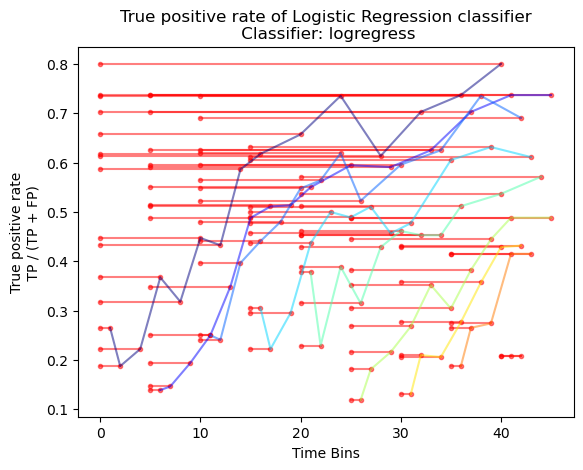

In [13]:
# iterate over rows
cm = plt.get_cmap("jet")
for ri, row in df.iterrows():
    plt.plot([row["init_bin"], row["init_bin"]+row["lag"]], 
             [row["tp_test"],row["tp_test"]], 
             marker=".", color="red", alpha=0.5)
for i, init_bin in enumerate(range(0, 41, 5)):
    clr = cm(i/len(range(0, 41, 5)))
    row_idx = df["init_bin"]==init_bin
    plt.plot(df.loc[row_idx, "init_bin"]+df.loc[row_idx, "lag"], 
             df.loc[row_idx, "tp_test"], 
             color=clr, alpha=0.5,)    
plt.xlabel("Time Bins")
plt.ylabel("True positive rate\n TP / (TP + FP) ")
plt.title(f"True positive rate of Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_test_bar_curv_{model_str}_lags.png"))
plt.savefig(join(figdir, f"tp_test_bar_curv_{model_str}_lags.pdf"))
plt.show()

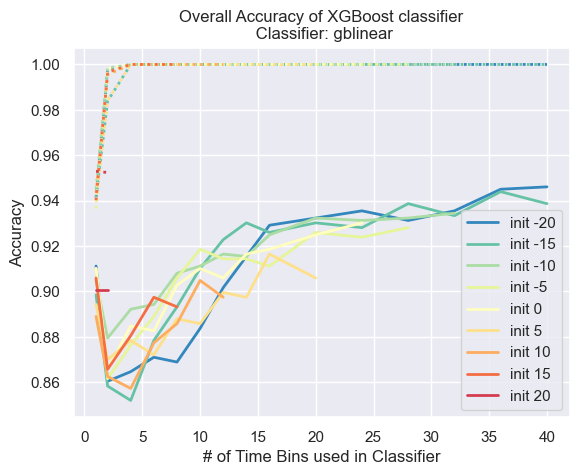

In [ ]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="acc_train",
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="acc_test",
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("Accuracy")
plt.xlabel("# of Time Bins used in Classifier")
plt.title(f"Overall Accuracy of Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"acc_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"acc_{model_str}_init_bin.pdf"))
plt.show()

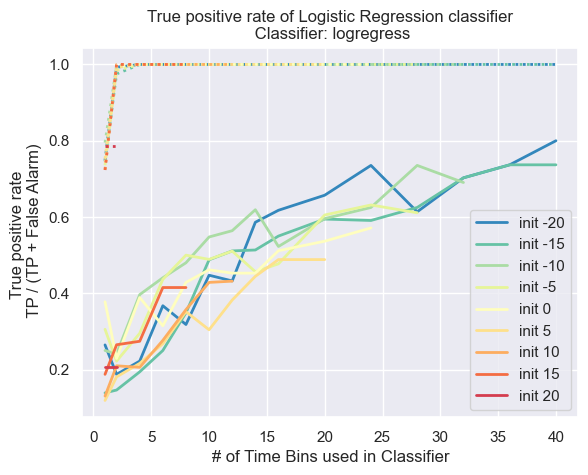

In [14]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="tp_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="tp_test", 
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("True positive rate \n TP / (TP + False Alarm)")
plt.xlabel("# of Time Bins used in Classifier")
plt.title(f"True positive rate of Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_rate_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"tp_rate_{model_str}_init_bin.pdf"))
plt.show()

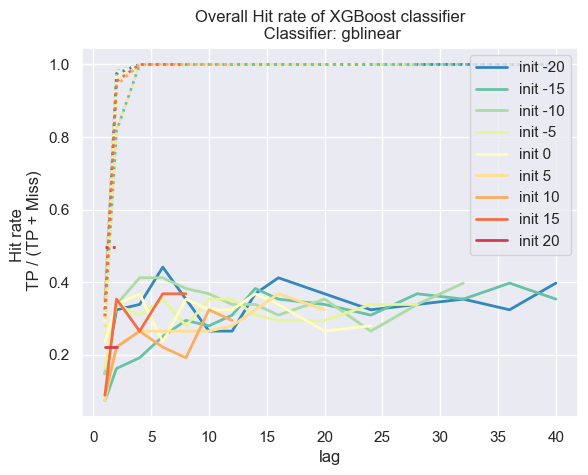

In [ ]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=9)
current_palette = sns.color_palette()
for i, init_bin in enumerate(range(0, 41, 5)):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="hit_rate_train",
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["init_bin"] == init_bin], x="lag", y="hit_rate_test",
                 color=clr, label=f"init {init_bin-20}", linewidth=2, )
plt.ylabel("Hit rate \n TP / (TP + Miss)")
plt.title(f"Overall Hit rate of Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"hit_rate_{model_str}_init_bin.png"))
plt.savefig(join(figdir, f"hit_rate_{model_str}_init_bin.pdf"))
plt.show()

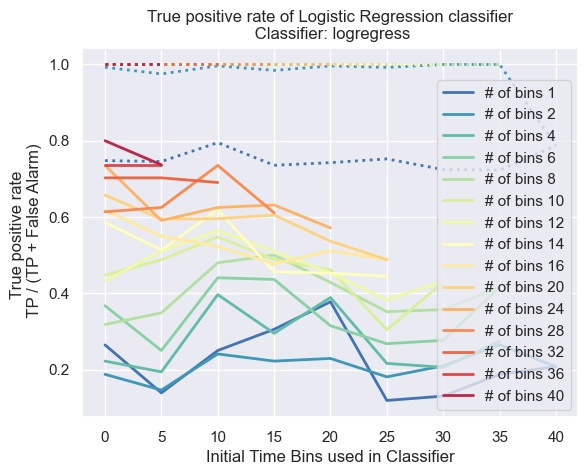

In [15]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=len(df.lag.unique()))
current_palette = sns.color_palette()
for i, lag in enumerate(df.lag.unique()):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="tp_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="tp_test", 
                 color=clr, label=f"# of bins {lag}", linewidth=2, )
plt.ylabel("True positive rate \n TP / (TP + False Alarm)")
plt.xlabel("Initial Time Bins used in Classifier")
plt.title(f"True positive rate of Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"tp_rate_{model_str}_lag.png"))
plt.savefig(join(figdir, f"tp_rate_{model_str}_lag.pdf"))
plt.show()

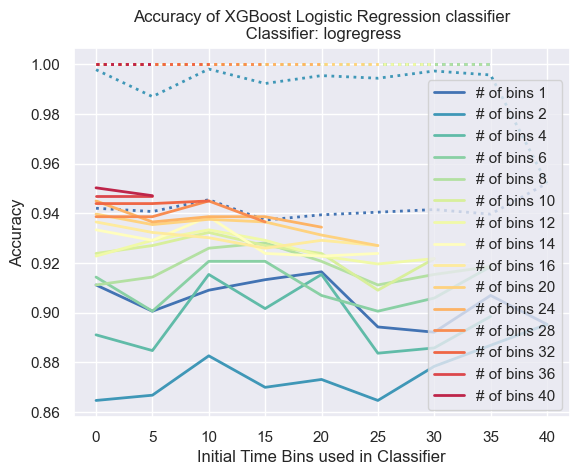

In [16]:
sns.set_theme()
sns.set_palette("Spectral_r", n_colors=len(df.lag.unique()))
current_palette = sns.color_palette()
for i, lag in enumerate(df.lag.unique()):
    # get current color
    clr = current_palette[i]
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="acc_train", 
                 color=clr, linestyle=":", linewidth=2, )
    sns.lineplot(data=df[df["lag"] == lag], x="init_bin", y="acc_test", 
                 color=clr, label=f"# of bins {lag}", linewidth=2, )
plt.ylabel("Accuracy")
plt.xlabel("Initial Time Bins used in Classifier")
plt.title(f"Accuracy of XGBoost Logistic Regression classifier\n Classifier: {model_str}")
plt.savefig(join(figdir, f"acc_{model_str}_lag.png"))
plt.savefig(join(figdir, f"acc_{model_str}_lag.pdf"))
plt.show()